In [169]:
import subprocess
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from tqdm.auto import tqdm
import lightgbm as lgb
import gc
from itertools import combinations
import math
import sys,os
import logging
from glob import glob
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline
import matplotlib.pyplot as plt
from datetime import datetime,timedelta
import functools
import itertools

sys.path.append("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta")
sys.path.append("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/models")
import core
import exp_demo
import sampleUtils
from exp_demo import DropCols,CategoryCols,load_data,clean,format_type,featCols
from exp_demo import metric,metric2,metric_by_field,indicators,indicators_info,fulfillment_info
from line_time_model_train_length_fix import goods_feature_name
import line_time_model_train_length_fix
# DropCols
print(",".join(featCols))

pd.set_option('display.max_columns', 70)
pd.set_option('display.max_rows', 70)

DATA_PARSED_BY_LINE="/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}"
DATA_FP="/nfs/project/zhoutongzt/ETA/data/{}"

age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count,gender_50,store_type_25,store_type_50,store_type_75,store_type_mean,has_store_id_-1,has_store_id_0,has_store_id_1,has_store_id_2,has_store_id_3,has_store_id_mean,isnot_td_new_count,is_td_new_count,is_td_new_count_mean,is_month_new_leader,isnot_month_new_leader,is_month_new_leader_mean,delivery_id_1,delivery_id_2,delivery_id_3,delivery_id_mean,num_sum_25,num_sum_50,num_sum_75,num_sum_mean,sku_cnt_25,sku_cnt_50,sku_cnt_75,sku_cnt_mean,user_cnt_25,user_cnt_50,user_cnt_75,user_cnt_mean,gmv_25,gmv_50,gmv_75,gmv_mean,leader_uid_cnt,line_num_sum,line_gmv,line_sku_cnt,first_eta,first_length,leader_eta,leader_length,first_order_num,middle_order_num,last_order_num,delivery_flag,fruits_count,vgtble_count,fresh_count,category_id_count,refrigeration_type_0,refrigeration_type_1,refrigeration_type_2,refrigeration_type_3,avg_lng,avg_lat,min_lng,min_lat,max_lng,max_lat


In [170]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1"
import tensorflow as tf
import tensorflow.feature_column as fc
# opts = tf.GPUOptions(per_process_gpu_memory_fraction=0.333)
# conf = tf.ConfigProto(gpu_options=opts)
conf = tf.ConfigProto()
conf.gpu_options.allow_growth=True
conf.allow_soft_placement = True
est_conf = tf.estimator.RunConfig(session_config=conf)


# Pre

In [171]:
def KL(P_values,Q_values,bins=100):
    epsilon = 0.00001
    
    binsCnt,binsHold = np.histogram(P_values,bins=bins)
    P=binsCnt/binsCnt.sum()
    binsCnt,binsHold = np.histogram(Q_values,bins=bins)
    Q=binsCnt/binsCnt.sum()
    
    P = P+epsilon
    Q = Q+epsilon
    
    divergence = np.sum(P*np.log(P/Q))
    return divergence


def vis(df,col,bins=10,figsize=(12,9)):
    import pandas as pd
    import matplotlib.pyplot as plt
    from datetime import datetime,timedelta
    
    infos=[]
    b=str(df['date'].min())
    maxDate = str(df['date'].max())
    while True:
        e = datetime.strftime(datetime.strptime(b,'%Y%m%d')+timedelta(7),"%Y%m%d")
        data = {"data":df.query("date >= %s and date < %s" % (b,e))[col].to_numpy(), 
                "title":"%s~%s" % (b,e)}
        infos.append(data)
        if e >= maxDate:
            break
        b=e

    minV = min(df[col].min()*0.8,0,df[col].min()*1.2)  # 考虑负数情况
    maxV = max(df[col].max()*0.8,0,df[col].max()*1.2)  # 考虑负数情况

    i,j = math.ceil(len(infos)/4),4
    fig,axes=plt.subplots(i,j,figsize=figsize)
    fig.set_tight_layout(True)
    axesf = axes.flatten()
    for idx,(t,info) in enumerate(sorted([(info['title'], info) for info in infos], key = lambda x:x[0])):
        _ = axesf[idx].hist(info['data'],bins=bins,density=True,alpha=0.6)
        _ = axesf[idx].set_title(t)
        _ = axesf[idx].grid(axis='y', color='grey', linestyle='--', lw=0.5, alpha=0.7)
        _ = axesf[idx].grid(axis='x', color='grey', linestyle='--', lw=0.5, alpha=0.7)
        _ = axesf[idx].set_xlim(minV,maxV)


    plt.show()






# *Manul Metric

In [ ]:
baseDir = "/nfs/project/zhoutongzt/ETA/"
class FP():
    class chengdu:
        test = baseDir+"chengdu_single/eta_test_chengdu_single_city_20210203_20210205.csv"
        train = baseDir+"chengdu_single/eta_train_chengdu_single_city_20201205_20210202.csv"
        model = baseDir+"chengdu_single/lgb_fea_66_chengdu_single_city.model"
    
    class jinan:
        train = baseDir + "jinan_single/eta_train_jinan_single_city_20201205_20210202.csv"
        test = baseDir + "jinan_single/eta_test_jinan_single_city_20210203_20210205.csv"
        model = baseDir + "jinan_single/lgb_fea_66_jinan_single_city.model"
        valid = baseDir + "jinan_20210301_20210303.csv"
        
        multi_train = baseDir + "jinan_multi/eta_train_jinan_multi_city_20201205_20210202.csv"
        multi_test = baseDir + "jinan_multi/eta_test_jinan_multi_city_20210203_20210205.csv"
        multi_model = baseDir + "jinan_multi/lgb_fea_66_jinan_multi_city.model"

    class cur:
        test = "/nfs/project/zhoutongzt/ETA/test_20210131_20210205.csv"
        train = "/nfs/project/zhoutongzt/ETA/train_20210102_20210130.csv"
        model = "/nfs/project/zhoutongzt/ETA/lgb_fea_66_jinan_single_city_2.model"
        

## 指标

### 交集部分评估

In [3]:
df1 = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/12_jinan","20210311","20210314")
df2 = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/12_jinan_ataByTraj","20210311","20210314")

arr1=df1.apply(lambda r: "%d_%d" % (r['driver_phone_ori'],r['date']),axis=1).to_numpy()
arr2=df2.apply(lambda r: "%d_%d" % (r['driver_phone_ori'],r['date']),axis=1).to_numpy()

tels = np.intersect1d(arr1,arr2)
tels.shape

testDF1 = df1[df1.apply(lambda r:"%d_%d" % (r['driver_phone_ori'],r['date']) in tels, axis=1)]
testDF2 = df2[df2.apply(lambda r:"%d_%d" % (r['driver_phone_ori'],r['date']) in tels, axis=1)]

testDF1.shape
testDF2.shape

M1 = lgb.Booster(model_file="/nfs/project/zhoutongzt/ETA/12_jinan_model_byDefualt.lgb")
M2 = lgb.Booster(model_file="/nfs/project/zhoutongzt/ETA/12_jinan_model_byTraj.lgb")

testDF1['pred1'] = M1.predict(testDF1[feats])
testDF1['pred2'] = M2.predict(testDF1[feats])

testDF2['pred1'] = M1.predict(testDF2[feats])
testDF2['pred2'] = M2.predict(testDF2[feats])

res = metric(testDF1['label'].to_numpy(), testDF1['pred1'].to_numpy())
print("[Train]: count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))
print("%s,%.4f,%.4f,%.4f,%.4f" % res)

res = metric(testDF1['label'].to_numpy(), testDF1['pred2'].to_numpy())
print("[Train]: count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))
print("%s,%.4f,%.4f,%.4f,%.4f" % res)

res = metric(testDF2['label'].to_numpy(), testDF2['pred1'].to_numpy())
print("[Train]: count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))
print("%s,%.4f,%.4f,%.4f,%.4f" % res)

res = metric(testDF2['label'].to_numpy(), testDF2['pred2'].to_numpy())
print("[Train]: count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))
print("%s,%.4f,%.4f,%.4f,%.4f" % res)


# testDF1['label'].hist(bins=30,density=True,alpha=0.8,label='ata_byDefualt')
# testDF2['label'].hist(bins=30,density=True,alpha=0.5,label='ata_byTraj')
_ = testDF1['pred1'].hist(bins=30,density=True,alpha=0.8,label='eta_MbyDefualt')
testDF1[['driver_phone_ori','date','pred1']].merge(testDF2[['driver_phone_ori','date','pred1']],on=['driver_phone_ori','date'],how='inner')


[2021-03-26 16:10:09,854-WARNING]: path not exist,dt:20210312 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/12_jinan/20210312
[2021-03-26 16:10:09,905-WARNING]: path not exist,dt:20210311 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/12_jinan_ataByTraj/20210311
[2021-03-26 16:10:09,907-WARNING]: path not exist,dt:20210312 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/12_jinan_ataByTraj/20210312


(271,)

(271, 72)

(271, 72)

NameError: name 'feats' is not defined

In [38]:
# cityA, cityB = "10-19-000001", "19_kunming"
# cityA, cityB = "10-17-000004", "17_chengdu"
# cityA, cityB = "50-22-000001", "22_shijiazhuang_1"
# cityA, cityB = "20-109-000001", "109_jingzhou"
cityA, cityB = "40-15-000001","15_hefei"
cityA, cityB = "40-9-000001","9_zhengzhou"
# cityA, cityB = "20-6-000002","6_wuhan_2"
# cityA, cityB = "20-6-000001","6_wuhan_1"
# cityA, cityB = "30-133-000001", "133_huizhou"
# cityA, cityB = "30-36-000001", "36_foshan"
model_fp = "/nfs/project/zhoutongzt/ETA/{}_model.lgb"
data_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}"
MA_fp = model_fp.format(cityA)
MB_fp = model_fp.format(cityB)
dataA_fp = data_dir.format(cityA)
dataB_fp = data_dir.format(cityB)

MA = lgb.Booster(model_file=MA_fp)
MB = lgb.Booster(model_file=MB_fp)
testDFA = load_data(dataA_fp, "20210311", "20210317")
testDFB = load_data(dataB_fp, "20210311", "20210317")
feats = [i for i in testDFA.columns if i not in DropCols]
print(feats)

testDFA['pred_MA'] = MA.predict(testDFA[feats])
testDFA['pred_MB'] = MB.predict(testDFA[feats])
testDFB['pred_MA'] = MA.predict(testDFB[feats])
testDFB['pred_MB'] = MB.predict(testDFB[feats])

mergeDF = testDFA.merge(testDFB, on=['date', 'last_uid', 'label','last_action_time','tocar_time'], how='inner')
mergeDF.shape

res = list()
# 交集
res.append({**dict((k, v) for k, v in metric2(mergeDF, pred_col='pred_MA_x').items()),
            **{"modelBy": "团", "dataBy": "Intersection团"}})
res.append({**dict((k, v) for k, v in metric2(mergeDF, pred_col='pred_MB_x').items()),
            **{"modelBy": "线", "dataBy": "Intersection团"}})
res.append({**dict((k, v) for k, v in metric2(mergeDF, pred_col='pred_MA_y').items()),
            **{"modelBy": "团", "dataBy": "Intersection线"}})
res.append({**dict((k, v) for k, v in metric2(mergeDF, pred_col='pred_MB_y').items()),
            **{"modelBy": "线", "dataBy": "Intersection线"}})

# 在对方数据
res.append({**dict((k, v) for k, v in metric2(testDFB, pred_col='pred_MA').items()),
            **{"modelBy": "团", "dataBy": "OriD线"}})
res.append({**dict((k, v) for k, v in metric2(testDFB, pred_col='pred_MB').items()),
            **{"modelBy": "线", "dataBy": "OriD线"}})
res.append({**dict((k, v) for k, v in metric2(testDFA, pred_col='pred_MA').items()),
            **{"modelBy": "团", "dataBy": "OriD团"}})
res.append({**dict((k, v) for k, v in metric2(testDFA, pred_col='pred_MB').items()),
            **{"modelBy": "线", "dataBy": "OriD团"}})





print(">>> %s %s" % (cityA,cityB))
targetCols=['count','mae','mape','badcase','ful_f1','notful_f1','modelBy','dataBy']
pd.DataFrame(res).round(3)[targetCols]

print(">>> feature not same")
ff = []
for f in ['leader_uid_cnt']+feats[:]:
    diffCnt=mergeDF[mergeDF[f+"_x"] != mergeDF[f+"_y"]][[f+"_x",f+"_y",'driver_phone_ori_x','driver_phone_ori_y','date','last_uid']].shape[0]
    if diffCnt > 0 :
        ff.append("%s=%s" % (f,diffCnt))
print(",".join(ff))



mergeDF['badcase_x'] = mergeDF.apply(lambda row: abs(row['label'] - row['pred_MA_x']) >= 3600 and abs(row['label'] - row['pred_MA_x'])*1.0/row['label'] >= 0.3, axis=1)
mergeDF['badcase_y'] = mergeDF.apply(lambda row: abs(row['label'] - row['pred_MB_y']) >= 3600 and abs(row['label'] - row['pred_MB_y'])*1.0/row['label'] >= 0.3, axis=1)
print(">>> badcase %s merely" % cityA)
mergeDF.query("badcase_x == True and badcase_y != True").shape
print(">>> badcase %s merely" % cityB)
mergeDF.query("badcase_x != True and badcase_y == True").shape
save_res=False
if save_res:
    print(">>> saving pred res")
    mergeDF[['date','driver_phone_ori_x','last_uid','badcase_x','badcase_y','label','pred_MA_x','pred_MB_y']].to_csv("/nfs/project/zhoutongzt/ETA/data_pred_badcase/%s" % cityA, index=False)


LightGBMError: Could not open /nfs/project/zhoutongzt/ETA/40-9-000001_model.lgb

### A的model预测B的数据

data_fp: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001
model_fp: /nfs/project/zhoutongzt/ETA/merge_lineMode_6_model.lgb
['age_30', 'age_40', 'age_50', 'age_25_q', 'age_50_q', 'age_75_q', 'age_mean', 'female_count', 'male_count', 'gender_50', 'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean', 'has_store_id_-1', 'has_store_id_0', 'has_store_id_1', 'has_store_id_2', 'has_store_id_3', 'has_store_id_mean', 'isnot_td_new_count', 'is_td_new_count', 'is_td_new_count_mean', 'is_month_new_leader', 'isnot_month_new_leader', 'is_month_new_leader_mean', 'delivery_id_1', 'delivery_id_2', 'delivery_id_3', 'delivery_id_mean', 'num_sum_25', 'num_sum_50', 'num_sum_75', 'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50', 'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25', 'user_cnt_50', 'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75', 'gmv_mean', 'leader_uid_cnt', 'line_num_sum', 'line_gmv', 'line_sku_cnt', 'first_eta', 'first_length', 'leader_eta', 'leader_length', 'first

('train', (118149, 76))

('test', (16940, 76))

('valid', (13921, 76))

[Train]:
count: 118149.0000 me: 2372.8254 mae: 3568.3294 mape: 0.4278 badcase: 0.4216 overrate: 0.7752 underrate: 0.2248
[Test]:
count: 16940.0000 me: 3187.1409 mae: 3770.4915 mape: 0.4502 badcase: 0.4783 overrate: 0.8806 underrate: 0.1194
[Valid]:
count: 13921.0000 me: 3494.8797 mae: 4114.7286 mape: 0.4884 badcase: 0.5355 overrate: 0.9019 underrate: 0.0981
--- csv log:
118149.0000,2372.8254,3568.3294,0.4278,0.4216,0.7752,0.2248,11338.6605,4119.7400,13711.4859,10426.6240,0.8022,0.9735,0.6821,0.5547,0.3973,0.9187
16940.0000,3187.1409,3770.4915,0.4502,0.4783,0.8806,0.1194,11262.0325,4107.3900,14449.1734,11191.3829,0.8221,0.9804,0.7079,0.3325,0.2071,0.8434
13921.0000,3494.8797,4114.7286,0.4884,0.5355,0.9019,0.0981,10994.2685,4162.0000,14489.1482,10973.5900,0.7544,0.9831,0.6120,0.3957,0.2517,0.9256


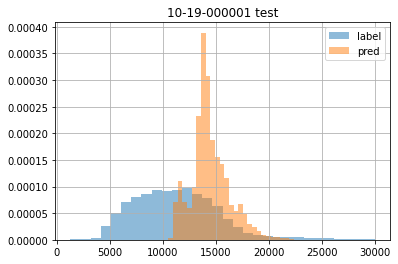

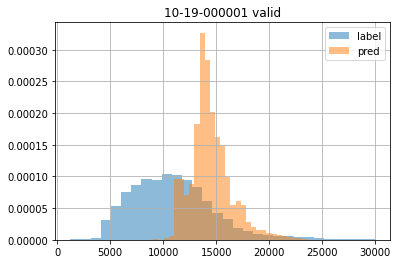

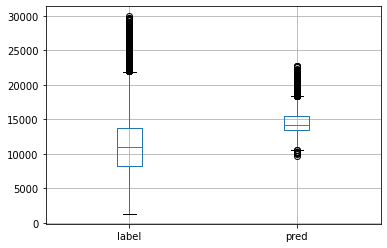

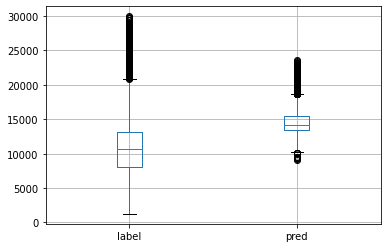

>>> cityA: merge_lineMode_6 cityB: 10-19-000001


In [36]:
cityA,cityB="merge_lineMode_6","19_kunming"
cityA,cityB="merge_lineMode_6","10-19-000001"
cityA,cityB="15_hefei","40-15-000001"
# cityA,cityB="19_kunming","10-19-000001"
# cityA,cityB="10-19-000001","19_kunming"
# cityA,cityB = cityB,cityA

model_fp = "/nfs/project/zhoutongzt/ETA/{}_model.lgb".format(cityA)
data_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}".format(cityB)

print("data_fp: "+data_dir)
print("model_fp: "+model_fp)

M = lgb.Booster(model_file=model_fp)
trainDF = load_data(data_dir,"20210101","20210305")
testDF = load_data(data_dir,"20210306","20210312")
validDF = load_data(data_dir,"20210313","20210317")

feats = [i for i in trainDF.columns if i not in DropCols]
print(feats)
trainDF['pred'] = M.predict(trainDF[feats])
testDF['pred'] = M.predict(testDF[feats])
validDF['pred'] = M.predict(validDF[feats])
"train",trainDF.shape
"test",testDF.shape
"valid",validDF.shape

# res_train = metric(trainDF['label'].to_numpy(), trainDF['pred'].to_numpy())
# res_test = metric(testDF['label'].to_numpy(), testDF['pred'].to_numpy())
# res_valid = metric(validDF['label'].to_numpy(), validDF['pred'].to_numpy())
res_train = metric2(trainDF)
res_test = metric2(testDF)
res_valid = metric2(validDF)
print("[Train]:\n" + " ".join(["%s: %.4f" % (i, res_train[i]) for i in indicators]))
print("[Test]:\n" + " ".join(["%s: %.4f" % (i, res_test[i]) for i in indicators]))
print("[Valid]:\n" + " ".join(["%s: %.4f" % (i, res_valid[i]) for i in indicators]))

print("--- csv log:\n" +
          "%s\n" % ",".join(["%.4f" % res_train[i] for i in indicators + indicators_info + fulfillment_info]) + \
          "%s\n" % ",".join(["%.4f" % res_test[i] for i in indicators + indicators_info + fulfillment_info]) + \
          "%s" % ",".join(["%.4f" % res_valid[i] for i in indicators + indicators_info + fulfillment_info])
          )

# print(">>> metric_by_field trainDF:")
# metric_by_field(trainDF)
# print(">>> metric_by_field testDF:")
# metric_by_field(testDF)
# print(">>> metric_by_field validDF:")
# metric_by_field(validDF)



_ = testDF['label'].hist(bins=30,density=True,alpha=0.5,label='label')
_ = testDF['pred'].hist(bins=30,density=True,alpha=0.5,label='pred')
_ = plt.title("%s test" % cityB)
_ = plt.legend()
plt.show()


_ = validDF['label'].hist(bins=30,density=True,alpha=0.5,label='label')
_ = validDF['pred'].hist(bins=30,density=True,alpha=0.5,label='pred')
_ = plt.title("%s valid" % cityB)
_ = plt.legend()
plt.show()

_ = testDF[['label','pred']].plot.box(figsize=(6,4),grid=True)
_ = validDF[['label','pred']].plot.box(figsize=(6,4),grid=True)
plt.show()
print(">>> cityA: %s cityB: %s" % (cityA,cityB))




### 普通评估

[2021-04-16 19:13:46,920-WARNING]: path not exist,dt:20210101 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210101
[2021-04-16 19:13:46,922-WARNING]: path not exist,dt:20210102 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210102
[2021-04-16 19:13:46,923-WARNING]: path not exist,dt:20210103 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210103
[2021-04-16 19:13:46,924-WARNING]: path not exist,dt:20210104 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210104
[2021-04-16 19:13:46,926-WARNING]: path not exist,dt:20210105 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210105
[2021-04-16 19:13:46,927-WARNING]: path not exist,dt:20210106 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210106
[2021-04-16 19:13:46,928-WARNING]: path not exist,dt:20210107 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210107
[2021-04-16 19:13:46,929-WARNING]:

data_fp: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001
model_fp: /nfs/project/zhoutongzt/ETA/10-19-000001_model.lgb
58 ['age_30', 'age_40', 'age_50', 'age_25_q', 'age_50_q', 'age_75_q', 'age_mean', 'female_count', 'male_count', 'gender_50', 'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean', 'has_store_id_-1', 'has_store_id_0', 'has_store_id_1', 'has_store_id_2', 'has_store_id_3', 'has_store_id_mean', 'isnot_td_new_count', 'is_td_new_count', 'is_td_new_count_mean', 'is_month_new_leader', 'isnot_month_new_leader', 'is_month_new_leader_mean', 'delivery_id_1', 'delivery_id_2', 'delivery_id_3', 'delivery_id_mean', 'num_sum_25', 'num_sum_50', 'num_sum_75', 'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50', 'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25', 'user_cnt_50', 'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75', 'gmv_mean', 'leader_uid_cnt', 'line_num_sum', 'line_gmv', 'line_sku_cnt', 'first_eta', 'first_length', 'leader_eta', 'leader_length', 'first_

('train', (8988, 77))

('test', (16940, 77))

('valid', (13921, 77))

[Train]:
count: 8988.0000 me: 1316.3986 mae: 2536.5229 mape: 0.2709 badcase: 0.1923 overrate: 0.7589 underrate: 0.2411
[Test]:
count: 16940.0000 me: 999.6677 mae: 2268.5588 mape: 0.2348 badcase: 0.1506 overrate: 0.6966 underrate: 0.3034
[Valid]:
count: 13921.0000 me: 1181.3405 mae: 2394.9355 mape: 0.2505 badcase: 0.1695 overrate: 0.7346 underrate: 0.2654
--- csv log:
8988.0000,1316.3986,2536.5229,0.2709,0.1923,0.7589,0.2411,10785.6237,10037.0000,12102.0223,12300.2785,0.8218,0.9776,0.7089,0.5760,0.4177,0.9279
16940.0000,999.6677,2268.5588,0.2348,0.1506,0.6966,0.3034,11262.0325,11010.0000,12261.7001,12503.5390,0.8956,0.9737,0.8292,0.4132,0.2848,0.7523
13921.0000,1181.3405,2394.9355,0.2505,0.1695,0.7346,0.2654,10994.2685,10607.0000,12175.6090,12456.7553,0.8791,0.9717,0.8026,0.5158,0.3733,0.8343
>>> metric_by_field trainDF:
1,3114.0000,1175.0310,1736.7829,0.2717,0.0594,0.7874,0.2126,7382.1824,7124.5000,8557.2134,8521.7624,0.9881,0.9931,0.9831,0.2772,0.2121,0.4000
2,2849.0000,1756.2414,2509

,0,1,2
0,age_30,8,507.881001
1,age_40,6,716.961494
2,age_50,14,967.218792


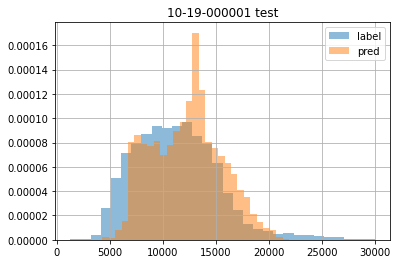

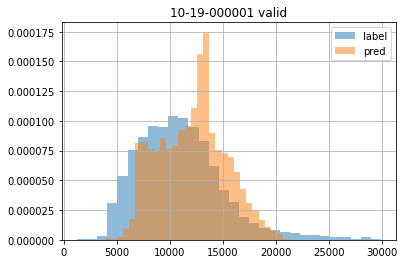

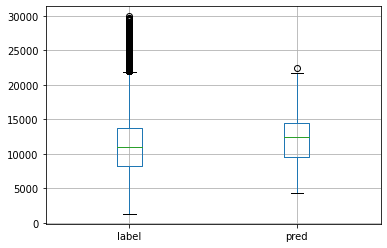

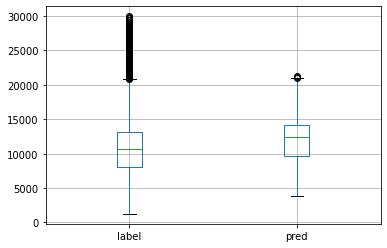

>>> city: 10-19-000001


In [22]:
# city="10-17-000004"
# city="50-22-000001"
city="10-19-000001"
# city="19_kunming"
# city="merge_lineMode_6"
fp="/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}".format(city)
lgb_fp="/nfs/project/zhoutongzt/ETA/{}_model.lgb".format(city)

print("data_fp: "+fp)
print("model_fp: "+lgb_fp)

trainDF = load_data(fp,"20210101","20210305")
testDF = load_data(fp,"20210306","20210312")
validDF = load_data(fp,"20210313","20210317")
feats = [i for i in trainDF.columns if i not in DropCols]
print(len(feats),feats)

M = lgb.Booster(model_file=lgb_fp)

trainDF['pred'] = M.predict(trainDF[feats])
testDF['pred'] = M.predict(testDF[feats])
validDF['pred'] = M.predict(validDF[feats])

"train",trainDF.shape
"test",testDF.shape
"valid",validDF.shape

# res_train = metric(trainDF['label'].to_numpy(), trainDF['pred'].to_numpy())
# res_test = metric(testDF['label'].to_numpy(), testDF['pred'].to_numpy())
# res_valid = metric(validDF['label'].to_numpy(), validDF['pred'].to_numpy())
res_train = metric2(trainDF)
res_test = metric2(testDF)
res_valid = metric2(validDF)
print("[Train]:\n" + " ".join(["%s: %.4f" % (i, res_train[i]) for i in indicators]))
print("[Test]:\n" + " ".join(["%s: %.4f" % (i, res_test[i]) for i in indicators]))
print("[Valid]:\n" + " ".join(["%s: %.4f" % (i, res_valid[i]) for i in indicators]))

print("--- csv log:")
print(",".join(["%.4f" % res_train[i] for i in indicators+indicators_info+fulfillment_info]))
print(",".join(["%.4f" % res_test[i] for i in indicators+indicators_info+fulfillment_info]))
print( ",".join(["%.4f" % res_valid[i] for i in indicators+indicators_info+fulfillment_info]))


print(">>> metric_by_field trainDF:")
metric_by_field(trainDF)
print(">>> metric_by_field testDF:")
metric_by_field(testDF)
print(">>> metric_by_field validDF:")
metric_by_field(validDF)

print(">>> feature importance")
pd.DataFrame(list(zip(M.feature_name(),M.feature_importance('split'),M.feature_importance('gain')))).head(3)



_ = testDF['label'].hist(bins=30,density=True,alpha=0.5,label='label')
_ = testDF['pred'].hist(bins=30,density=True,alpha=0.5,label='pred')
_ = plt.title("%s test" % city)
_ = plt.legend()
plt.show()


_ = validDF['label'].hist(bins=30,density=True,alpha=0.5,label='label')
_ = validDF['pred'].hist(bins=30,density=True,alpha=0.5,label='pred')
_ = plt.title("%s valid" % city)
_ = plt.legend()
plt.show()

_ = testDF[['label','pred']].plot.box(figsize=(6,4),grid=True)
_ = validDF[['label','pred']].plot.box(figsize=(6,4),grid=True)
plt.show()
print(">>> city: %s" % city)



In [24]:
M
trainDF.head(3)

,driver_phone,age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count,gender_50,store_type_25,store_type_50,store_type_75,store_type_mean,has_store_id_-1,has_store_id_0,has_store_id_1,has_store_id_2,has_store_id_3,has_store_id_mean,isnot_td_new_count,is_td_new_count,is_td_new_count_mean,is_month_new_leader,isnot_month_new_leader,is_month_new_leader_mean,delivery_id_1,delivery_id_2,delivery_id_3,delivery_id_mean,num_sum_25,num_sum_50,num_sum_75,num_sum_mean,...,gmv_25,gmv_50,gmv_75,gmv_mean,leader_uid_cnt,line_num_sum,line_gmv,line_sku_cnt,fruits_count,vgtble_count,fresh_count,category_id_count,refrigeration_type_0,refrigeration_type_1,refrigeration_type_2,refrigeration_type_3,first_eta,first_length,leader_eta,leader_length,label,date,all_due_time,assemble_eta,first_order_num,middle_order_num,last_order_num,delivery_flag,driver_phone_ori,last_uid,last_action_time,tocar_time,uid_str,pred,leader_uid_cnt_bin5
0,639247268303757560,1,0,3,39.50,47.5,52.5,44.500000,3,1,0.0,5.5,28.5,50.00,27.000000,0,0,3,1,0,1.0,4,0,0.0,4,0,0.0,4,0,0,1.0,2.5,7.0,16.00,11.500000,...,7.4425,27.16,76.3275,56.610000,4,46,226.44,39.0,15,22,44,26,2,17,0,10,2980.0,38656.0,652.0,3946.0,4669,20210301,1689.0,2160,1,3,11,2,15912594363_3,639247268393376538,2021-03-01 08:33:49,2021-03-01 07:16:00,"639247268542428364,639247268303757560,63924726...",8118.340243,1
1,639247268303757560,2,0,3,29.00,44.0,51.0,41.400000,4,1,0.0,3.0,7.0,50.00,22.200000,0,0,3,2,0,1.0,5,0,0.0,5,0,0.0,5,0,0,1.0,3.0,11.0,26.00,14.400000,...,9.5300,44.79,95.1800,64.324000,5,72,321.62,48.0,19,23,49,32,2,20,0,16,2980.0,38656.0,652.0,3946.0,4731,20210301,1751.0,2700,1,3,26,2,15912594363_4,639247267689248112,2021-03-01 08:34:51,2021-03-01 07:16:00,"639247268542428364,639247268303757560,63924726...",8426.703431,1
2,639247268303757560,2,0,4,32.75,46.5,50.5,42.666667,4,2,0.0,1.5,5.0,39.25,18.666667,0,0,3,3,0,1.5,6,0,0.0,6,0,0.0,6,0,0,1.0,3.5,8.0,22.25,12.833333,...,13.6350,35.37,82.5825,57.928333,6,77,347.57,50.0,19,23,49,33,3,20,0,18,2980.0,38656.0,872.0,5557.0,5392,20210301,2412.0,3240,1,11,5,3,15912594363_5,639247267355121776,2021-03-01 08:45:52,2021-03-01 07:16:00,"639247268542428364,639247268303757560,63924726...",9095.923505,1


In [32]:
leaf_idx = M.predict(trainDF[:10][feats], pred_leaf=True)
leaf_idx.shape
np.hstack([leaf_idx, trainDF[:10][["driver_phone"]].to_numpy()]).shape

(10, 100)

(10, 101)

### 普通评估 网格仓

In [49]:
city="line_feature_with_eta_grid"
fp="/nfs/project/zhoutongzt/ETA/data_parsed_by_grid/{}".format(city)
lgb_fp="/nfs/project/zhoutongzt/ETA/{}_model.lgb".format(city)

print("data_fp: "+fp)
print("model_fp: "+lgb_fp)

trainDF = load_data(fp,"20210315","20210325")
testDF = load_data(fp,"20210326","20210404")
validDF = load_data(fp,"20210405","20210410")
feats = [i for i in trainDF.columns if i not in DropCols]
print(len(feats),feats)

# ata_bin_info = exp_demo.get_ata_bin(trainDF, ata_bin=3600, by_field="warehouse_code_str")
# trainDF = exp_demo.apply_ata_bin(trainDF, ata_bin_info=ata_bin_info, by_field="warehouse_code_str")
# testDF = exp_demo.apply_ata_bin(testDF, ata_bin_info=ata_bin_info, by_field="warehouse_code_str")
# validDF = exp_demo.apply_ata_bin(validDF, ata_bin_info=ata_bin_info, by_field="warehouse_code_str")

func2 = functools.partial(exp_demo.format_type, "grid")
func_tmp = lambda df: df[df['warehouse_code_str'].apply(lambda x: "," not in x)]
trainDF = func_tmp(func2(trainDF))
testDF = func_tmp(func2(testDF))
validDF = func_tmp(func2(validDF))

"train",trainDF.shape
"test",testDF.shape
"valid",validDF.shape

########  

M = lgb.Booster(model_file=lgb_fp)

trainDF['pred'] = M.predict(trainDF[feats])
testDF['pred'] = M.predict(testDF[feats])
validDF['pred'] = M.predict(validDF[feats])


# res_train = metric2(trainDF)
# res_test = metric2(testDF)
# res_valid = metric2(validDF)
# print("[Train]:\n" + " ".join(["%s: %.4f" % (i, res_train[i]) for i in indicators]))
# print("[Test]:\n" + " ".join(["%s: %.4f" % (i, res_test[i]) for i in indicators]))
# print("[Valid]:\n" + " ".join(["%s: %.4f" % (i, res_valid[i]) for i in indicators]))

# print("--- csv log:")
# print(",".join(["%.4f" % res_train[i] for i in indicators+indicators_info+fulfillment_info]))
# print(",".join(["%.4f" % res_test[i] for i in indicators+indicators_info+fulfillment_info]))
# print( ",".join(["%.4f" % res_valid[i] for i in indicators+indicators_info+fulfillment_info]))


# print(">>> metric_by_field trainDF:")
# metric_by_field(trainDF)
# print(">>> metric_by_field testDF:")
# metric_by_field(testDF)
# print(">>> metric_by_field validDF:")
# metric_by_field(validDF)

data_fp: /nfs/project/zhoutongzt/ETA/data_parsed_by_grid/line_feature_with_eta_grid
model_fp: /nfs/project/zhoutongzt/ETA/line_feature_with_eta_grid_model.lgb


[2021-04-19 14:43:37,190-INFO]: >>> format types by grid


60 ['age_30', 'age_40', 'age_50', 'age_25_q', 'age_50_q', 'age_75_q', 'age_mean', 'female_count', 'male_count', 'gender_50', 'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean', 'has_store_id_-1', 'has_store_id_0', 'has_store_id_1', 'has_store_id_2', 'has_store_id_3', 'has_store_id_mean', 'isnot_td_new_count', 'is_td_new_count', 'is_td_new_count_mean', 'is_month_new_leader', 'isnot_month_new_leader', 'is_month_new_leader_mean', 'delivery_id_1', 'delivery_id_2', 'delivery_id_3', 'delivery_id_mean', 'num_sum_25', 'num_sum_50', 'num_sum_75', 'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50', 'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25', 'user_cnt_50', 'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75', 'gmv_mean', 'leader_uid_cnt', 'line_num_sum', 'line_gmv', 'line_sku_cnt', 'first_eta', 'first_length', 'leader_eta', 'leader_length', 'first_order_num', 'middle_order_num', 'last_order_num', 'delivery_flag', 'warehouse_code_str', 'city_id']


[2021-04-19 14:43:37,440-INFO]: >>> format types by grid
[2021-04-19 14:43:37,819-INFO]: >>> format types by grid


('train', (148473, 78))

('test', (175702, 78))

('valid', (117491, 78))

ValueError: train and valid dataset categorical_feature do not match.

In [57]:
pd.DataFrame(testDF.groupby("warehouse_code_str").apply(lambda dfg: (dfg['warehouse_code_str'].iloc[0], (dfg['first_eta']-dfg['label']).mean())).to_list())



,0,1
0,10-117-000001,-4198.271255
1,10-117-000002,-4108.995025
2,10-117-000003,-6384.207547
3,10-117-000004,-5265.261905
4,10-117-000005,-7369.037267
...,...,...
2478,90-81-000009,-9579.800000
2479,90-81-000010,-12695.204380
2480,90-81-000012,-6157.768000
2481,90-81-000013,-10864.839286


In [38]:
import sampleUtils
_trainDF, oe_enc_dict = sampleUtils.list_oe_enc(trainDF, pad_size=70)
_testDF, _ = sampleUtils.list_oe_enc(testDF, oe_enc_dict=oe_enc_dict, pad_size=70)
_validDF, _ = sampleUtils.list_oe_enc(validDF, oe_enc_dict=oe_enc_dict, pad_size=70)



In [55]:
_testDF
pd.concat([_testDF.reset_index(drop=True),uid_df.reset_index(drop=True)], axis=1)

,driver_phone,age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count,gender_50,store_type_25,store_type_50,store_type_75,store_type_mean,has_store_id_-1,has_store_id_0,has_store_id_1,has_store_id_2,has_store_id_3,has_store_id_mean,isnot_td_new_count,is_td_new_count,is_td_new_count_mean,is_month_new_leader,isnot_month_new_leader,is_month_new_leader_mean,delivery_id_1,delivery_id_2,delivery_id_3,delivery_id_mean,num_sum_25,num_sum_50,num_sum_75,num_sum_mean,...,gmv_75,gmv_mean,leader_uid_cnt,line_num_sum,line_gmv,line_sku_cnt,fruits_count,vgtble_count,fresh_count,category_id_count,refrigeration_type_0,refrigeration_type_1,refrigeration_type_2,refrigeration_type_3,first_eta,first_length,leader_eta,leader_length,label,date,all_due_time,assemble_eta,first_order_num,middle_order_num,last_order_num,delivery_flag,driver_phone_ori,last_uid,last_action_time,tocar_time,uid_str,warehouse_code_str,city_id,uid_str_list,uid_idx_list
0,639247267785931632,1,9,14,38.00,41.0,46.75,41.708333,16,8,0.0,1.0,5.5,50.00,24.000000,0,0,6,18,0,2.0,24,0,0.0,23,1,0.0,24,0,0,1.0,4.00,10.5,23.75,15.333333,...,116.5775,99.995000,24,368.0,2399.88,189.0,43.0,91.0,166.0,12,181.0,23.0,26.0,3.0,1068.0,7363.0,3674.0,20359.0,4888,20210306,3820.0,12960,27,6,2,1,15955990004_20,639247267786298772,2021-03-06 11:06:57,2021-03-06 09:45:29,"639247267785207744,639247267793502067,63924726...",40-15-000006,15,"[639247267785207744, 639247267793502067, 63924...","[354381, 420618, 354375, 504579, 354384, 58043..."
1,639247268167472057,2,14,18,37.25,41.0,47.75,42.411765,26,8,0.0,1.0,1.0,39.00,14.470588,0,0,10,24,0,2.0,34,0,0.0,25,9,0.0,34,0,0,1.0,5.00,10.5,21.75,14.764706,...,103.3350,79.197647,34,502.0,2692.72,306.0,58.0,122.0,208.0,11,292.0,36.0,47.0,1.0,1018.0,12628.0,2837.0,17223.0,9341,20210306,8323.0,18360,58,26,23,1,13941519110_5,639247268162396261,2021-03-06 15:13:37,2021-03-06 12:37:56,"639247268337494896,639247268615427563,63924726...",70-163-000002,163,"[639247268337494896, 639247268615427563, 63924...","[788580, 1369988, 299708, 1601218, 97412, 9740..."
2,639247268480430835,2,3,7,34.75,42.5,47.25,40.750000,10,2,0.0,1.0,1.5,50.00,17.666667,0,0,2,10,0,2.0,12,0,0.0,10,2,0.0,12,0,0,1.0,1.75,2.5,9.25,4.833333,...,24.0400,24.395833,12,58.0,292.75,23.0,3.0,9.0,14.0,7,25.0,1.0,0.0,0.0,1229.0,12879.0,2830.0,26679.0,15749,20210306,14520.0,6480,10,7,10,4,15862722778_13,639247267830833940,2021-03-06 14:26:12,2021-03-06 10:03:43,"639247268541015203,639247268192472677,63924726...",60-92-000005,92,"[639247268541015203, 639247268192472677, 63924...","[1408887, 918946, 1543987, 1619681, 54720, 154..."
3,639247267888005186,4,12,14,33.75,40.0,46.00,40.233333,17,13,0.0,1.0,1.0,6.75,12.900000,0,0,7,23,0,2.0,30,0,0.0,28,2,0.0,30,0,0,1.0,2.00,4.0,7.75,5.733333,...,38.0350,27.664000,30,172.0,829.92,113.0,26.0,42.0,76.0,13,109.0,8.0,11.0,0.0,528.0,5570.0,4252.0,27785.0,7322,20210306,6794.0,16200,16,1,7,4,18098523456_3,639247268106018537,2021-03-06 10:12:56,2021-03-06 08:10:54,"639247268728842434,639247267889279655,63924726...",40-182-000001,182,"[639247268728842434, 639247267889279655, 63924...","[1587384, 448283, 535287, 472865, 1069008, 231..."
4,639247268701761165,6,9,7,28.25,34.5,45.25,37.181818,15,7,0.0,2.0,2.0,50.00,17.272727,0,0,22,0,0,1.0,22,0,0.0,15,7,0.0,22,0,0,1.0,3.25,6.5,9.75,9.181818,...,39.2625,44.530455,22,202.0,979.67,124.0,19.0,30.0,100.0,11,131.0,19.0,8.0,5.0,1404.0,12268.0,15648.0,133341.0,2417,20210306,1013.0,11880,9,23,6,3,15778556889_12,639247268758169267,2021-03-06 09:33:12,2021-03-06 08:52:55,"639247268701761165,639247268689292545,63924726...",30-162-000003,162,"[639247268701761165, 639247268689292545, 63924...","[-1, 1504167, 745672, 745668, 745657, -1, 8322..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

,driver_phone,age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count,gender_50,store_type_25,store_type_50,store_type_75,store_type_mean,has_store_id_-1,has_store_id_0,has_store_id_1,has_store_id_2,has_store_id_3,has_store_id_mean,isnot_td_new_count,is_td_new_count,is_td_new_count_mean,is_month_new_leader,isnot_month_new_leader,is_month_new_leader_mean,delivery_id_1,delivery_id_2,delivery_id_3,delivery_id_mean,num_sum_25,num_sum_50,num_sum_75,num_sum_mean,...,uid_35,uid_36,uid_37,uid_38,uid_39,uid_40,uid_41,uid_42,uid_43,uid_44,uid_45,uid_46,uid_47,uid_48,uid_49,uid_50,uid_51,uid_52,uid_53,uid_54,uid_55,uid_56,uid_57,uid_58,uid_59,uid_60,uid_61,uid_62,uid_63,uid_64,uid_65,uid_66,uid_67,uid_68,uid_69
0,639247267785931632,1,9,14,38.00,41.0,46.75,41.708333,16,8,0.0,1.0,5.5,50.00,24.000000,0,0,6,18,0,2.0,24,0,0.0,23,1,0.0,24,0,0,1.0,4.00,10.5,23.75,15.333333,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
1,639247268167472057,2,14,18,37.25,41.0,47.75,42.411765,26,8,0.0,1.0,1.0,39.00,14.470588,0,0,10,24,0,2.0,34,0,0.0,25,9,0.0,34,0,0,1.0,5.00,10.5,21.75,14.764706,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
2,639247268480430835,2,3,7,34.75,42.5,47.25,40.750000,10,2,0.0,1.0,1.5,50.00,17.666667,0,0,2,10,0,2.0,12,0,0.0,10,2,0.0,12,0,0,1.0,1.75,2.5,9.25,4.833333,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3,639247267888005186,4,12,14,33.75,40.0,46.00,40.233333,17,13,0.0,1.0,1.0,6.75,12.900000,0,0,7,23,0,2.0,30,0,0.0,28,2,0.0,30,0,0,1.0,2.00,4.0,7.75,5.733333,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,639247268701761165,6,9,7,28.25,34.5,45.25,37.181818,15,7,0.0,2.0,2.0,50.00,17.272727,0,0,22,0,0,1.0,22,0,0.0,15,7,0.0,22,0,0,1.0,3.25,6.5,9.75,9.181818,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121383,639247267842747906,0,10,18,39.00,42.5,46.25,42.785714,24,4,0.0,1.0,1.0,50.00,15.535714,0,0,9,19,0,2.0,28,0,0.0,28,0,0.0,28,0,0,1.0,4.75,9.5,18.25,12.571429,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
121384,639247268205611452,2,7,11,37.50,41.0,44.25,41.700000,16,4,0.0,1.0,2.0,7.00,10.000000,0,0,12,8,0,1.0,20,0,0.0,20,0,0.0,20,0,0,1.0,6.75,10.5,16.00,12.600000,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
121385,639247268332604761,4,11,10,32.00,38.0,44.00,39.120000,21,4,0.0,2.0,2.0,50.00,19.400000,0,0,16,9,0,1.0,25,0,0.0,23,2,0.0,25,0,0,1.0,5.00,11.0,23.00,13.680000,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
121386,639247267594390861,5,22,19,35.25,39.5,47.75,40.760870,27,19,0.0,1.0,28.0,50.00,26.108696,0,0,20,26,0,2.0,46,0,0.0,36,10,0.0,46,0,0,1.0,3.00,8.0,18.75,13.695652,...,1506776,1506775,860299,-1,1506789,1408275,-1,924567,1506785,-1,891839,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [48]:
_testDF.shape
uid_df = pd.DataFrame(_testDF['uid_idx_list'].to_list(), columns=["uid_%s" % i for i in range(70)])
uid_df.shape



(121388, 80)

(121388, 70)

In [54]:
newDF = pd.concat([_testDF, uid_df], axis=1, ignore_index=True)
newDF.shape

(121390, 150)

### 按天评估是否稳定

In [54]:
print(">>> at train:")
info=[]
for dt, dfg in trainDF.groupby("date"):
    res = metric(dfg['label'],dfg['pred'])
    res.update({"dt":str(dt)})
    info.append(dict((k,v) for k,v in res.items() if k in ['dt','mape','ata_avg','ata_mid','eta_avg','eta_mid','overrate']))

df = pd.DataFrame(info)
df[[i for i in df.columns if i!='dt']].std()


print(">>> at test:")
info=[]
for dt, dfg in testDF.groupby("date"):
    res = metric(dfg['label'],dfg['pred'])
    res.update({"dt":dt})
    info.append(dict((k,v) for k,v in res.items() if k in ['dt','mape','ata_avg','ata_mid','eta_avg','eta_mid','overrate']))
df=pd.DataFrame(info)
df
df[[i for i in df.columns if i!='dt']].std()


print(">>> at valid:")
info=[]
for dt, dfg in validDF.groupby("date"):
    res = metric(dfg['label'],dfg['pred'])
    res.update({"dt":dt})
    info.append(dict((k,v) for k,v in res.items() if k in ['dt','mape','ata_avg','ata_mid','eta_avg','eta_mid','overrate']))
df=pd.DataFrame(info)
df
df[[i for i in df.columns if i!='dt']].std()



>>> at train:


mape           0.048233
overrate       0.166704
ata_avg     2187.137838
ata_mid      364.404909
eta_avg     1485.449515
eta_mid      297.196457
dtype: float64

>>> at test:


,mape,overrate,ata_avg,ata_mid,eta_avg,eta_mid,dt
0,0.395458,0.864801,9754.246205,4009.350,11968.695279,5802.505897,20210306
1,0.300349,0.785714,10555.911565,3963.130,11960.061437,5796.185387,20210307
2,0.174862,0.733391,11059.547886,4046.065,11902.907927,5904.449382,20210308
3,0.156023,0.486067,12146.627787,4672.085,11904.670182,6189.254770,20210309
4,0.179673,0.644610,11441.804696,4714.350,11955.881697,6042.260354,20210310
5,0.177636,0.533840,11959.361597,4214.610,12033.708024,6026.584698,20210311
6,0.223835,0.598798,11481.913026,3887.150,12048.335513,5876.767704,20210312


mape          0.087702
overrate      0.137343
ata_avg     830.206738
ata_mid     341.572812
eta_avg      56.611112
eta_mid     144.020117
dtype: float64

>>> at valid:


,mape,overrate,ata_avg,ata_mid,eta_avg,eta_mid,dt
0,0.232761,0.747874,10752.932348,3978.44,11953.328247,5933.992721,20210313
1,0.281506,0.848797,10353.472700,4191.09,12091.233554,5967.670667,20210314
2,0.169307,0.683927,11187.128371,4370.90,11948.274052,6040.502771,20210315
3,0.186770,0.618048,11285.505709,4322.58,11847.839862,5555.825113,20210316
4,0.320666,0.674952,11312.273402,4105.46,11969.199471,6090.249541,20210317


mape          0.063437
overrate      0.087965
ata_avg     415.548612
ata_mid     159.796645
eta_avg      86.673639
eta_mid     211.287603
dtype: float64

other debugs

In [ ]:
df = trainDF.query("leader_uid_cnt==1")
df['diff'] = df['first_eta'] - df['label']
df[['driver_phone_ori','date','first_length','first_eta','label','leader_uid_cnt','diff']].head(5)

np.percentile(df['diff'],0.5)
df['diff'].mean()
df['diff'].max()

res = metric(df['label'],df['first_eta'])
print("[Train]:\n" + " ".join(["%s: %.4f" % (i, res[i]) for i in indicators]))

# _ = df['label'].hist(bins=30,density=True,alpha=0.5,label='label',figsize=(12,6))
_ = df['first_eta'].hist(bins=30,density=True,alpha=0.5,label='first_eta')
_ = plt.legend()
plt.show()
_ = df['first_length'].hist(bins=30,density=True,alpha=0.5,label='first_length')
_ = plt.legend()
plt.show()


df[['first_eta','label']].corr()
trainDF[['first_eta','label']].corr()




### manual persist

'10-19-000001'

data_dir: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001
pred_dir: /nfs/project/zhoutongzt/ETA/data_pred_tmp/10-19-000001
lgb_fp: /nfs/project/zhoutongzt/ETA/10-19-000001_model.lgb


,count,me,mae,mape,badcase,underrate,overrate,ata_avg,ata_mid,eta_avg,eta_mid
0,30861.0,1063.944916,2320.113754,0.241143,0.158193,0.288973,0.711027,11141.247594,4128.7,12205.19251,5843.912773


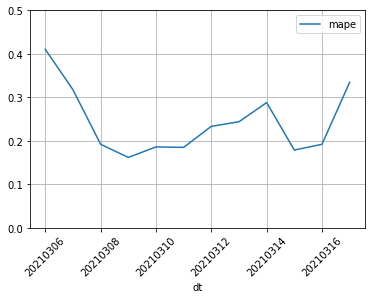

'10-17-000004'

data_dir: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004
pred_dir: /nfs/project/zhoutongzt/ETA/data_pred_tmp/10-17-000004
lgb_fp: /nfs/project/zhoutongzt/ETA/10-17-000004_model.lgb


,count,me,mae,mape,badcase,underrate,overrate,ata_avg,ata_mid,eta_avg,eta_mid
0,50332.0,-624.024558,2086.907332,0.18118,0.111361,0.604586,0.395414,12457.686978,4119.655,11833.66242,7458.889611


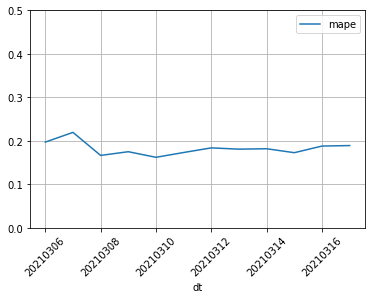

'50-22-000001'

data_dir: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/50-22-000001
pred_dir: /nfs/project/zhoutongzt/ETA/data_pred_tmp/50-22-000001
lgb_fp: /nfs/project/zhoutongzt/ETA/50-22-000001_model.lgb


,count,me,mae,mape,badcase,underrate,overrate,ata_avg,ata_mid,eta_avg,eta_mid
0,46410.0,-252.545017,2538.877685,0.219414,0.151842,0.521913,0.478087,13269.998341,3614.045,13017.453324,5248.472666


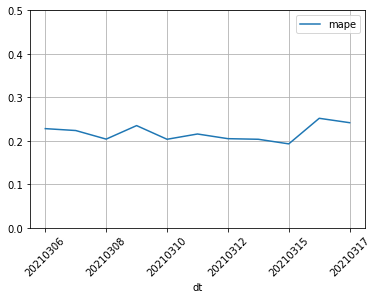

'20-109-000001'

data_dir: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/20-109-000001
pred_dir: /nfs/project/zhoutongzt/ETA/data_pred_tmp/20-109-000001
lgb_fp: /nfs/project/zhoutongzt/ETA/20-109-000001_model.lgb


,count,me,mae,mape,badcase,underrate,overrate,ata_avg,ata_mid,eta_avg,eta_mid
0,14858.0,826.0692,2059.098976,0.256767,0.138713,0.382286,0.617714,11875.845403,2143.565,12701.914603,4736.385841


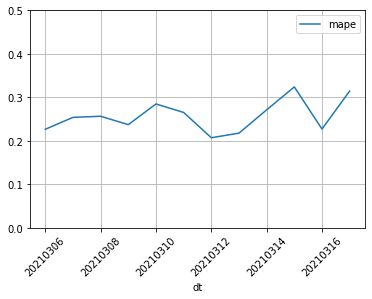

'30-133-000001'

data_dir: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/30-133-000001
pred_dir: /nfs/project/zhoutongzt/ETA/data_pred_tmp/30-133-000001
lgb_fp: /nfs/project/zhoutongzt/ETA/30-133-000001_model.lgb


,count,me,mae,mape,badcase,underrate,overrate,ata_avg,ata_mid,eta_avg,eta_mid
0,28013.0,476.501598,2241.267347,0.206093,0.128369,0.392032,0.607968,12880.095991,3885.24,13356.597589,6762.077936


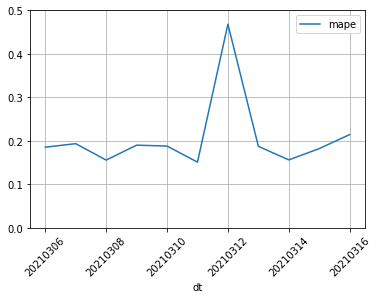

'30-36-000001'

data_dir: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/30-36-000001
pred_dir: /nfs/project/zhoutongzt/ETA/data_pred_tmp/30-36-000001
lgb_fp: /nfs/project/zhoutongzt/ETA/30-36-000001_model.lgb


,count,me,mae,mape,badcase,underrate,overrate,ata_avg,ata_mid,eta_avg,eta_mid
0,30899.0,-59.054584,2643.922948,0.268121,0.194893,0.46953,0.53047,11831.863976,2788.41,11772.809392,6452.956582


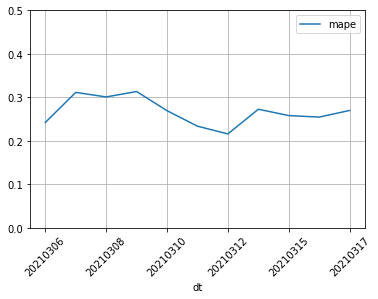

In [210]:
save_csv = False
metric_from_csv = True
metric_detail = False
fromDt="20210306"
toDt="20210317"
citys = ['10-19-000001','10-17-000004','50-22-000001','20-109-000001','30-133-000001','30-36-000001']
for c in citys:
    c
    data_dir="/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}".format(c)
    pred_dir="/nfs/project/zhoutongzt/ETA/data_pred_tmp/{}".format(c)
    lgb_fp="/nfs/project/zhoutongzt/ETA/{}_model.lgb".format(c)

    print("data_dir: "+data_dir)
    print("pred_dir: "+pred_dir)
    print("lgb_fp: "+lgb_fp)
    if save_csv:
        inpDF=load_data(data_dir,fromDt,toDt)
        feats = [i for i in inpDF.columns if i not in DropCols]
        M = lgb.Booster(model_file=lgb_fp)
        inpDF['pred']=M.predict(inpDF[feats])

        for dt, dfg in tqdm(inpDF.groupby("date")):
            os.makedirs(pred_dir, exist_ok=True)
            dfg['driver_phone']=dfg['driver_phone_ori']
            del dfg['driver_phone_ori']
            _dfg = dfg[['driver_phone','last_uid'] + [i for i in dfg.columns if i not in ['driver_phone','last_uid']]]
            _dfg.to_csv(os.path.join(pred_dir,str(dt)), index=False)

    if metric_from_csv:
        dates = [i for i in get_dates(fromDt,toDt)]
        fps = [os.path.join(pred_dir,str(dt)) for dt in dates]
        readDF = pd.concat([pd.read_csv(i) for i in fps if os.path.exists(i)])
        pd.DataFrame([metric(readDF['label'],readDF['pred'])])

        info=[]
        for dt, dfg in readDF.groupby("date"):
            res = metric(dfg['label'],dfg['pred'])
            res.update({"dt":str(dt)})
            info.append(dict((k,v) for k,v in res.items() if k in ['dt','mape','ata_avg','ata_mid','eta_avg','eta_mid','overrate']))
        df=pd.DataFrame(info)
        if metric_detail:
            df.head(20)
        _ = df.plot(x='dt',y='mape', rot=45, ylim=(0,0.5), grid=True)
        plt.show()
        
        
        


(271, 72)

('train', (3515, 72))

('test', (271, 72))

('valid', (2620, 72))

[Train]: count: 3515.0000 me: 2246.5879 mae: 4421.3113 mape: 0.4054 badcase: 0.3550 overrate: 0.6586 underrate: 0.3414
[Test]: count: 271.0000 me: 2440.9979 mae: 3615.3181 mape: 0.2974 badcase: 0.3100 overrate: 0.7565 underrate: 0.2435
[Valid]: count: 2620.0000 me: 2976.7610 mae: 4945.2841 mape: 0.4788 badcase: 0.4011 overrate: 0.6771 underrate: 0.3229

--- csv log:
3515.0000,2246.5879,4421.3113,0.4054,0.3550,0.6586,0.3414
271.0000,2440.9979,3615.3181,0.2974,0.3100,0.7565,0.2435
2620.0000,2976.7610,4945.2841,0.4788,0.4011,0.6771,0.3229


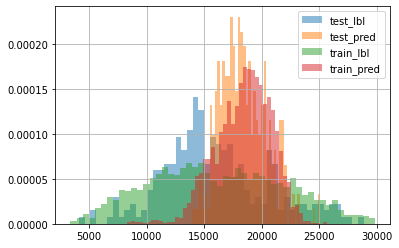

TypeError: not enough arguments for format string

In [89]:
fp="/nfs/project/zhoutongzt/ETA/merged_data/12_jinan_20201205_20210317.csv"
# fp="/nfs/project/zhoutongzt/ETA/merged_data/12_jinan_ataByTraj_20201205_20210317.csv"
model_fp = "/nfs/project/zhoutongzt/ETA/12_jinan_model_byTraj.lgb"
# model_fp = "/nfs/project/zhoutongzt/ETA/12_jinan_model_byDefualt.lgb"
# model_fp = "/nfs/project/zhoutongzt/ETA/model.lgb"
inpDF = pd.read_csv(fp)
feats = [i for i in inpDF.columns if i not in DropCols]
trainDF = inpDF.query("date >= %s and date <= %s" % ("20210220","20210310")).copy()
testDF = inpDF.query("date >= %s and date <= %s" % ("20210311", "20210314")).copy()
testDF = testDF[testDF.apply(lambda r:"%d_%d" % (r['driver_phone_ori'],r['date']) in tels, axis=1)]
testDF.shape
validDF = inpDF.query("date >= %s and date <= %s" % ("20210227", "20210313")).copy()
M = lgb.Booster(model_file=model_fp)

"train",trainDF.shape
"test",testDF.shape
"valid",validDF.shape

trainDF['pred'] = M.predict(trainDF[feats])
testDF['pred'] = M.predict(testDF[feats])
validDF['pred'] = M.predict(validDF[feats])

log_res = []
res = metric(trainDF['label'].to_numpy(), trainDF['pred'].to_numpy())
print("[Train]: "+" ".join(["%s: %.4f" % (i, res[i]) for i in indicators]))
log_res.append(res)
res = metric(testDF['label'].to_numpy(), testDF['pred'].to_numpy())
print("[Test]: "+" ".join(["%s: %.4f" % (i, res[i]) for i in indicators]))
log_res.append(res)
res = metric(validDF['label'].to_numpy(), validDF['pred'].to_numpy())
print("[Valid]: "+" ".join(["%s: %.4f" % (i, res[i]) for i in indicators]))
log_res.append(res)
print("\n--- csv log:")
print("\n".join([",".join(["%.4f" % res[i] for i in indicators]) for res in log_res]))

_ = testDF['label'].hist(bins=50,alpha=0.5,density=True,label='test_lbl')
_ = testDF['pred'].hist(bins=50,alpha=0.5,density=True,label='test_pred')
_ = trainDF['label'].hist(bins=50,alpha=0.5,density=True,label='train_lbl')
_ = trainDF['pred'].hist(bins=50,alpha=0.5,density=True,label='train_pred')
_ = plt.legend()
plt.show()

binsCnt,binsHold = np.histogram(testDF['label'])
binsHold[-1] = binsHold[-1] + 0.01
for b,e in zip(binsHold[:-1],binsHold[1:]):
    curDF = testDF.query("%s <= label and label < %s" % (b,e)).copy()
    curDF['pred'] = M.predict(curDF[feats])
    res = metric(curDF['label'], curDF['pred'])
    print("[Test [%d, %d) ]: " % (b,e) +"count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))

## 高估低估部分检查

,driver_phone,age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count,...,date,all_due_time,assemble_eta,first_order_num,middle_order_num,last_order_num,delivery_flag,diff,pred,lbl_pred_diff
147,6.392473e+17,0.0,10.0,12.0,34.25,43.0,47.75,43.318182,13.0,9.0,...,20210204.0,27304.0,11880.0,3.0,11.0,20.0,2.0,17570.0,10674.050852,18775.949148
39,6.392473e+17,3.0,8.0,12.0,33.50,41.0,51.00,42.695652,19.0,4.0,...,20210203.0,28515.0,12420.0,21.0,32.0,7.0,3.0,16533.0,12279.900439,16673.099561
74,6.392473e+17,0.0,10.0,15.0,37.00,43.0,45.00,43.720000,15.0,10.0,...,20210202.0,25531.0,13500.0,8.0,45.0,1.0,3.0,14632.0,11832.393835,16299.606165
187,6.392473e+17,3.0,15.0,4.0,35.25,38.0,39.75,38.090909,15.0,7.0,...,20210131.0,26899.0,11340.0,33.0,8.0,13.0,4.0,17455.0,13209.107884,15585.892116


count     1313.000000
mean      4392.079805
std       3301.181218
min          3.802431
25%       1679.494328
50%       3777.824933
75%       6316.196618
max      18775.949148
Name: lbl_pred_diff, dtype: float64

Text(0.5, 1.0, 'Test')

Text(0.5, 1.0, 'Train')

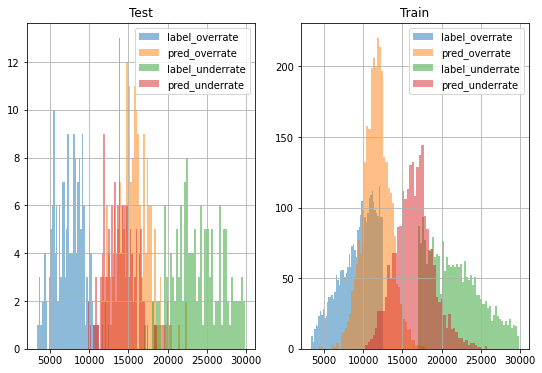

Text(0.5, 1.0, 'Test')

Text(0.5, 1.0, 'Train')

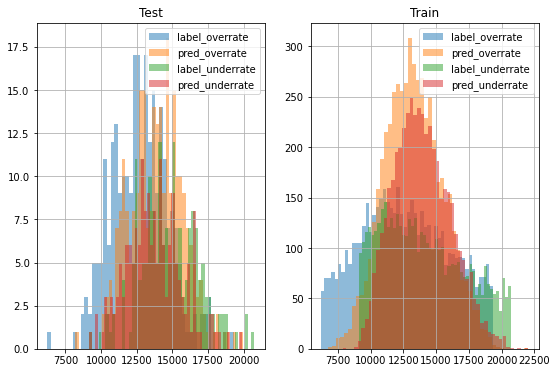

In [426]:
test_data.sort_values('lbl_pred_diff',ascending=False).head(4)
test_data['lbl_pred_diff'].describe()

fig,axesf=plt.subplots(1,2,figsize=(9,6))
test_overrate = test_data.query("lbl_pred_diff >= 6279 and pred > label")
train_like_overrate = train_data.query("label >= %s and label <= %s" % (test_overrate['label'].min(), test_overrate['label'].max()))
test_underrate = test_data.query("lbl_pred_diff >= 6279 and pred < label")
train_like_underrate = train_data.query("label >= %s and label <= %s" % (test_underrate['label'].min(), test_underrate['label'].max()))

_ = axesf[0].set_title("Test")
_ = test_overrate['label'].hist(bins=50,alpha=0.5,label='label_overrate',ax=axesf[0])
_ = test_overrate['pred'].hist(bins=50,alpha=0.5,label='pred_overrate',ax=axesf[0])
_ = test_underrate['label'].hist(bins=50,alpha=0.5,label='label_underrate',ax=axesf[0])
_ = test_underrate['pred'].hist(bins=50,alpha=0.5,label='pred_underrate',ax=axesf[0])

_ = axesf[1].set_title("Train")
_ = train_like_overrate['label'].hist(bins=50,alpha=0.5,label='label_overrate',ax=axesf[1])
_ = train_like_overrate['pred'].hist(bins=50,alpha=0.5,label='pred_overrate',ax=axesf[1])
_ = train_like_underrate['label'].hist(bins=50,alpha=0.5,label='label_underrate',ax=axesf[1])
_ = train_like_underrate['pred'].hist(bins=50,alpha=0.5,label='pred_underrate',ax=axesf[1])


_ = [i.legend() for i in axesf]
plt.show()



fig,axesf=plt.subplots(1,2,figsize=(9,6))
test_overrate = test_data.query("lbl_pred_diff <= 2400 and pred > label")
train_like_overrate = train_data.query("label >= %s and label <= %s" % (test_overrate['label'].min(), test_overrate['label'].max()))
test_underrate = test_data.query("lbl_pred_diff <= 2400 and pred < label")
train_like_underrate = train_data.query("label >= %s and label <= %s" % (test_underrate['label'].min(), test_underrate['label'].max()))

_ = axesf[0].set_title("Test")
_ = test_overrate['label'].hist(bins=50,alpha=0.5,label='label_overrate',ax=axesf[0])
_ = test_overrate['pred'].hist(bins=50,alpha=0.5,label='pred_overrate',ax=axesf[0])
_ = test_underrate['label'].hist(bins=50,alpha=0.5,label='label_underrate',ax=axesf[0])
_ = test_underrate['pred'].hist(bins=50,alpha=0.5,label='pred_underrate',ax=axesf[0])

_ = axesf[1].set_title("Train")
_ = train_like_overrate['label'].hist(bins=50,alpha=0.5,label='label_overrate',ax=axesf[1])
_ = train_like_overrate['pred'].hist(bins=50,alpha=0.5,label='pred_overrate',ax=axesf[1])
_ = train_like_underrate['label'].hist(bins=50,alpha=0.5,label='label_underrate',ax=axesf[1])
_ = train_like_underrate['pred'].hist(bins=50,alpha=0.5,label='pred_underrate',ax=axesf[1])


_ = [i.legend() for i in axesf]
plt.show()


## 不同团长个数、销量个数下的metric

一般意义上/直觉上 来说，随着团长个数增加、商品数增加，我们的配送时间应该变长，而实际样本中表现不是这样的，这里有很多人工干预的影响；

考虑我们学习、拟合的应该是「一般意义的ATA」所以希望直接去掉这些人工干预的影响；

举例来说，希望38个团的时候，ATA不要比33个团还要低（这个降低背后的逻辑是自洽的：人工选择了更熟悉区域的司机）

In [ ]:

city="10-19-000001"
# city="10-17-000004"
# city="17_chengdu"
# city="19_kunming"
# city="merge_lineMode_6"
fp="/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}".format(city)
lgb_fp="/nfs/project/zhoutongzt/ETA/{}_model.lgb".format(city)

print("data_fp: "+fp)
print("model_fp: "+lgb_fp)

trainDF = load_data(fp,"20210101","20210305")
testDF = load_data(fp,"20210306","20210312")
validDF = load_data(fp,"20210313","20210317")
feats = [i for i in trainDF.columns if i not in DropCols]
print(len(feats),feats)

M = lgb.Booster(model_file=lgb_fp)

trainDF['pred'] = M.predict(trainDF[feats])
testDF['pred'] = M.predict(testDF[feats])
validDF['pred'] = M.predict(validDF[feats])

res_train = metric2(trainDF)
res_test = metric2(testDF)
res_valid = metric2(validDF)
print(">>> metrics:")
print("[Train]:\n" + " ".join(["%s: %.4f" % (i, res_train[i]) for i in indicators+fulfillment_info]))
print("[Test]:\n" + " ".join(["%s: %.4f" % (i, res_test[i]) for i in indicators+fulfillment_info]))
print("[Valid]:\n" + " ".join(["%s: %.4f" % (i, res_valid[i]) for i in indicators+fulfillment_info]))



def ata_vis(df,suptitle="ABC"):
    # df = testDF
    fig,axes=plt.subplots(1,2,figsize=(12,6))
    fig.suptitle(suptitle)
    fig.set_tight_layout(True)

    lineNum_binCol='line_num_sum_bin50'
    df[lineNum_binCol] = df['line_num_sum'].apply(lambda x: int(x/50))
    totalCnt=df.shape[0]

    def _to_plot(df,t_col,ax):
        aggInfos = df.groupby(t_col).apply(lambda dfg: {t_col:dfg[t_col].iloc[0],
                                                         "cnt":dfg.shape[0]/totalCnt,
                                                         "label":dfg['label'].mean(),
                                                         "label_50q":np.percentile(dfg['label'], 50),
                                                         "pred":dfg['pred'].mean(),
                                                         "pred_50q":np.percentile(dfg['pred'], 50),
                                                         "line_num_sum":int(dfg['line_num_sum'].mean()*20),
                                                         "first_length":int(dfg['first_length'].mean()),})
        aggDF = pd.DataFrame(aggInfos.to_list())

        ax_twinx = ax.twinx()
        ax_twinx.set_ylim(0,1)
        _ = aggDF.plot(x=t_col,y=['cnt'],figsize=(12,6),kind='bar',ax=ax_twinx,alpha=0.5,rot=90)

        _ = aggDF.plot(x=t_col,y='label',figsize=(12,6),kind='scatter',ax=ax,rot=90)
        _ = aggDF.plot(x=t_col,y=['label'],figsize=(12,6),kind='line',ax=ax,rot=90,grid=True)

        _ = aggDF.plot(x=t_col,y='pred',figsize=(12,6),kind='scatter',ax=ax,rot=90)
        _ = aggDF.plot(x=t_col,y=['pred'],style="--",figsize=(12,6),kind='line',ax=ax,rot=90,grid=True)
        
        _ = aggDF.plot(x=t_col,y='line_num_sum',figsize=(12,6),kind='scatter',ax=ax,rot=90)
        _ = aggDF.plot(x=t_col,y=['line_num_sum'],style="--",figsize=(12,6),kind='line',ax=ax,rot=90,grid=True)
        return None
        
    _to_plot(df=df,t_col=lineNum_binCol,ax=axes[0])
    _to_plot(df=df,t_col="leader_uid_cnt",ax=axes[1])
    plt.show()
    return None
    
print(">>> vis")
ata_vis(trainDF,"trainDF")
ata_vis(testDF,"testDF")
ata_vis(validDF,"validDF")

## 模型相关信息

In [32]:
wh2_test=pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/testDF.pkl.tmp")
wh2_train=pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/trainDF.pkl.tmp")
wh2_test.shape
wh2_train.shape

wh2_test['pred']=M.predict(wh2_test[M.feature_name()])
exp_demo.metric2(wh2_test)

(699, 89)

(8362, 89)

{'count': 699.0,
 'me': 1067.5586381767491,
 'mae': 2965.492498363029,
 'mape': 0.30482599420499024,
 'badcase': 0.24606580829756797,
 'underrate': 0.32331902718168815,
 'overrate': 0.6766809728183119,
 'ata_avg': 13296.40200286123,
 'ata_mid': 13401.0,
 'eta_avg': 14363.960641037982,
 'eta_mid': 14459.831361460107,
 'ful_f1': 0.8569037656903766,
 'notful_f1': 0.15763546798029557,
 'ful_p': 0.927536231884058,
 'ful_r': 0.7962674961119751,
 'notful_p': 0.10884353741496598,
 'notful_r': 0.2857142857142857}

In [36]:
wh2_test[['is_month_new_leader','is_month_new_leader_mean','leader_uid_cnt']]

,is_month_new_leader,is_month_new_leader_mean,leader_uid_cnt
0,36,0.0,37
1,39,0.0,42
2,32,0.0,35
3,37,0.0,37
4,46,0.0,51
...,...,...,...
694,34,0.0,36
695,29,0.0,35
696,4,0.0,6
697,38,0.0,38


In [31]:
wh2_test['pred_2'] = wh2_test['is_month_new_leader'].apply(lambda x: 13682.100000 if x <= 37.5 else 13814.450000)
exp_demo.metric2(wh2_test,pred_col='pred_2')

{'count': 699.0,
 'me': 426.78519313305094,
 'mae': 2649.280042918461,
 'mape': 0.2729872288404914,
 'badcase': 0.20600858369098712,
 'underrate': 0.4449213161659514,
 'overrate': 0.5550786838340487,
 'ata_avg': 13296.40200286123,
 'ata_mid': 13401.0,
 'eta_avg': 13723.18719599428,
 'eta_mid': 13682.1,
 'ful_f1': 0.9371605896043445,
 'notful_f1': 0.25688073394495414,
 'ful_p': 0.934984520123839,
 'ful_r': 0.9393468118195957,
 'notful_p': 0.2641509433962264,
 'notful_r': 0.25}

In [346]:
M = lgb.Booster(model_file="/nfs/project/zhoutongzt/ETA/17_chengdu_model.lgb")
M.num_trees()
M.num_feature()
print(">>> bound: [%s ~ %s]" % (M.lower_bound(),M.upper_bound()))
print(">>> nodes of each tree")
pd.DataFrame([[round(M.get_leaf_output(tree_idx,leaf_idx),4) for leaf_idx in range(0,2)] for tree_idx in range(0,100)])
# print(">>> split_value")
# M.get_split_value_histogram("avg_pos_1km_block")
print(">>> tree")
M.trees_to_dataframe().query("split_feature=='avg_pos_1km_block'").head(20)
M.trees_to_dataframe().head(9)

600

73

>>> bound: [-17818.066748877 ~ 32665.57127880994]
>>> nodes of each tree


,0,1
0,15700.9000,15820.1250
1,-63.1197,55.7063
2,57.9084,-65.0640
3,-54.6969,-30.8227
4,-55.4633,48.3445
...,...,...
95,-10.4656,7.6935
96,2.4595,-66.2357
97,-10.1053,-74.4962
98,-25.5116,10.6448


>>> tree


,tree_index,node_depth,node_index,left_child,right_child,parent_index,split_feature,split_gain,threshold,decision_type,missing_direction,missing_type,value,weight,count
0,0,1,0-S0,0-L0,0-S1,None,avg_pos_1km_block,2019.209961,28||62||73||74||79||95||127||137||138||147||15...,==,right,NaN,15765.000000,0.0,8733
2,0,2,0-S1,0-L1,0-S2,0-S0,avg_pos_1km_block,1489.189941,4||11||17||18||39||41||46||47||75||129||155||1...,==,right,NaN,15765.000000,34379.0,7831
5,0,4,0-S7,0-L2,0-L8,0-S2,avg_pos_1km_block,202.160995,51||121||128||145||187||188||261||299||308||33...,==,right,NaN,15765.000000,4281.0,1053
8,0,4,0-S3,0-L3,0-S4,0-S2,avg_pos_1km_block,658.791016,64||80||88||103||126||141||159||198||200||214|...,==,right,NaN,15765.000000,25698.0,5814
10,0,5,0-S4,0-L4,0-S5,0-S3,avg_pos_1km_block,374.915985,1||24||59||83||99||100||110||153||168||170||18...,==,right,NaN,15765.000000,21726.0,4918
13,0,7,0-S6,0-L5,0-L7,0-S5,avg_pos_1km_block,228.763000,53||58||106||117||119||123||131||154||169||171...,==,right,NaN,15765.000000,13171.0,2344
16,0,7,0-S8,0-L6,0-L9,0-S5,avg_pos_1km_block,184.186005,58||60||121||136||189||194||213||217||233||277...,==,right,NaN,15765.000000,4127.0,1585
19,1,1,1-S0,1-L0,1-S1,None,avg_pos_1km_block,1880.319946,62||74||79||88||95||127||137||157||159||160||1...,==,right,NaN,0.000000,0.0,8717
21,1,2,1-S1,1-S8,1-S2,1-S0,avg_pos_1km_block,1346.500000,1||4||11||17||30||39||41||46||61||123||129||15...,==,right,NaN,0.004510,34633.0,7858
26,1,4,1-S7,1-L2,1-L8,1-S2,avg_pos_1km_block,189.281006,31||44||51||53||58||103||104||121||128||145||1...,==,right,NaN,-0.016389,5632.0,1370


,tree_index,node_depth,node_index,left_child,right_child,parent_index,split_feature,split_gain,threshold,decision_type,missing_direction,missing_type,value,weight,count
0,0,1,0-S0,0-L0,0-S1,None,avg_pos_1km_block,2019.209961,28||62||73||74||79||95||127||137||138||147||15...,==,right,NaN,15765.000,0.0,8733
1,0,2,0-L0,None,None,0-S0,None,NaN,None,None,None,None,15700.900,4097.0,902
2,0,2,0-S1,0-L1,0-S2,0-S0,avg_pos_1km_block,1489.189941,4||11||17||18||39||41||46||47||75||129||155||1...,==,right,NaN,15765.000,34379.0,7831
3,0,3,0-L1,None,None,0-S1,None,NaN,None,None,None,None,15820.125,4400.0,964
4,0,3,0-S2,0-S7,0-S3,0-S1,leader_uid_cnt,890.231018,21.5,<=,left,None,15765.000,29979.0,6867
5,0,4,0-S7,0-L2,0-L8,0-S2,avg_pos_1km_block,202.160995,51||121||128||145||187||188||261||299||308||33...,==,right,NaN,15765.000,4281.0,1053
6,0,5,0-L2,None,None,0-S7,None,NaN,None,None,None,None,15764.225,835.0,204
7,0,5,0-L8,None,None,0-S7,None,NaN,None,None,None,None,15709.850,3446.0,849
8,0,4,0-S3,0-L3,0-S4,0-S2,avg_pos_1km_block,658.791016,64||80||88||103||126||141||159||198||200||214|...,==,right,NaN,15765.000,25698.0,5814


## 相同预测路径下ATA差异？

In [369]:
M = lgb.Booster(model_file="/nfs/project/zhoutongzt/ETA/36_foshan_model.lgb")
trainDF=pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/trainDF.pkl.tmp")
testDF=pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/testDF.pkl.tmp")

testDF['pred']=M.predict(testDF[M.feature_name()])
exp_demo.metric2(testDF)
testDF.shape

{'count': 391.0,
 'me': -318.3628919086605,
 'mae': 2728.8197085168676,
 'mape': 0.17685140798402485,
 'badcase': 0.13554987212276215,
 'underrate': 0.5447570332480819,
 'overrate': 0.45524296675191817,
 'ata_avg': 17369.762148337595,
 'ata_mid': 17127.0,
 'eta_avg': 17051.399256428936,
 'eta_mid': 16579.770949437127,
 'ful_f1': 0.8637873754152825,
 'notful_f1': 0.5444444444444445,
 'ful_p': 0.8813559322033898,
 'ful_r': 0.8469055374592834,
 'notful_p': 0.5104166666666666,
 'notful_r': 0.5833333333333334}

(391, 94)

In [370]:
def get_pred_route(M,inpDF):
    node2parent = dict(M.trees_to_dataframe()[['node_index','parent_index']].to_numpy())
    res = []
    for preds in M.predict(inpDF, pred_leaf=True):
        pred_route=[]
        for tree_idx,cur_leaf_idx in enumerate(preds):
            cur_node = "%d-L%d"%(tree_idx,cur_leaf_idx)
            cur_p = node2parent[cur_node]
            tree_route = [cur_node]
            while cur_p is not None:
                cur_node = cur_p
                cur_p = node2parent[cur_node]
                tree_route.append(cur_node)
            pred_route.extend(tree_route[::-1])
        res.append(",".join(pred_route))
    return res

testDF['pred_route'] = get_pred_route(M, testDF)

ValueError: train and valid dataset categorical_feature do not match.

# Visualize

## 检查日志的loss

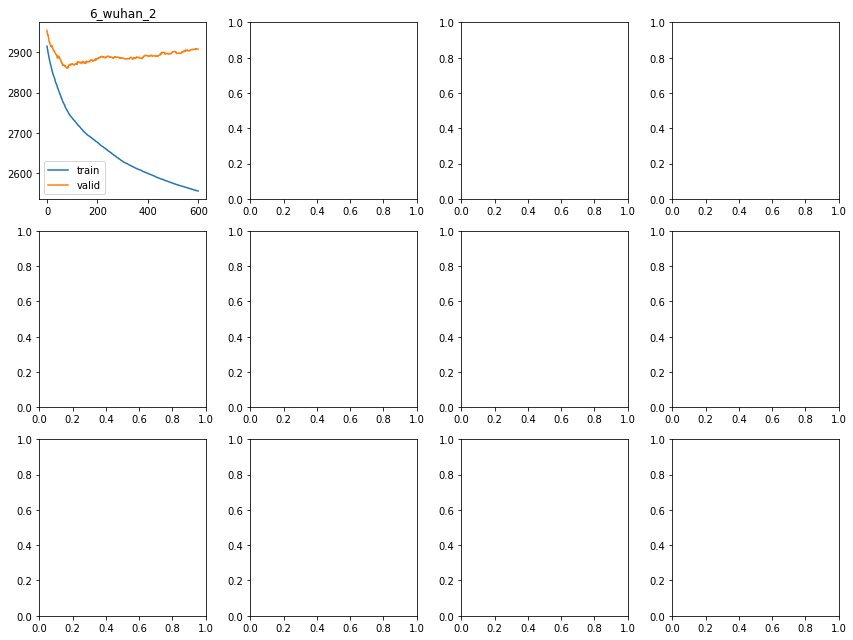

In [43]:
import re

def vis_12citys_loss(ddir,logs):
    res = []
    for log in logs:
        with open(ddir+"/"+log,"r") as fr:
            contents=fr.readlines()

        loss_list=[re.findall("(?<=l1: )[0-9\.]+",i.strip()) for i in contents if "valid" in i and "l1" in i]
        train_loss = [float(i[0]) for i in loss_list]
        valid_loss = [float(i[-1]) for i in loss_list]
        res.append((log,train_loss,valid_loss))

#     fig = plt.figure(figsize=(12,9))
#     ax = plt.gca()
#     for i in res:
#         _ = ax.plot(i[1],label="_".join(i[0].split("_")[1:3]))
#     _ = plt.legend()
#     plt.show()

    # fig = plt.figure(figsize=(12,9))
    # ax = plt.gca()
    fig,axes = plt.subplots(3,4,figsize=(12,9))
    _ = fig.set_tight_layout(True)
    axef=axes.flatten()
    for idx,i in enumerate(res):
        cur_ax=axef[idx]
        _ = cur_ax.set_title("_".join(i[0].split("_")[1:4]))
        _ = cur_ax.plot(i[1],label="train")
        _ = cur_ax.plot(i[2],label="valid")
        _ = cur_ax.legend()
    plt.show()

ddir="/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin"
# # 800round
# logs="train_33_nanning_20210510_20:58:20.log,train_2_shenzhen_20210510_20:57:13.log,train_133_huizhou_20210510_20:56:18.log,train_132_zhongshan_20210510_20:55:11.log,train_83_haikou_20210510_20:54:18.log,train_36_foshan_20210510_20:53:12.log,train_9_zhengzhou_20210510_20:52:00.log,train_15_hefei_20210510_20:50:55.log,train_6_wuhan_2_20210510_20:49:52.log,train_6_wuhan_1_20210510_20:48:46.log,train_19_kunming_20210510_20:47:41.log,train_17_chengdu_20210510_20:46:18.log".split(",")
# vis_12citys_loss(ddir,logs)

# # 400round
# logs="train_33_nanning_20210510_20:37:59.log,train_2_shenzhen_20210510_20:37:18.log,train_133_huizhou_20210510_20:36:43.log,train_132_zhongshan_20210510_20:36:02.log,train_83_haikou_20210510_20:35:25.log,train_36_foshan_20210510_20:34:48.log,train_9_zhengzhou_20210510_20:34:05.log,train_15_hefei_20210510_20:33:25.log,train_6_wuhan_2_20210510_20:32:42.log,train_6_wuhan_1_20210510_20:31:56.log,train_19_kunming_20210510_20:31:16.log,train_17_chengdu_20210510_20:30:34.log".split(",")
# vis_12citys_loss(ddir,logs)

# # 800round
# logs="train_33_nanning_20210511_11:19:41.log,train_2_shenzhen_20210511_11:18:27.log,train_133_huizhou_20210511_11:17:19.log,train_132_zhongshan_20210511_11:16:01.log,train_83_haikou_20210511_11:14:53.log,train_36_foshan_20210511_11:13:48.log,train_9_zhengzhou_20210511_11:12:20.log,train_15_hefei_20210511_11:11:00.log,train_6_wuhan_2_20210511_11:09:47.log,train_6_wuhan_1_20210511_11:08:36.log,train_19_kunming_20210511_11:07:16.log,train_17_chengdu_20210511_11:05:52.log".split(",")
# vis_12citys_loss(ddir,logs)

# logs="train_33_nanning_20210511_11:46:17.log,train_2_shenzhen_20210511_11:45:06.log,train_133_huizhou_20210511_11:44:00.log,train_132_zhongshan_20210511_11:42:48.log,train_83_haikou_20210511_11:41:39.log,train_36_foshan_20210511_11:40:27.log,train_9_zhengzhou_20210511_11:38:59.log,train_15_hefei_20210511_11:37:47.log,train_6_wuhan_2_20210511_11:36:32.log,train_6_wuhan_1_20210511_11:35:19.log,train_19_kunming_20210511_11:34:00.log,train_17_chengdu_20210511_11:32:41.log".split(",")
# vis_12citys_loss(ddir,logs)

# logs="train_33_nanning_20210511_12:09:42.log,train_2_shenzhen_20210511_12:09:22.log,train_133_huizhou_20210511_12:09:01.log,train_132_zhongshan_20210511_12:08:40.log,train_83_haikou_20210511_12:08:20.log,train_36_foshan_20210511_12:08:01.log,train_9_zhengzhou_20210511_12:07:37.log,train_15_hefei_20210511_12:07:17.log,train_6_wuhan_2_20210511_12:06:58.log,train_6_wuhan_1_20210511_12:06:39.log,train_19_kunming_20210511_12:06:16.log,train_17_chengdu_20210511_12:05:54.log".split(",")
# vis_12citys_loss(ddir,logs)

# logs="train_33_nanning_20210511_18:28:45.log,train_2_shenzhen_20210511_18:28:25.log,train_133_huizhou_20210511_18:28:05.log,train_132_zhongshan_20210511_18:27:45.log,train_83_haikou_20210511_18:27:27.log,train_36_foshan_20210511_18:27:08.log,train_9_zhengzhou_20210511_18:26:43.log,train_15_hefei_20210511_18:26:24.log,train_6_wuhan_2_20210511_18:26:06.log,train_6_wuhan_1_20210511_18:25:44.log,train_19_kunming_20210511_18:25:22.log,train_17_chengdu_20210511_18:24:58.log".split(",")
# vis_12citys_loss(ddir,logs)

# logs="train_33_nanning_20210511_19:02:07.log,train_2_shenzhen_20210511_19:01:30.log,train_133_huizhou_20210511_19:01:08.log,train_132_zhongshan_20210511_19:00:38.log,train_83_haikou_20210511_18:59:58.log,train_36_foshan_20210511_18:59:39.log,train_9_zhengzhou_20210511_18:59:12.log,train_15_hefei_20210511_18:58:46.log,train_6_wuhan_2_20210511_18:58:23.log,train_6_wuhan_1_20210511_18:57:58.log,train_19_kunming_20210511_18:57:17.log,train_17_chengdu_20210511_18:56:52.log".split(",")
logs="train_33_nanning_20210511_20:17:09.log,train_2_shenzhen_20210511_20:16:41.log,train_133_huizhou_20210511_20:16:14.log,train_132_zhongshan_20210511_20:15:54.log,train_83_haikou_20210511_20:15:23.log,train_36_foshan_20210511_20:15:01.log,train_9_zhengzhou_20210511_20:14:17.log,train_15_hefei_20210511_20:13:54.log,train_6_wuhan_2_20210511_20:13:33.log,train_6_wuhan_1_20210511_20:12:54.log,train_19_kunming_20210511_20:12:23.log,train_17_chengdu_20210511_20:11:57.log".split(",")
logs="train_33_nanning_20210511_19:35:11.log,train_2_shenzhen_20210511_19:34:41.log,train_133_huizhou_20210511_19:34:10.log,train_132_zhongshan_20210511_19:33:43.log,train_83_haikou_20210511_19:33:00.log,train_36_foshan_20210511_19:32:37.log,train_9_zhengzhou_20210511_19:31:57.log,train_15_hefei_20210511_19:31:31.log,train_6_wuhan_2_20210511_19:31:08.log,train_6_wuhan_1_20210511_19:30:39.log,train_19_kunming_20210511_19:30:04.log,train_17_chengdu_20210511_19:29:39.log".split(",")
logs="train_33_nanning_20210512_10:55:01.log,train_2_shenzhen_20210512_10:53:41.log,train_133_huizhou_20210512_10:52:33.log,train_132_zhongshan_20210512_10:51:17.log,train_83_haikou_20210512_10:50:18.log,train_36_foshan_20210512_10:48:57.log,train_9_zhengzhou_20210512_10:47:43.log,train_15_hefei_20210512_10:46:37.log,train_6_wuhan_2_20210512_10:45:12.log,train_6_wuhan_1_20210512_10:44:06.log,train_19_kunming_20210512_10:42:49.log,train_17_chengdu_20210512_10:41:29.log".split(",")
logs="train_33_nanning_20210512_14:01:43.log,train_2_shenzhen_20210512_14:00:28.log,train_133_huizhou_20210512_13:59:16.log,train_132_zhongshan_20210512_13:58:13.log,train_83_haikou_20210512_13:57:05.log,train_36_foshan_20210512_13:56:01.log,train_9_zhengzhou_20210512_13:54:53.log,train_15_hefei_20210512_13:53:52.log,train_6_wuhan_2_20210512_13:52:55.log,train_6_wuhan_1_20210512_13:51:49.log,train_19_kunming_20210512_13:50:49.log,train_17_chengdu_20210512_13:49:40.log".split(",")
logs="train_33_nanning_20210512_14:52:02.log,train_2_shenzhen_20210512_14:50:47.log,train_133_huizhou_20210512_14:49:37.log,train_132_zhongshan_20210512_14:48:17.log,train_83_haikou_20210512_14:46:43.log,train_36_foshan_20210512_14:45:24.log,train_9_zhengzhou_20210512_14:43:50.log,train_15_hefei_20210512_14:42:14.log,train_6_wuhan_2_20210512_14:41:00.log,train_6_wuhan_1_20210512_14:39:50.log,train_19_kunming_20210512_14:38:40.log,train_17_chengdu_20210512_14:37:30.log".split(",")
logs="train_33_nanning_20210512_15:31:38.log,train_2_shenzhen_20210512_15:30:09.log,train_133_huizhou_20210512_15:28:33.log,train_132_zhongshan_20210512_15:26:56.log,train_83_haikou_20210512_15:25:29.log,train_36_foshan_20210512_15:24:20.log,train_9_zhengzhou_20210512_15:22:40.log,train_15_hefei_20210512_15:21:22.log,train_6_wuhan_2_20210512_15:20:20.log,train_6_wuhan_1_20210512_15:18:51.log,train_19_kunming_20210512_15:17:13.log,train_17_chengdu_20210512_15:15:46.log".split(",")
logs=['train_6_wuhan_2_20210512_17:08:04.log']
vis_12citys_loss(ddir,logs)


In [ ]:
import sys
sys.path.append("/nfs/project/zhoutongzt/ETA/")
from line_time_model_train_length_fix import read_original_data,create_assist_date
data_date_list = create_assist_date("20201201", "20210303")
data_df = read_original_data("12_jinan", data_date_list, False)
data_df[all_feature_name] = data_df[all_feature_name].astype(float)
data_df.to_csv("/nfs/project/zhoutongzt/ETA/jinan_201201_210303.csv")

## ETA分布

[2021-06-04 10:54:27-WARNING]: path not exist,dt:20210426 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/9_zhengzhou/20210426


,label,pred
count,1872.000000,1872.000000
mean,16017.709936,15692.729730
std,4091.935408,1198.231647
min,3765.000000,8788.527984
25%,14170.500000,14976.916164
50%,16210.000000,15894.014798
75%,17758.500000,16546.760879
max,39395.000000,18857.975960


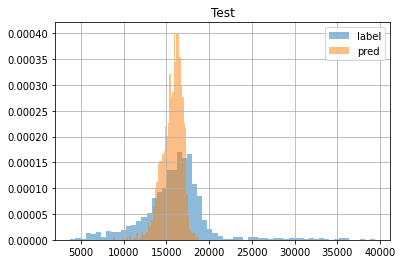

In [182]:
df = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/9_zhengzhou","20210423","20210430")
model_fp = "/nfs/project/zhoutongzt/ETA/line_base_model/lgb_online_tocarTime_40-9-000001_20210424.model.lgb"
M = lgb.Booster(model_file=model_fp)
df['pred']=M.predict(df1[M.feature_name()])
df[['label','pred']].describe()
_=df['label'].hist(bins=60,density=True,alpha=0.5,label="label")
_=df['pred'].hist(bins=60,density=True,alpha=0.5,label="pred")
_=plt.legend()
_=plt.title("Test")
plt.show()

## 网格仓 traj_ata vs hive_ata

In [1]:
df = pd.read_csv("/nfs/project/zhoutongzt/ETA/data/trajATADF_of_grid.csv", names=["wcode","driver_phone","traj_ata","hive_ata"])
df['city_id'] = df['wcode'].apply(lambda x:x.split("-")[1])
df['err_ata'] = df['traj_ata'] - df['hive_ata']


tmpdf = pd.DataFrame(list(df.groupby("wcode").apply(lambda dfg: dfg['err_ata'].mean()).items()), columns=['wcode','err_ata'])
tmpdf.shape
tmpdf[tmpdf['err_ata']> 300].shape
tmpdf[tmpdf['err_ata']< -300].shape

df[df.apply(lambda row: row['wcode']=="10-50-000003" and row['err_ata']< -1000, axis=1)]


ax = plt.gca()
_ = ax.scatter(df['hive_ata'],df['traj_ata'])
_ = ax.set_ylabel("traj_ata")
_ = ax.set_xlabel("hive_ata")
_ = ax.plot(df['hive_ata'],df['hive_ata'],color='r')
_ = ax.set_title("ALL")
# plt.show()


# 平均签收距离大于1.5km的wcode
# wcode_1500m="20-10-000002,20-10-000003,20-10-000004,20-10-000006,20-10-000010,20-10-000012,40-100-000003,40-100-000005,80-101-000009,80-101-000014,80-101-000018,80-101-000019,80-101-000020,80-101-000021,80-101-000022,80-101-000023,80-102-000002,80-102-000003,80-102-000008,80-102-000015,80-102-000016,80-102-000017,80-102-000020,80-102-000021,90-104-000001,90-104-000004,90-104-000006,90-104-000013,90-104-000014,90-104-000016,30-105-000007,30-105-000009,30-105-000016,30-105-000020,30-105-000022,30-105-000024,30-105-000025,30-106-000008,30-106-000009,30-106-000019,30-106-000020,20-108-000002,20-108-000003,20-108-000005,20-108-000006,20-108-000008,20-108-000010,20-108-000011,20-108-000012,20-108-000013,20-108-000014,20-108-000015,20-108-000016,20-108-000019,20-108-000021,20-108-000023,20-109-000002,20-109-000003,20-109-000004,20-109-000005,20-109-000006,20-109-000009,20-109-000010,40-112-000002,40-112-000004,40-113-000008,20-115-000005,20-116-000004,20-116-000006,20-116-000010,20-116-000011,20-116-000012,90-12-000003,90-12-000004,90-12-000011,90-12-000015,90-120-000005,90-120-000007,90-120-000009,90-121-000001,90-121-000008,90-123-000001,90-123-000003,90-123-000006,90-123-000008,90-124-000003,90-124-000004,90-124-000005,90-124-000007,90-126-000003,90-127-000002,90-13-000013,70-131-000003,30-133-000006,30-134-000002,30-134-000003,30-134-000004,30-134-000009,30-134-000011,30-134-000014,30-134-000015,30-135-000002,30-135-000004,10-136-000007,10-138-000005,10-138-000006,40-139-000009,70-14-000004,40-141-000003,80-144-000003,80-144-000004,80-144-000008,80-145-000002,80-145-000011,40-150-000001,30-153-000004,30-155-000002,30-156-000009,30-157-000004,30-157-000006,30-158-000006,30-159-000001,30-159-000005,30-159-000006,30-159-000007,30-159-000008,30-160-000007,30-160-000010,30-162-000003,30-162-000004,30-162-000005,30-162-000007,90-166-000002,90-166-000005,90-167-000006,90-167-000008,90-167-000011,90-167-000012,90-168-000005,50-169-000004,50-169-000007,10-17-000019,10-17-000036,20-170-000003,20-170-000008,20-170-000009,20-170-000010,20-170-000011,20-171-000005,20-171-000009,20-171-000013,20-171-000014,20-172-000002,20-172-000004,20-172-000006,20-172-000007,20-172-000009,40-176-000007,40-177-000006,10-18-000016,10-18-000017,10-18-000019,10-18-000025,10-18-000037,10-18-000038,10-18-000039,10-18-000040,10-18-000041,10-18-000042,10-18-000043,10-18-000044,10-18-000045,10-18-000047,10-18-000048,10-18-000049,10-18-000051,10-18-000057,10-18-000059,10-18-000063,10-18-000066,10-18-000069,10-18-000088,10-18-000091,10-18-000118,10-18-000119,10-18-000120,10-18-000122,10-18-000123,10-18-000125,40-189-000005,40-189-000008,40-189-000010,10-19-000004,90-193-000007,90-193-000015,30-2-000023,30-21-000009,30-21-000018,30-21-000024,30-21-000028,80-219-000001,80-219-000003,50-22-000005,80-221-000002,80-221-000003,80-221-000004,80-221-000005,80-221-000006,80-221-000007,80-222-000011,80-222-000017,80-223-000003,80-223-000008,80-223-000009,80-224-000002,80-224-000003,80-224-000004,80-224-000005,80-224-000006,80-224-000008,80-224-000009,80-224-000014,80-225-000002,80-226-000004,20-227-000002,20-227-000003,20-228-000001,20-229-000001,20-229-000002,20-229-000003,20-229-000004,20-230-000002,20-230-000003,20-230-000004,20-231-000003,20-231-000004,20-231-000007,20-232-000002,20-232-000003,20-232-000004,20-232-000007,20-232-000008,20-232-000011,20-232-000014,20-233-000003,20-233-000004,20-233-000005,20-234-000001,20-235-000003,20-236-000001,20-236-000002,20-237-000001,20-237-000002,20-238-000001,30-24-000011,30-24-000018,30-24-000027,30-240-000002,30-240-000008,30-242-000004,30-242-000008,30-242-000011,30-242-000013,30-242-000014,30-242-000020,30-242-000023,30-242-000025,30-243-000001,30-243-000005,30-243-000007,30-243-000008,70-25-000011,40-250-000005,40-251-000004,30-253-000005,30-253-000007,30-254-000004,30-255-000001,30-255-000002,30-255-000003,30-256-000002,30-256-000003,30-258-000003,30-259-000002,30-259-000003,30-259-000004,30-259-000005,90-26-000009,90-26-000016,30-262-000001,30-263-000002,30-263-000006,30-264-000001,30-265-000003,30-265-000005,30-265-000006,30-266-000001,30-266-000003,30-266-000005,30-267-000001,30-267-000003,30-267-000004,30-271-000001,50-28-000006,10-285-000002,10-285-000005,10-287-000004,10-289-000001,10-289-000004,90-29-000006,90-29-000008,10-293-000002,10-294-000003,10-294-000005,10-295-000001,10-295-000002,10-295-000003,10-295-000004,10-295-000005,10-296-000001,10-296-000002,10-296-000003,10-296-000005,10-296-000007,10-296-000009,10-296-000010,10-297-000001,10-297-000005,10-298-000002,10-298-000006,10-298-000007,10-298-000009,10-298-000011,10-299-000003,10-299-000008,10-299-000009,10-299-000010,10-299-000011,10-299-000013,30-3-000007,10-300-000002,10-300-000003,10-300-000004,10-306-000008,20-319-000003,20-319-000007,20-319-000009,20-320-000008,20-321-000001,20-321-000002,20-321-000003,20-321-000004,20-321-000005,20-321-000006,20-321-000007,50-322-000003,50-323-000003,50-325-000001,50-326-000001,50-326-000003,50-326-000004,50-327-000007,30-33-000002,30-33-000003,30-33-000004,30-33-000006,30-33-000008,30-33-000012,30-33-000013,30-33-000016,30-33-000017,30-33-000019,50-331-000003,50-335-000003,50-337-000002,50-338-000002,50-338-000003,50-338-000004,50-338-000006,50-338-000007,50-338-000008,80-34-000005,50-340-000001,30-362-000002,80-38-000005,60-39-000003,50-40-000005,90-42-000006,90-42-000008,10-44-000003,10-44-000006,10-44-000009,10-44-000010,10-44-000011,50-49-000008,40-5-000009,10-50-000007,10-50-000008,20-51-000005,20-51-000006,20-51-000007,20-51-000008,20-51-000010,20-51-000011,10-53-000006,10-53-000007,10-53-000011,30-54-000003,30-54-000004,30-54-000009,30-54-000013,30-55-000001,30-55-000006,30-55-000018,90-57-000004,90-57-000005,90-58-000003,90-58-000004,90-58-000005,90-58-000007,90-58-000009,90-58-000010,90-58-000011,50-59-000002,50-59-000009,50-59-000010,50-59-000011,20-6-000003,20-6-000005,20-6-000006,20-6-000007,20-6-000008,20-6-000009,20-6-000010,20-6-000011,50-63-000006,50-72-000010,90-73-000002,50-78-000005,50-78-000007,90-79-000002,90-79-000003,90-79-000004,90-79-000005,90-79-000006,90-79-000007,90-79-000008,90-79-000010,90-79-000012,50-80-000004,50-80-000010,90-81-000002,90-81-000014,10-82-000002,10-82-000004,40-9-000008,40-9-000011,40-9-000013,40-9-000015,40-9-000026,40-9-000027,40-90-000003,40-90-000006,60-91-000001,60-91-000007,60-92-000002,60-92-000004,60-92-000005,60-93-000004,60-94-000005,60-94-000007,60-95-000003,60-96-000003,60-96-000004,60-97-000002,60-97-000005".split(",")
# tmpdf=df[df['wcode'].apply(lambda x:x in wcode_1500m)]
# ax = plt.gca()
# tmpdf['hive_ata'].min(),tmpdf['hive_ata'].max()
# _ = ax.scatter(tmpdf['hive_ata'],tmpdf['traj_ata'])
# _ = ax.set_ylabel("traj_ata")
# _ = ax.set_xlabel("hive_ata")
# _ = ax.plot(tmpdf['hive_ata'],tmpdf['hive_ata'],color='r')
# _ = ax.set_title(wcode)
# plt.show()


# wcode_5000m="20-10-000002,20-10-000012,80-101-000009,80-101-000019,80-101-000022,80-102-000008,80-102-000016,80-102-000020,90-104-000006,30-105-000020,30-106-000008,20-108-000003,20-108-000005,20-108-000006,20-108-000010,20-108-000013,20-108-000015,20-109-000002,20-109-000003,20-109-000004,20-109-000009,20-109-000010,20-116-000010,90-120-000007,90-121-000001,70-131-000003,30-134-000003,30-134-000009,10-138-000006,80-144-000003,30-157-000004,30-160-000007,30-162-000005,20-170-000009,20-170-000010,20-171-000014,20-172-000002,20-172-000007,20-172-000009,10-18-000017,10-18-000042,10-18-000043,10-18-000045,10-18-000059,10-18-000066,10-18-000118,40-189-000005,40-189-000008,40-189-000010,90-193-000015,80-221-000002,80-221-000003,80-221-000005,80-224-000005,20-229-000001,20-229-000002,20-229-000003,20-231-000003,20-232-000002,20-232-000004,20-232-000007,20-232-000011,20-233-000003,20-233-000005,20-234-000001,20-235-000003,20-236-000002,20-237-000001,20-238-000001,30-243-000005,30-243-000008,70-25-000011,40-250-000005,30-253-000005,30-254-000004,30-255-000002,30-259-000002,30-259-000004,30-259-000005,30-262-000001,30-265-000003,30-265-000006,30-266-000005,30-267-000001,30-271-000001,10-293-000002,10-295-000004,10-298-000007,10-298-000011,10-299-000003,10-300-000003,20-319-000009,20-321-000003,20-321-000006,20-321-000007,50-322-000003,30-33-000006,30-33-000008,30-33-000013,50-331-000003,50-335-000003,50-338-000002,50-338-000003,90-42-000008,10-50-000007,10-50-000008,20-51-000008,20-51-000011,90-58-000003,90-58-000007,20-6-000006,90-79-000003,90-79-000008,10-82-000002,40-9-000027,60-92-000004,60-92-000005,60-97-000005"
# tmpdf=df[df['wcode'].apply(lambda x:x in wcode_1500m)]
# ax = plt.gca()
# tmpdf['hive_ata'].min(),tmpdf['hive_ata'].max()
# _ = ax.scatter(tmpdf['hive_ata'],tmpdf['traj_ata'])
# _ = ax.set_ylabel("traj_ata")
# _ = ax.set_xlabel("hive_ata")
# _ = ax.plot(tmpdf['hive_ata'],tmpdf['hive_ata'],color='r')
# _ = ax.set_title(wcode)
# plt.show()


# assert False
keyCol = "wcode"
# keyCol = "city_id"
for key,cnt in df.groupby(keyCol).apply(lambda dfg: dfg.shape[0]).sort_values(ascending=False)[:10].items():
    tmpdf = df.query("%s=='%s'" % (keyCol, key))
    ax = plt.gca()
    me=tmpdf['err_ata'].mean()
    tmpdf['hive_ata'].min(),tmpdf['hive_ata'].max(), me
    _ = ax.scatter(tmpdf['hive_ata'],tmpdf['traj_ata'])
    _ = ax.set_ylabel("traj_ata")
    _ = ax.set_xlabel("hive_ata")
    _ = ax.plot(tmpdf['hive_ata'],tmpdf['hive_ata'],color='r')
    _ = ax.set_title("%s=%s, me=%.2f" % (keyCol, key, me))
    plt.show()

    

NameError: name 'pd' is not defined

## Custom

In [46]:
np.sort(df['date'].unique())[-3]

20210315

[2021-05-11 11:37:23-WARNING]: path not exist,dt:20210101 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-15-000001/20210101
[2021-05-11 11:37:23-WARNING]: path not exist,dt:20210102 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-15-000001/20210102
[2021-05-11 11:37:23-WARNING]: path not exist,dt:20210103 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-15-000001/20210103
[2021-05-11 11:37:23-WARNING]: path not exist,dt:20210104 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-15-000001/20210104
[2021-05-11 11:37:23-WARNING]: path not exist,dt:20210105 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-15-000001/20210105
[2021-05-11 11:37:23-WARNING]: path not exist,dt:20210106 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-15-000001/20210106
[2021-05-11 11:37:23-WARNING]: path not exist,dt:20210107 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-15-000001/20210107
[2021-05-11 11:37:23-WARNING]: path not exist,dt:20210108 path

<AxesSubplot:xlabel='leader_uid_cnt'>

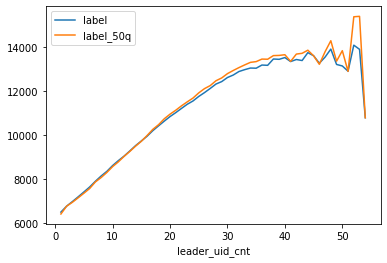

In [39]:
df = load_data(DATA_PARSED_BY_LINE.format("40-15-000001"),"20210101","20210317")
def agg_func(dfg):
    res = {
        "leader_uid_cnt":dfg["leader_uid_cnt"].iloc[0],
        "label":dfg["label"].mean(),
        "label_50q":np.percentile(dfg["label"],50)
    }
    return res

pd.DataFrame(df.groupby("leader_uid_cnt").apply(agg_func).to_list()).plot(x='leader_uid_cnt',y=['label','label_50q'])






### 团长个数ATA与司机出勤数据
司机出勤是不是有问题？ 刚好在30~35个团的这个区间，样本都是新司机？

[2021-04-08 21:03:48,835-WARNING]: path not exist,dt:20210318 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210318
[2021-04-08 21:03:49,405-WARNING]: path not exist,dt:20210331 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001/20210331


>>> line_gmv 的方案似乎没有过滤任何数据？


(41934, 77)

(41934, 77)

>>> 团长出勤数据


,leader_uid_cnt,label,label_50q,tocar_time,first_length,leader_eta,driver_occurCnt,count
51,52,17789.000000,18101.0,7.333333,41166.333333,4701.000000,"[11, 12, 11.666666666666666, 12.0]",3
50,51,17425.666667,17137.0,7.333333,41166.333333,4584.333333,"[11, 12, 11.666666666666666, 12.0]",3
49,50,16014.500000,14590.5,7.250000,41144.750000,4411.250000,"[11, 12, 11.5, 11.5]",4
48,49,16899.800000,16162.0,7.000000,39662.000000,4362.600000,"[9, 12, 11.0, 11.0]",5
47,48,18129.111111,19036.0,7.111111,39953.000000,4658.666667,"[7, 12, 10.777777777777779, 11.0]",9
46,47,18766.000000,19839.5,6.750000,39045.750000,4139.750000,"[6, 12, 9.875, 11.0]",8
45,46,18640.000000,18335.5,6.600000,39970.100000,4478.600000,"[6, 12, 9.6, 11.0]",10
44,45,19205.588235,19031.0,6.823529,39192.411765,4398.588235,"[4, 12, 9.647058823529411, 11.0]",17
43,44,18694.523810,18887.0,6.857143,38475.380952,4356.238095,"[6, 12, 10.19047619047619, 11.0]",21
42,43,18963.264706,18825.0,6.941176,39361.970588,4372.294118,"[3, 12, 10.176470588235293, 11.0]",34


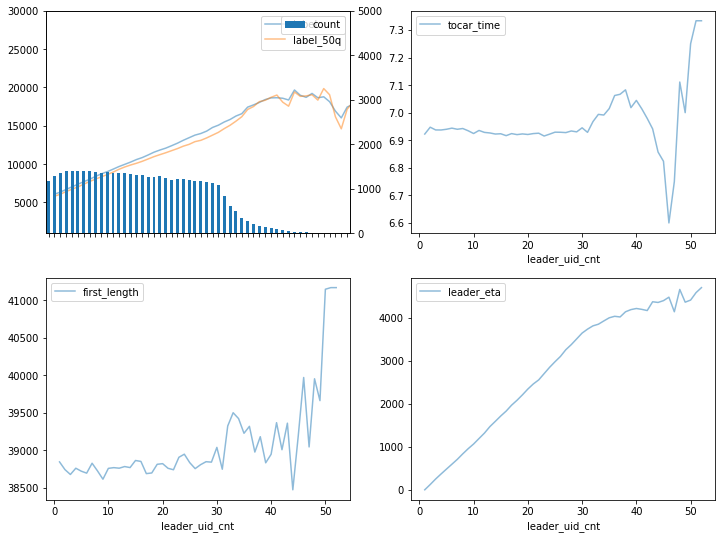

In [8]:
# df = load_data(DATA_PARSED_BY_LINE.format("40-15-000001"),"20210301","20210317")
city="10-19-000001"
# city="10-17-000004"
# city="17_chengdu"
# city="20-6-000002"
# city="20-109-000001"
# city="30-36-000001"
df = load_data(DATA_PARSED_BY_LINE.format(city),"20210318","20210331")
df['driver_id'] = df['driver_phone_ori'].apply(lambda row: row.split("_")[0])
driver_transCnt = pd.DataFrame(df.groupby("driver_id").apply(lambda dfg: {"occurCnt": dfg['date'].unique().shape[0],
                                                             "driver_id": dfg['driver_id'].to_list()[0]}).to_list())

print(">>> line_gmv 的方案似乎没有过滤任何数据？")
df.shape
df = drop_line_gmv_err(df)
df.shape

mergeDF = df.merge(driver_transCnt, on="driver_id",how="left")

def agg_func(dfg):
    res = {
        "leader_uid_cnt":dfg["leader_uid_cnt"].iloc[0],
        "label":dfg["label"].mean(),
        "label_50q":np.percentile(dfg["label"],50),
        "tocar_time":dfg['tocar_time'].apply(lambda x: int(datetime.strftime(datetime.strptime(x,"%Y-%m-%d %H:%M:%S"),"%H"))).mean(),
        "first_length":dfg['first_length'].mean(),
        "leader_eta":dfg['leader_eta'].mean(),
        "driver_occurCnt":[dfg['occurCnt'].min(),dfg['occurCnt'].max(),dfg['occurCnt'].mean(),np.percentile(dfg['occurCnt'],50)],
        "count":dfg.shape[0],
    }
    return res

aggDF = pd.DataFrame(mergeDF.groupby("leader_uid_cnt").apply(agg_func).to_list())
print(">>> 团长出勤数据")
aggDF.sort_values(by='leader_uid_cnt', ascending=False).head(20)

fig,axes=plt.subplots(2,2,figsize=(12,9))
axesf=axes.flatten()
_ = aggDF.plot(x='leader_uid_cnt',y=['label','label_50q'],alpha=0.5,ax=axesf[0],ylim=(1000, 30000))
ax_bar = axesf[0].twinx()
_ = aggDF.plot(x='leader_uid_cnt',y=['count'],ax=ax_bar,kind="bar",ylim=(0,5000))
_ = aggDF.plot(x='leader_uid_cnt',y=['tocar_time'],alpha=0.5,ax=axesf[1])
_ = aggDF.plot(x='leader_uid_cnt',y=['first_length'],alpha=0.5,ax=axesf[2])
_ = aggDF.plot(x='leader_uid_cnt',y=['leader_eta'],alpha=0.5,ax=axesf[3])
plt.show()




In [196]:
infoRes_ = df[df.apply(lambda row: "18988358347" in row['driver_phone_ori'], axis=1)]\
.groupby("date").apply(lambda dfg: {"date": dfg['date'].to_list()[0],
                                    "tocar_time": dfg['tocar_time'].to_list()[0],
                                    "ATA": dfg['label'].max(), 
                                    "last_action_time": dfg['last_action_time'].sort_values().to_list()[-1], 
                                    "leader_uid_cnt":dfg['leader_uid_cnt'].max()})
pd.DataFrame(infoRes_.to_list())

,date,tocar_time,ATA,last_action_time,leader_uid_cnt
0,20210301,2021-03-01 07:15:28,12254,2021-03-01 10:39:42,21
1,20210304,2021-03-04 07:00:52,13562,2021-03-04 10:46:54,29
2,20210305,2021-03-05 07:16:04,29943,2021-03-05 15:35:07,32
3,20210308,2021-03-08 06:32:54,14967,2021-03-08 10:42:21,30
4,20210309,2021-03-09 06:30:26,14800,2021-03-09 10:37:06,33
5,20210310,2021-03-10 07:23:22,12795,2021-03-10 10:56:37,31
6,20210315,2021-03-15 06:33:25,15305,2021-03-15 10:48:30,28
7,20210316,2021-03-16 07:08:59,12641,2021-03-16 10:39:40,30


In [170]:
df.query("30 < leader_uid_cnt < 35")[['driver_phone_ori','date','leader_uid_cnt','tocar_time','last_action_time','label']].sort_values(by="label",ascending=False).head(10)

targetCols=['driver_phone_ori','date','tocar_time','last_action_time','label','leader_uid_cnt']
# tels=["18988358347_31","18187509326_31","19988753775_31","15887166063_31"]
tels=["19988753775"]
dates=["20210305","20210306","20210307","20210310","20210314","20210317"]
def filter_func(row):
    cond1 = any(tel in row['driver_phone_ori'] for tel in tels)
    cond2 = any(str(row['date']) == date for date in dates)
    return cond1 and cond2


df[df.apply(filter_func, axis=1)][targetCols].sort_values(by="label",ascending=False).head(50)


,driver_phone_ori,date,leader_uid_cnt,tocar_time,last_action_time,label
918,18988358347_31,20210305,32,2021-03-05 07:16:04,2021-03-05 15:35:07,29943
498,18187509326_31,20210314,32,2021-03-14 07:18:18,2021-03-14 15:35:29,29831
1343,19988753775_31,20210307,32,2021-03-07 07:49:10,2021-03-07 16:04:09,29699
837,15887166063_31,20210317,32,2021-03-17 07:26:11,2021-03-17 15:36:43,29432
1318,15752541151_33,20210314,34,2021-03-14 07:33:07,2021-03-14 15:43:33,29426
1317,15752541151_32,20210314,33,2021-03-14 07:33:07,2021-03-14 15:43:19,29412
1342,19988753775_30,20210307,31,2021-03-07 07:49:10,2021-03-07 15:59:10,29400
1316,15752541151_31,20210314,32,2021-03-14 07:33:07,2021-03-14 15:43:07,29400
1315,15752541151_30,20210314,31,2021-03-14 07:33:07,2021-03-14 15:42:54,29387
1674,18206873569_33,20210305,34,2021-03-05 07:29:07,2021-03-05 15:38:45,29378


,driver_phone_ori,date,tocar_time,last_action_time,label,leader_uid_cnt
1343,19988753775_31,20210307,2021-03-07 07:49:10,2021-03-07 16:04:09,29699,32
1342,19988753775_30,20210307,2021-03-07 07:49:10,2021-03-07 15:59:10,29400,31
1341,19988753775_29,20210307,2021-03-07 07:49:10,2021-03-07 15:58:38,29368,30
1340,19988753775_28,20210307,2021-03-07 07:49:10,2021-03-07 15:53:58,29088,29
1339,19988753775_27,20210307,2021-03-07 07:49:10,2021-03-07 15:20:08,27058,28
1338,19988753775_26,20210307,2021-03-07 07:49:10,2021-03-07 15:08:21,26351,27
1337,19988753775_25,20210307,2021-03-07 07:49:10,2021-03-07 14:49:20,25210,26
1336,19988753775_24,20210307,2021-03-07 07:49:10,2021-03-07 14:42:40,24810,25
1335,19988753775_23,20210307,2021-03-07 07:49:10,2021-03-07 14:37:51,24521,24
1334,19988753775_22,20210307,2021-03-07 07:49:10,2021-03-07 14:34:54,24344,23


## On City

In [69]:
inpDF['date'].min()
inpDF['date'].max()
minDate = datetime.strptime(str(inpDF['date'].min()),"%Y%m%d")
inpDF['date'].apply(lambda dt: datetime.strptime(str(dt),"%Y%m%d") - minDate)


20210301

20210430

0       0 days
1       0 days
2       0 days
3       0 days
4       0 days
         ...  
9153   60 days
9154   60 days
9155   60 days
9156   60 days
9157   60 days
Name: date, Length: 9158, dtype: timedelta64[ns]

In [69]:
# fp = "/nfs/project/zhoutongzt/ETA/merged_data/12_jinan_20201205_20210317.csv"
# fp = "/nfs/project/zhoutongzt/ETA/merged_data/12_jinan_ataByTraj_20210220_20210314_tmpATA_byTraj.csv"
# df = pd.read_csv(fp)
# city="10-19-000001"
city="10-19-000001"
city="17_chengdu"
# city="12_jinan"
# city="12_jinan_ataByTraj"
data_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}"
# data_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_leader/12_jinan"
df = load_data(data_dir.format(city),"20210301","20210420")
df.shape


# # 网格仓数据
# df = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_grid/line_feature_with_eta_grid/","20210324","20210331")
# # df = df.sample(frac=0.1, replace=False)
# df.shape


[2021-04-28 15:47:17,038-WARNING]: path not exist,dt:20210301 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210301
[2021-04-28 15:47:17,039-WARNING]: path not exist,dt:20210302 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210302
[2021-04-28 15:47:17,040-WARNING]: path not exist,dt:20210303 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210303
[2021-04-28 15:47:17,041-WARNING]: path not exist,dt:20210304 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210304
[2021-04-28 15:47:17,042-WARNING]: path not exist,dt:20210305 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210305
[2021-04-28 15:47:17,043-WARNING]: path not exist,dt:20210306 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210306
[2021-04-28 15:47:17,044-WARNING]: path not exist,dt:20210307 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210307
[2021-04-28 15:47:17,045-WARNING]: path not exis

(1412, 78)

In [90]:
df=exp_demo.load_data(DATA_PARSED_BY_LINE.format("9_zhengzhou"),"20210301","20210423")

[2021-05-20 11:46:44-WARNING]: path not exist,dt:20210313 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/9_zhengzhou/20210313
[2021-05-20 11:46:44-WARNING]: path not exist,dt:20210318 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/9_zhengzhou/20210318
[2021-05-20 11:46:44-WARNING]: path not exist,dt:20210413 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/9_zhengzhou/20210413


### all dates ATA visulaize

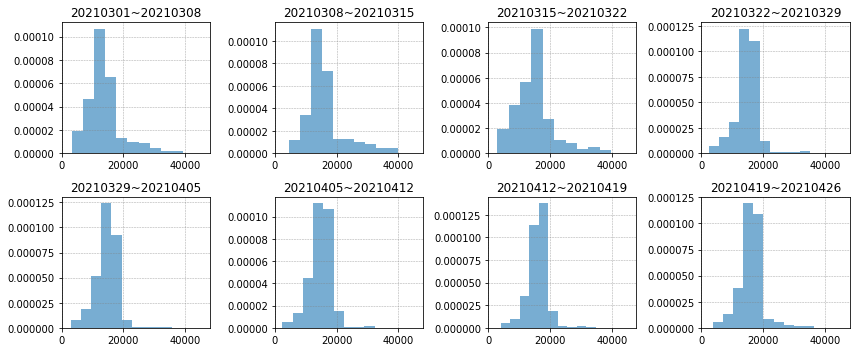

In [91]:

# vis(keep_tocar_traj(df),'label',figsize=(12,5))
vis(df,'label',figsize=(12,5))
# vis(df,'refrigeration_type_3',figsize=(12,5))
# vis(drop_split_lines(df),'label',figsize=(12,5))



### ATA 随 「团长个数、商品个数 」的变化

#### Line plot

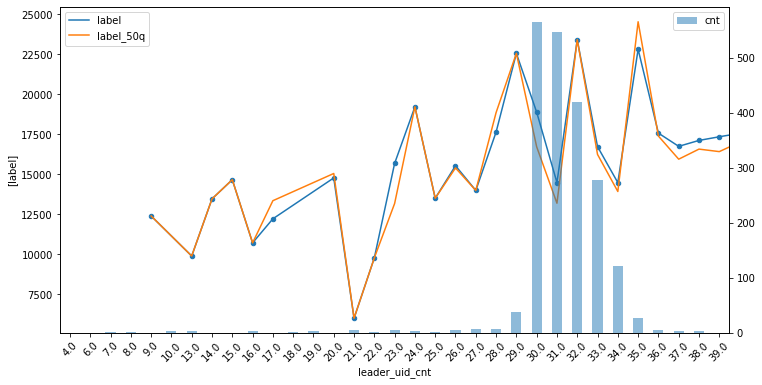

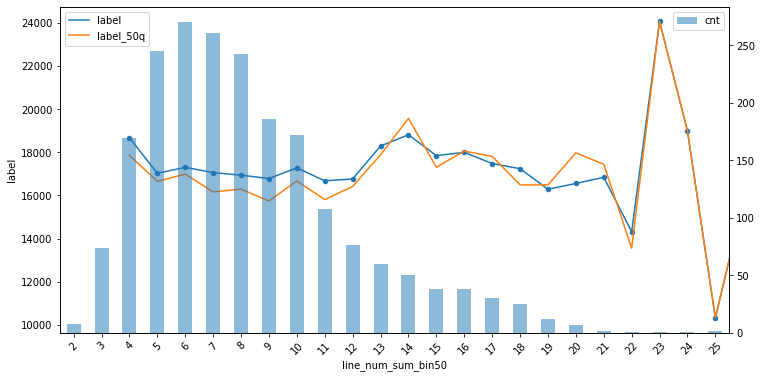

In [141]:
def agg_func(dfg):
    res = {"label":dfg["label"].mean(),
           "label_50q":np.percentile(dfg['label'], 50),
           "cnt":dfg["label"].shape[0],
           "leader_uid_cnt":dfg["leader_uid_cnt"].mean()}
    return res

aggDF = pd.DataFrame(df.groupby("leader_uid_cnt").apply(agg_func).to_list())
ax=plt.gca()
ax_twinx = ax.twinx()
_ = aggDF.plot(x="leader_uid_cnt",y=['cnt'],figsize=(12,6),kind='bar',ax=ax_twinx,alpha=0.5,rot=45)
_ = aggDF.plot(x="leader_uid_cnt",y=['label'],figsize=(12,6),kind='scatter',ax=ax,rot=45)
_ = aggDF.plot(x="leader_uid_cnt",y=['label','label_50q'],figsize=(12,6),kind='line',ax=ax,rot=45)
plt.show()



lineNum_binCol='line_num_sum_bin50'
df[lineNum_binCol] = df['line_num_sum'].apply(lambda x: int(x/50))
aggInfos = df.groupby(lineNum_binCol).apply(lambda dfg: {lineNum_binCol:dfg[lineNum_binCol].iloc[0],
                                                         "cnt":dfg.shape[0],
                                                         "label":dfg['label'].mean(),
                                                         "label_50q":np.percentile(dfg['label'], 50)})
aggDF = pd.DataFrame(aggInfos.to_list())

ax=plt.gca()
ax_twinx = ax.twinx()
_ = aggDF.plot(x=lineNum_binCol,y=['cnt'],figsize=(12,6),kind='bar',ax=ax_twinx,alpha=0.5,rot=45)
_ = aggDF.plot(x=lineNum_binCol,y='label',figsize=(12,6),kind='scatter',ax=ax,rot=45)
_ = aggDF.plot(x=lineNum_binCol,y=['label','label_50q'],figsize=(12,6),kind='line',ax=ax,rot=45)
plt.show()


### 不同时间段的排线个数

In [31]:
date_pairs = get_date_pair("20210213","20210320",7)
for idx,(b,e) in enumerate(date_pairs):
    "%s~%s" % (b,e), df.query("%s <= date and date <= %s" % (b,e))['date'].value_counts().to_numpy()


('20210213~20210220', array([], dtype=int64))

('20210220~20210227', array([], dtype=int64))

('20210227~20210306', array([2146, 2108, 2013, 1925, 1490, 1414]))

('20210306~20210313', array([2811, 2705, 2630, 2512, 2318, 2108, 2058]))

('20210313~20210320', array([3098, 2781, 2715, 2705, 2619]))

### 线长度为1的检查first_eta和label的diff
注意这里的diff应该都是低估，因为label里包含了拣货时间，而不同司机拣货方式也不同，所以diff偏差也不稳定

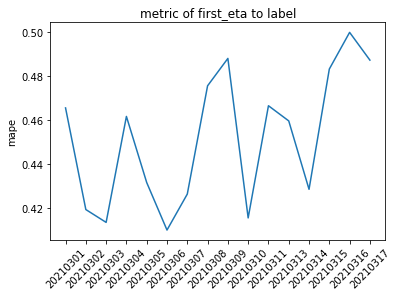

In [49]:
# 注：这里因为纵轴的范围给的很小，所以看起来波动大，其实很小的而且没有准确规律，不是上升3天下降2天这种pattern
mapes=[]
for dt,dfg in df.groupby("date"):
#     print(">>> at date: %s" % dt)
    cntOne = dfg.query("leader_uid_cnt == 1").copy(deep=True)
#     cntOne.shape
    cntOne['diff'] = cntOne['first_eta'] - cntOne['label']
    res = metric(cntOne['label'],cntOne['first_eta'])
    mapes.append((dt,res['mape']))

_ = plt.plot([i[1] for i in mapes])
_ = plt.xticks(ticks=range(len(mapes)),labels=[i[0] for i in mapes], rotation=45)
_ = plt.ylabel("mape")
_ = plt.title("metric of first_eta to label")
plt.show()

### 不同时间段特征的箱线图

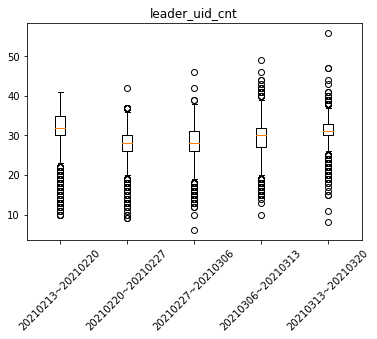

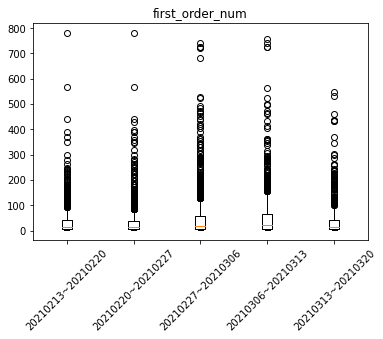

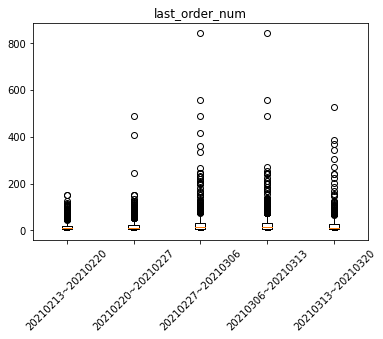

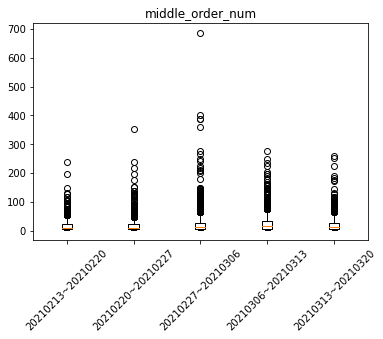

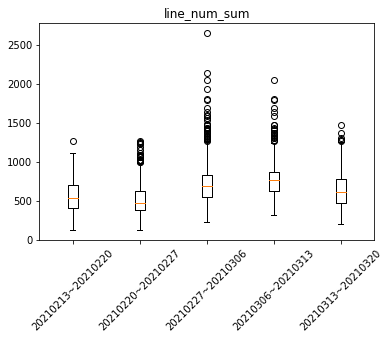

In [144]:
for col in ['leader_uid_cnt','first_order_num','last_order_num','middle_order_num','line_num_sum']:
    date_pairs = get_date_pair("20210213","20210320",7)
    for idx,(b,e) in enumerate(date_pairs):
        _data2box = df.query("%s <= date and date <= %s" % (b,e))[col].to_numpy()
        _ = plt.boxplot(_data2box, positions=[idx])
    _ = plt.xticks(ticks=range(len(date_pairs)), labels=["%s~%s" % (b,e) for b,e in date_pairs], rotation=45)
    _ = plt.title(col)
    plt.show()

    
    
    

### 不同时间段的特征直方图

age_30


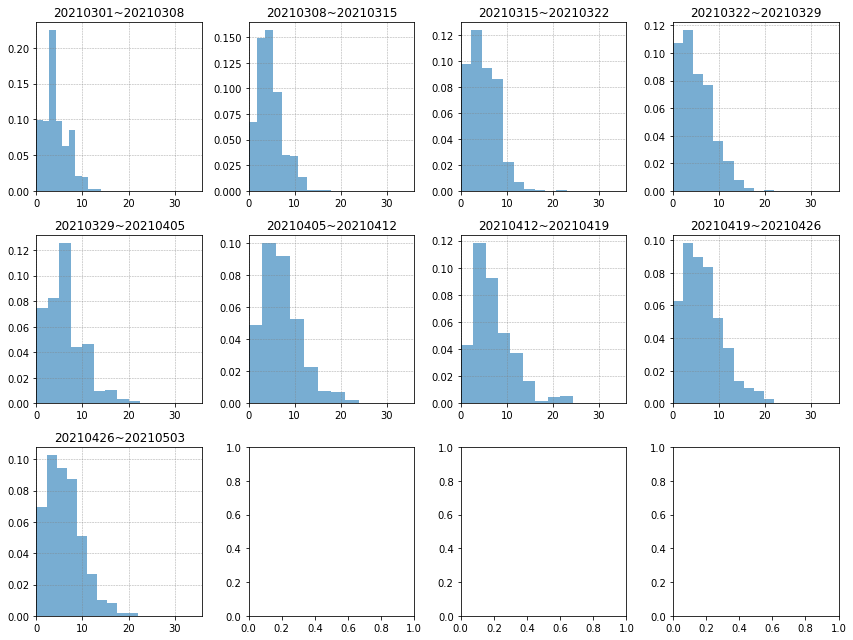

age_40


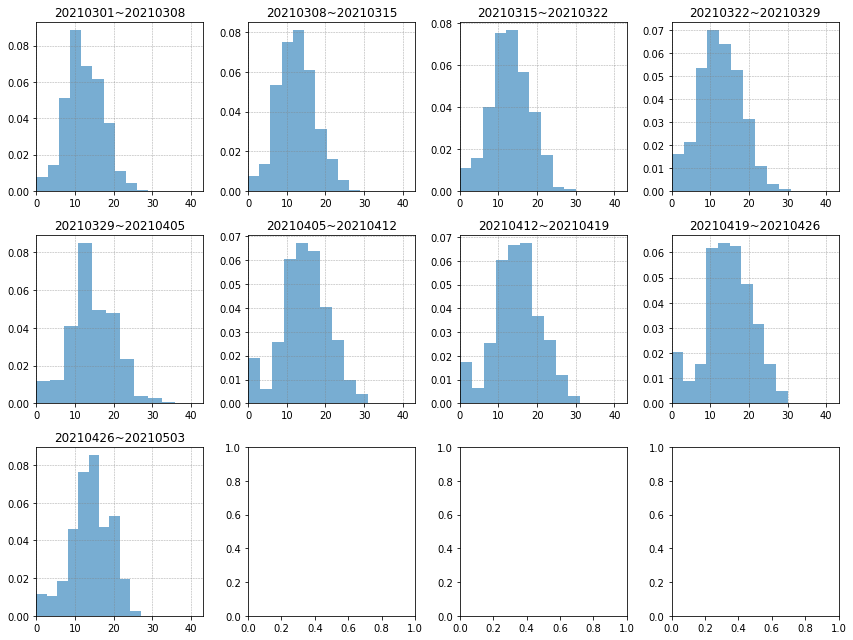

age_50


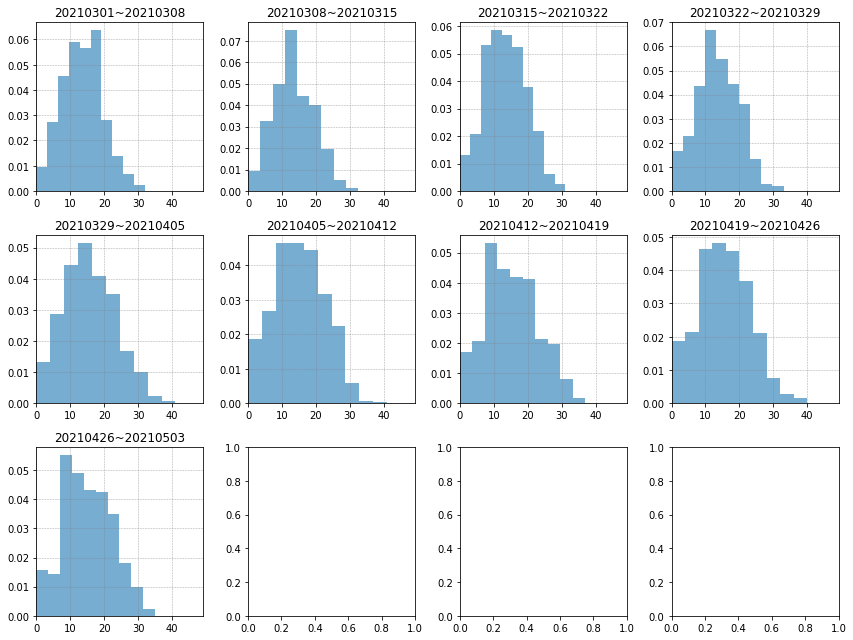

age_25_q


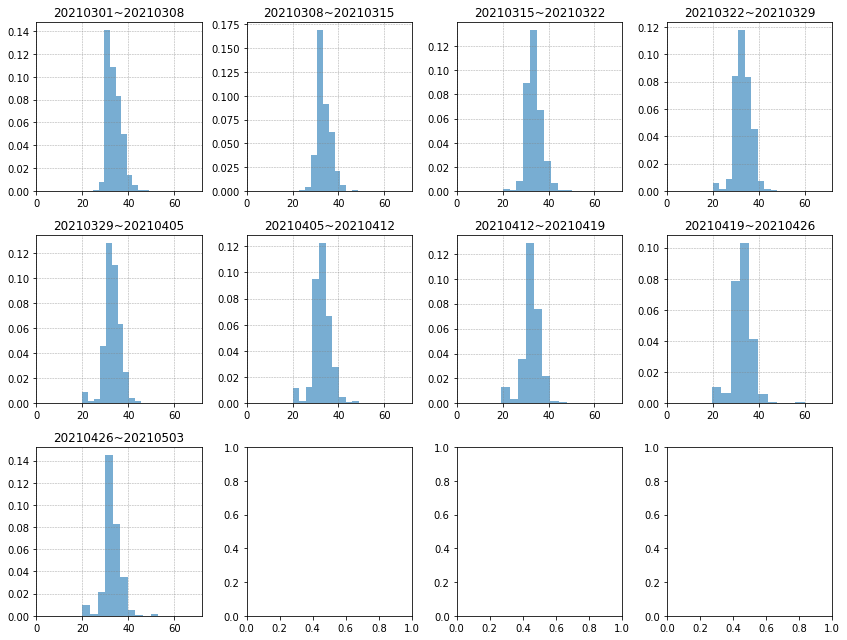

age_50_q


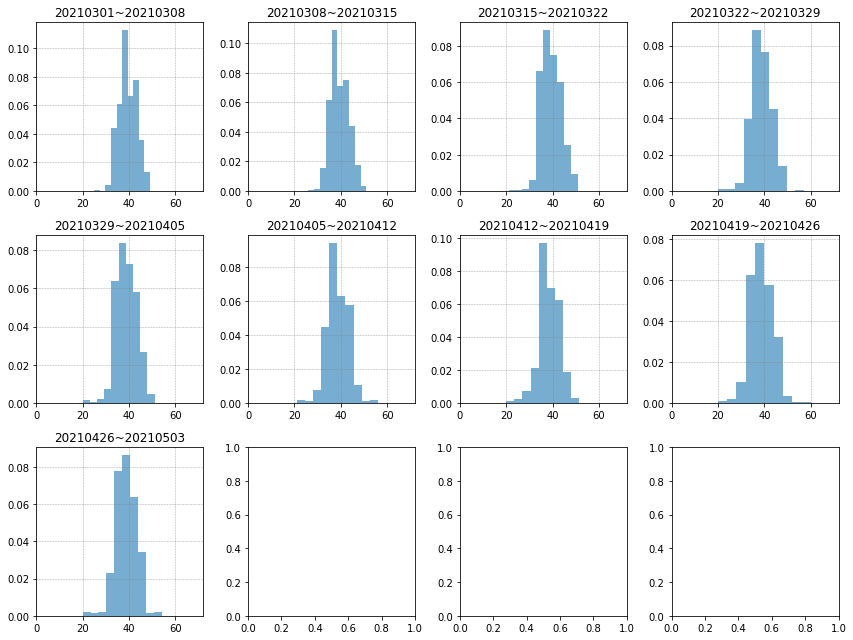

age_75_q


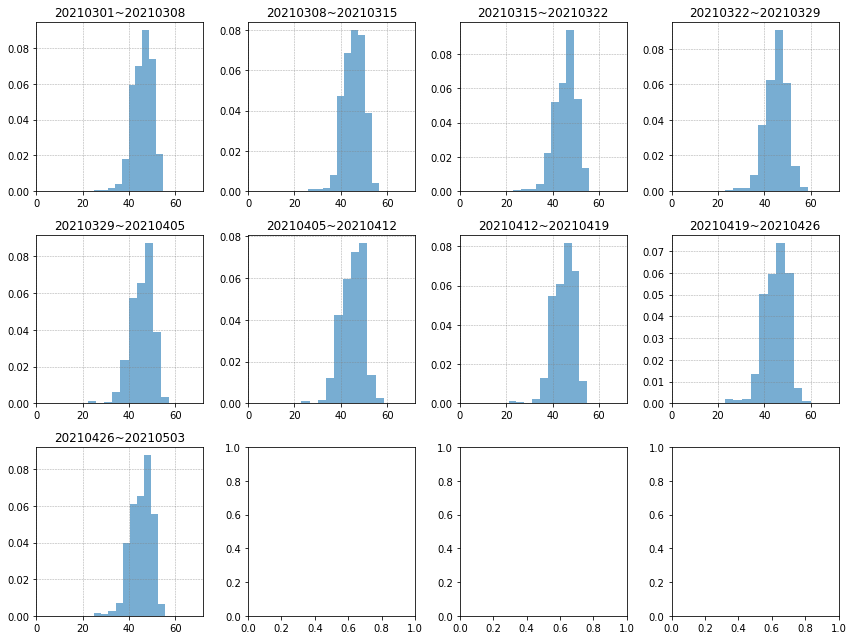

age_mean


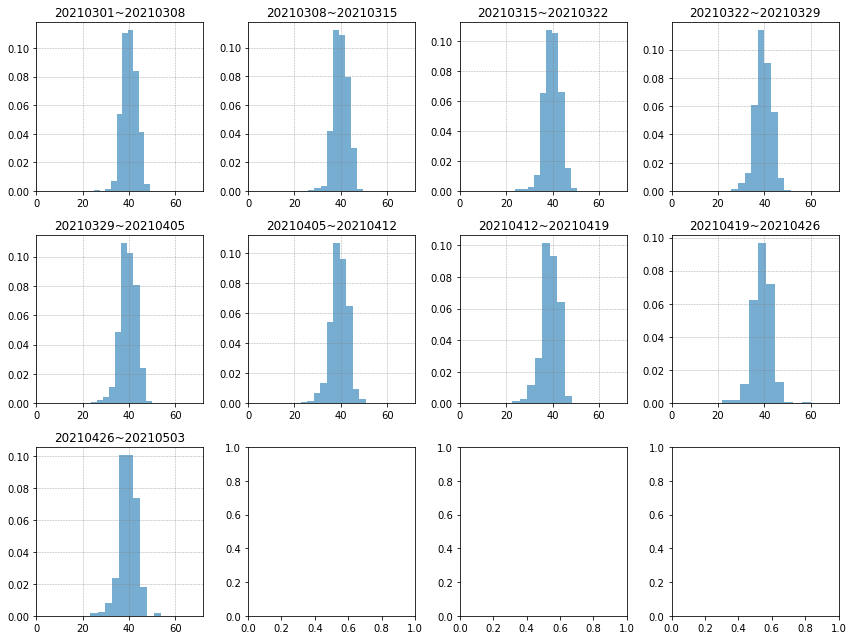

female_count


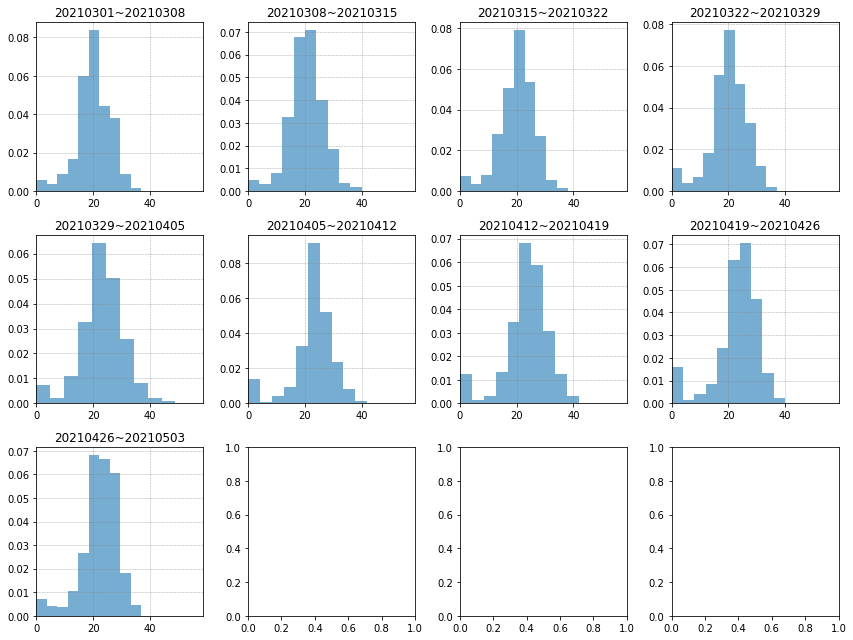

male_count


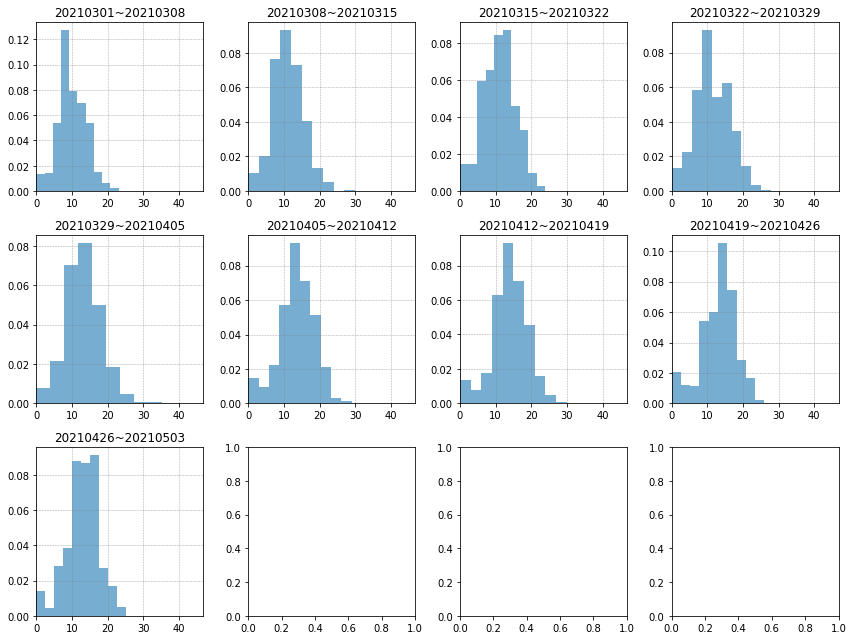

gender_50


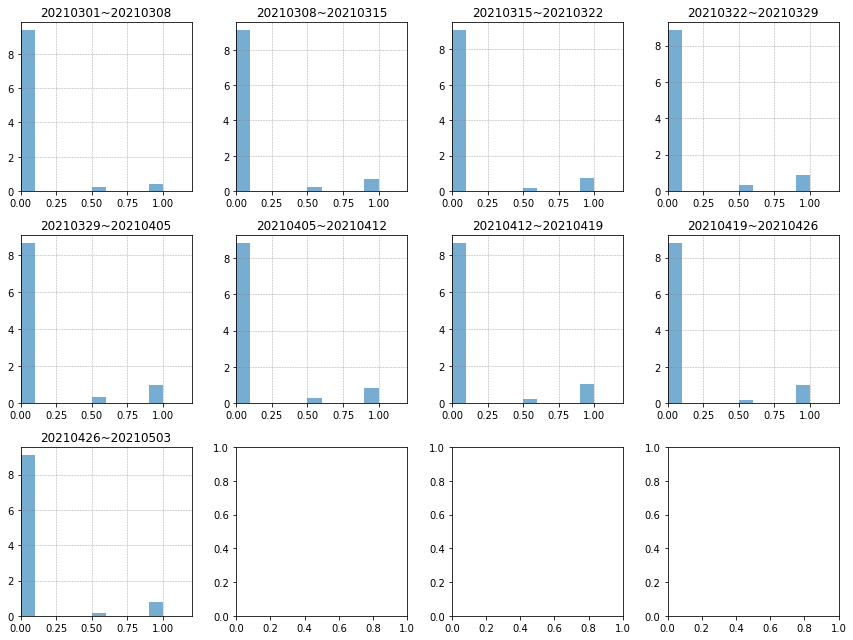

store_type_25


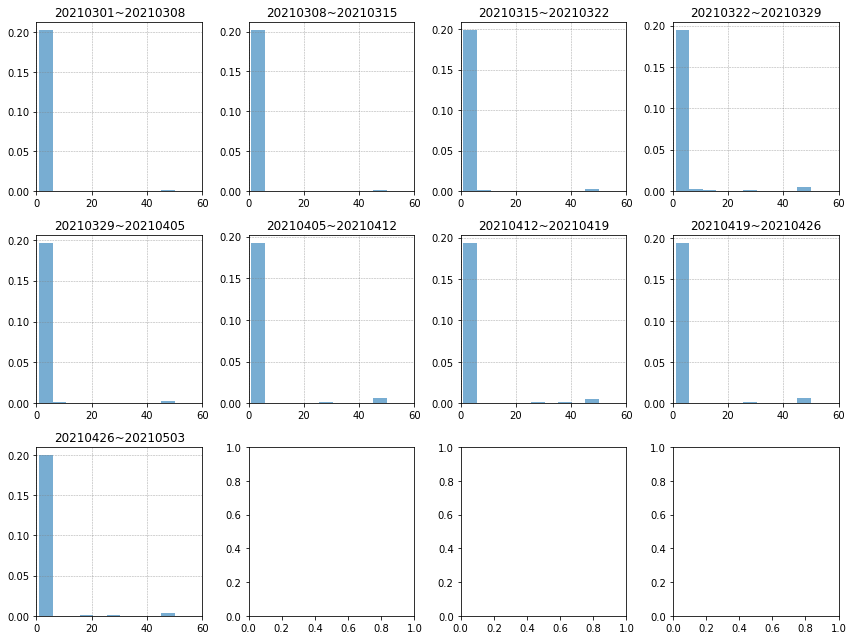

store_type_50


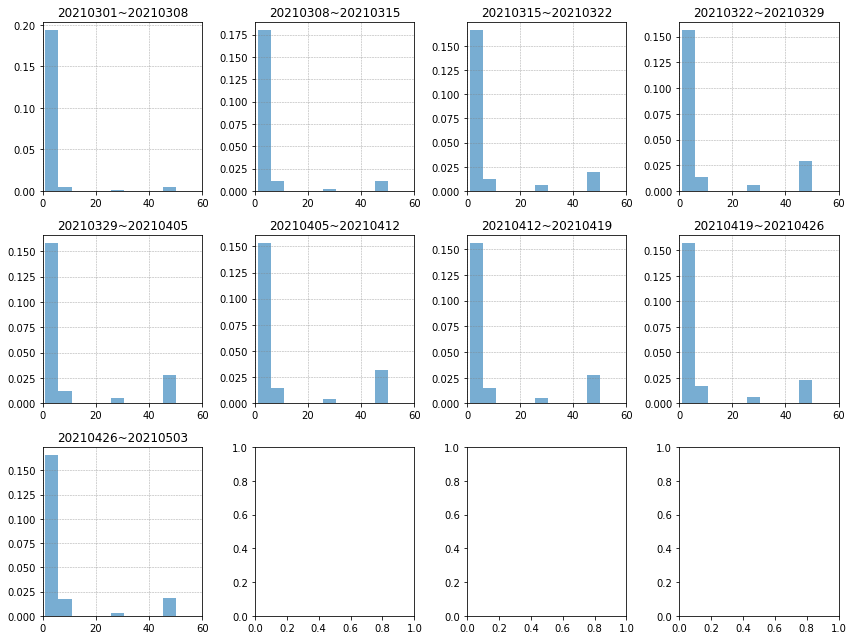

store_type_75


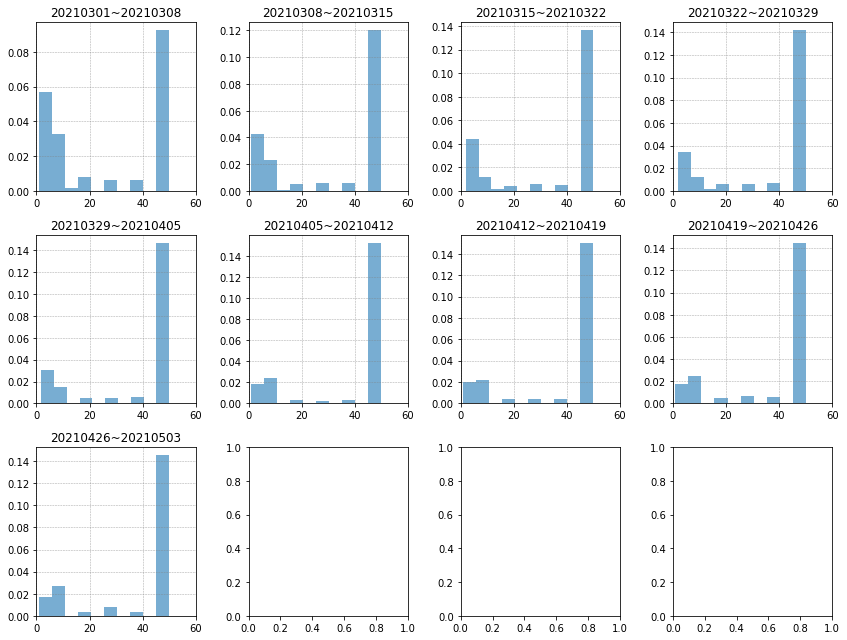

store_type_mean


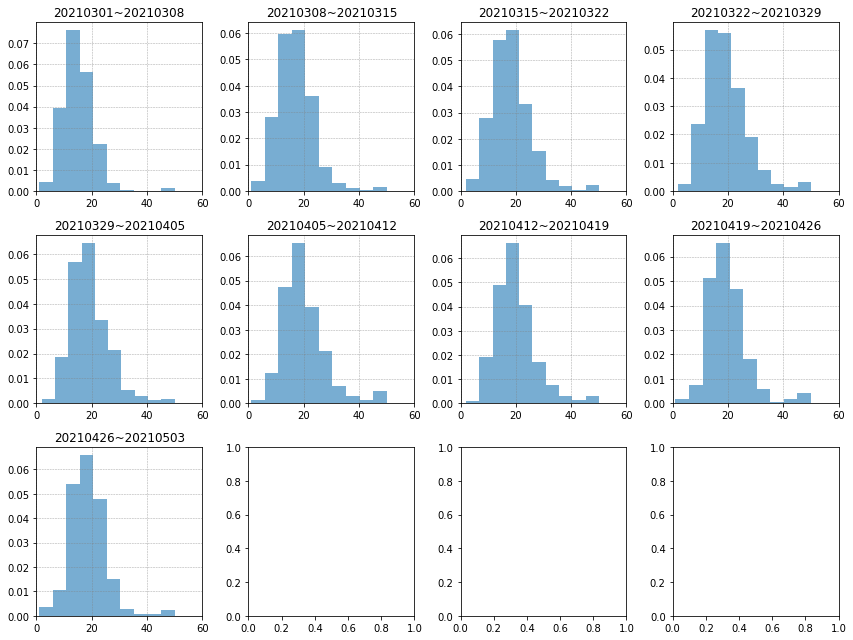

has_store_id_-1


/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.


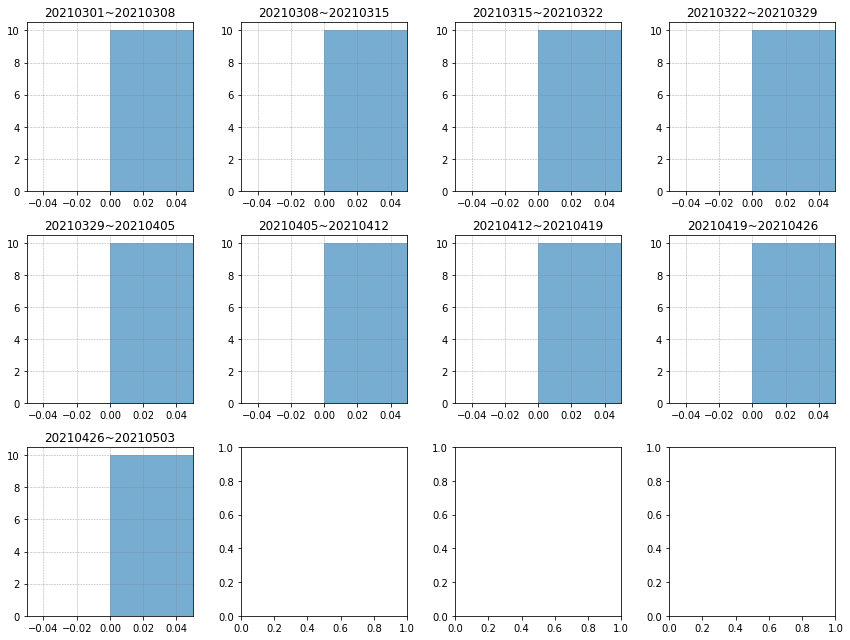

has_store_id_0


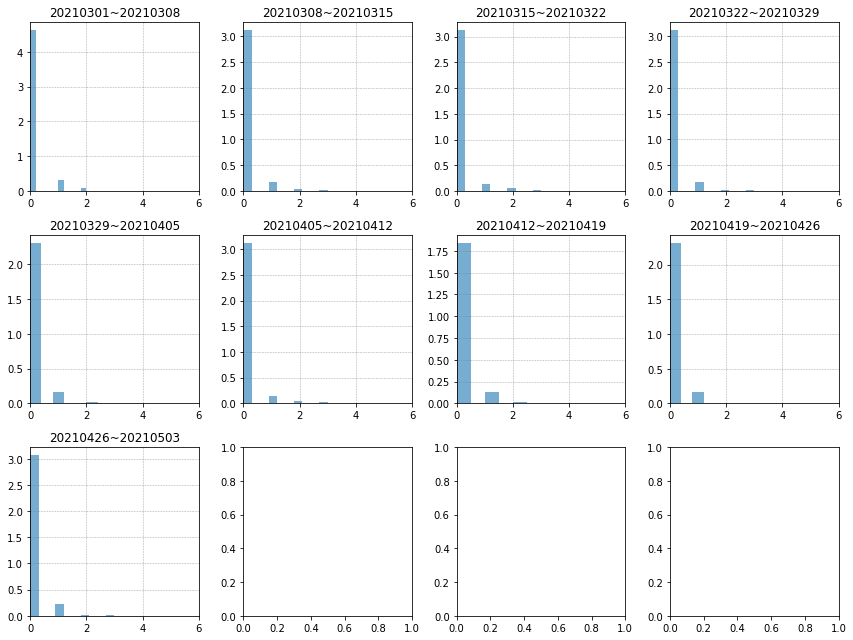

has_store_id_1


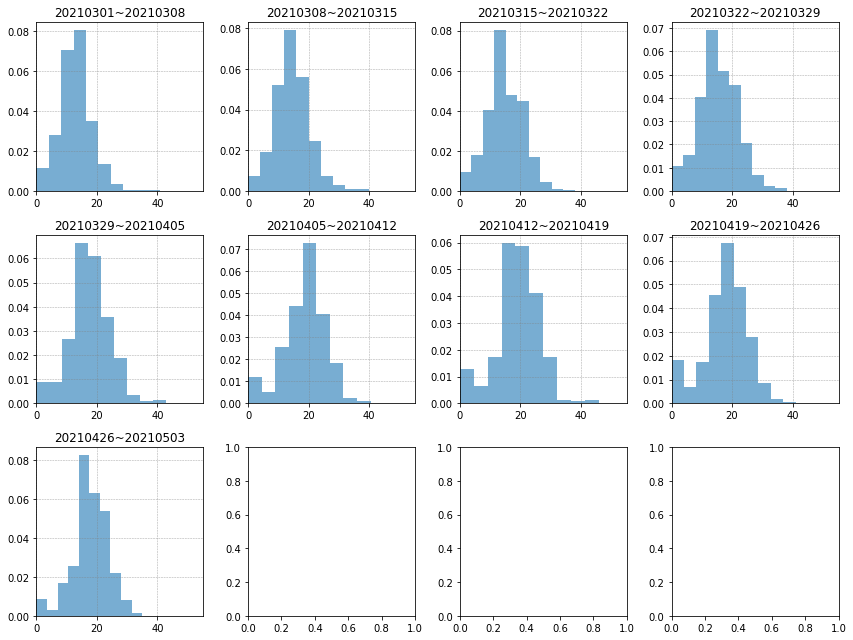

has_store_id_2


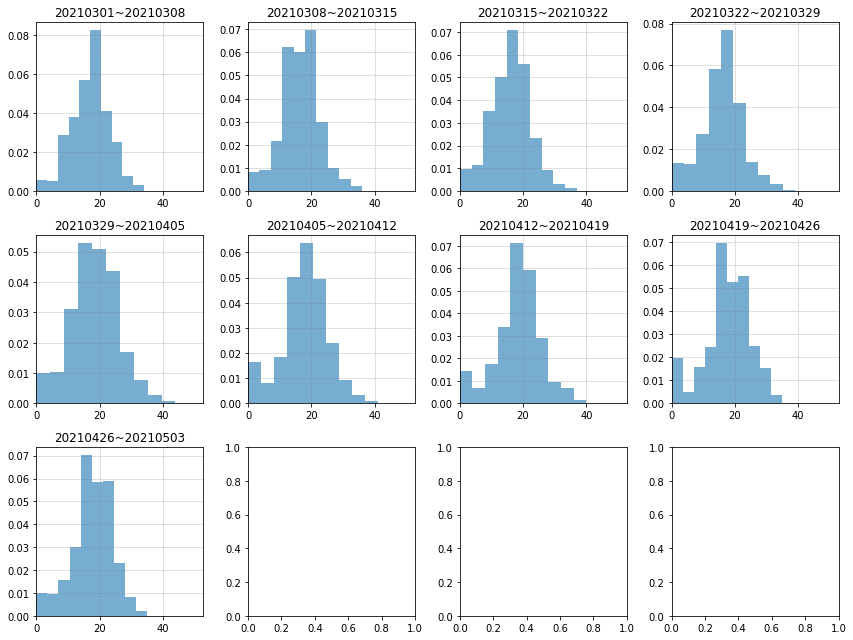

has_store_id_3


/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.


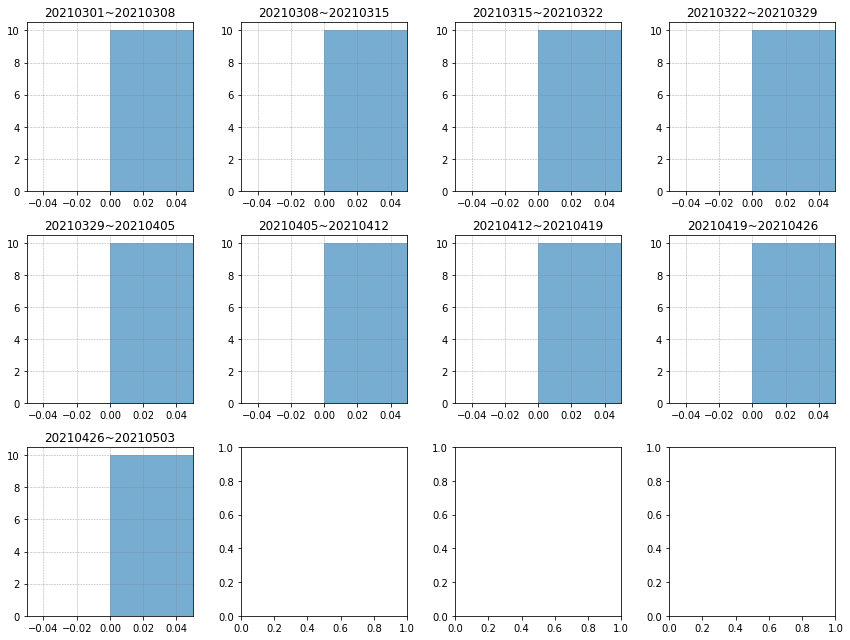

has_store_id_mean


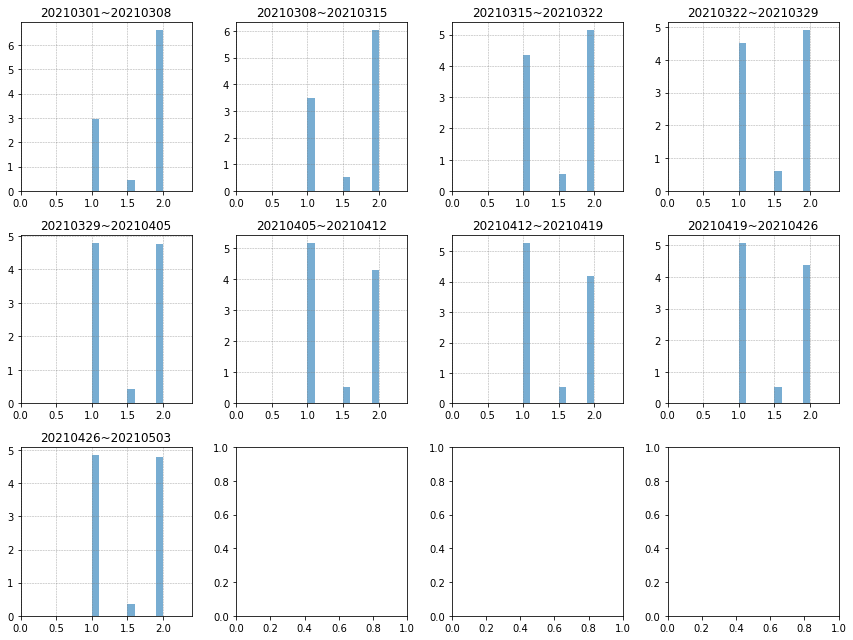

isnot_td_new_count


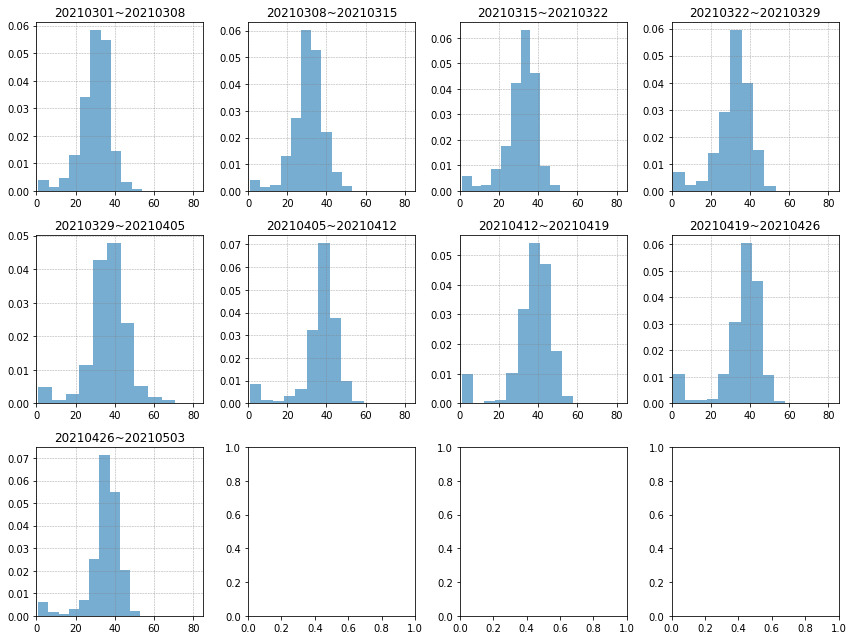

is_td_new_count


/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.


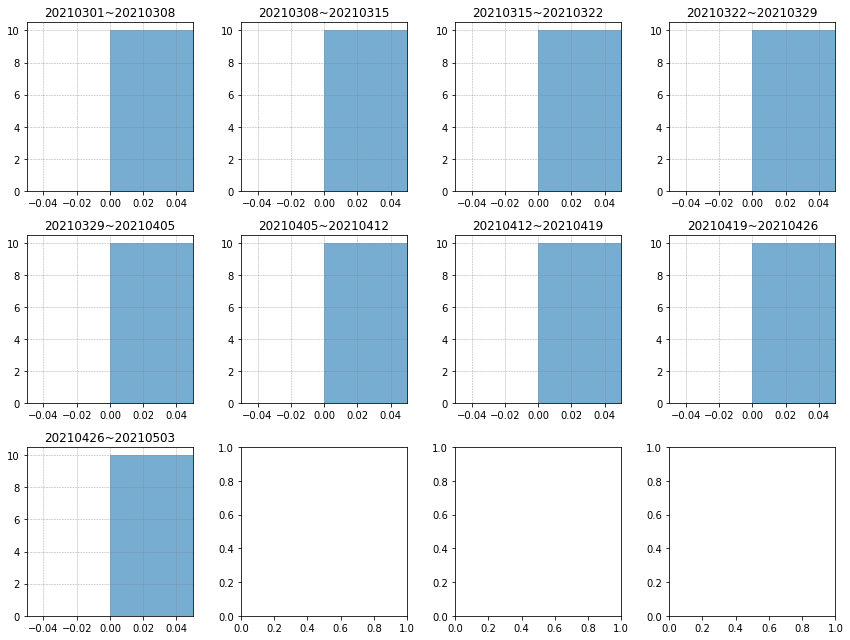

is_td_new_count_mean


/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.


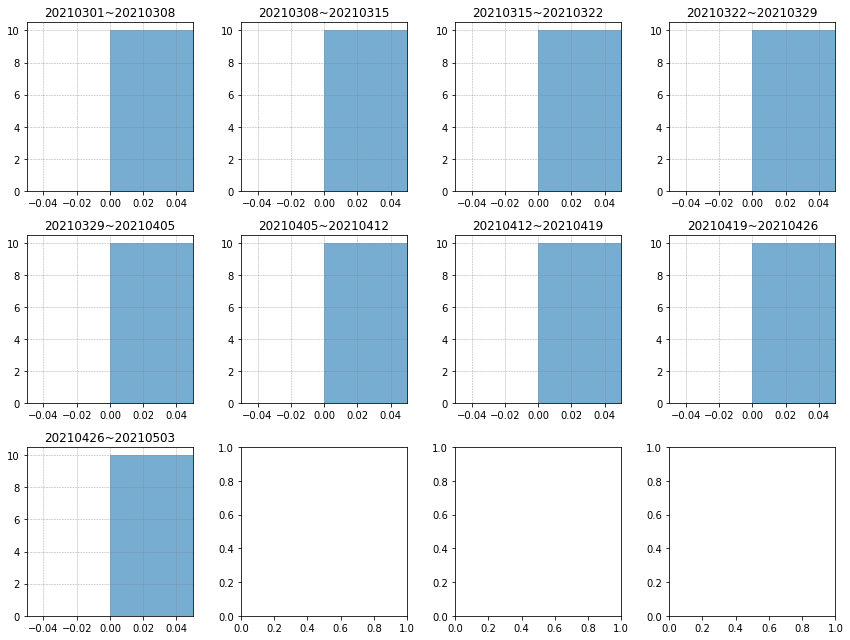

is_month_new_leader


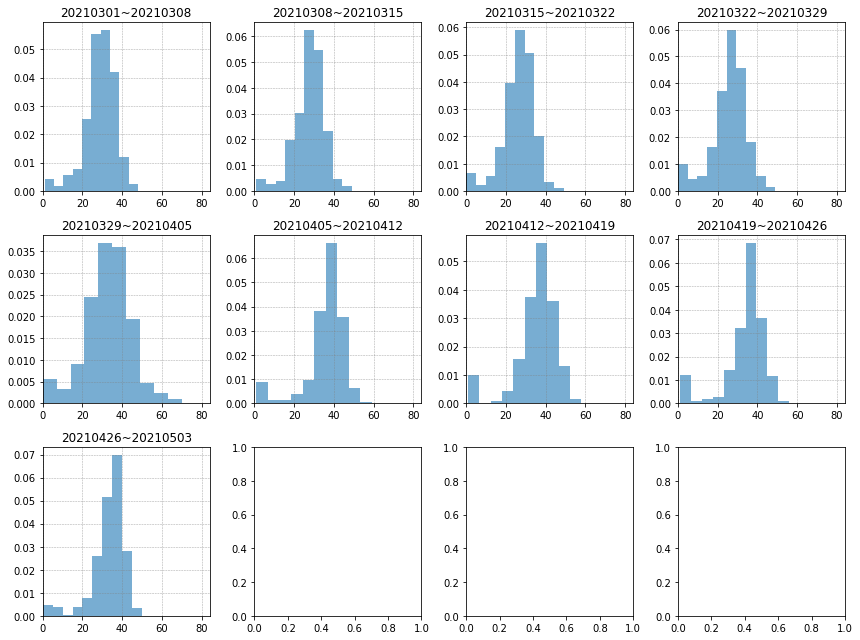

isnot_month_new_leader


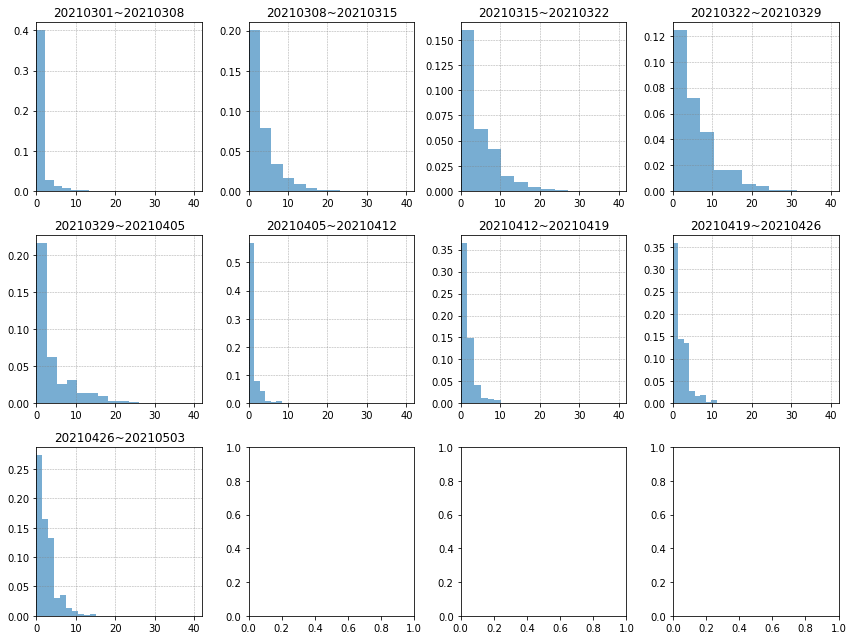

is_month_new_leader_mean


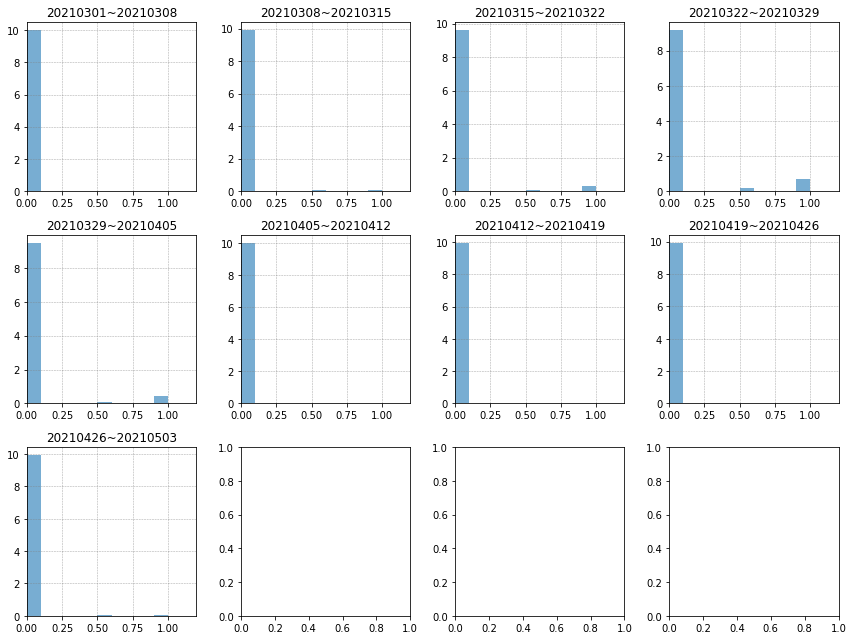

delivery_id_1


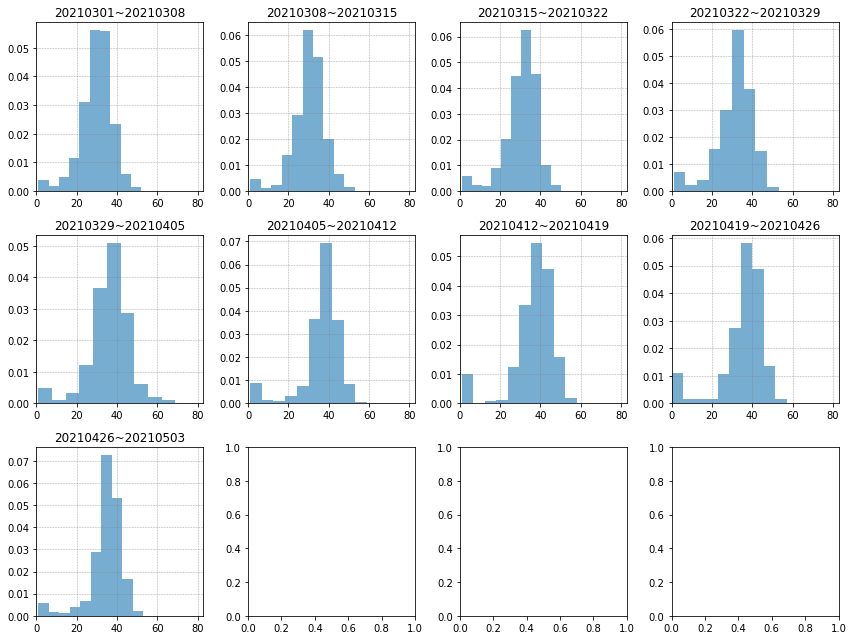

delivery_id_2


/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel_launcher.py:45: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.


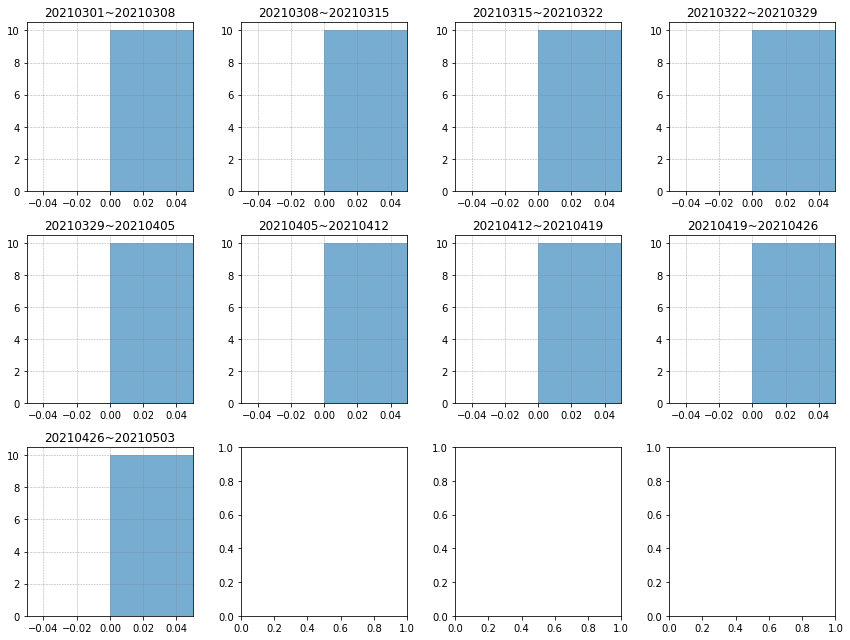

delivery_id_3


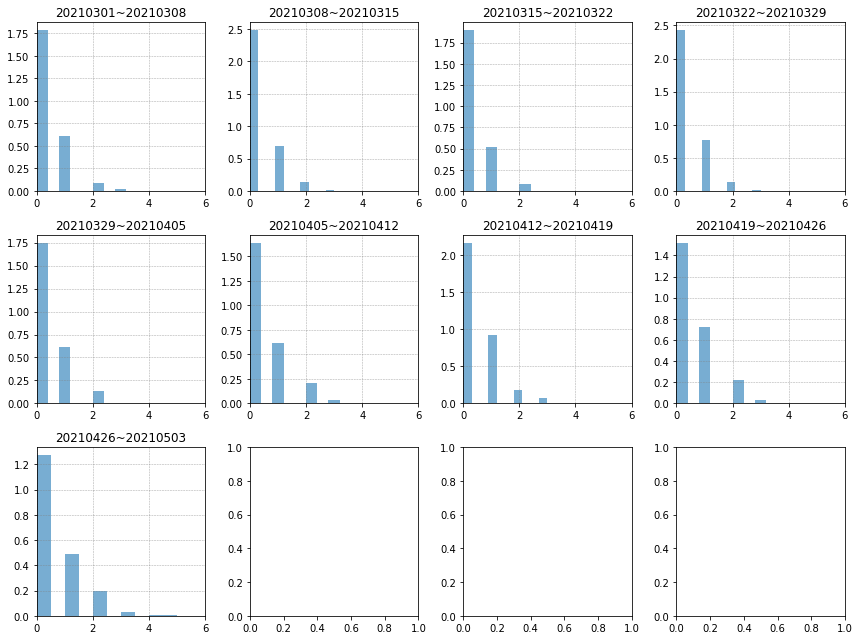

delivery_id_mean


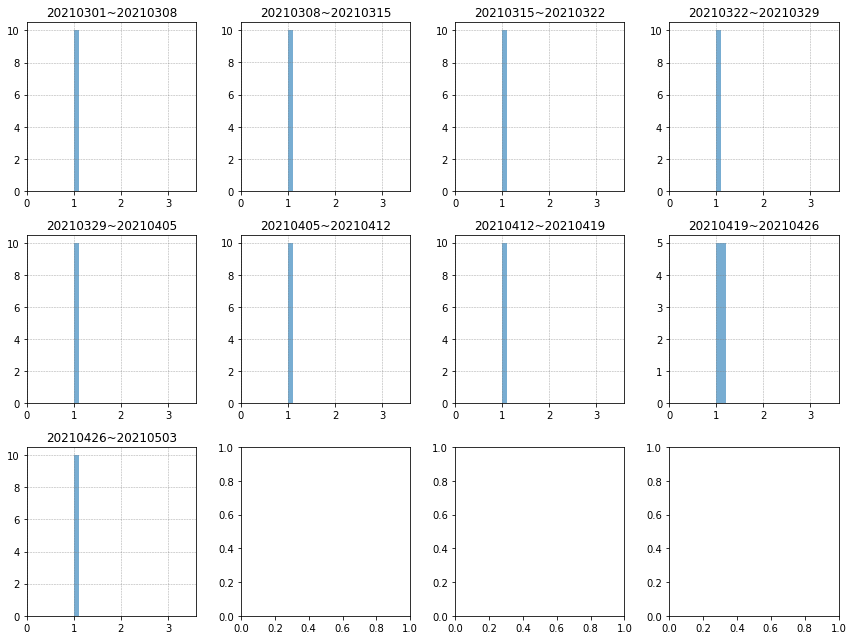

num_sum_25


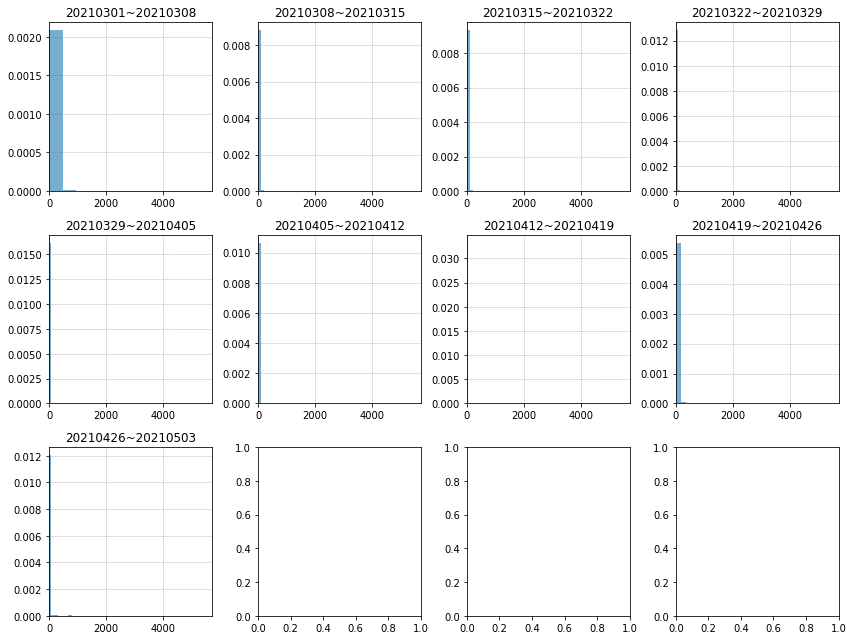

num_sum_50


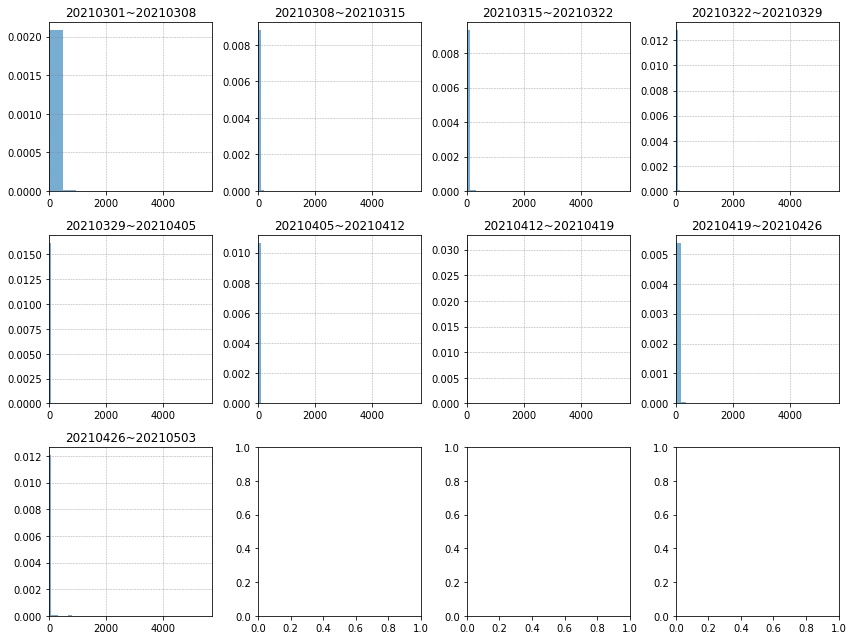

num_sum_75


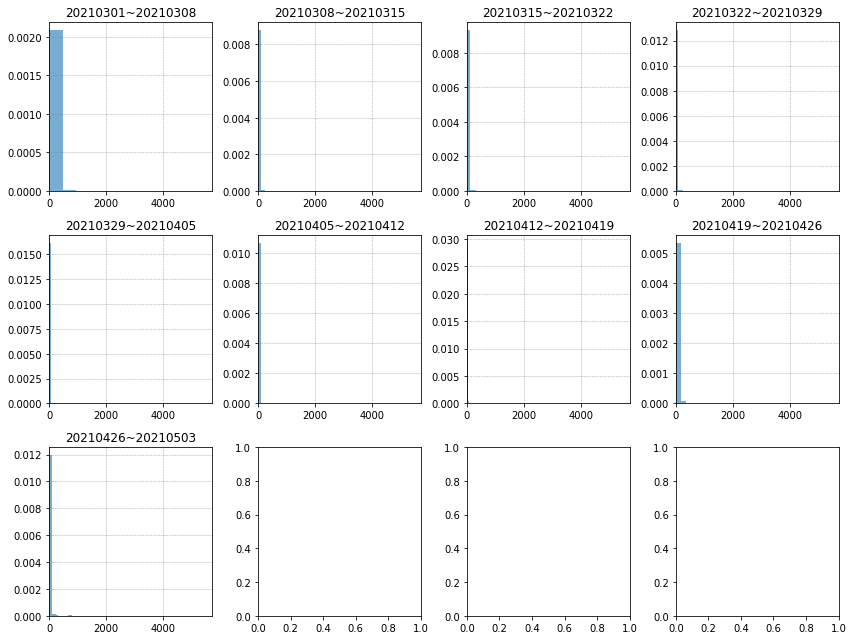

num_sum_mean


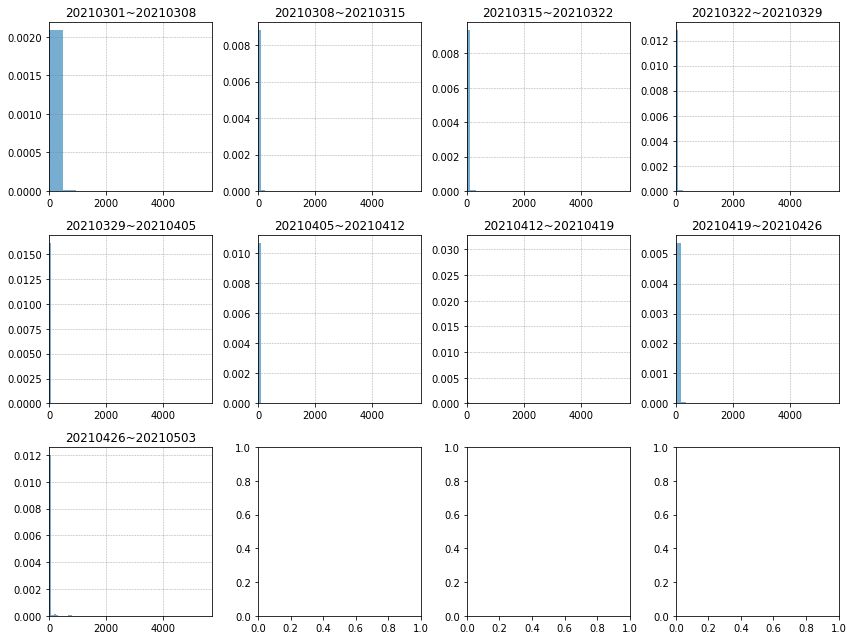

sku_cnt_25


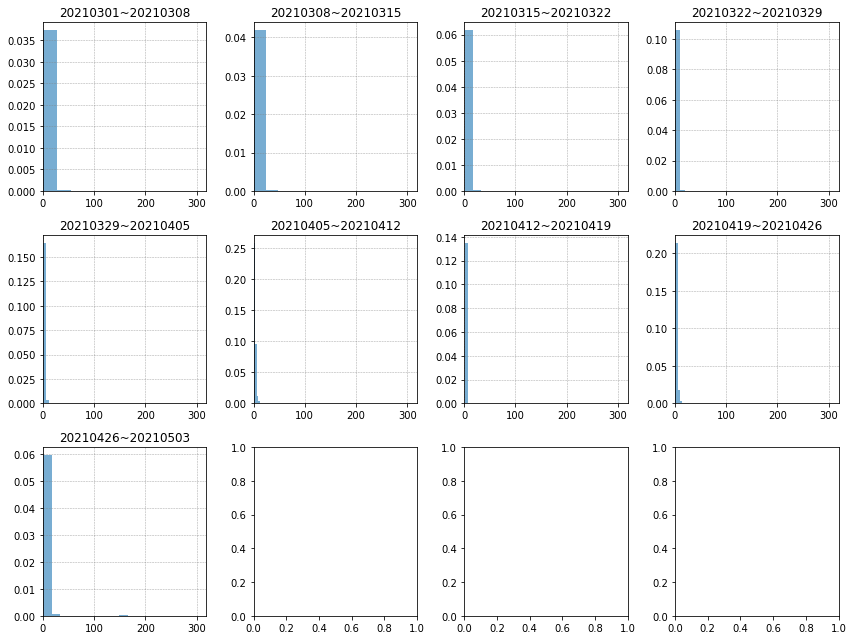

sku_cnt_50


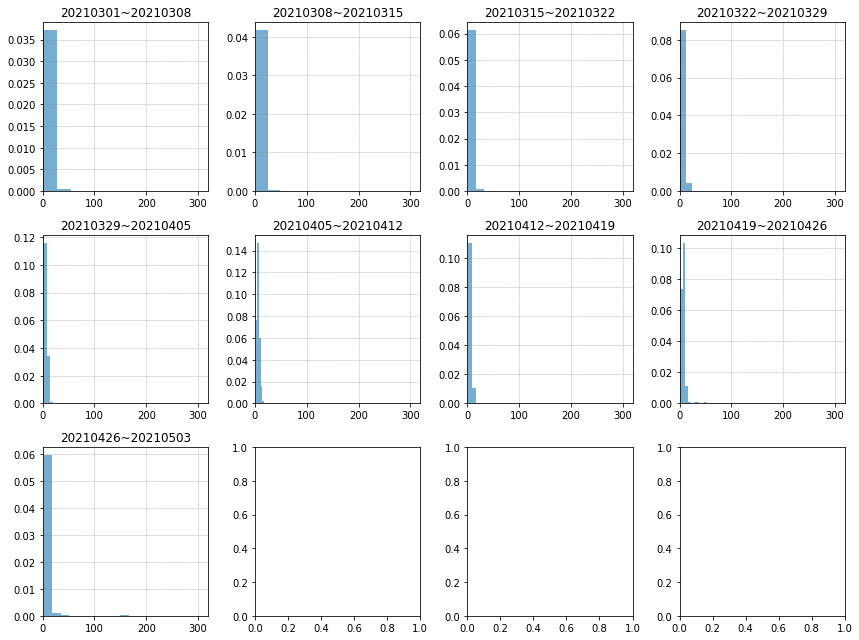

sku_cnt_75


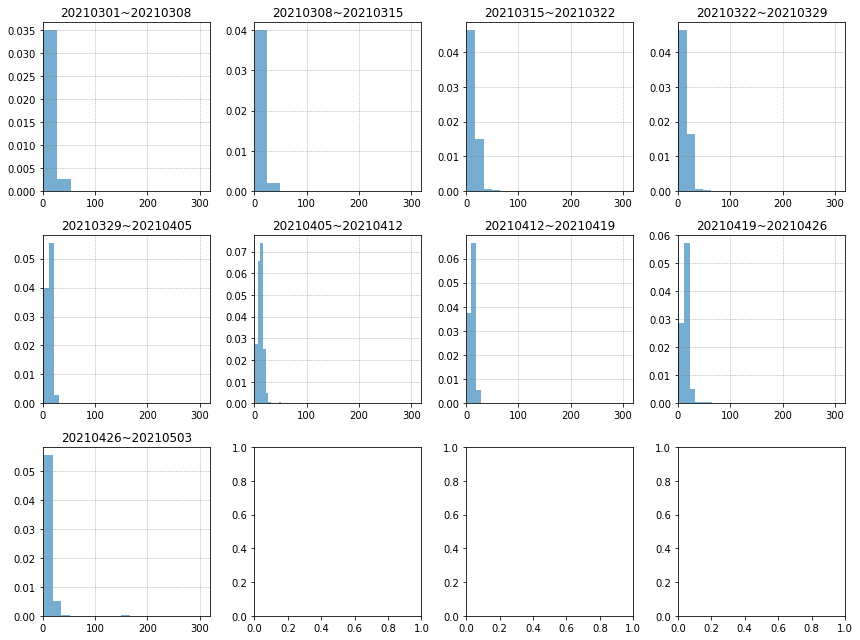

sku_cnt_mean


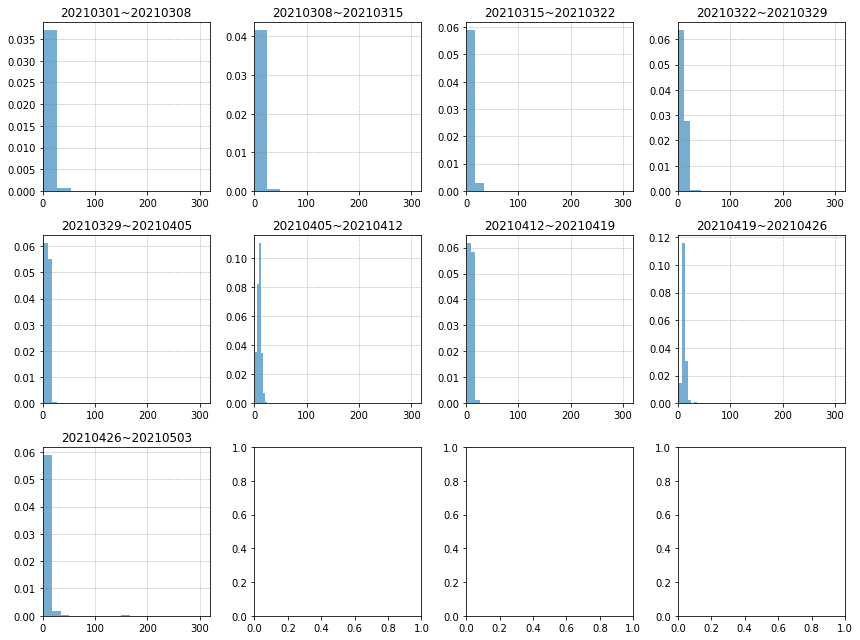

user_cnt_25


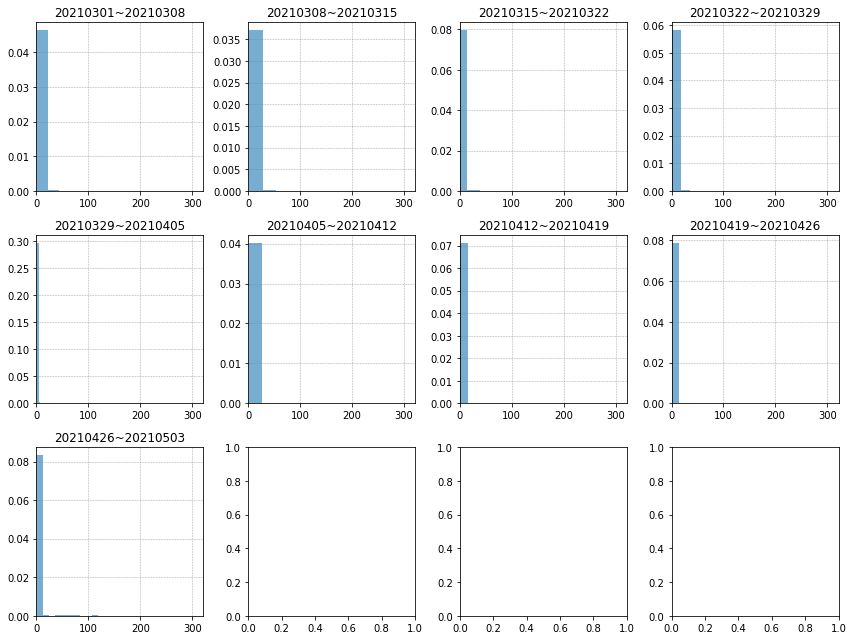

user_cnt_50


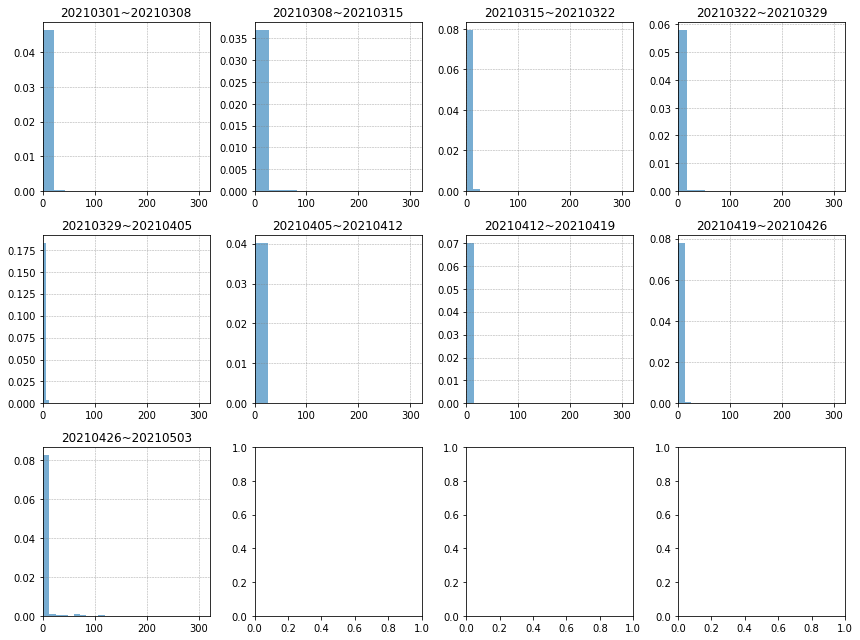

user_cnt_75


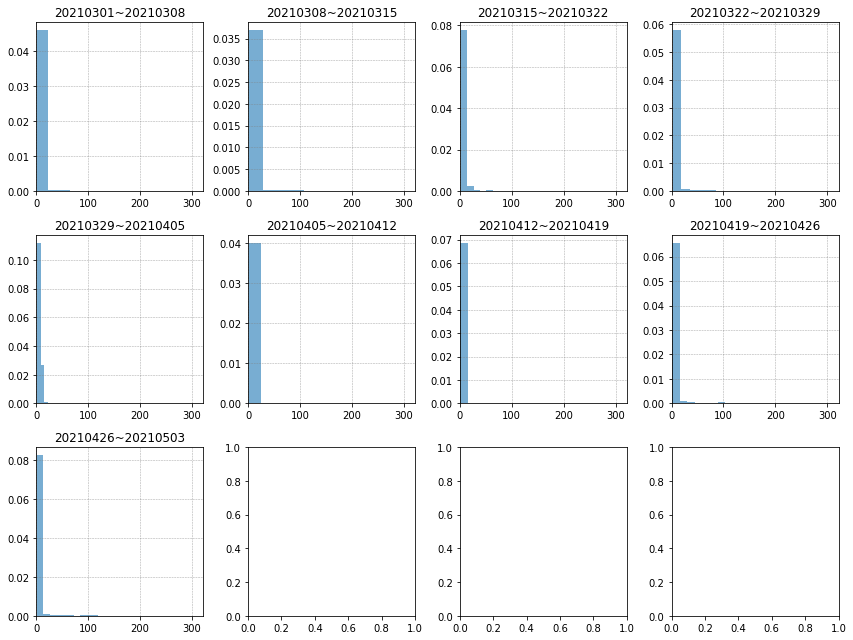

user_cnt_mean


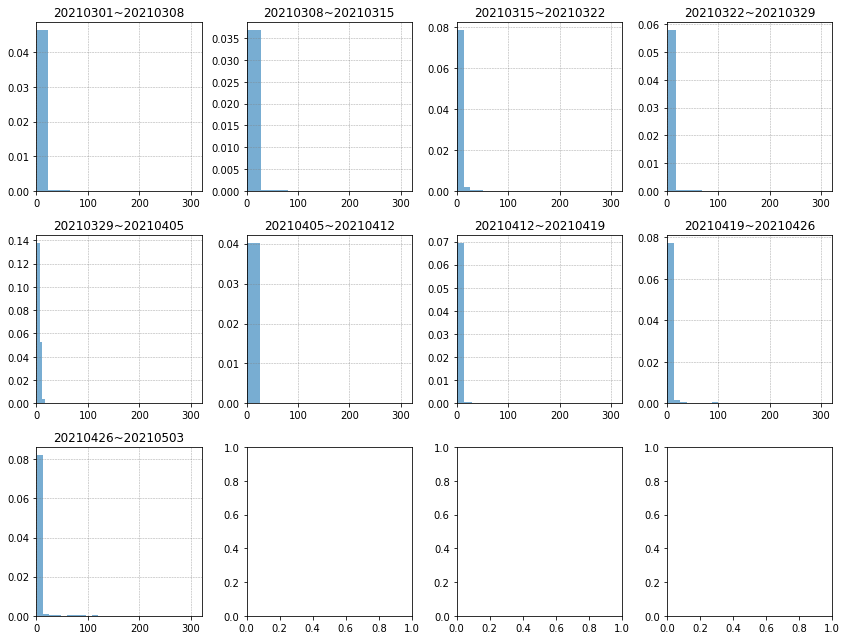

gmv_25


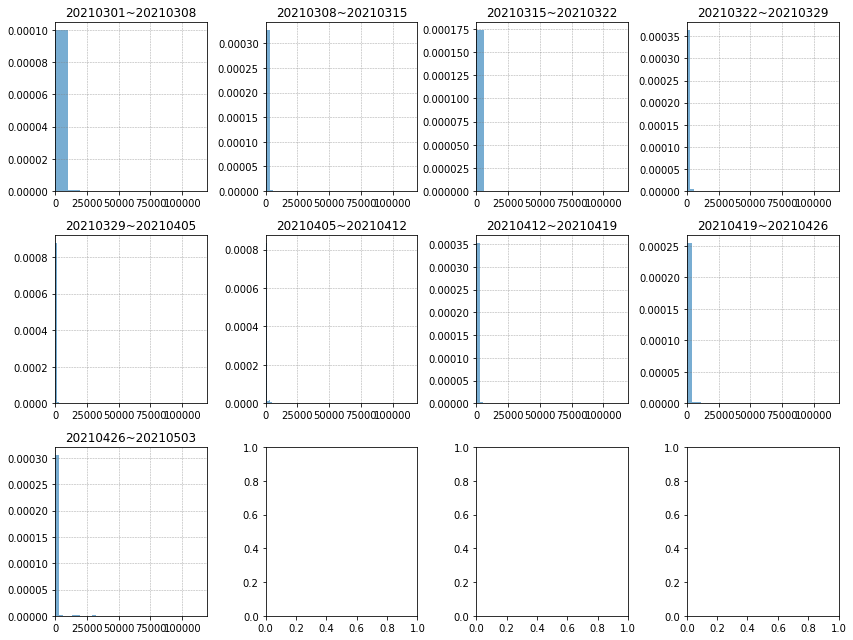

gmv_50


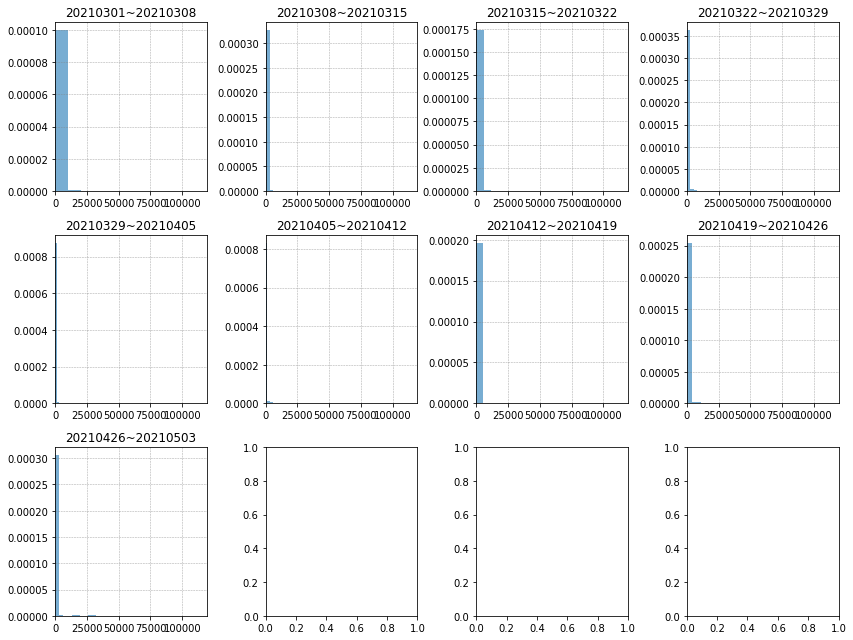

gmv_75


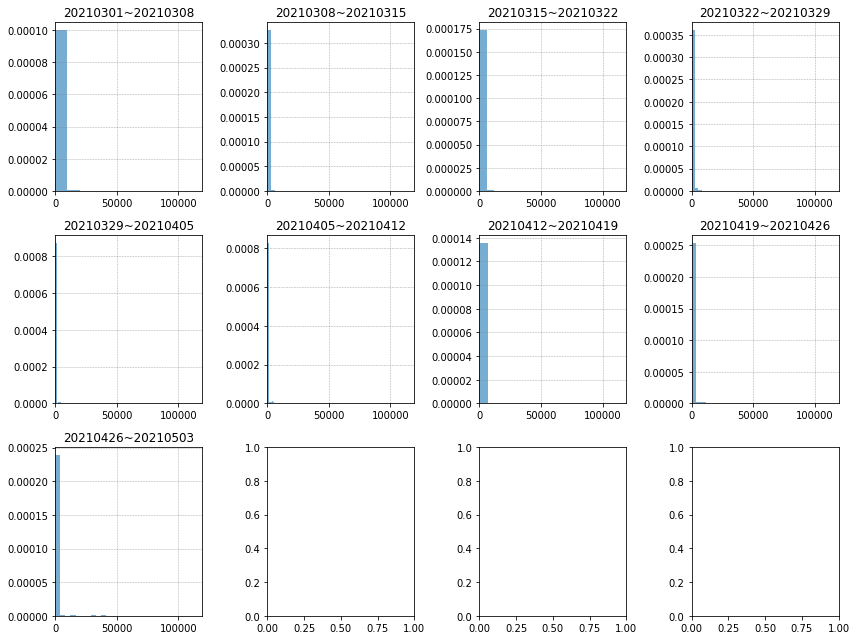

gmv_mean


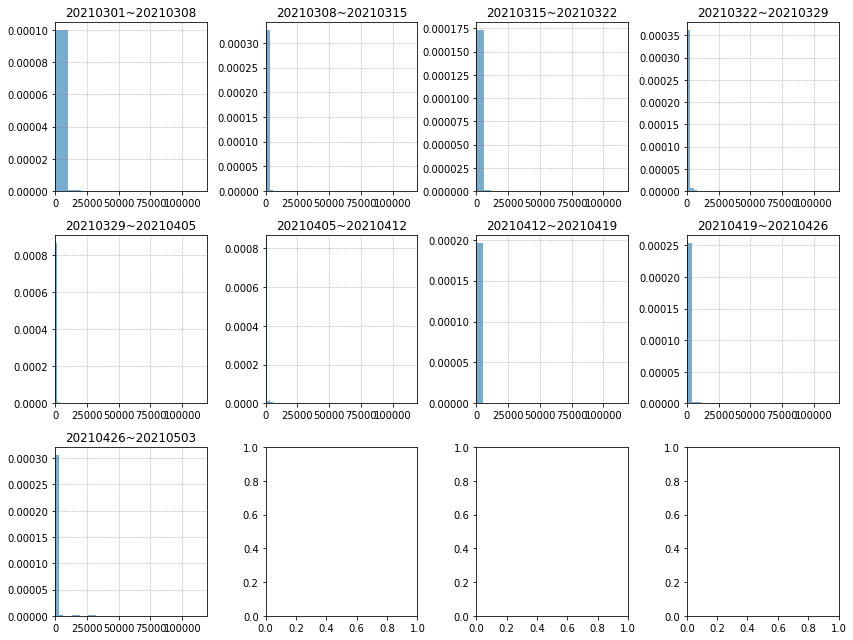

leader_uid_cnt


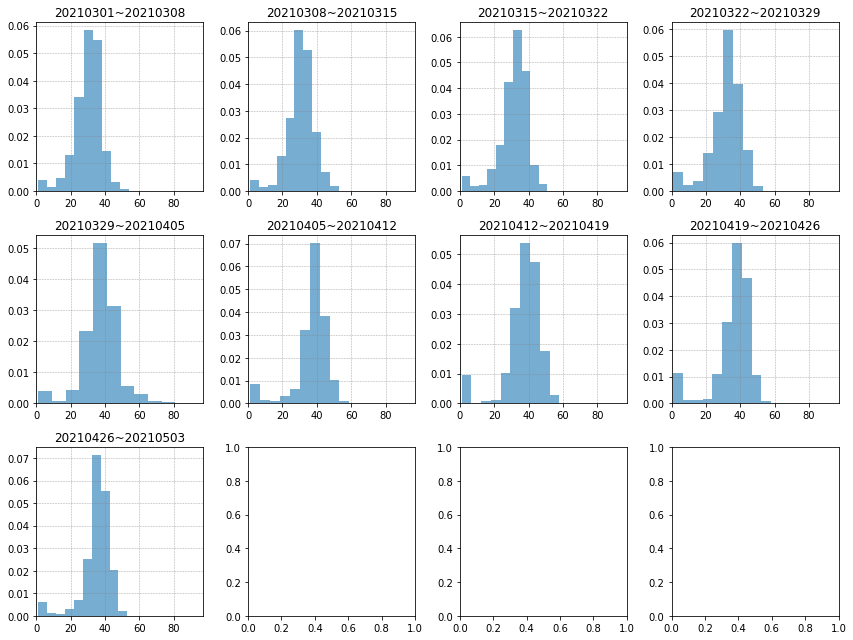

line_num_sum


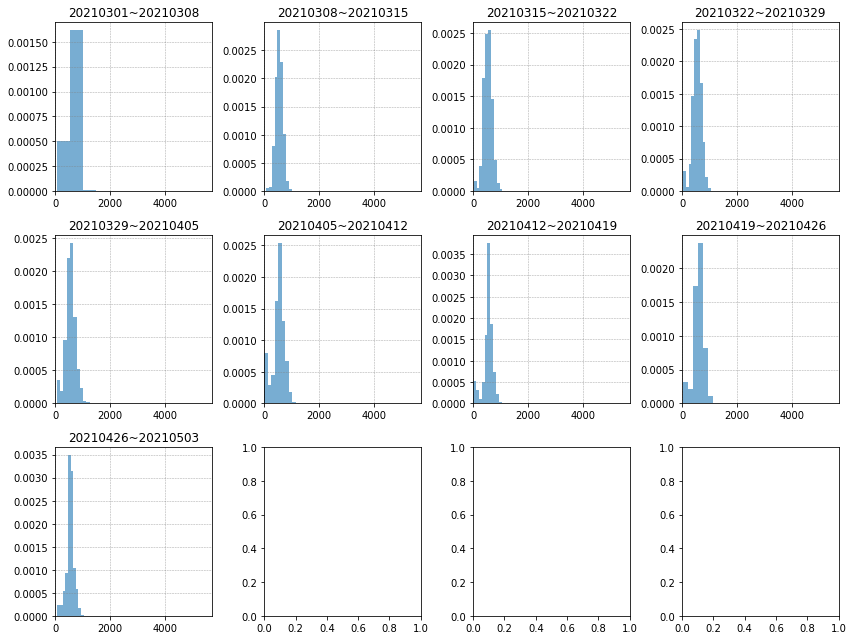

line_gmv


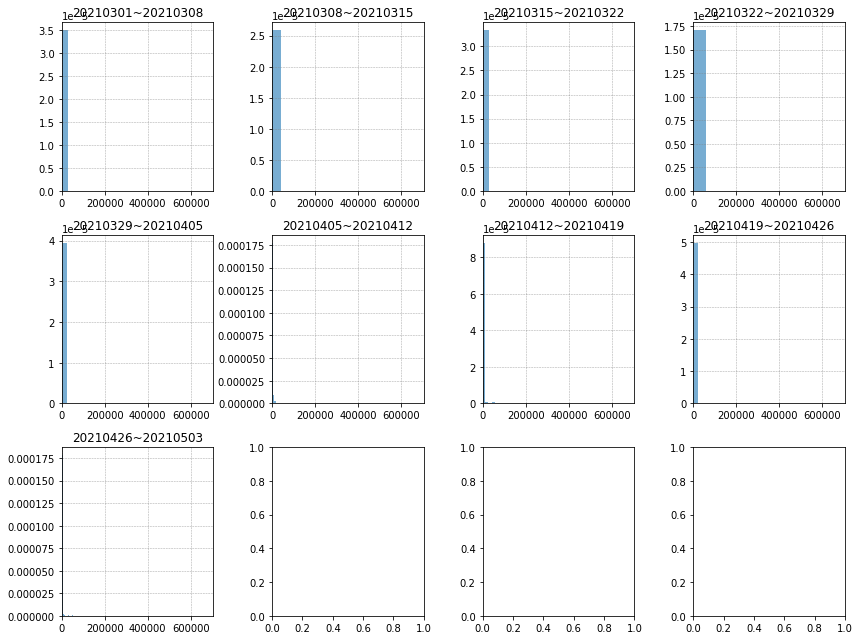

line_sku_cnt


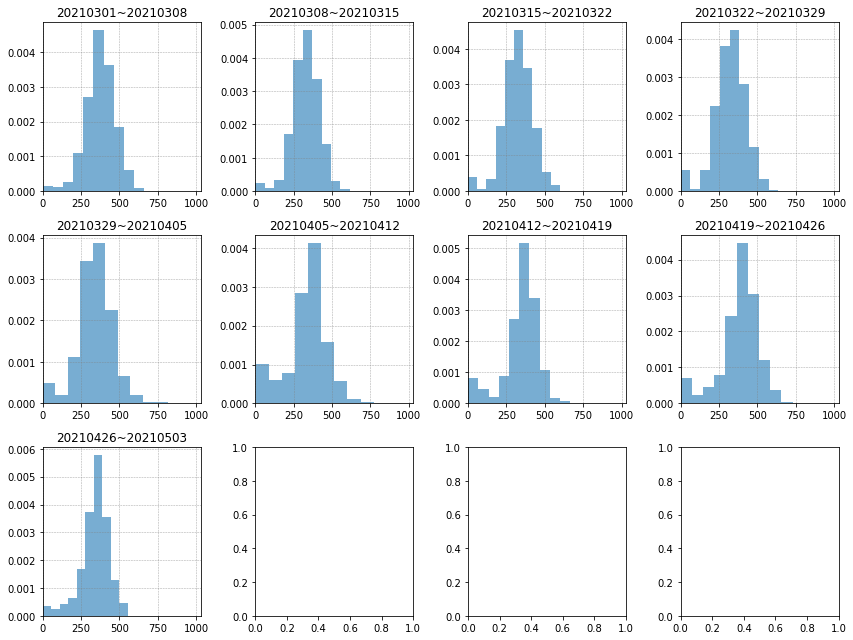

fruits_count


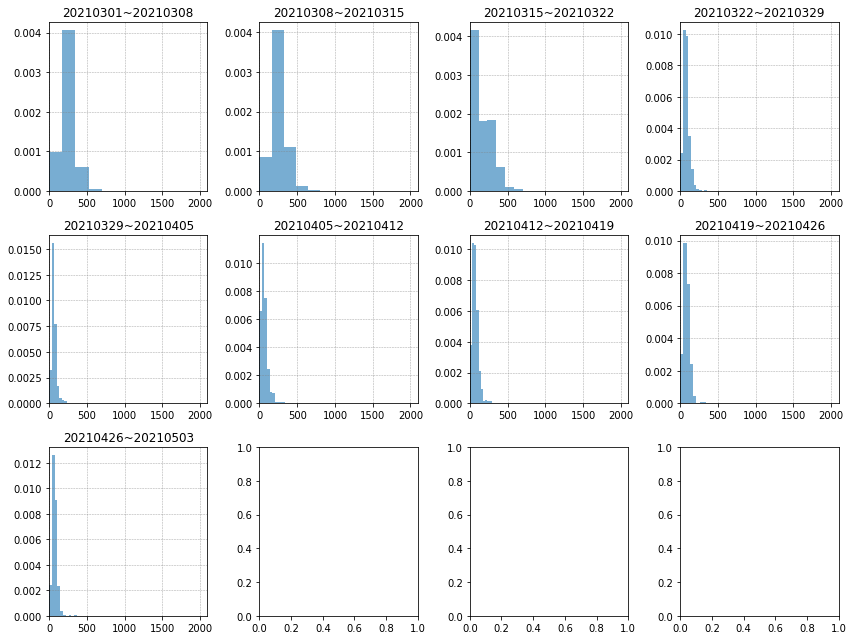

vgtble_count


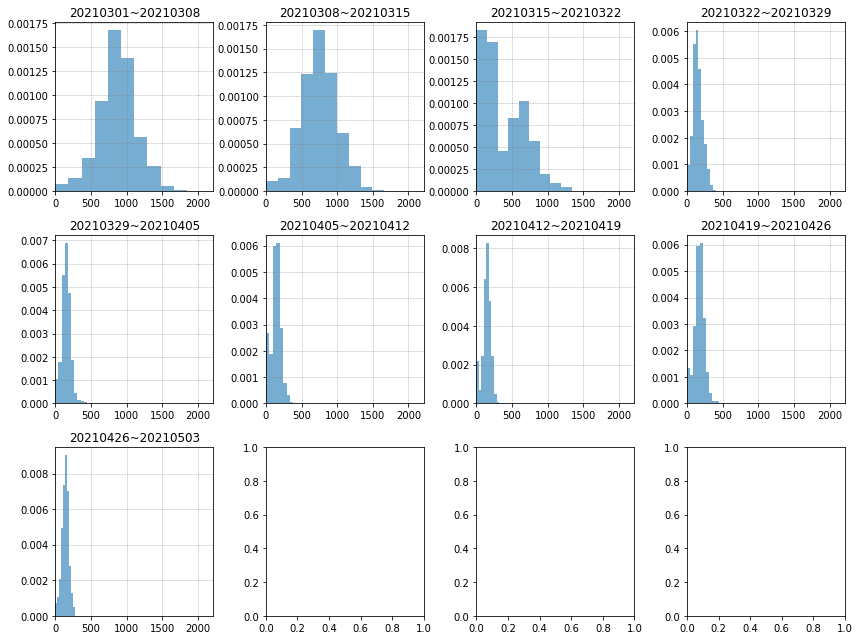

fresh_count


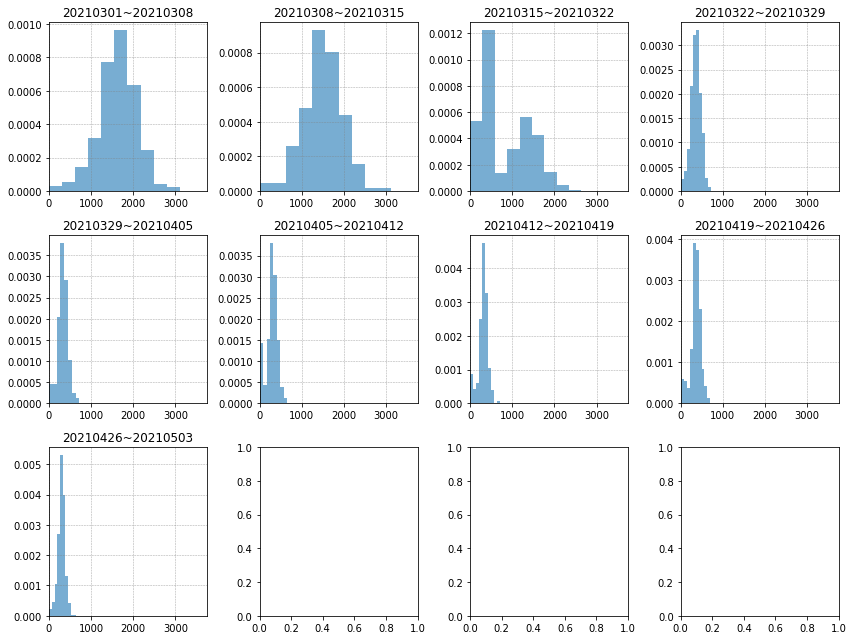

category_id_count


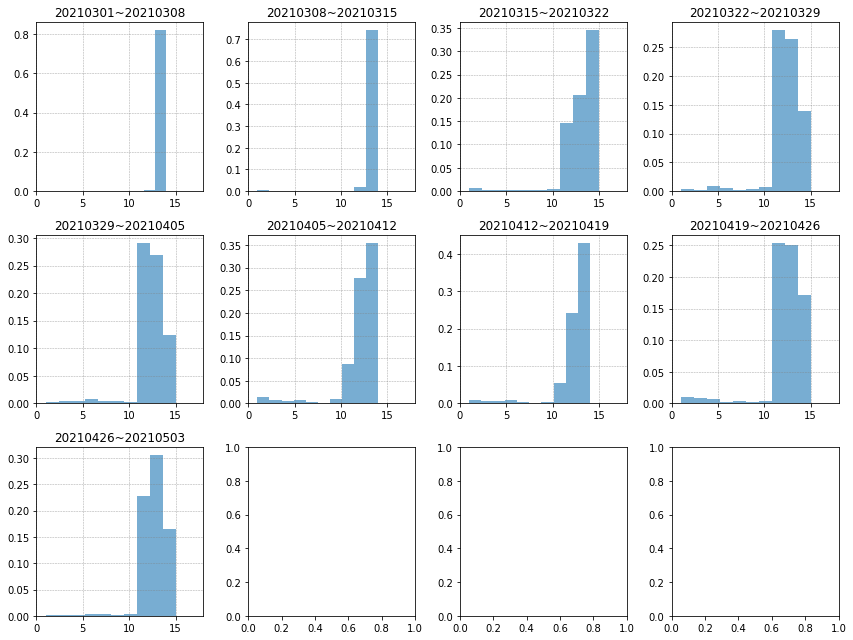

refrigeration_type_0


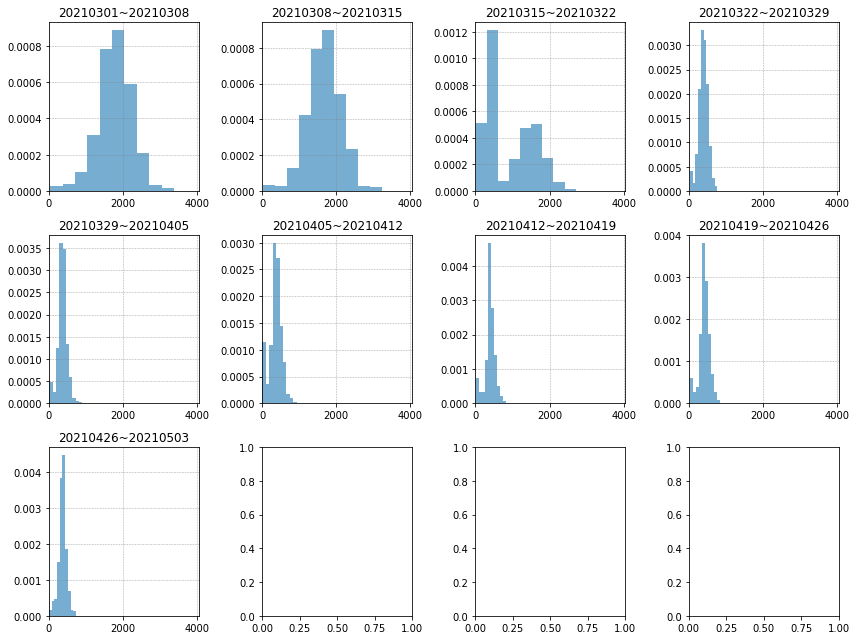

refrigeration_type_1


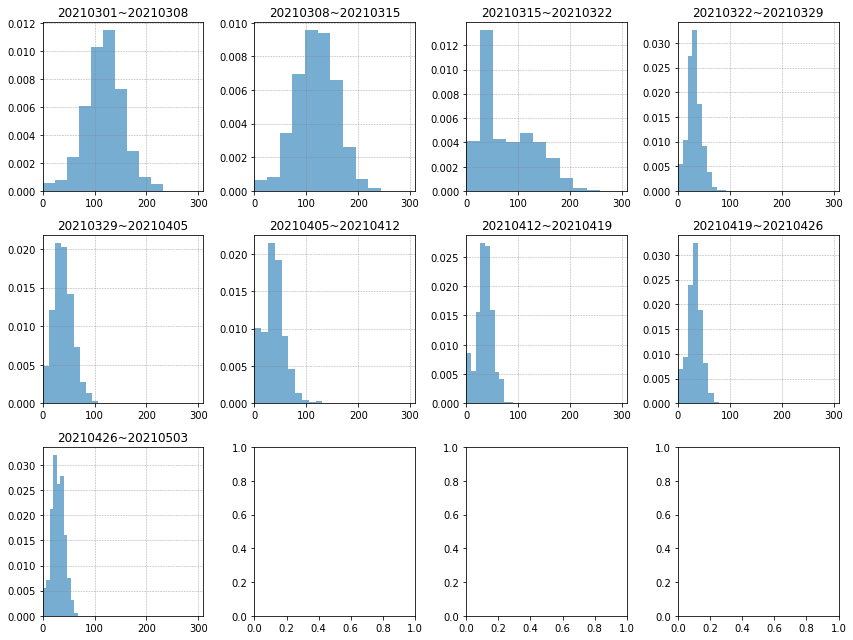

refrigeration_type_2


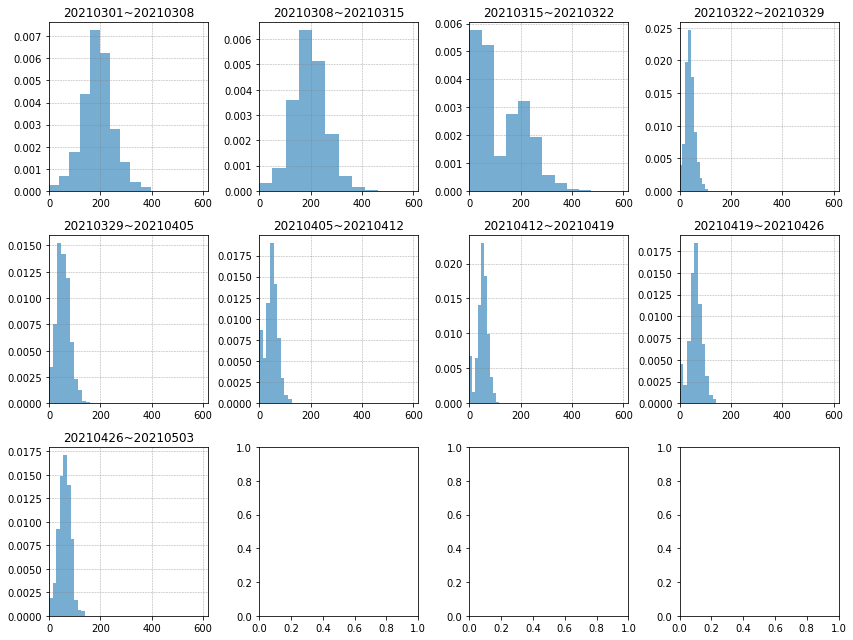

refrigeration_type_3


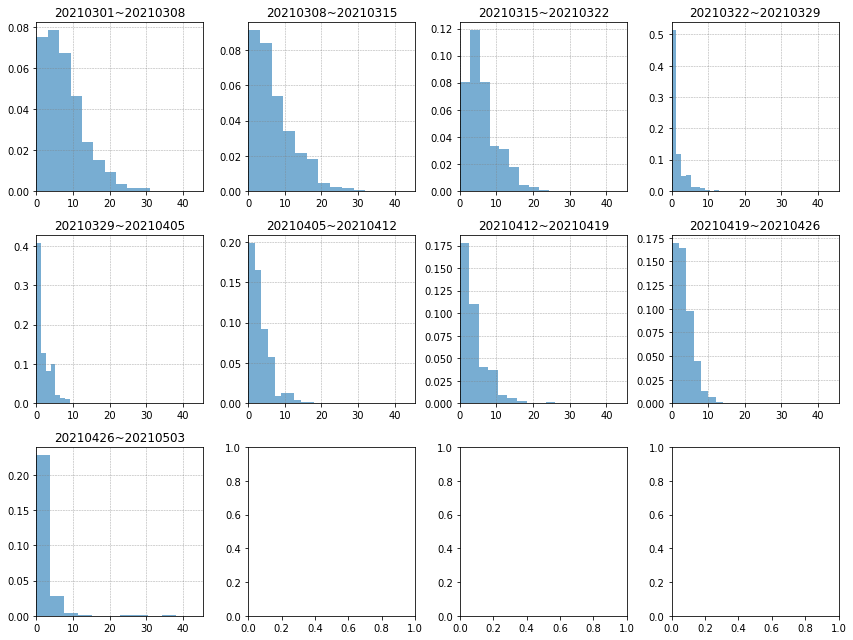

first_eta


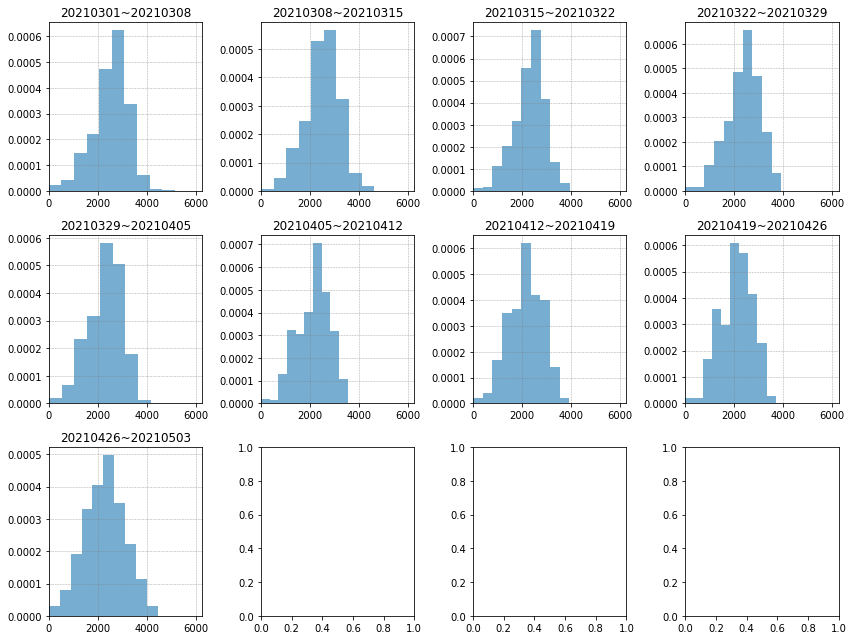

first_length


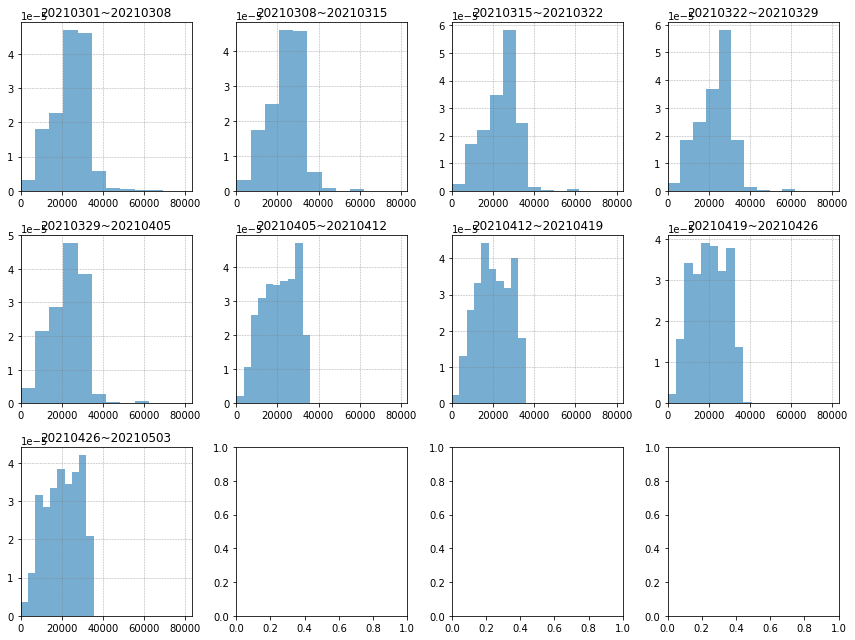

leader_eta


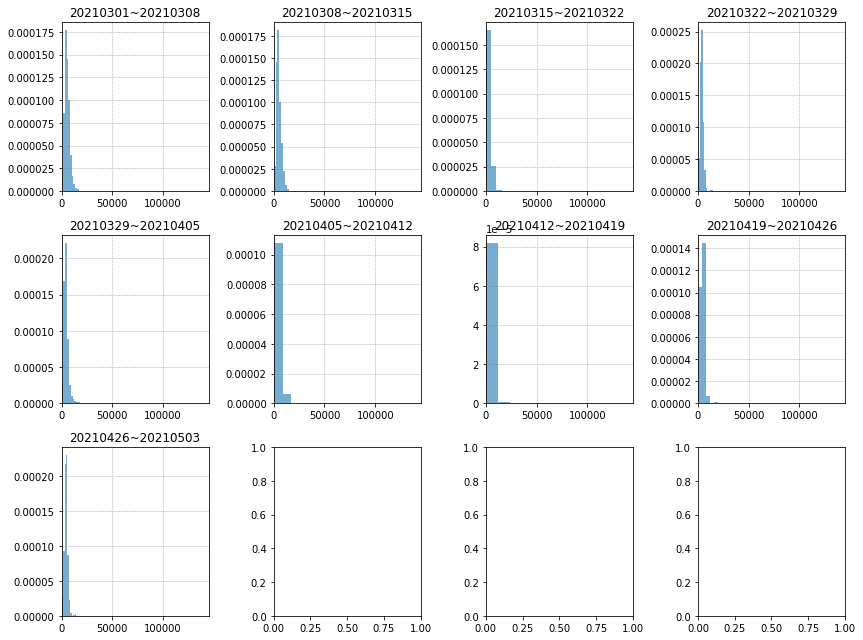

leader_length


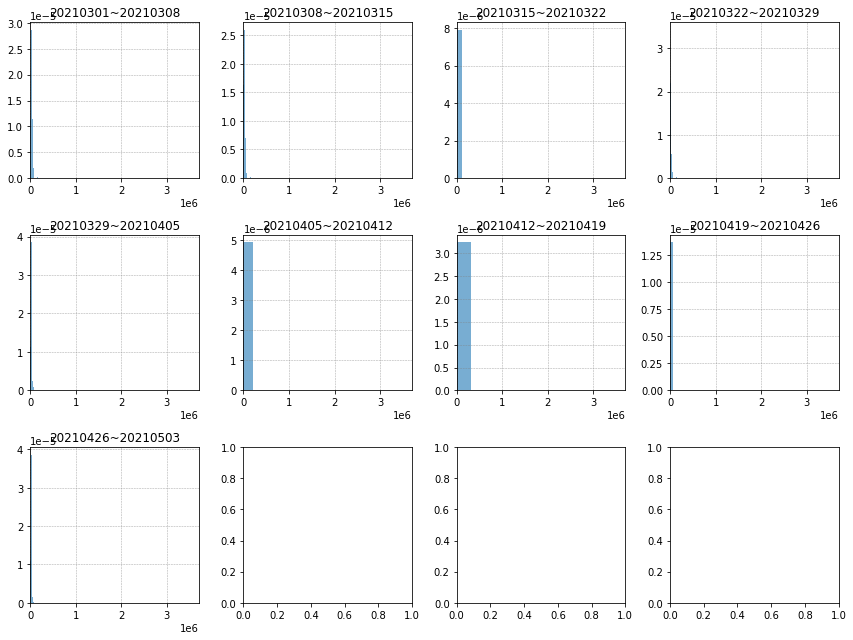

label


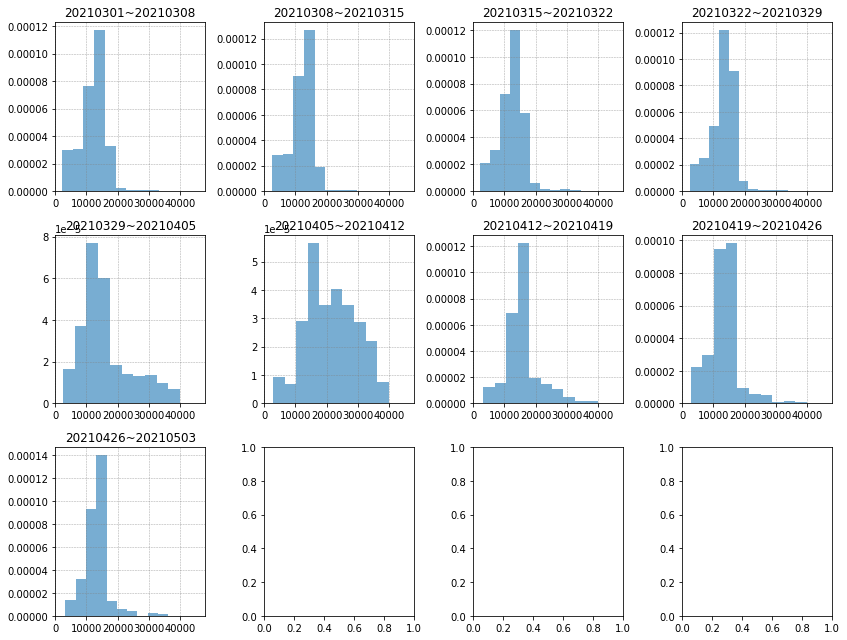

date


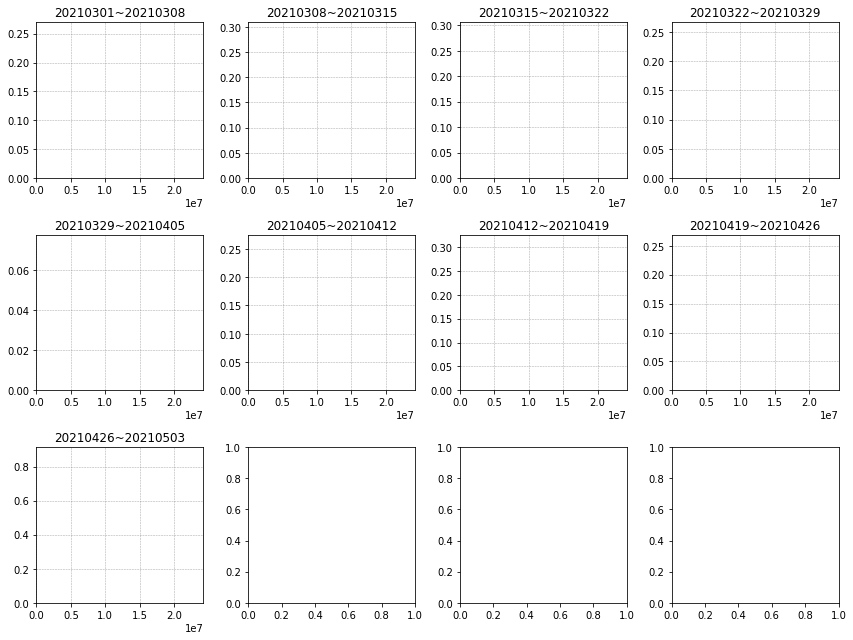

all_due_time


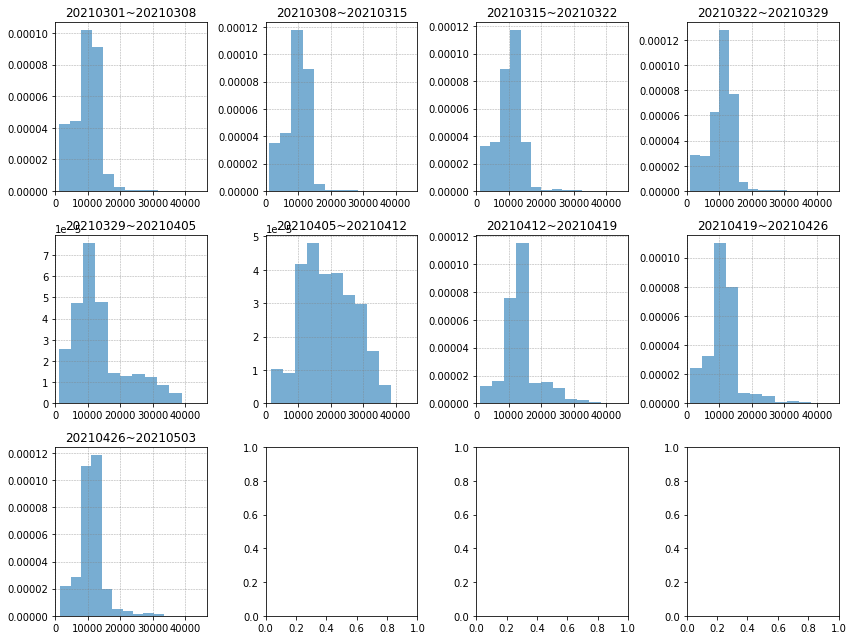

assemble_eta


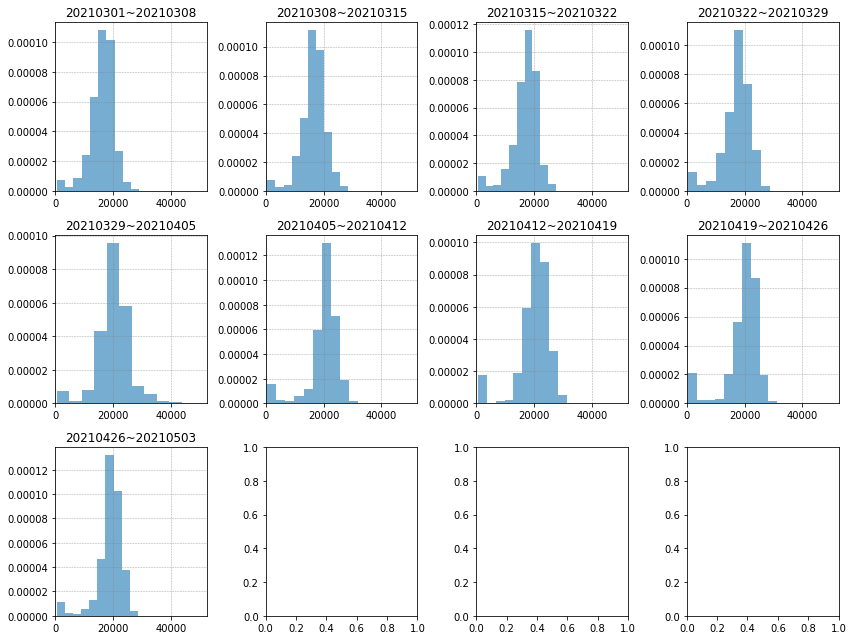

first_order_num


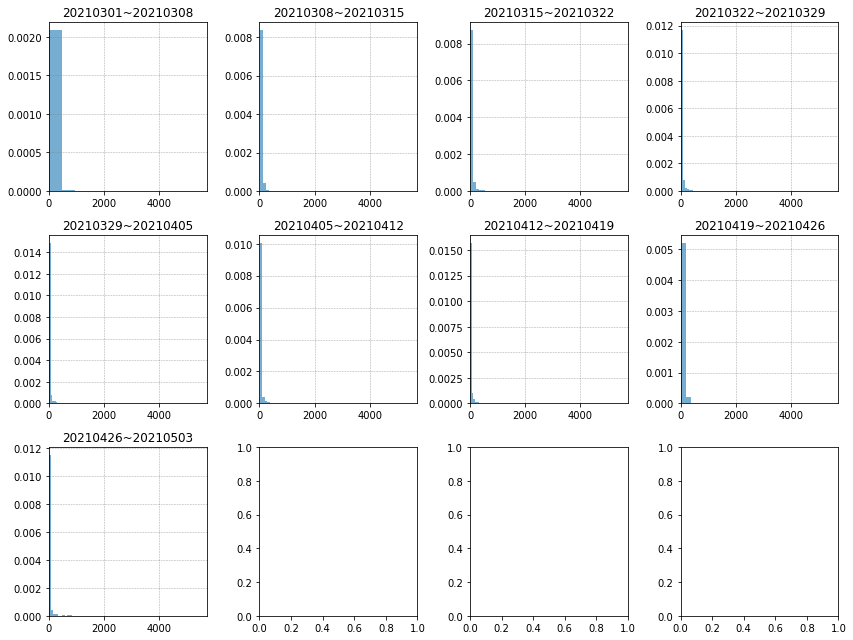

middle_order_num


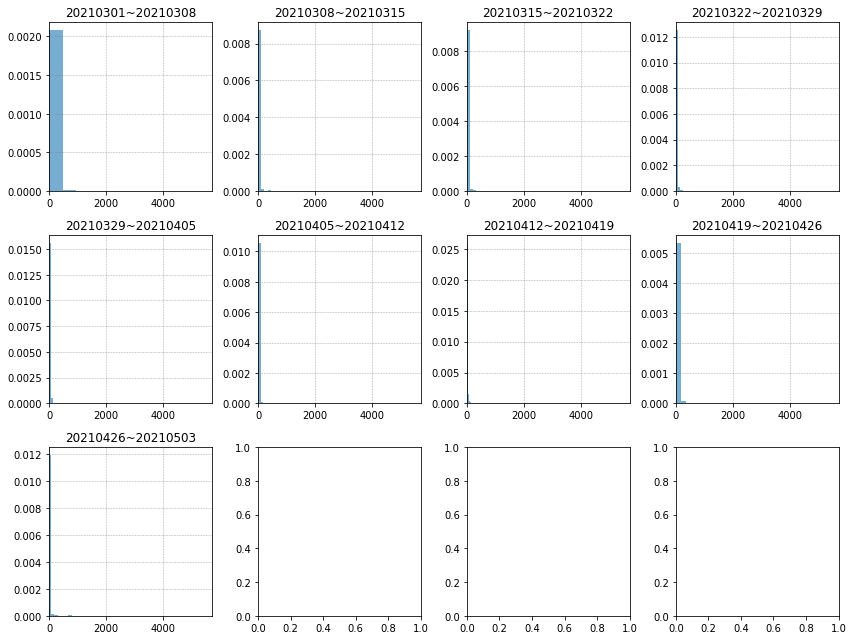

last_order_num


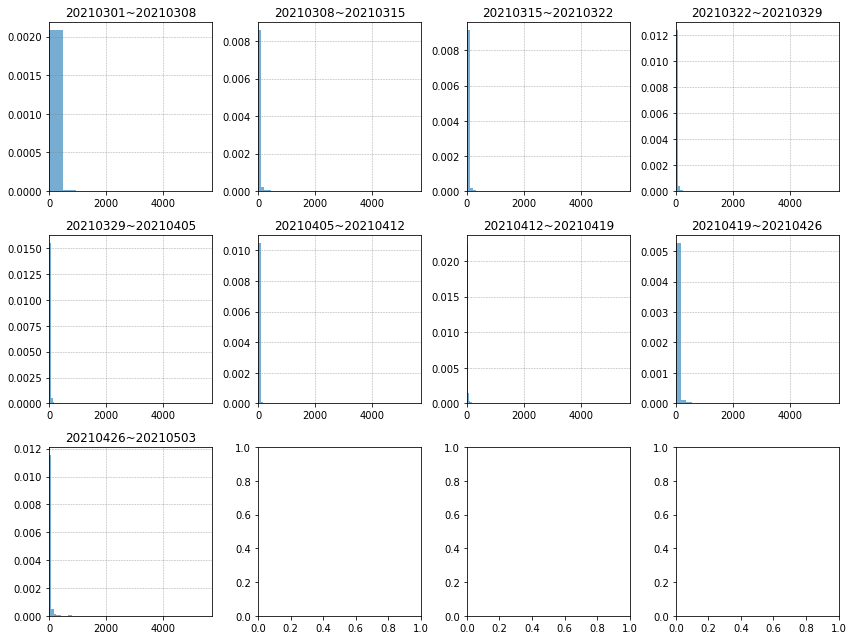

delivery_flag


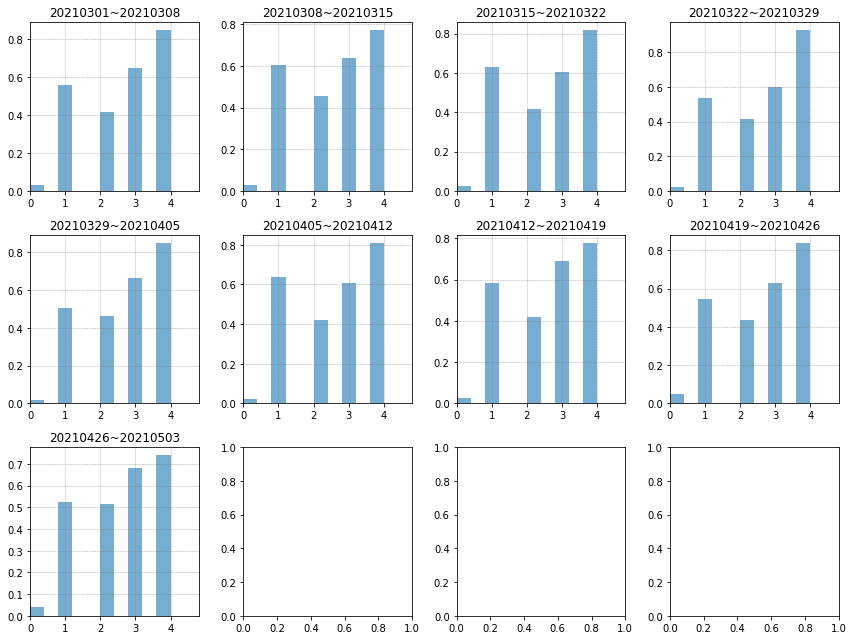

driver_phone_ori


TypeError: '<=' not supported between instances of 'int' and 'str'

In [53]:
cols=df.columns
# cols="num_sum_25,gmv_50,gmv_75,delivery_id_2,refrigeration_type_1,age_75_q,age_30,sku_cnt_mean,gmv_25,sku_cnt_75,refrigeration_type_2,sku_cnt_50,refrigeration_type_0,age_40,vgtble_count,has_store_id_-1,store_type_50,user_cnt_25,fruits_count,sku_cnt_25,line_num_sum,user_cnt_50,category_id_count,user_cnt_mean,has_store_id_0,leader_uid_cnt,fresh_count,line_gmv,user_cnt_75".split(",")
# cols="leader_eta,leader_length,first_eta,first_length".split(",")
for col in cols:
    if col == 'driver_phone':
        continue
    print(col)
#     vis(df.query("num_sum_25 < 80 and gmv_25 < 500 and gmv_50 < 1000 and gmv_75 < 2000 and line_gmv < 50000"),col)
    vis(df,col)
#     vis(df.query("leader_eta <= 15000"),col)
    
    

### 手动把ata按小时分桶，看不同时间段的同一ata小时桶的特征有什么区别

#### Box for Numeric

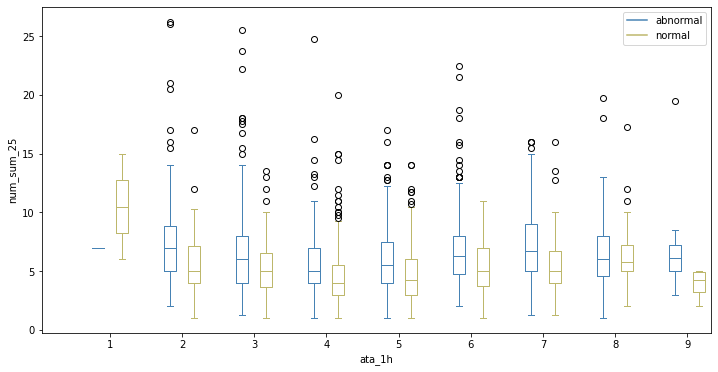

In [300]:
df['label_1h'] = df['label'].apply(lambda x: math.ceil(x/3600))
df = df.query("num_sum_50 < 350")
a1=df.query("20210227 <= date and date <= 20210306")
a2=df.query("20210313 <= date and date <= 20210320")

col = "num_sum_25"
fig=plt.figure(figsize=(12,6))
for idx,(ata_hour,groups) in enumerate(a1.groupby('label_1h')):
    idx += 1
    box = plt.boxplot(groups[col].to_numpy(), positions=[3*idx - 2], widths=0.5)
    _ = [plt.setp(box[i], color="steelblue") for i in ['boxes', 'whiskers', 'caps', 'medians']]


for idx,(ata_hour,groups) in enumerate(a2.groupby('label_1h')):
    idx += 1
    box = plt.boxplot(groups[col].to_numpy(), positions=[3*idx - 1],  widths=0.5)
    _ = [plt.setp(box[i], color="darkkhaki") for i in ['boxes', 'whiskers', 'caps', 'medians']]
    

xticks = [3*idx-1.5 for idx in range(1, df['label_1h'].max()+1)]
_ = plt.xticks(ticks=xticks, labels=range(1, df['label_1h'].max()+1))
_ = plt.xlabel("ata_1h")
_ = plt.ylabel(col)

hB, = plt.plot([1,1],'-',color='steelblue')
hR, = plt.plot([1,1],'-',color='darkkhaki')
plt.legend((hB, hR),('abnormal', 'normal'))
hB.set_visible(False)
hR.set_visible(False)

plt.show()

#### Scatter for Category

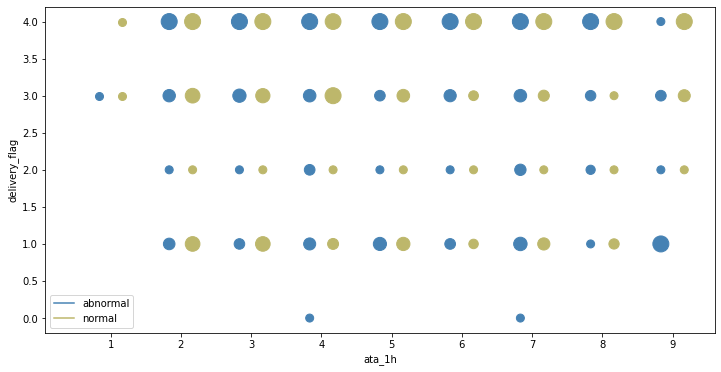

In [290]:
df['label_1h'] = df['label'].apply(lambda x: math.ceil(x/3600))
a1=df.query("20210227 <= date and date <= 20210306")
a2=df.query("20210313 <= date and date <= 20210320")

col = "delivery_flag"
size_func = lambda x : (((x-x.min())/float(x.max()-x.min())+1)*8)**2 if x.max() != x.min() else 64
fig=plt.figure(figsize=(12,6))
for idx,(ata_hour,groups) in enumerate(a1.groupby('label_1h')):
    idx += 1
    data = groups[col].to_numpy()
    value,cnt = np.unique(data,return_counts=True)
    size = size_func(cnt)
    _ = plt.scatter(x=[3*idx-2]*value.shape[0] ,y=value, color='steelblue',s=size)

    
for idx,(ata_hour,groups) in enumerate(a2.groupby('label_1h')):
    idx += 1
    data = groups[col].to_numpy()
    value,cnt = np.unique(data,return_counts=True)
    size = size_func(cnt)
    _ = plt.scatter(x=[3*idx-1]*value.shape[0] ,y=value, color='darkkhaki',s=size)
    

xticks = [3*idx-1.5 for idx in range(1, df['label_1h'].max()+1)]
_ = plt.xticks(ticks=xticks, labels=range(1, df['label_1h'].max()+1))
_ = plt.xlabel("ata_1h")
_ = plt.ylabel(col)

hB, = plt.plot([1,1],'-',color='steelblue')
hR, = plt.plot([1,1],'-',color='darkkhaki')
plt.legend((hB, hR),('abnormal', 'normal'))
hB.set_visible(False)
hR.set_visible(False)

plt.show()

In [195]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
a1.query("label_1h > 6 and leader_uid_cnt < 25").sort_values(by=["label_1h","leader_uid_cnt"], ascending=[True,False])[['label_1h','leader_uid_cnt','driver_phone_ori','date']]
a2.query("label_1h > 6 and leader_uid_cnt < 25").sort_values(by=["label_1h","leader_uid_cnt"], ascending=[True,False])[['label_1h','leader_uid_cnt','driver_phone_ori','date']]





,label_1h,leader_uid_cnt,driver_phone_ori,date
19147,7,24,15169715599,20210301
19254,7,24,13188945574,20210301
19372,7,24,15275127898,20210302
19709,7,24,17615844773,20210304
19889,7,24,13011717265,20210305
19995,7,24,18375412255,20210305
20002,7,24,15628959257,20210305
20040,7,24,13675318580,20210306
20079,7,24,18615349489,20210306
20097,7,24,17505419123,20210306


,label_1h,leader_uid_cnt,driver_phone_ori,date
21238,8,24,18396890159,20210313
21336,8,20,18454819555,20210313


## scripts Animate

In [ ]:

fp = "/nfs/project/zhoutongzt/ETA/jinan_201201_210303.csv"

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime,timedelta
df = pd.read_csv(fp,index_col=0)

infos=[]
b="20201205"
for i in range(20):
    e = datetime.strftime(datetime.strptime(b,'%Y%m%d')+timedelta(4),"%Y%m%d")
    data = {"data":df.query("date >= %s and date < %s" % (b,e))['label'].to_numpy(), 
            "title":"%s~%s" % (b,e)}
    infos.append(data)
    b=e


plt.figure(figsize=(8, 6))
plt.xlim((0, 40000))
plt.ylim((0, 0.00015))

plt.ion()
for info in infos:
    plt.cla()
    _ = plt.hist(info['data'],bins=100,density=True,alpha=0.5)
    plt.title(info['title'])
    plt.pause(1/4)

plt.ioff()

# Ridge on predictions

## lgb_pred & dataset

In [3]:
city="10-19-000001"
# city="19_kunming"
# city="merge_lineMode_6"
fp="/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}".format(city)
lgb_fp="/nfs/project/zhoutongzt/ETA/{}_model.lgb".format(city)

print("data_fp: "+fp)
print("model_fp: "+lgb_fp)

trainDF = load_data(fp,"20210101","20210305")
testDF = load_data(fp,"20210306","20210312")
validDF = load_data(fp,"20210313","20210317")
feats = [i for i in trainDF.columns if i not in DropCols]
print(len(feats),feats)

M = lgb.Booster(model_file=lgb_fp)

trainDF['lgb_pred'] = M.predict(trainDF[feats])
testDF['lgb_pred'] = M.predict(testDF[feats])
validDF['lgb_pred'] = M.predict(validDF[feats])


data_fp: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001
model_fp: /nfs/project/zhoutongzt/ETA/10-19-000001_model.lgb
58 ['age_30', 'age_40', 'age_50', 'age_25_q', 'age_50_q', 'age_75_q', 'age_mean', 'female_count', 'male_count', 'gender_50', 'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean', 'has_store_id_-1', 'has_store_id_0', 'has_store_id_1', 'has_store_id_2', 'has_store_id_3', 'has_store_id_mean', 'isnot_td_new_count', 'is_td_new_count', 'is_td_new_count_mean', 'is_month_new_leader', 'isnot_month_new_leader', 'is_month_new_leader_mean', 'delivery_id_1', 'delivery_id_2', 'delivery_id_3', 'delivery_id_mean', 'num_sum_25', 'num_sum_50', 'num_sum_75', 'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50', 'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25', 'user_cnt_50', 'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75', 'gmv_mean', 'leader_uid_cnt', 'line_num_sum', 'line_gmv', 'line_sku_cnt', 'first_eta', 'first_length', 'leader_eta', 'leader_length', 'first_

## ridge on lgb_pred

In [6]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import OneHotEncoder

class _ING_RidgeOnLGB:
    def __init__(self, lgb_fp, ridge_params, lgb_feats=None, ridge_featsNum=None, ridge_featsCat=None, freq_hold=5):
        """
        lgb_pred + other features(Num&Cat) for Ridge
        :param lgb_fp: file path
        :param ridge_params: init-params
        :param lgb_feats: list
        :param ridge_featsNum: dict
        :param ridge_featsCat: dict
        """
        if ridge_featsNum is None and ridge_featsCat is None:
            assert False
            logging.warning(">>> AWARE: ONLY 「lgb_pred」 used as features")
        if lgb_feats is None:
            assert False
            logging.warning(">>> use all columns in df as lgb features")
        self.lgb = lgb.Booster(model_file=lgb_fp)
        self.ridge = Ridge(**ridge_params)
        self.ridge_featsNum = [] if ridge_featsNum is None else ridge_featsNum
        self.ridge_featsCat = [] if ridge_featsCat is None else ridge_featsCat
        self.ridge_feats = {**self.ridge_featsNum, **self.ridge_featsCat}
        self.lgb_feats = [] if lgb_feats is None else lgb_feats
        self.oe = OneHotEncoder(handle_unknown='ignore')
        self.oe_categories = {}
        self.freq_hold = freq_hold

    def category_transform(self, inpDF):
        info = [(k, inpDF.apply(func, axis=1).to_numpy().reshape(-1, 1)) for k, func in self.ridge_featsCat.items()]
        info = sorted(info, key=lambda x: x[0])
        freqInfo = [(k, np.vstack(np.unique(v, return_counts=True)).T) for k, v in info]
        itemAval = dict((k, freqArr[np.where(freqArr[:, 1] >= self.freq_hold)][:, 0]) for k, freqArr in freqInfo)
        return np.hstack([np.where(np.isin(v, itemAval[k]), v, -1) for k, v in info])
        # _info = [("has_store_id_0", np.array([[0], [1], [1], [2]])),
        #          ("leader_uid_cnt", np.array([[0], [1], [2], [37], [38]]))]
        # _info
        # [(k, np.where(np.isin(v, itemAval[k]), v, -1)) for k, v in _info]

    def get_ridge_X(self, trainX, training=False):
        # ridge X
        X_cat_dense = np.empty((trainX.shape[0], 0))
        X_num_dense = np.empty((trainX.shape[0], 0))
        if len(self.ridge_featsCat) > 0:
            logging.warning("one-hot | converting to dense")
            # 按key排序保证concat的array顺序一致，虽然3.7以后dict已经是有序的了
            X_cat_dense = self.category_transform(trainX)
            if training:
                X_cat_dense = self.oe.fit_transform(X=X_cat_dense).toarray()
                _ = [self.oe_categories.update({k: v}) for k, v in (zip(sorted(self.ridge_featsCat.keys()), self.oe.categories_))]
            else:
                X_cat_dense = self.oe.transform(X=X_cat_dense).toarray()
        if len(self.ridge_featsNum) > 0:
            info = sorted([(k, trainX.apply(func, axis=1).to_numpy().reshape(-1, 1)) for k, func in self.ridge_featsNum.items()], key=lambda x: x[0])
            X_num_dense = np.hstack([v for k, v in info])
        ridgeX = np.hstack([X_cat_dense, X_num_dense])
        return ridgeX

    def fit(self, _trainX, _trainY):
        trainX = _trainX.copy(deep=True)
        trainY = _trainY.copy(deep=True)
        lgb_pred = self.lgb.predict(trainX[self.lgb_feats])
        # Y
        ridgeY = trainY - lgb_pred
        # X
        trainX['lgb_pred'] = lgb_pred
        ridgeX = self.get_ridge_X(trainX, training=True)
        # fit
        self.ridge.fit(ridgeX, ridgeY)

    def predict(self, _inpX):
        inpX = _inpX.copy(deep=True)
        lgb_pred = self.lgb.predict(inpX[self.lgb_feats])
        inpX['lgb_pred'] = lgb_pred
        ridgeX = self.get_ridge_X(inpX, training=False)
        return self.ridge.predict(ridgeX) + lgb_pred
    

### dataset

In [7]:
city="10-19-000001"

Ridge_params = {
    "alpha": 2.0,
    "fit_intercept": True,
    "normalize": False,
    "tol": 1e-3,
    "solver": "auto"
}
fp="/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}".format(city)
lgb_fp="/nfs/project/zhoutongzt/ETA/{}_model.lgb".format(city)

print("data_fp: "+fp)
print("model_fp: "+lgb_fp)

trainDF = load_data(fp,"20210101","20210305")
testDF = load_data(fp,"20210306","20210312")
validDF = load_data(fp,"20210313","20210317")
feats = [i for i in trainDF.columns if i not in DropCols]
print(len(feats),feats)

data_fp: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-19-000001
model_fp: /nfs/project/zhoutongzt/ETA/10-19-000001_model.lgb
58 ['age_30', 'age_40', 'age_50', 'age_25_q', 'age_50_q', 'age_75_q', 'age_mean', 'female_count', 'male_count', 'gender_50', 'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean', 'has_store_id_-1', 'has_store_id_0', 'has_store_id_1', 'has_store_id_2', 'has_store_id_3', 'has_store_id_mean', 'isnot_td_new_count', 'is_td_new_count', 'is_td_new_count_mean', 'is_month_new_leader', 'isnot_month_new_leader', 'is_month_new_leader_mean', 'delivery_id_1', 'delivery_id_2', 'delivery_id_3', 'delivery_id_mean', 'num_sum_25', 'num_sum_50', 'num_sum_75', 'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50', 'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25', 'user_cnt_50', 'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75', 'gmv_mean', 'leader_uid_cnt', 'line_num_sum', 'line_gmv', 'line_sku_cnt', 'first_eta', 'first_length', 'leader_eta', 'leader_length', 'first_

### fit

In [18]:
help(pointsDF.plot.bar)

Help on method bar in module pandas.plotting._core:

bar(x=None, y=None, **kwargs) method of pandas.plotting._core.PlotAccessor instance
    Vertical bar plot.
    
    A bar plot is a plot that presents categorical data with
    rectangular bars with lengths proportional to the values that they
    represent. A bar plot shows comparisons among discrete categories. One
    axis of the plot shows the specific categories being compared, and the
    other axis represents a measured value.
    
    Parameters
    ----------
    x : label or position, optional
        Allows plotting of one column versus another. If not specified,
        the index of the DataFrame is used.
    y : label or position, optional
        Allows plotting of one column versus another. If not specified,
        all numerical columns are used.
    color : str, array_like, or dict, optional
        The color for each of the DataFrame's columns. Possible values are:
    
        - A single color string referred to by

[2021-04-01 17:43:43,150-WARNING]: one-hot | converting to dense


{'lgb_pred_bin': array([ 4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
        21, 22, 23, 24, 25])}

[2021-04-01 17:43:45,428-WARNING]: one-hot | converting to dense
[2021-04-01 17:43:49,561-WARNING]: one-hot | converting to dense


,count,me,mae,mape,badcase,underrate,overrate,ata_avg,ata_mid,eta_avg,eta_mid,ful_f1,notful_f1,ful_p,ful_r,notful_p,notful_r,mode,data
0,118149.0,-2.391449e+02,2385.528581,0.233488,0.153366,0.499496,0.500504,11338.660505,4119.74,11099.515647,5828.166578,0.914732,0.711994,0.968333,0.866755,0.599844,0.875723,lgb,train
1,118149.0,-1.978320e-12,2389.362616,0.239189,0.153620,0.468282,0.531718,11338.660505,4119.74,11338.660505,5853.156659,0.911180,0.708066,0.971425,0.857971,0.588173,0.889350,ridge_on_lgb,train
2,16940.0,9.877673e+02,2264.189855,0.234226,0.150767,0.305313,0.694687,11262.032468,4107.39,12249.799738,5824.767557,0.896703,0.413018,0.973032,0.831477,0.285675,0.745196,lgb,test
3,16940.0,1.288905e+03,2400.600456,0.250289,0.167414,0.270543,0.729457,11262.032468,4107.39,12550.937107,5849.757637,0.886341,0.406319,0.976824,0.811201,0.273830,0.787189,ridge_on_lgb,test


>>> trainDF


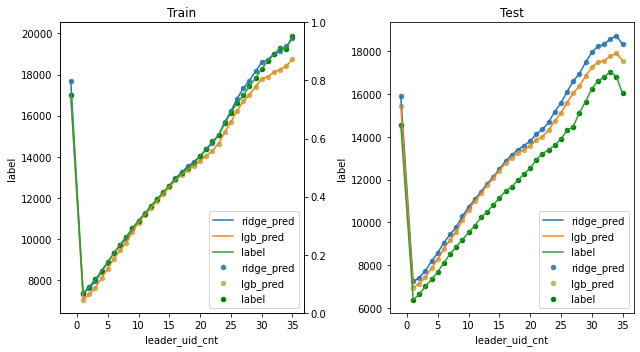

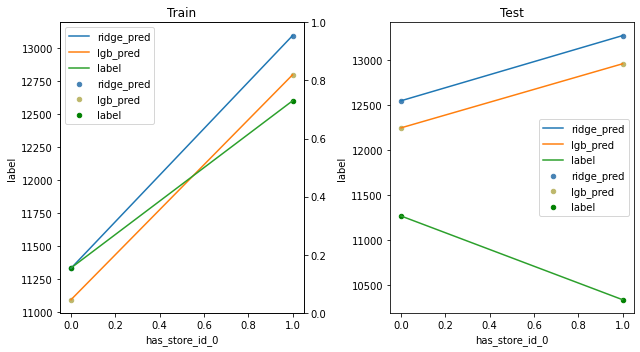

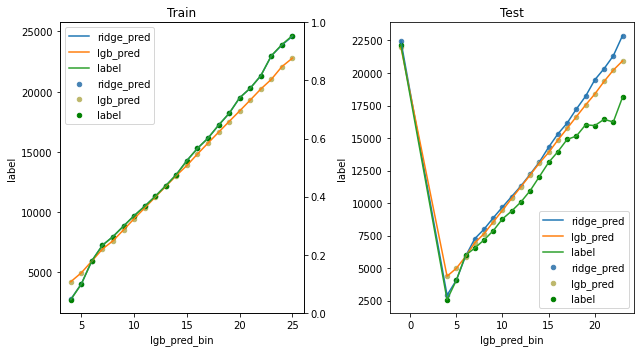

In [19]:
ridge_featsNum = {
#     "lgb_pred":lambda row:row['lgb_pred']
#     "sku_cnt_25": lambda row:row['sku_cnt_25'],
#     "sku_cnt_50": lambda row:row['sku_cnt_50'],
#     "sku_cnt_75": lambda row:row['sku_cnt_75'],
}
# ridge_featsNum = {**ridge_featsNum, **dict((k, lambda row:row[k]) for k in feats)}
ridge_featsCat = {
    # 连续特征的max小，且是int，直接当离散特征用了
#     "leader_uid_cnt": lambda row: row['leader_uid_cnt'],
#     "has_store_id_0": lambda row: row['has_store_id_0'],
    # lgb_pred分桶拟合
    "lgb_pred_bin": lambda row: int(row["lgb_pred"]/(15*60)),
#     "first_eta_bin": lambda row: int(row['first_eta']/(10*60))
}
M_ = _ING_RidgeOnLGB(lgb_fp, Ridge_params, 
                     lgb_feats=feats,
                     ridge_featsNum=ridge_featsNum, 
                     ridge_featsCat=ridge_featsCat,
                     freq_hold=15)
M_
M_.fit(trainDF,trainDF['label'])
M_.oe_categories
trainDF['ridge_pred']=M_.predict(trainDF)
trainDF['lgb_pred']=M_.lgb.predict(trainDF[feats])
trainDF = trainDF.assign(**dict(list(zip(sorted(M_.ridge_featsCat.keys()), M_.category_transform(trainDF).T))))
trainDF['ata_bin'] = trainDF['label'].apply(lambda i: int(i/(15*60)))


testDF['ridge_pred']=M_.predict(testDF)
testDF['lgb_pred']=M_.lgb.predict(testDF[feats])
testDF = testDF.assign(**dict(list(zip(sorted(M_.ridge_featsCat.keys()), M_.category_transform(testDF).T))))
testDF['ata_bin'] = testDF['label'].apply(lambda i: int(i/(15*60)))

pd.DataFrame([{**metric2(trainDF,label_col='label',pred_col='lgb_pred'),**{"mode":"lgb","data":"train"}},
              {**metric2(trainDF,label_col='label',pred_col='ridge_pred'),**{"mode":"ridge_on_lgb","data":"train"}},
              {**metric2(testDF,label_col='label',pred_col='lgb_pred'),**{"mode":"lgb","data":"test"}},
              {**metric2(testDF,label_col='label',pred_col='ridge_pred'),**{"mode":"ridge_on_lgb","data":"test"}}])


print(">>> trainDF")
for col in ["leader_uid_cnt","has_store_id_0","lgb_pred_bin"]:#,"first_eta_bin","lgb_pred_bin","ata_bin"]:
    fig,axs = plt.subplots(1,2,figsize=(12,6))
    fig.set_tight_layout(True)
    # train
    cur_ax = axs[0]
    cur_ax_tx = cur_ax.twinx()
    _ = cur_ax.set_title("Train")
    points=[]
    for key,dfg in trainDF.groupby(col):
        points.append({**dfg[[col,'label','lgb_pred','ridge_pred']].mean().to_dict(),**{"count":dfg.shape[0]}})
    pointsDF = pd.DataFrame(points)
    _ = pointsDF.plot(x=col,y=["ridge_pred","lgb_pred",'label'],figsize=(9,5),ax=cur_ax)
    _ = pointsDF.plot.scatter(x=col, y='ridge_pred', ax=cur_ax, c='steelblue',label='ridge_pred')
    _ = pointsDF.plot.scatter(x=col, y='lgb_pred', ax=cur_ax, c='darkkhaki',label='lgb_pred')
    _ = pointsDF.plot.scatter(x=col, y='label', ax=cur_ax, c='green',label='label')
    _ = pointsDF.plot.bar
    # test
    cur_ax = axs[1]
    _ = cur_ax.set_title("Test")
    points=[]
    for key,dfg in testDF.groupby(col):
        points.append({**dfg[[col,'label','lgb_pred','ridge_pred']].mean().to_dict(),**{"count":dfg.shape[0]}})
    pointsDF = pd.DataFrame(points)
    _ = pointsDF.plot(x=col,y=["ridge_pred","lgb_pred",'label'],figsize=(9,5),ax=cur_ax)
    _ = pointsDF.plot.scatter(x=col, y='ridge_pred', ax=cur_ax, c='steelblue',label='ridge_pred')
    _ = pointsDF.plot.scatter(x=col, y='lgb_pred', ax=cur_ax, c='darkkhaki',label='lgb_pred')
    _ = pointsDF.plot.scatter(x=col, y='label', ax=cur_ax, c='green',label='label')
    plt.show()

    
# print(">>> testDF")
# for col in ["leader_uid_cnt","has_store_id_0","first_eta_bin","lgb_pred_bin","ata_bin"]:
#     points=[]
#     for key,dfg in testDF.groupby(col):
#         points.append(dfg[[col,'label','lgb_pred','ridge_pred']].mean().to_dict())
#     pointsDF = pd.DataFrame(points)
#     fig = plt.figure(figsize=(9,5))
#     ax = plt.gca()
#     _ = pointsDF.plot(x=col,y=["ridge_pred","lgb_pred",'label'],figsize=(9,5),ax=ax)
#     _ = pointsDF.plot.scatter(x=col, y='ridge_pred', ax=ax, c='steelblue',label='ridge_pred')
#     _ = pointsDF.plot.scatter(x=col, y='lgb_pred', ax=ax, c='darkkhaki',label='lgb_pred')
#     _ = pointsDF.plot.scatter(x=col, y='label', ax=ax, c='green',label='label')
#     plt.show()





In [21]:
M_.ridge.coef_
M_.ridge.intercept_

array([-1931.99892997, -1397.51448548,  -452.23357644,  -159.92411082,
        -126.49859421,  -161.16868881,  -224.61426599,  -334.33110137,
        -414.2527503 ,  -422.11712798,  -398.3607545 ,   -72.41241027,
          -6.56681398,   -65.80013347,   105.93098854,   196.46446789,
         614.63756902,   505.3289801 ,   624.27775644,  1470.6290166 ,
        1315.9540777 ,  1334.57088728])

477.22365717379336

### 高估、低估的case

In [110]:
M_.ridge.coef_
M_.ridge.intercept_

testDF['lgb_pred'] = M_.lgb.predict(testDF[feats])
M_.get_ridge_X(testDF,training=False).shape

testDF.apply(M_.ridge_featsCat['first_eta_bin'], axis=1).value_counts()
np.unique(M_.category_transform(testDF).flatten(),return_counts=True)



array([ -200.38419378,  -397.60954817,   718.1243762 ,   469.523798  ,
          30.51289004,    73.9338585 ,    17.70132192,   332.00374984,
       -1043.80625255])

181.17022320163852

[2021-03-31 14:15:57,610-WARNING]: one-hot | converting to dense


(16940, 9)

5    7580
4    3725
6    3578
7    1421
3     269
0     190
1      84
8      53
2      40
dtype: int64

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 array([ 190,   84,   40,  269, 3725, 7580, 3578, 1421,   53]))

### 是否存在某种特征能区分高估、低估？
- 趋势错误的特征有： has_store_id_0、first_eta、first_length、leader_eta、leader_length
    - has_store_id_0 的gain是0
- wiki: http://wiki.intra.xiaojukeji.com/pages/viewpage.action?pageId=555149390

In [ ]:
col = "leader_uid_cnt"

for col in ["leader_uid_cnt"]+feats[:3]:
    points=[]
    for key,dfg in testDF.groupby(col):
        points.append(dfg[[col,'label','lgb_pred','ridge_pred']].mean().to_dict())

    pd.DataFrame(points).plot(x=col,y=["ridge_pred","lgb_pred",'label'],figsize=(9,5))
    plt.show()


In [41]:
"has_store_id_0、first_eta、first_length、leader_eta、leader_length"
testDF.columns
testDF['has_store_id_0'].value_counts()

'has_store_id_0、first_eta、first_length、leader_eta、leader_length'

Index(['driver_phone', 'age_30', 'age_40', 'age_50', 'age_25_q', 'age_50_q',
       'age_75_q', 'age_mean', 'female_count', 'male_count', 'gender_50',
       'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean',
       'has_store_id_-1', 'has_store_id_0', 'has_store_id_1', 'has_store_id_2',
       'has_store_id_3', 'has_store_id_mean', 'isnot_td_new_count',
       'is_td_new_count', 'is_td_new_count_mean', 'is_month_new_leader',
       'isnot_month_new_leader', 'is_month_new_leader_mean', 'delivery_id_1',
       'delivery_id_2', 'delivery_id_3', 'delivery_id_mean', 'num_sum_25',
       'num_sum_50', 'num_sum_75', 'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50',
       'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25', 'user_cnt_50',
       'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75',
       'gmv_mean', 'leader_uid_cnt', 'line_num_sum', 'line_gmv',
       'line_sku_cnt', 'fruits_count', 'vgtble_count', 'fresh_count',
       'category_id_count', 'refrigeration_type_

0    16855
1       85
Name: has_store_id_0, dtype: int64

## 随着团长数增加 ETA是否增加

### Line

<AxesSubplot:xlabel='leader_uid_cnt'>

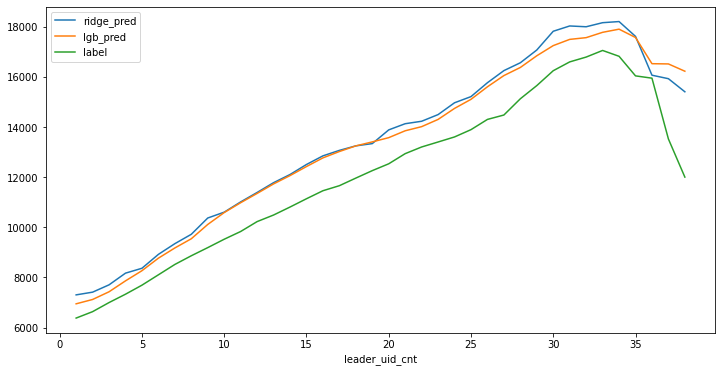

In [291]:
points=[]
for key,dfg in testDFRidge.groupby("leader_uid_cnt"):
    points.append(dfg[['leader_uid_cnt','label','lgb_pred','ridge_pred']].mean().to_dict())
    
pd.DataFrame(points).plot(x="leader_uid_cnt",y=["ridge_pred","lgb_pred",'label'],figsize=(12,6))




### Box 

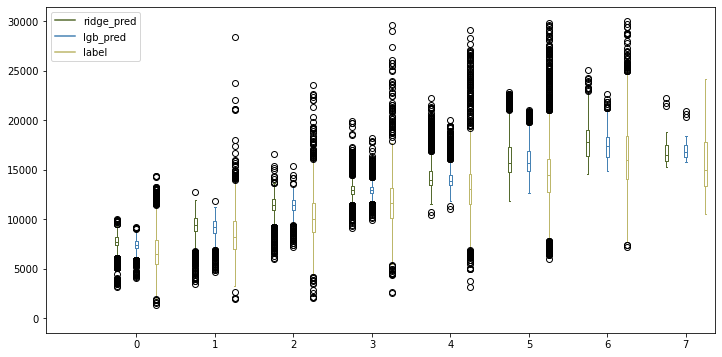

In [292]:
fig=plt.figure(figsize=(12,6))
N = 4
xticks=[]
for idx,(key,dfg) in enumerate(testDFRidge.groupby("leader_uid_cnt_bin")):
    box = plt.gca().boxplot(dfg['label'].to_numpy(), positions=[N*(idx+1)])
    _ = [plt.setp(box[i], color="darkkhaki") for i in ['boxes', 'whiskers', 'caps', 'medians']]
    box = plt.gca().boxplot(dfg['lgb_pred'].to_numpy(), positions=[N*(idx+1)-1])
    _ = [plt.setp(box[i], color="steelblue") for i in ['boxes', 'whiskers', 'caps', 'medians']]
    box = plt.gca().boxplot(dfg['ridge_pred'].to_numpy(), positions=[N*(idx+1)-2])
    _ = [plt.setp(box[i], color="darkolivegreen") for i in ['boxes', 'whiskers', 'caps', 'medians']]
    tick=(N*(idx+1) + N*(idx+1)-2)*0.5
    tick_lbl=key
    xticks.append([tick,tick_lbl])


_ = plt.xticks(ticks=[i[0] for i in xticks],labels=[i[1] for i in xticks])

h1, = plt.plot([1,1],'-',color='darkolivegreen')
h2, = plt.plot([1,1],'-',color='steelblue')
h3, = plt.plot([1,1],'-',color='darkkhaki')
plt.legend((h1, h2, h3),('ridge_pred','lgb_pred','label'))
h1.set_visible(False)
h2.set_visible(False)
h3.set_visible(False)
fig.show()

# GBDT + LR

In [6]:
lgb_fp="/nfs/project/zhoutongzt/ETA/line_feature_with_eta_grid_model.lgb.bak"
M = lgb.Booster(model_file=lgb_fp)

trainDF = pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/trainDF.pkl.tmp")
testDF = pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/testDF.pkl.tmp")
validDF = pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/validDF.pkl.tmp")

trainDF.shape
testDF.shape
validDF.shape

testDF.columns




(148473, 153)

(136306, 153)

(117491, 153)

In [3]:
import tensorflow as tf
def inspect_trd(trd_fp):
    trd = tf.data.TFRecordDataset(trd_fp)
    iterator = trd.make_one_shot_iterator()
    one = iterator.get_next()

    gpu_options = tf.GPUOptions(allow_growth=True)
    conf = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
    with tf.Session(config=conf) as _sess:
        one_ = _sess.run(one)
        featInfo = tf.train.Example.FromString(one_).features.feature  # not dict

    res = []
    res_info = []
    for key in featInfo:
        info_list = [(key, attr, featInfo[key].__getattribute__(attr).value)
                     for attr in ["bytes_list", "float_list", "int64_list"]]
        info = [i for i in info_list if i[-1] != []][0]  # 只应该有一个
        res.append("[featName]:{} [type]:{} [value_example]:{}".format(*info))
        res_info.append(info)
    print("\n".join(sorted(res)))
    return res_info

res = inspect_trd("/nfs/project/zhoutongzt/ETA/data_parsed_by_grid/line_feature_with_eta_grid_test.trd")

[featName]:age_25_q [type]:float_list [value_example]:[34.0]
[featName]:age_30 [type]:int64_list [value_example]:[4]
[featName]:age_40 [type]:int64_list [value_example]:[8]
[featName]:age_50 [type]:int64_list [value_example]:[18]
[featName]:age_50_q [type]:float_list [value_example]:[41.5]
[featName]:age_75_q [type]:float_list [value_example]:[47.0]
[featName]:age_mean [type]:float_list [value_example]:[40.63333511352539]
[featName]:all_due_time [type]:float_list [value_example]:[7659.0]
[featName]:assemble_eta [type]:int64_list [value_example]:[16200]
[featName]:category_id_count [type]:int64_list [value_example]:[14]
[featName]:city_id [type]:int64_list [value_example]:[18]
[featName]:date [type]:int64_list [value_example]:[20210329]
[featName]:delivery_flag [type]:int64_list [value_example]:[1]
[featName]:delivery_id_1 [type]:int64_list [value_example]:[30]
[featName]:delivery_id_2 [type]:int64_list [value_example]:[0]
[featName]:delivery_id_3 [type]:int64_list [value_example]:[0]
[

In [11]:
aa = {
  "int": [
    "driver_phone",
    "age_30",
    "age_40",
    "age_50",
    "female_count",
    "male_count",
    "has_store_id_-1",
    "has_store_id_0",
    "has_store_id_1",
    "has_store_id_2",
    "has_store_id_3",
    "isnot_td_new_count",
    "is_td_new_count",
    "is_month_new_leader",
    "isnot_month_new_leader",
    "delivery_id_1",
    "delivery_id_2",
    "delivery_id_3",
    "leader_uid_cnt",
    "line_num_sum",
    "category_id_count",
    "label",
    "date",
    "assemble_eta",
    "first_order_num",
    "middle_order_num",
    "last_order_num",
    "delivery_flag",
    "last_uid",
    "gmv_mean_bucket",
    "line_num_sum_bucket",
    "leader_uid_cnt_bucket",
    "first_length_bucket"
  ],
  "float": [
    "age_25_q",
    "age_50_q",
    "age_75_q",
    "age_mean",
    "gender_50",
    "store_type_25",
    "store_type_50",
    "store_type_75",
    "store_type_mean",
    "has_store_id_mean",
    "is_td_new_count_mean",
    "is_month_new_leader_mean",
    "delivery_id_mean",
    "num_sum_25",
    "num_sum_50",
    "num_sum_75",
    "num_sum_mean",
    "sku_cnt_25",
    "sku_cnt_50",
    "sku_cnt_75",
    "sku_cnt_mean",
    "user_cnt_25",
    "user_cnt_50",
    "user_cnt_75",
    "user_cnt_mean",
    "gmv_25",
    "gmv_50",
    "gmv_75",
    "gmv_mean",
    "line_gmv",
    "line_sku_cnt",
    "fruits_count",
    "vgtble_count",
    "fresh_count",
    "refrigeration_type_0",
    "refrigeration_type_1",
    "refrigeration_type_2",
    "refrigeration_type_3",
    "first_eta",
    "first_length",
    "leader_eta",
    "leader_length",
    "all_due_time"
  ],
  "str": [
    "driver_phone_ori",
    "last_action_time",
    "tocar_time",
    "uid_str"
  ],
  "fixed_list_str": {
    "uid_str_list": 70
  },
  "fixed_list_int": {
    "uid_idx_list": 70
  }
}

In [10]:
import pandas as pd
for k,dfg in pd.DataFrame(res).groupby(1):
    print(k)
    print(sorted(dfg[0].to_list()))

bytes_list
['driver_phone_ori', 'last_action_time', 'tocar_time', 'uid_str', 'uid_str_list', 'warehouse_code_str']
float_list
['age_25_q', 'age_50_q', 'age_75_q', 'age_mean', 'all_due_time', 'delivery_id_mean', 'first_eta', 'first_length', 'fresh_count', 'fruits_count', 'gender_50', 'gmv_25', 'gmv_50', 'gmv_75', 'gmv_mean', 'has_store_id_mean', 'is_month_new_leader_mean', 'is_td_new_count_mean', 'leader_eta', 'leader_length', 'line_gmv', 'line_num_sum', 'line_sku_cnt', 'num_sum_25', 'num_sum_50', 'num_sum_75', 'num_sum_mean', 'refrigeration_type_0', 'refrigeration_type_1', 'refrigeration_type_2', 'refrigeration_type_3', 'sku_cnt_25', 'sku_cnt_50', 'sku_cnt_75', 'sku_cnt_mean', 'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean', 'user_cnt_25', 'user_cnt_50', 'user_cnt_75', 'user_cnt_mean', 'vgtble_count']
int64_list
['age_30', 'age_40', 'age_50', 'assemble_eta', 'category_id_count', 'city_id', 'date', 'delivery_flag', 'delivery_id_1', 'delivery_id_2', 'delivery_id_3', 

In [18]:
ff=['age_25_q', 'age_50_q', 'age_75_q', 'age_mean', 'all_due_time', 'delivery_id_mean', 'first_eta', 'first_length', 'fresh_count', 'fruits_count', 'gender_50', 'gmv_25', 'gmv_50', 'gmv_75', 'gmv_mean', 'has_store_id_mean', 'is_month_new_leader_mean', 'is_td_new_count_mean', 'leader_eta', 'leader_length', 'line_gmv', 'line_num_sum', 'line_sku_cnt', 'num_sum_25', 'num_sum_50', 'num_sum_75', 'num_sum_mean', 'refrigeration_type_0', 'refrigeration_type_1', 'refrigeration_type_2', 'refrigeration_type_3', 'sku_cnt_25', 'sku_cnt_50', 'sku_cnt_75', 'sku_cnt_mean', 'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean', 'user_cnt_25', 'user_cnt_50', 'user_cnt_75', 'user_cnt_mean', 'vgtble_count']
[i for i in aa['float']  if i not in ff]


[]

In [1]:

trainX = testDF.sample(frac=0.1)
linear_feats=["uid_%s" % i for i in range(70)]
half_idx = int(trainX.shape[0] / 2)


leaves_idx = M.predict(trainX[half_idx:], pred_leaf=True)
func = lambda row: ["%s_%s" % (idx, i) for idx, i in enumerate(row)]
linear_X = np.array(list(map(func, leaves_idx)))
linear_X = np.hstack([linear_X, trainX[half_idx:][linear_feats].to_numpy()])


NameError: name 'testDF' is not defined

In [ ]:

leaves_idx = M.predict(trainDF[featCols], pred_leaf=True)
func = lambda row: ["%s_%s" % (idx, i) for idx, i in enumerate(row)]
leaves_idx = np.array(list(map(func, leaves_idx)))
leaves_idx



# RandomForest


In [416]:
all_fp = "/nfs/project/zhoutongzt/ETA/jinan_201201_210303.csv_t"
trainDF = pd.read_csv(all_fp, sep="\t", index_col=0).query("date >= 20210102 and date <= 20210130").copy()
testDF = pd.read_csv(all_fp, sep="\t", index_col=0).query("date >= 20210131 and date <= 20210205").copy()
testDF_2 = testDF.query("num_sum_25 < 80").copy()
validDF = pd.read_csv(valid_fp, sep="\t", index_col=0).query("date >= 20210301 and date <= 20210303").copy()

rf_model_fp = "/nfs/project/zhoutongzt/ETA/rf.model"
import pickle
with open(rf_model_fp,"rb") as frb:
    rf = pickle.load(frb)
    
trainDF['pred'] = rf.predict(trainDF[feats])
testDF['pred'] = rf.predict(testDF[feats])
testDF_2['pred'] = rf.predict(testDF_2[feats])
validDF['pred'] = rf.predict(validDF[feats])

trainDF['lbl_pred_diff'] = (trainDF['label'] - trainDF['pred']).apply(lambda x : abs(x))
testDF['lbl_pred_diff'] = (testDF['label'] - testDF['pred']).apply(lambda x : abs(x))
testDF_2['lbl_pred_diff'] = (testDF_2['label'] - testDF_2['pred']).apply(lambda x : abs(x))
validDF['lbl_pred_diff'] = (validDF['label'] - validDF['pred']).apply(lambda x : abs(x))

/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator DecisionTreeRegressor from version 0.24.0 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator RandomForestRegressor from version 0.24.0 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 120 out of 120 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 120 out of 120 | elapsed:    0.0s finished
[Paralle

params: {'n_estimators': 120, 'criterion': 'mae', 'max_depth': 20, 'random_state': 0, 'min_samples_split': 4, 'min_samples_leaf': 4, 'verbose': 2, 'n_jobs': 12}
[Train] count: 7330.0 me: 93.6656 mae: 5548.0300 mape: 0.4803 badcase: 0.5045
[Test] count: 1313.0 me: 993.6172 mae: 5021.8823 mape: 0.4713 badcase: 0.4676
[Valid] count: 565.0 me: -423.2868 mae: 4931.6823 mape: 0.4163 badcase: 0.4106
[Test_2] count: 1313.0 me: 993.6172 mae: 5021.8823 mape: 0.4713 badcase: 0.4676


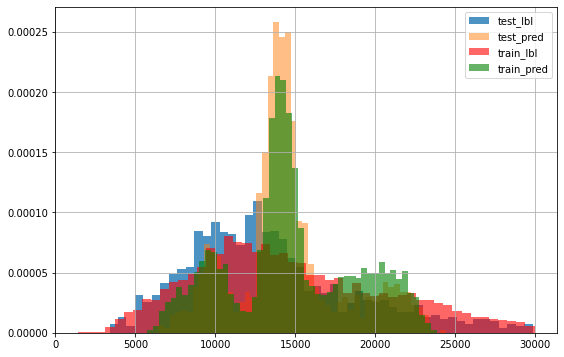

In [419]:
print("params: %s" % str(params))
res = metric(trainDF['label'].to_numpy(), trainDF['pred'].to_numpy())
print("[Train] count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))
res = metric(testDF['label'].to_numpy(), testDF['pred'].to_numpy())
print("[Test] count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))
res = metric(validDF['label'].to_numpy(), validDF['pred'].to_numpy())
print("[Valid] count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))
res = metric(testDF_2['label'].to_numpy(), testDF_2['pred'].to_numpy())
print("[Test_2] count: %s me: %.4f mae: %.4f mape: %.4f badcase: %.4f" % (res))

_ = testDF['label'].hist(bins=50,alpha=0.8,density=True,label='test_lbl',figsize=(9,6))
_ = testDF['pred'].hist(bins=50,alpha=0.5,density=True,label='test_pred')
# _ = validDF['label'].hist(bins=50,alpha=0.5,density=True,label='valid_lbl')
# _ = validDF['pred'].hist(bins=50,alpha=0.5,density=True,label='valid_pred')
_ = trainDF['label'].hist(bins=50,alpha=0.6,density=True,label='train_lbl',color='red')
_ = trainDF['pred'].hist(bins=50,alpha=0.6,density=True,label='train_pred',color='green')
_ = plt.legend()
plt.show()

In [412]:
sorted(zip(list(testDF.columns), list(rf.feature_importances_)), key=lambda x: x[1])

[('store_type_75', 0.0),
 ('store_type_mean', 0.0),
 ('has_store_id_1', 0.0),
 ('has_store_id_3', 0.0),
 ('has_store_id_mean', 0.0),
 ('is_td_new_count', 0.0),
 ('is_td_new_count_mean', 0.0),
 ('gmv_mean', 0.0),
 ('line_sku_cnt', 0.0),
 ('female_count', 0.00013333533476100884),
 ('has_store_id_2', 0.0009243553790714516),
 ('male_count', 0.0016145241382392178),
 ('is_month_new_leader', 0.002428095736558995),
 ('num_sum_50', 0.0039620296573097055),
 ('gender_50', 0.00401985594303611),
 ('num_sum_75', 0.004101109374399482),
 ('delivery_id_3', 0.005363067183579943),
 ('refrigeration_type_3', 0.0055652592726375995),
 ('age_25_q', 0.005639293685048933),
 ('driver_phone', 0.006141394525932754),
 ('is_month_new_leader_mean', 0.0065243071257579995),
 ('isnot_month_new_leader', 0.006815028089941454),
 ('num_sum_mean', 0.007151352930427726),
 ('isnot_td_new_count', 0.007234487126077439),
 ('age_50_q', 0.007745219947142247),
 ('store_type_25', 0.008133307397111367),
 ('age_mean', 0.008478895805309

## Visualize

### Check Diff-max

In [283]:
test_data = testDF
train_data = trainDF

,driver_phone,age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count,...,label,date,all_due_time,assemble_eta,first_order_num,middle_order_num,last_order_num,delivery_flag,pred,lbl_pred_diff
147,6.392473e+17,0.0,10.0,12.0,34.25,43.0,47.75,43.318182,13.0,9.0,...,29450.0,20210204.0,27304.0,11880.0,3.0,11.0,20.0,2.0,12826.237500,16623.762500
39,6.392473e+17,3.0,8.0,12.0,33.50,41.0,51.00,42.695652,19.0,4.0,...,28953.0,20210203.0,28515.0,12420.0,21.0,32.0,7.0,3.0,13899.379167,15053.620833
14,6.392473e+17,2.0,15.0,8.0,32.00,36.0,43.00,38.600000,16.0,9.0,...,29447.0,20210131.0,27923.0,13500.0,6.0,43.0,7.0,3.0,14590.812500,14856.187500
74,6.392473e+17,0.0,10.0,15.0,37.00,43.0,45.00,43.720000,15.0,10.0,...,28132.0,20210202.0,25531.0,13500.0,8.0,45.0,1.0,3.0,13852.258333,14279.741667


count     1313.000000
mean      4481.795506
std       3117.913534
min          4.020833
25%       1950.854167
50%       4045.191667
75%       6478.516667
max      16623.762500
Name: lbl_pred_diff, dtype: float64

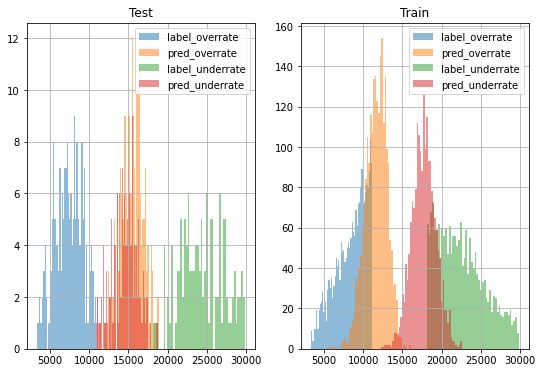

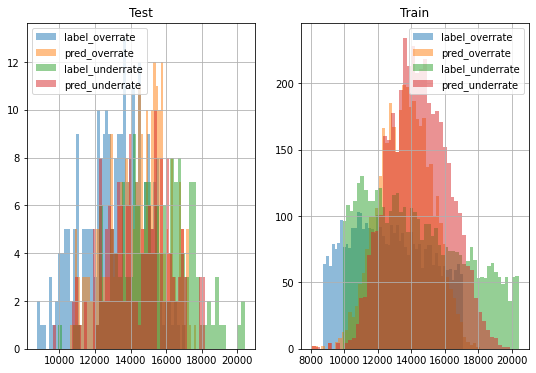

In [285]:
test_data.sort_values('lbl_pred_diff',ascending=False).head(4)
test_data['lbl_pred_diff'].describe()

fig,axesf=plt.subplots(1,2,figsize=(9,6))
test_overrate = test_data.query("lbl_pred_diff >= 6478 and pred > label")
train_like_overrate = train_data.query("label >= %s and label <= %s" % (test_overrate['label'].min(), test_overrate['label'].max()))
test_underrate = test_data.query("lbl_pred_diff >= 6478 and pred < label")
train_like_underrate = train_data.query("label >= %s and label <= %s" % (test_underrate['label'].min(), test_underrate['label'].max()))

_ = axesf[0].set_title("Test")
_ = test_overrate['label'].hist(bins=50,alpha=0.5,label='label_overrate',ax=axesf[0])
_ = test_overrate['pred'].hist(bins=50,alpha=0.5,label='pred_overrate',ax=axesf[0])
_ = test_underrate['label'].hist(bins=50,alpha=0.5,label='label_underrate',ax=axesf[0])
_ = test_underrate['pred'].hist(bins=50,alpha=0.5,label='pred_underrate',ax=axesf[0])

_ = axesf[1].set_title("Train")
_ = train_like_overrate['label'].hist(bins=50,alpha=0.5,label='label_overrate',ax=axesf[1])
_ = train_like_overrate['pred'].hist(bins=50,alpha=0.5,label='pred_overrate',ax=axesf[1])
_ = train_like_underrate['label'].hist(bins=50,alpha=0.5,label='label_underrate',ax=axesf[1])
_ = train_like_underrate['pred'].hist(bins=50,alpha=0.5,label='pred_underrate',ax=axesf[1])


_ = [i.legend() for i in axesf]
plt.show()



fig,axesf=plt.subplots(1,2,figsize=(9,6))
test_overrate = test_data.query("lbl_pred_diff <= 2400 and pred > label")
train_like_overrate = train_data.query("label >= %s and label <= %s" % (test_overrate['label'].min(), test_overrate['label'].max()))
test_underrate = test_data.query("lbl_pred_diff <= 2400 and pred < label")
train_like_underrate = train_data.query("label >= %s and label <= %s" % (test_underrate['label'].min(), test_underrate['label'].max()))

_ = axesf[0].set_title("Test")
_ = test_overrate['label'].hist(bins=50,alpha=0.5,label='label_overrate',ax=axesf[0])
_ = test_overrate['pred'].hist(bins=50,alpha=0.5,label='pred_overrate',ax=axesf[0])
_ = test_underrate['label'].hist(bins=50,alpha=0.5,label='label_underrate',ax=axesf[0])
_ = test_underrate['pred'].hist(bins=50,alpha=0.5,label='pred_underrate',ax=axesf[0])

_ = axesf[1].set_title("Train")
_ = train_like_overrate['label'].hist(bins=50,alpha=0.5,label='label_overrate',ax=axesf[1])
_ = train_like_overrate['pred'].hist(bins=50,alpha=0.5,label='pred_overrate',ax=axesf[1])
_ = train_like_underrate['label'].hist(bins=50,alpha=0.5,label='label_underrate',ax=axesf[1])
_ = train_like_underrate['pred'].hist(bins=50,alpha=0.5,label='pred_underrate',ax=axesf[1])


_ = [i.legend() for i in axesf]
plt.show()


## 专门检查Overrate太多的Test

In [317]:
np.corrcoef([1,2,3,4,5,6],[3,3,4,4,2,2])
np.corrcoef([1,2,3,4,5,6],[6,5,4,3,2,1])
np.corrcoef([1,2,3,4,5,6],[1,2,3,4,5,6])
np.corrcoef([1,2,3,4,5,6],[6,6,4,4,2,2])

array([[ 1.        , -0.47809144],
       [-0.47809144,  1.        ]])

array([[ 1., -1.],
       [-1.,  1.]])

array([[1., 1.],
       [1., 1.]])

array([[ 1.        , -0.95618289],
       [-0.95618289,  1.        ]])

In [337]:
top_corr_res = []
cols = [i for i in train_data.columns if i != 'driver_phone']
for col_i in tqdm(cols):
    i = train_data[col_i]
    top_corr = []
    for col_j in cols:
        if col_j == col_i:
            continue
        j = train_data[col_j]
        top_corr.append([col_i, col_j, np.corrcoef(i,j)[0,1]])
    top_corr_res.extend(sorted(top_corr,key=lambda x:abs(x[-1]),reverse=True)[:10])



  0%|          | 0/72 [00:00<?, ?it/s]

26.0

2315.0

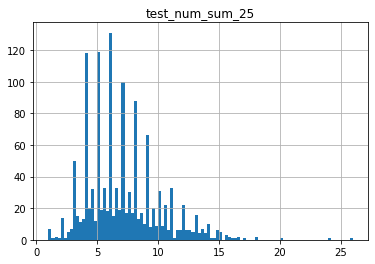

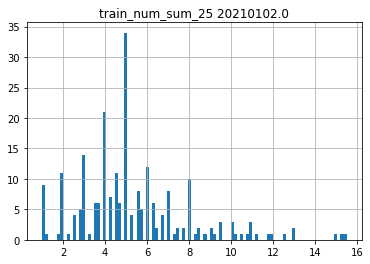

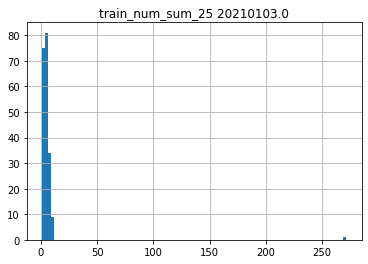

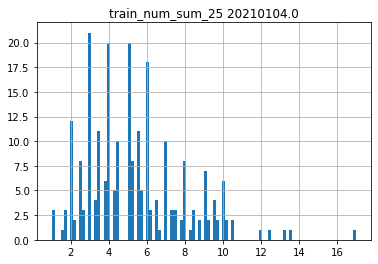

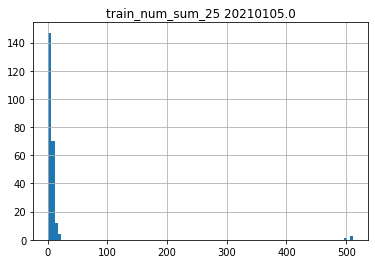

...

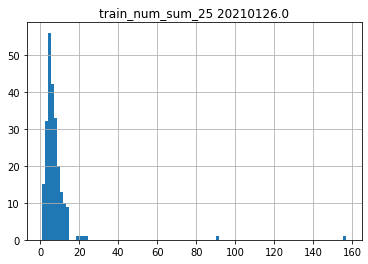

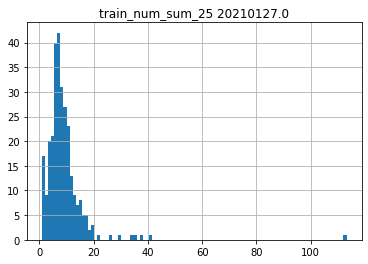

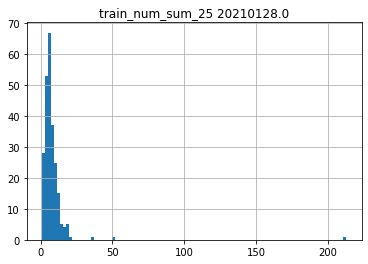

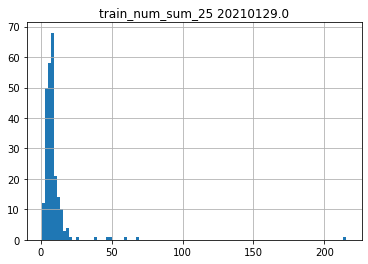

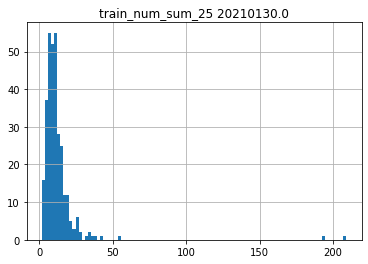

In [390]:
test_data['num_sum_25'].max()
train_data['num_sum_25'].max()

_ = test_data['num_sum_25'].hist(bins=100)
_ = plt.title("test_num_sum_25")
plt.show()

for i in train_data['date'].unique():
    _ = train_data.query("date == %s" % i)['num_sum_25'].hist(bins=100)
    _ = plt.title("train_num_sum_25 %s" % i)
    plt.show()
    

In [403]:
res = []
for col_i,col_j,train_corr in [i for i in top_corr_res if abs(i[-1]) > 0.7 and i[0].split("_")[0] != i[1].split("_")[0]]:
    test_corr = np.corrcoef(test_data[col_i],test_data[col_j])[0,1]
    res.append([col_i,col_j,round(train_corr,4),round(test_corr,4)])
sorted(res,key = lambda x: abs(x[-1] - x[-2]),reverse=True)

[['label', 'pred', 0.8994, 0.1543],
 ['pred', 'label', 0.8994, 0.1543],
 ['pred', 'all_due_time', 0.8954, 0.1587],
 ['num_sum_25', 'middle_order_num', 0.8508, 0.1416],
 ['middle_order_num', 'num_sum_25', 0.8508, 0.1416],
 ['num_sum_50', 'middle_order_num', 0.8639, 0.1601],
 ['middle_order_num', 'num_sum_50', 0.8639, 0.1601],
 ['num_sum_mean', 'middle_order_num', 0.8703, 0.2005],
 ['middle_order_num', 'num_sum_mean', 0.8703, 0.2005],
 ['last_order_num', 'num_sum_75', 0.8297, 0.175],
 ['num_sum_75', 'middle_order_num', 0.863, 0.2109],
 ['middle_order_num', 'num_sum_75', 0.863, 0.2109],
 ['last_order_num', 'num_sum_25', 0.8166, 0.1739],
 ['last_order_num', 'num_sum_50', 0.8303, 0.1902],
 ['last_order_num', 'num_sum_mean', 0.844, 0.4163],
 ['delivery_id_1', 'female_count', 0.7533, 0.6375],
 ['female_count', 'isnot_td_new_count', 0.7612, 0.6586],
 ['isnot_td_new_count', 'female_count', 0.7612, 0.6586],
 ['delivery_id_1', 'has_store_id_2', 0.7235, 0.6222],
 ['has_store_id_2', 'isnot_td_new_c

In [325]:
test_overrate[['first_length','first_eta','label','pred']]
np.corrcoef(test_overrate['first_eta'], test_overrate['label'])
np.corrcoef(test_overrate['first_eta'], test_overrate['pred'])
np.corrcoef(test_overrate['first_eta'], test_overrate['first_length'])

,first_length,first_eta,label,pred
16,35950.0,2536.0,3650.0,14056.770833
31,36656.0,2272.0,8284.0,15719.454167
92,28290.0,1805.0,9249.0,16457.987500
128,34849.0,2539.0,6736.0,18376.483333
137,17962.0,1796.0,8430.0,15579.137500
...,...,...,...,...
158,36387.0,2683.0,5200.0,15432.675000
159,18377.0,1876.0,8651.0,15305.308333
160,37251.0,2838.0,8579.0,15837.141667
161,47974.0,3473.0,7276.0,17520.062500


array([[ 1.        , -0.08334134],
       [-0.08334134,  1.        ]])

array([[ 1.        , -0.10975563],
       [-0.10975563,  1.        ]])

array([[1.        , 0.90176833],
       [0.90176833, 1.        ]])

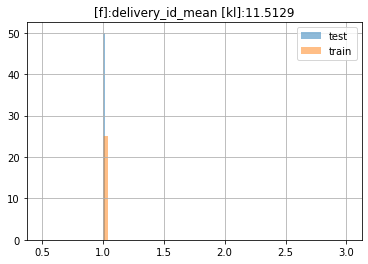

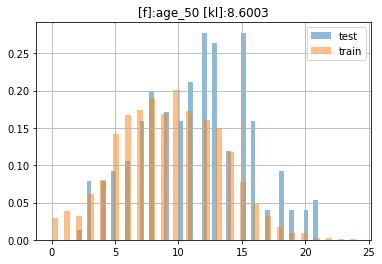

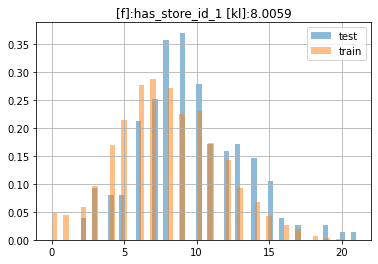

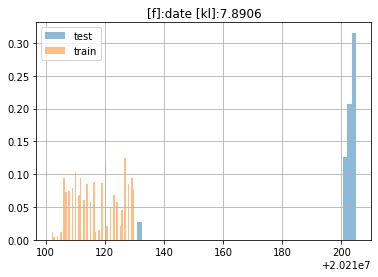

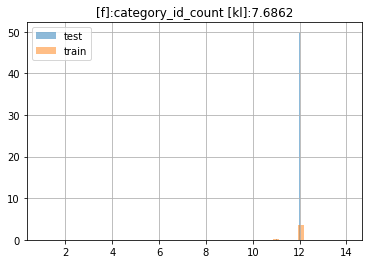

...

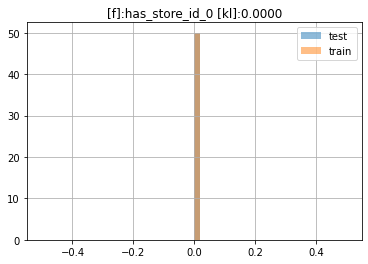

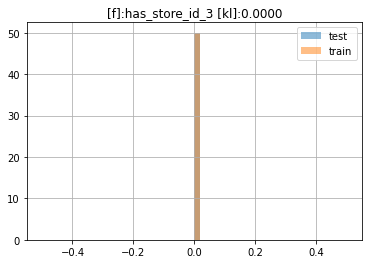

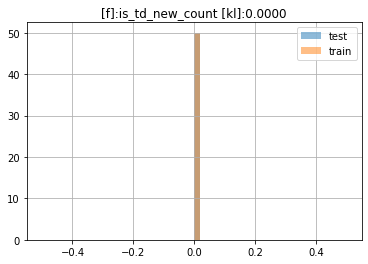

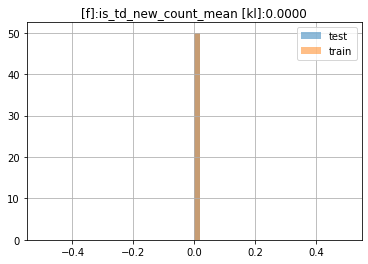

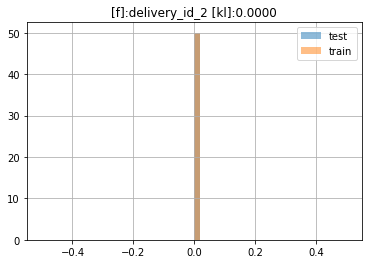

In [305]:
test_overrate = test_data.query("lbl_pred_diff >= 6478 and pred > label")
train_like_overrate = train_data.query("label >= %s and label <= %s" % (test_overrate['label'].min(), test_overrate['label'].max()))
test_underrate = test_data.query("lbl_pred_diff >= 6478 and pred < label")
train_like_underrate = train_data.query("label >= %s and label <= %s" % (test_underrate['label'].min(), test_underrate['label'].max()))

info = [(col,KL(test_overrate[col],train_like_overrate[col])) for col in test_overrate.columns]
info = sorted(info, key=lambda x:x[1], reverse=True)
for col,kl in info:
    if col == "driver_phone":
        continue
    _ = test_overrate[col].hist(bins=50,alpha=0.5,density=True,label='test')
    _ = train_like_overrate[col].hist(bins=50,alpha=0.5,density=True,label='train')
    _ = plt.legend()
    _ = plt.title("[f]:%s [kl]:%.4f" % (col,kl))
    plt.show()
    



# 异常数据分析

## GMV异常代表拆线
```
city gmv_err_cnt total_cnt
36_foshan 200 16232
133_huizhou 0 7522
109_jingzhou 0 4186
22_shijiazhuang_1 94 13644
17_chengdu 11 19485
19_kunming 110 9376
15_hefei 16 18185
9_zhengzhou 28 19522
6_wuhan_2 24 17985
6_wuhan_1 153 22137
```

In [74]:
hive_split_data_dir = "/nfs/project/zhoutongzt/ETA/data/drivers_for_split_line/*/*"
df_hive_split = pd.concat([pd.read_csv(fp, names=['line_id', 'warehouse_code', 'driver_phone_ori', 'date']) for fp in glob(data_dir)])


In [82]:
citys = ["36_foshan","133_huizhou","109_jingzhou","22_shijiazhuang_1","17_chengdu","19_kunming","15_hefei","9_zhengzhou","6_wuhan_2","6_wuhan_1"]

hive_split_data_dir = "/nfs/project/zhoutongzt/ETA/data/drivers_for_split_line/*/*"
df_hive_split = pd.concat([pd.read_csv(fp, names=['line_id', 'warehouse_code', 'driver_phone_ori', 'date']) for fp in glob(data_dir)])

for c in citys:
    header="driver_phone_ori,leader_age_str,leader_sex_num_str,store_type_str,has_store_id_str,is_td_new_leader,is_month_new_leader,delivery_id_str,num_sum_str,sku_cnt_str,user_cnt_str,gmv_str,leader_uid_cnt_str,line_num_sum_str,line_gmv_str,tocar_time_str,max_action_time_str,good_item_str,uid_str,eta_str".split(",")
    df = load_data(DATA_FP.format(c),"20210101","20210317",csv_options={"sep":";;","engine":"python","names":header})
    df_gmv_err=df[df['line_gmv_str'].apply(lambda x: len(set(x.split(","))) > 1)]
    df_gmv_err[['driver_phone_ori','date']].to_csv("/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/{}".format(c),index=False)
    print(c, df_gmv_err.shape[0],df.shape[0])
    
# df[df['line_gmv_str'].apply(lambda x: len(set(x.split(","))) > 1)][['driver_phone_ori','date']].to_csv("",index=False)



[2021-04-07 15:02:31,642-WARNING]: path not exist,dt:20210223 path: /nfs/project/zhoutongzt/ETA/data/36_foshan/20210223
[2021-04-07 15:02:32,674-WARNING]: empty df in dt: 20210312, path: /nfs/project/zhoutongzt/ETA/data/36_foshan/20210312
[2021-04-07 15:02:32,723-WARNING]: empty df in dt: 20210313, path: /nfs/project/zhoutongzt/ETA/data/36_foshan/20210313


36_foshan 200 16232


[2021-04-07 15:02:33,829-WARNING]: empty df in dt: 20210113, path: /nfs/project/zhoutongzt/ETA/data/133_huizhou/20210113
[2021-04-07 15:02:33,876-WARNING]: empty df in dt: 20210114, path: /nfs/project/zhoutongzt/ETA/data/133_huizhou/20210114
[2021-04-07 15:02:37,197-WARNING]: path not exist,dt:20210223 path: /nfs/project/zhoutongzt/ETA/data/133_huizhou/20210223
[2021-04-07 15:02:37,199-WARNING]: path not exist,dt:20210224 path: /nfs/project/zhoutongzt/ETA/data/133_huizhou/20210224
[2021-04-07 15:02:37,200-WARNING]: path not exist,dt:20210225 path: /nfs/project/zhoutongzt/ETA/data/133_huizhou/20210225
[2021-04-07 15:02:37,203-WARNING]: path not exist,dt:20210226 path: /nfs/project/zhoutongzt/ETA/data/133_huizhou/20210226
[2021-04-07 15:02:38,126-WARNING]: empty df in dt: 20210312, path: /nfs/project/zhoutongzt/ETA/data/133_huizhou/20210312
[2021-04-07 15:02:38,487-WARNING]: empty df in dt: 20210317, path: /nfs/project/zhoutongzt/ETA/data/133_huizhou/20210317


133_huizhou 0 7522
109_jingzhou 0 4186


[2021-04-07 15:02:44,108-WARNING]: empty df in dt: 20210106, path: /nfs/project/zhoutongzt/ETA/data/22_shijiazhuang_1/20210106
[2021-04-07 15:02:44,205-WARNING]: empty df in dt: 20210107, path: /nfs/project/zhoutongzt/ETA/data/22_shijiazhuang_1/20210107
[2021-04-07 15:02:44,281-WARNING]: empty df in dt: 20210108, path: /nfs/project/zhoutongzt/ETA/data/22_shijiazhuang_1/20210108
[2021-04-07 15:02:44,333-WARNING]: empty df in dt: 20210109, path: /nfs/project/zhoutongzt/ETA/data/22_shijiazhuang_1/20210109
[2021-04-07 15:02:44,383-WARNING]: empty df in dt: 20210110, path: /nfs/project/zhoutongzt/ETA/data/22_shijiazhuang_1/20210110
[2021-04-07 15:02:48,802-WARNING]: empty df in dt: 20210312, path: /nfs/project/zhoutongzt/ETA/data/22_shijiazhuang_1/20210312
[2021-04-07 15:02:48,845-WARNING]: empty df in dt: 20210313, path: /nfs/project/zhoutongzt/ETA/data/22_shijiazhuang_1/20210313


22_shijiazhuang_1 94 13644


[2021-04-07 15:02:52,310-WARNING]: path not exist,dt:20210208 path: /nfs/project/zhoutongzt/ETA/data/17_chengdu/20210208
[2021-04-07 15:02:52,804-WARNING]: empty df in dt: 20210218, path: /nfs/project/zhoutongzt/ETA/data/17_chengdu/20210218
[2021-04-07 15:02:53,019-WARNING]: path not exist,dt:20210223 path: /nfs/project/zhoutongzt/ETA/data/17_chengdu/20210223
[2021-04-07 15:02:53,966-WARNING]: empty df in dt: 20210312, path: /nfs/project/zhoutongzt/ETA/data/17_chengdu/20210312


17_chengdu 11 19485


[2021-04-07 15:02:57,616-WARNING]: empty df in dt: 20210312, path: /nfs/project/zhoutongzt/ETA/data/19_kunming/20210312


19_kunming 110 9376
15_hefei 16 18185


[2021-04-07 15:03:07,133-WARNING]: empty df in dt: 20210313, path: /nfs/project/zhoutongzt/ETA/data/9_zhengzhou/20210313


9_zhengzhou 28 19522


[2021-04-07 15:03:11,616-WARNING]: empty df in dt: 20210313, path: /nfs/project/zhoutongzt/ETA/data/6_wuhan_2/20210313


6_wuhan_2 24 17985


[2021-04-07 15:03:13,836-WARNING]: path not exist,dt:20210129 path: /nfs/project/zhoutongzt/ETA/data/6_wuhan_1/20210129
[2021-04-07 15:03:13,844-WARNING]: path not exist,dt:20210130 path: /nfs/project/zhoutongzt/ETA/data/6_wuhan_1/20210130
[2021-04-07 15:03:13,847-WARNING]: path not exist,dt:20210131 path: /nfs/project/zhoutongzt/ETA/data/6_wuhan_1/20210131


6_wuhan_1 153 22137


In [110]:
def drop_line_gmv_err(inpDF):
    data_dir = "/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/*"
    df = pd.concat([pd.read_csv(fp) for fp in glob(data_dir)])
    df.columns = ['driver_phone_ori', 'date']
    df['driver_tel_TEMPORARY'] = df['driver_phone_ori'].apply(lambda x: re.findall("[0-9]+", str(x))[0])
    df['tag'] = 1
    df = df[['driver_tel_TEMPORARY', 'date', 'tag']]
    df['date'] = df['date'].astype(int)

    inpDF['driver_tel_TEMPORARY'] = inpDF['driver_phone_ori'].apply(lambda x: re.findall("[0-9]+", str(x))[0])
    resDF = inpDF.merge(df, on=['driver_tel_TEMPORARY', 'date'], how='left').query("tag.isnull()")
    del resDF['tag']
    del resDF['driver_tel_TEMPORARY']
    return resDF

inpDF_ = load_data(DATA_PARSED_BY_LINE.format("19_kunming"), "20210101","20210317")
inpDF_.shape
drop_line_gmv_err(inpDF_).shape

inpDF_ = load_data(DATA_PARSED_BY_LINE.format("10-19-000001"), "20210101","20210317")
inpDF_.shape
drop_line_gmv_err(inpDF_).shape



[2021-04-07 15:31:56,253-WARNING]: path not exist,dt:20210312 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/19_kunming/20210312


(8655, 75)

(8559, 75)

(149010, 75)

(147954, 75)

In [96]:
data_dir = "/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/*"
[fp for fp in glob(data_dir)]
df_ = pd.concat([pd.read_csv(fp) for fp in glob(data_dir)])
df_['l'] = df['driver_phone_ori'].apply(lambda x: len(str(x)))
df_.sort_values(by='l')

['/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/6_wuhan_1',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/17_chengdu',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/9_zhengzhou',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/109_jingzhou',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/19_kunming',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/15_hefei',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/133_huizhou',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/22_shijiazhuang_1',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/36_foshan',
 '/nfs/project/zhoutongzt/ETA/data/drivers_for_line_gmv_err/6_wuhan_2']

,driver_phone_ori,date,l
0,17671859703,20210109,11
8,13690312722,20210101,11
9,18718740747,20210101,11
10,13922453210,20210101,11
11,13450814886,20210101,11
...,...,...,...
21,18132060929,20210118,11
22,19989992324,20210118,11
23,19813148231,20210118,11
16,13708604096,20210117,11


# Feats Lbl Corr

## Pre vis

In [36]:
def featHist_labelLine(cur_ax, data, col, title=None, bins=10,
                       label_color=None, feat_color=None):
    label_color = label_color if label_color is not None else 'steelblue'
    feat_color = feat_color if feat_color is not None else [0 / 255., 139 / 255., 69 / 255.]
    title = col if title is None else title
    _ = cur_ax.set_title(title)
    binsCnt_ori, binsHold = np.histogram(data[col], bins=bins)
    binsCnt = binsCnt_ori / binsCnt_ori.sum()  # 归一化
    binsHold[-1] += 0.001  # 为了包括最大值 | np.histogram每个bin左闭右开，最后一个bin包含最大值
    lbls = []
    for b, e in zip(binsHold[:-1], binsHold[1:]):
        lbl = data[data.apply(lambda r: b <= r[col] < e, axis=1)]['label'].to_numpy()
        lbls.append(lbl)
    lbls_mean = [i.mean() if i.shape[0]>0 else 0 for i in lbls]

    feat_axe = cur_ax
    lbl_axe = cur_ax.twinx()
    _ = feat_axe.set_ylim(0, 1.)
    _ = lbl_axe.set_ylim(0, 30000)
    _ = [i.set_color(feat_color) for i in feat_axe.get_yticklabels()]
    _ = [i.set_color(label_color) for i in lbl_axe.get_yticklabels()]

    X = list(range(len(lbls)))
    # label折线图
    plot = lbl_axe.plot(X, lbls_mean, label='ata', color=label_color)
    # label散点图
    _ = lbl_axe.scatter(x=X, y=lbls_mean, color=label_color)
    # label箱线图
    box = lbl_axe.boxplot(x=lbls, positions=range(len(lbls)))
    _ = [plt.setp(box[i], color=label_color) for i in ['boxes', 'whiskers', 'fliers','means','caps',
                                                       'medians']]  # 箱线图只能用plt.setp改属性 | 'boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps'
    # feat柱形图
    bar = feat_axe.bar(X, binsCnt, color=feat_color, label='feat', alpha=0.7)

    for x_loc, y_loc in zip(X, binsCnt):
        if binsCnt[x_loc] != 0:
            _ = feat_axe.text(x_loc - 0.4, y_loc + 0.01, binsCnt_ori[x_loc])

    _ = plt.grid(axis='y', color='grey', linestyle='--', lw=0.5, alpha=0.7)
    _ = plt.legend(plot + [bar], ['ata', 'feat'])
    return lbls, binsHold

# lbls,binsHold = featHist_labelLine(plt.gca(), chengduDF, 'age_75_q')


## Data

In [34]:
jinanDF = pd.read_csv("/nfs/project/zhoutongzt/ETA/merged_data/12_jinan_20201205_20210313.csv")
chengduDF = pd.read_csv("/nfs/project/zhoutongzt/ETA/merged_data/17_chengdu_20201205_20210313.csv")

jinanDF = jinanDF.query("date >= 20210220 and date <= 20210313")
chengduDF = chengduDF.query("date >= 20210220 and date <= 20210313")

# df = pd.read_csv("/nfs/project/zhoutongzt/ETA/data/12_jinan_tocar_3min_traj_tidy.csv",
#                  names=['tocar_3min_avg_dist', 'driver_phone_ori', 'date'], sep="\t",
#                  converters={'date': lambda x: x.replace("-", "")})

# df = df[np.isnan(df['driver_phone_ori']) == False]
# df['tag'] = 1
# df = df.astype(int)

# resDF = inpDF.merge(df, on=['driver_phone_ori', 'date'], how='left')
# inpDF.shape
# resDF.shape
# resDF.query("date >= 20210201 and date <= 20210313").shape
# resDF.query("tag.notnull()").shape
# data = resDF.query("date >= 20210201 and date <= 20210313 and tag.notnull()")
# data.shape
# del data['tag']



## Vis by date

20210220 20210227
20210227 20210306
20210306 20210313


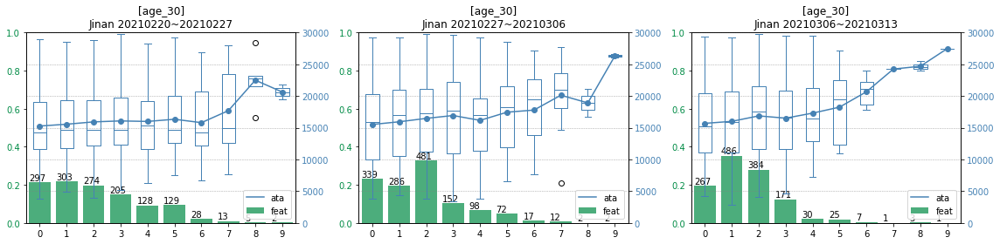

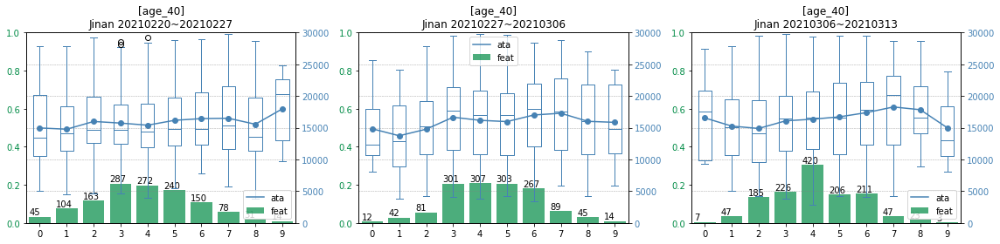

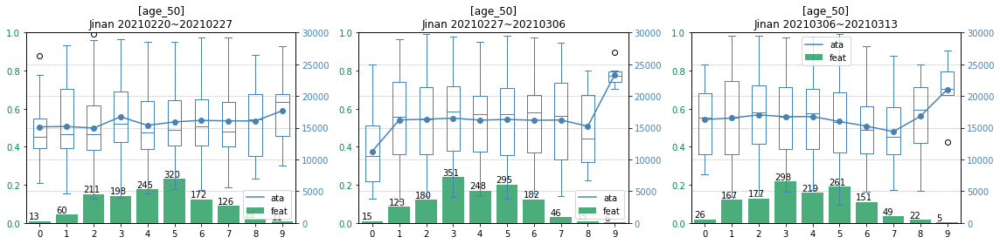

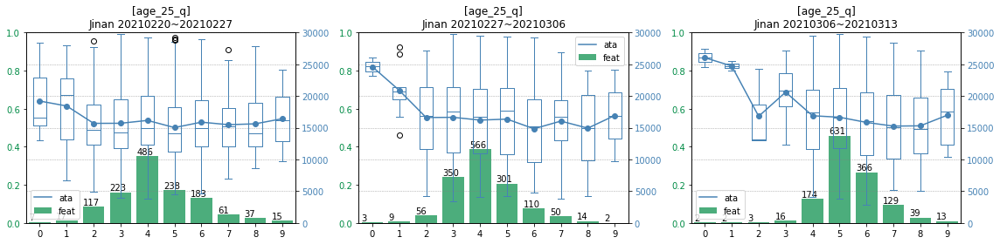

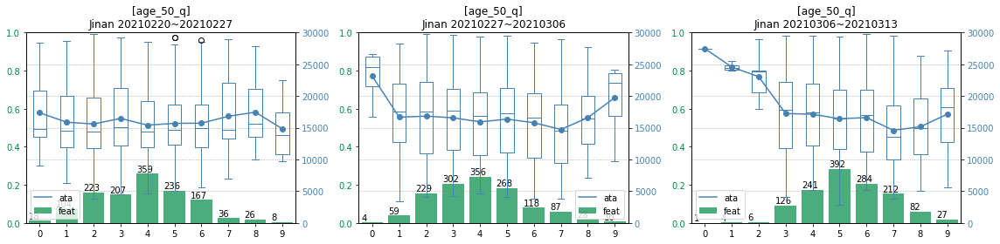

...

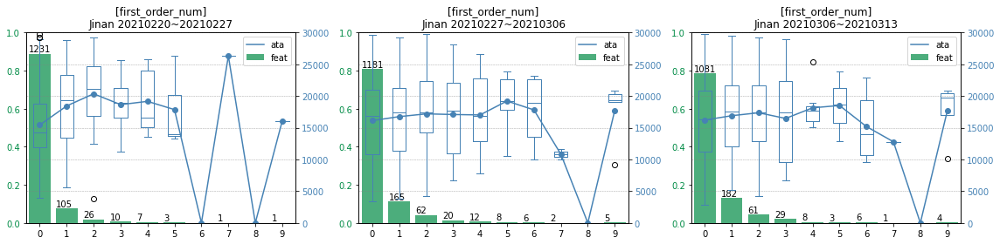

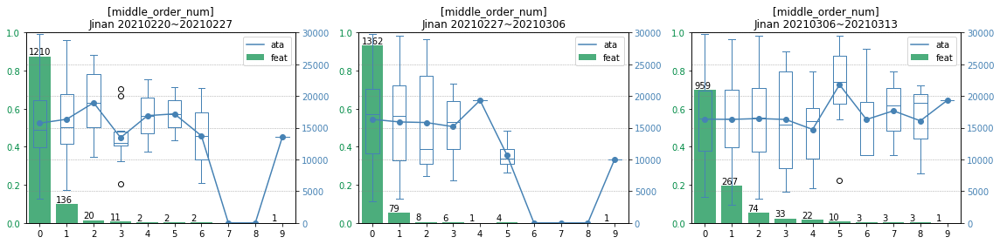

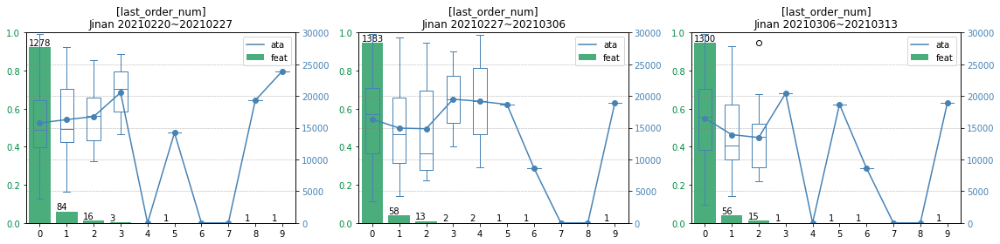

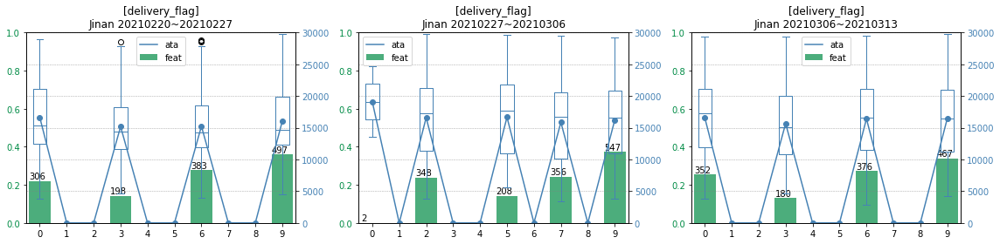

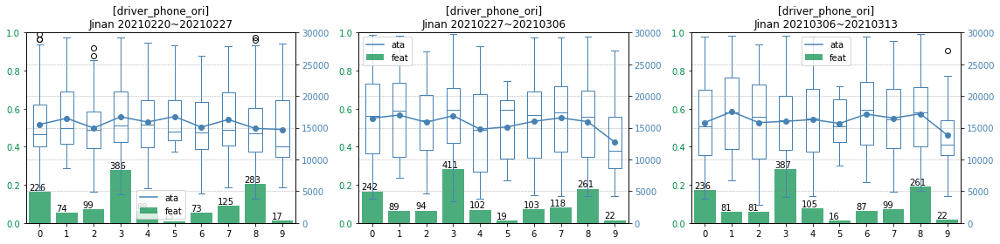

In [38]:
fromDt = str(jinanDF['date'].min())
toDt = str(jinanDF['date'].max())
b = fromDt
jinan_dfs = []
chengdu_dfs = []
while True:
    e = datetime.strftime(datetime.strptime(b,'%Y%m%d')+timedelta(7),"%Y%m%d")
    print(b,e)
    jinan_dfs.append([b,e,jinanDF.query("%s <= date and date <= %s" % (b,e))])
    chengdu_dfs.append([b,e,chengduDF.query("%s <= date and date <= %s" % (b,e))])
    b = e
    if b >= toDt:
        break


# for col in ['delivery_id_1']:
for col in jinanDF.columns:
    if col=='driver_phone':
        continue
        
    fig,axes=plt.subplots(math.ceil(len(jinan_dfs)/3),3, figsize=(16,4))
    axef=axes.flatten()
    fig.set_tight_layout(True)
    for idx,(b,e,df) in enumerate(jinan_dfs):
        if not df.empty:
            _ = featHist_labelLine(cur_ax=axef[idx], data=df, col=col, title="[%s]\nJinan %s~%s" % (col,b,e))
    plt.show()
    
#     fig,axes=plt.subplots(math.ceil(len(chengdu_dfs)/3),3, figsize=(16,4))
#     axef=axes.flatten()
#     fig.set_tight_layout(True)
#     for idx,(b,e,df) in enumerate(chengdu_dfs):
#         if not df.empty:
#             _ = featHist_labelLine(cur_ax=axef[idx], data=df, col=col, title="[%s]\nChengdu %s~%s" % (col,b,e))
#     plt.show()

## Vis by feats

>>> plotting cols: age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count


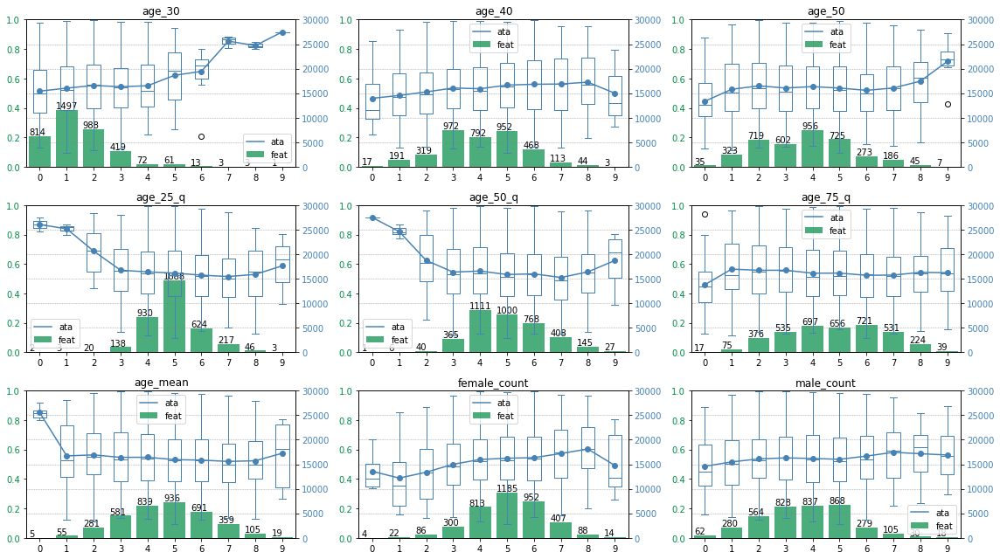

>>> plotting cols: gender_50,store_type_25,store_type_50,store_type_75,store_type_mean,has_store_id_-1,has_store_id_0,has_store_id_1,has_store_id_2


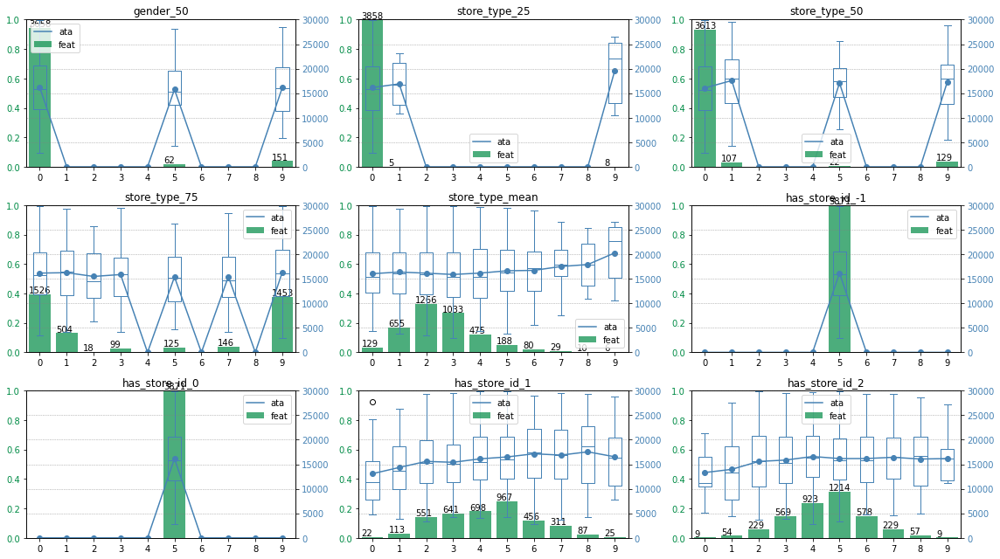

>>> plotting cols: has_store_id_3,has_store_id_mean,isnot_td_new_count,is_td_new_count,is_td_new_count_mean,is_month_new_leader,isnot_month_new_leader,is_month_new_leader_mean,delivery_id_1


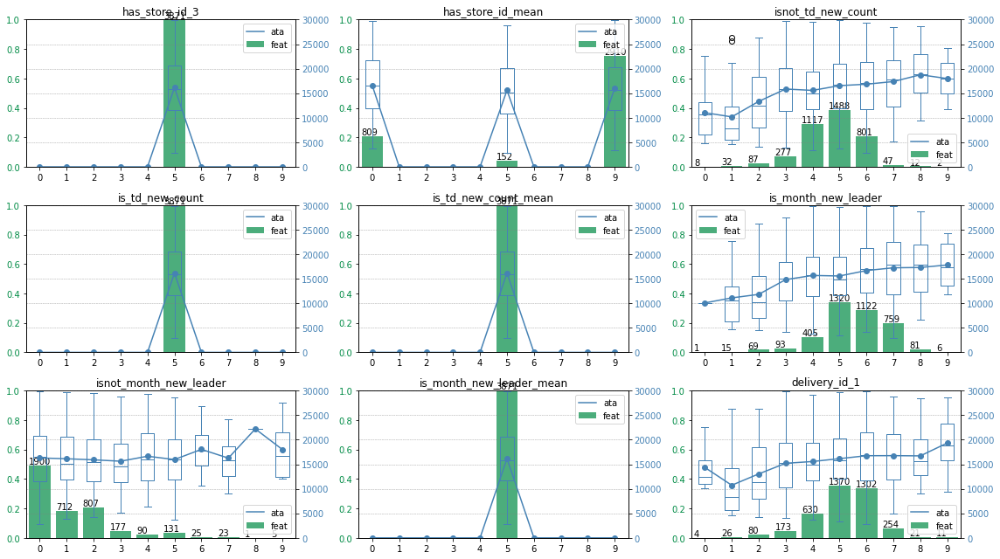

>>> plotting cols: delivery_id_2,delivery_id_3,delivery_id_mean,num_sum_25,num_sum_50,num_sum_75,num_sum_mean,sku_cnt_25,sku_cnt_50


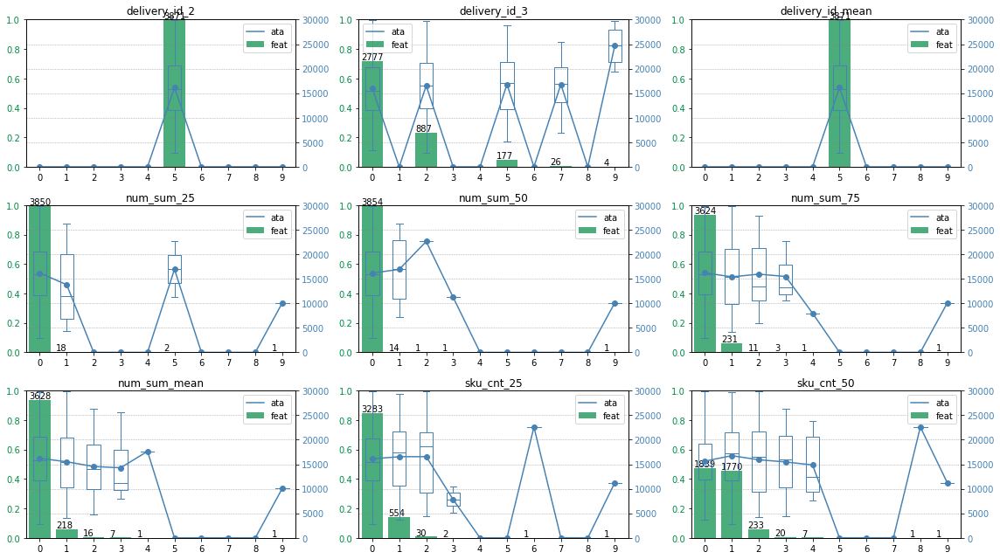

>>> plotting cols: sku_cnt_75,sku_cnt_mean,user_cnt_25,user_cnt_50,user_cnt_75,user_cnt_mean,gmv_25,gmv_50,gmv_75


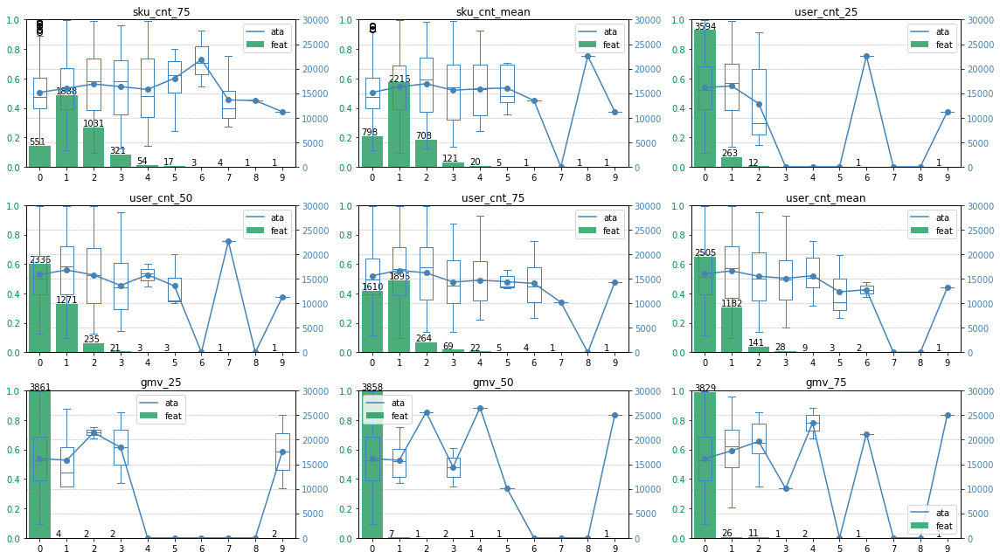

>>> plotting cols: gmv_mean,leader_uid_cnt,line_num_sum,line_gmv,line_sku_cnt,fruits_count,vgtble_count,fresh_count,category_id_count


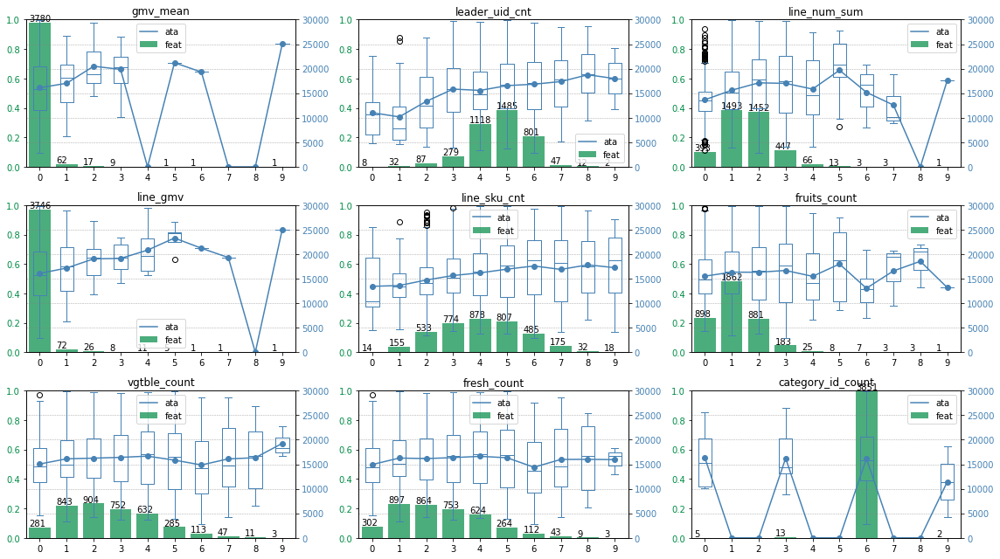

>>> plotting cols: refrigeration_type_0,refrigeration_type_1,refrigeration_type_2,refrigeration_type_3,first_eta,first_length,leader_eta,leader_length,first_order_num


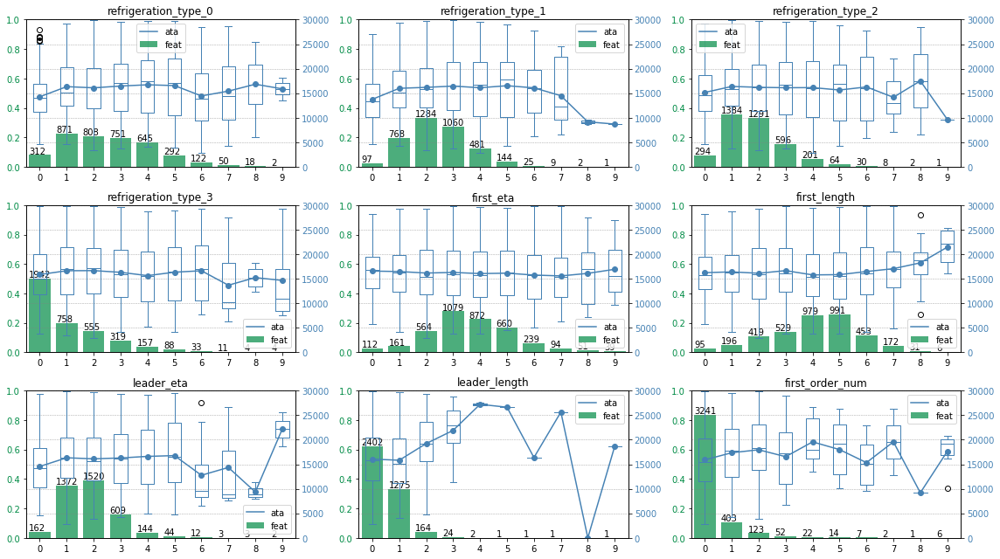

>>> plotting cols: middle_order_num,last_order_num,delivery_flag,driver_phone_ori


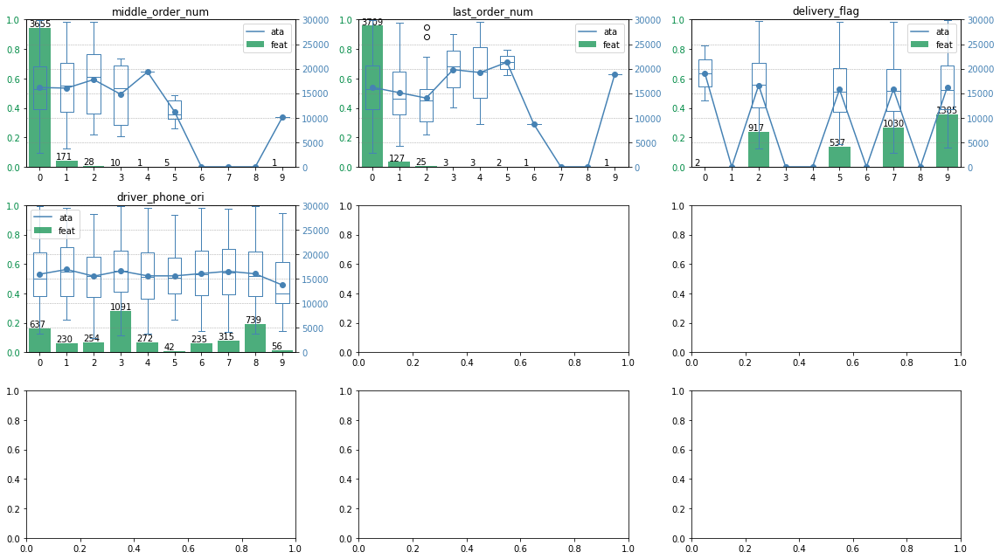

In [319]:

# 各个特征的分布和ata的关系
allCols = [i for i in jinanDF.columns if i not in DropCols]
for idx_i in range(0, len(allCols), 9):
    cols = allCols[idx_i:idx_i + 9]
    print(">>> plotting cols: %s" % ",".join(cols))
    fig, axes = plt.subplots(3, 3, figsize=(16, 9))
    _ = fig.set_tight_layout(True)
    axef = axes.flatten()
    for idx, col in enumerate(cols):
        cur_ax = axef[idx]
        _ = featHist_labelLine(cur_ax, jinanDF, col)
    plt.show()

# Debug Tmp

In [9]:
line="18649851231_9;;38,36,30,31,26,47,32,33,32,23,62,41,44,27,29,32,45;;0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0;;2,1,50,50,7,4,1,1,50,1,1,50,1,2,50,2,1;;1,2,2,2,1,2,2,2,2,2,2,2,2,1,2,1,2;;0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0;;1,1,1,0,1,0,0,1,0,1,1,1,1,1,1,0,1;;1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1;;80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005,80-34-000005;;9,40,1,5,1,5,42,30,25,2,7,3,29,1,22,1,1;;7,20,1,4,1,5,24,25,14,2,4,2,15,1,15,1,1;;7,6,1,5,1,5,11,3,9,2,2,1,6,1,5,1,1;;21.040000,140.380000,2.580000,4.990000,2.380000,12.300000,229.170000,114.920000,79.770000,2.390000,33.190000,13.580000,63.670000,2.580000,109.570000,2.580000,2.580000;;17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17;;224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0,224.0;;837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998,837.6699999999998;;2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13,2020-12-18 08:27:13;;2020-12-18 10:59:31,2020-12-18 11:00:00,2020-12-18 11:02:57,2020-12-18 10:59:09,2020-12-18 11:01:52,2020-12-18 09:13:20,2020-12-18 11:03:14,2020-12-18 11:01:00,2020-12-18 10:58:45,2020-12-18 09:40:42,2020-12-18 10:52:47,2020-12-18 10:25:32,2020-12-18 09:24:08,2020-12-18 11:02:34,2020-12-18 11:01:21,2020-12-18 08:52:24,2020-12-18 11:00:36;;28.0,27.0,61.0,11,88.0,45.0,20.0,0.0;;639247267753623289,639247267774259779,639247267774917507,639247267728760975,639247267817234806,639247267686042964,639247267644557960,639247267774570915,639247267687019933,639247267775237651,639247267774672765,639247267775629605,639247267775256465,639247267820255620,639247267793961088,639247267587068515,639247267774314651;;0_1179_10624_1179,1_427_2510_427,2_449_1511_449,3_54_308_54,4_148_621_148,5_202_864_202,6_255_1421_255,7_10_70_10,8_30_196_30,9_133_992_133,10_0_0_0,11_153_866_153,12_113_392_113,13_195_928_195,14_96_563_96,15_103_645_103,16_295_1548_295"
print(len(line.split(";;")))
driver_phone_ori, leader_age_str, leader_sex_num_str, store_type_str, has_store_id_str, is_td_new_leader, is_month_new_leader, delivery_id_str, warehouse_code_str, num_sum_str, \
                sku_cnt_str, user_cnt_str, gmv_str, leader_uid_cnt_str, line_num_sum_str, line_gmv_str, tocar_time_str, max_action_time_str, \
                good_item_str, uid_str, eta_str = line.split(";;")


21


# Data Debug

## 添加统计特征

In [4]:
trainDF = pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/trainDF.pkl.tmp")
ctrFromDt,ctrToDt = trainDF['date'].min(),trainDF['date'].max()

testDF = pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/bin/testDF.pkl.tmp")
df = exp_demo.statistic_feats(pd.concat([trainDF,testDF]),ctrFromDt,ctrToDt)

trainDF = df[df['date'] <= ctrToDt]
testDF = df[df['date' > ctrToDt]]

0         20210401
1         20210401
2         20210401
3         20210401
4         20210401
            ...   
108049    20210423
108050    20210423
108051    20210423
108052    20210423
108053    20210423
Name: date, Length: 108054, dtype: int64

0it [00:00, ?it/s]

>>> processing 1st-order


NameError: name 'data_df' is not defined

## parse4rnn

In [279]:
city="17_chengdu"
fromDt,toDt="20210301","20210424"
fp = "/nfs/project/zhoutongzt/ETA/data_parsed_by_rnn/{}/{}"
fp_list = [fp.format(city, dt) for dt in sampleUtils.get_dates(fromDt, toDt)]
fp_list = [fp for fp in fp_list if os.path.getsize(fp) > 5]

df = pd.concat([pd.read_csv(fp) for fp in fp_list])
df.shape

(304981, 22)

In [5]:
from models import RNNDemo

city = "17_chengdu"
trainFromDt = "20210301"
trainToDt = "20210301"
testFromDt = "20210424"
testToDt = "20210430"
fetcher = RNNDemo.DataFetcher()
df = fetcher.load_data(city, trainFromDt, trainToDt)


[2021-05-17 21:25:38-INFO]: >>> 处理id类特征
[2021-05-17 21:25:38-INFO]: feat: leader_sex_num_str OOV-rate: 0.0000
[2021-05-17 21:25:38-INFO]: feat: store_type_str OOV-rate: 0.0000
[2021-05-17 21:25:38-INFO]: feat: has_store_id_str OOV-rate: 0.0000
[2021-05-17 21:25:38-INFO]: feat: is_td_new_leader OOV-rate: 0.0000
[2021-05-17 21:25:38-INFO]: feat: is_month_new_leader OOV-rate: 0.0000
[2021-05-17 21:25:38-INFO]: feat: delivery_id_str OOV-rate: 0.0000
[2021-05-17 21:25:38-INFO]: >>> 聚合成序列样本


  0%|          | 0/181 [00:00<?, ?it/s]

AttributeError: 'numpy.float64' object has no attribute 'to_list'

In [19]:
self= RNNDemo.DataFetcher()
df = self._load_explode_data(city, "20210301", "20210301")
training=True
if training:
    self.catIdx = {}
    curIdx = 0
    for col in self.cat_cols:
        for feat in np.sort(df[col].unique()):
            self.catIdx.update({"%s=%s" % (col, feat): curIdx})
            curIdx += 1

for col in self.cat_cols:
    df[col] = df[col].apply(lambda x: self.catIdx.get("%s=%s" % (col, x), -1)).astype(int)
    logging.info("feat: %s OOV-rate: %.4f" % (col, df[col].value_counts().to_dict().get(-1, 0)/df.shape[0]))



[2021-05-18 10:32:51-INFO]: feat: leader_sex_num_str OOV-rate: 0.0000
[2021-05-18 10:32:51-INFO]: feat: store_type_str OOV-rate: 0.0000
[2021-05-18 10:32:51-INFO]: feat: has_store_id_str OOV-rate: 0.0000
[2021-05-18 10:32:51-INFO]: feat: is_td_new_leader OOV-rate: 0.0000
[2021-05-18 10:32:51-INFO]: feat: is_month_new_leader OOV-rate: 0.0000
[2021-05-18 10:32:51-INFO]: feat: delivery_id_str OOV-rate: 0.0000


In [20]:
res = []
for keys, dfg in tqdm(df.groupby(["driver_phone_ori", "date"])):
    driver_tel, date = keys
    leader_uid_cnt = dfg['leader_uid_cnt'].iloc[0]
    label = float(dfg['label'].iloc[0])
    feats = []
    for idx, row in dfg.iterrows():
        feats.append((row['trans_index'],
                      row[self.cat_cols].astype(int).to_list(),
                      row[self.num_cols].astype(float).to_list(),
                      # row['uid_str'].astype(int),
                      row['leader_ata'].astype(float)),)
    feats = sorted(feats, key=lambda x: x[0])
    cat_feats = [i[1] for i in feats]
    num_feats = [i[2] for i in feats]
    leader_ata = [i[3] for i in feats]
    res.append([driver_tel, date, leader_uid_cnt, label, cat_feats, num_feats, leader_ata])
    break

  0%|          | 0/181 [00:00<?, ?it/s]

In [361]:
def pad_leaders(inpDF, pad_size=None):
    pad_size = inpDF['cat_feats'].apply(lambda x: len(x)).max() if pad_size is None else pad_size
    print("max pad_size: %s" % pad_size)
    cat_pad_item = [-1] * len(inpDF['cat_feats'].iloc[0][0])
    num_pad_item = [0.0] * len(inpDF['num_feats'].iloc[0][0])
    inpDF['cat_feats'] = inpDF['cat_feats'].apply(lambda x: (x + [cat_pad_item] * pad_size)[:pad_size])
    inpDF['num_feats'] = inpDF['num_feats'].apply(lambda x: (x + [num_pad_item] * pad_size)[:pad_size])
    return inpDF
df
pad_leaders(df)

,driver_phone_ori,date,leader_uid_cnt,label,cat_feats,num_feats
0,13158757278,20210301,33.0,13378,"[[0, 4, 12, 14, 15, 16], [0, 10, 13, 14, 15, 1...","[[36.0, 10.0, 5.0, 4.0, 33.74, 2250.0, 14189.0..."
1,13198756883,20210301,31.0,14746,"[[0, 3, 13, 14, 15, 16], [0, 7, 13, 14, 15, 16...","[[46.0, 16.0, 14.0, 5.0, 67.55, 2915.0, 23310...."
2,13228325667,20210301,29.0,14239,"[[1, 3, 13, 14, 15, 17], [0, 8, 12, 14, 15, 16...","[[39.0, 113.0, 60.0, 31.0, 383.63999999999993,..."
3,13258380358,20210301,30.0,13785,"[[1, 3, 13, 14, 15, 16], [0, 3, 13, 14, 15, 16...","[[53.0, 7.0, 5.0, 3.0, 26.55, 2718.0, 17287.0,..."
4,13281806785,20210301,26.0,20913,"[[1, 3, 13, 14, 15, 16], [1, 5, 13, 14, 15, 16...","[[24.0, 3.0, 3.0, 2.0, 11.97, 2168.0, 20612.0,..."
...,...,...,...,...,...,...
176,19302663458,20210301,23.0,13564,"[[1, 5, 13, 14, 15, 16], [1, 2, 11, 14, 15, 16...","[[46.0, 212.0, 106.0, 61.0, 956.09, 2069.0, 18..."
177,19812805998,20210301,31.0,11800,"[[1, 3, 13, 14, 15, 16], [1, 6, 13, 14, 15, 16...","[[43.0, 4.0, 4.0, 2.0, 9.16, 1851.0, 14139.0, ..."
178,19940816116,20210301,28.0,15015,"[[0, 2, 11, 14, 15, 16], [0, 10, 12, 14, 15, 1...","[[31.0, 16.0, 13.0, 6.0, 38.05, 2905.0, 33285...."
179,19960659940,20210301,34.0,18280,"[[1, 3, 13, 14, 15, 16], [0, 3, 13, 14, 15, 16...","[[24.0, 20.0, 13.0, 1.0, 95.56, 1986.0, 12997...."


max pad_size: 37


,driver_phone_ori,date,leader_uid_cnt,label,cat_feats,num_feats
0,13158757278,20210301,33.0,13378,"[[0, 4, 12, 14, 15, 16], [0, 10, 13, 14, 15, 1...","[[36.0, 10.0, 5.0, 4.0, 33.74, 2250.0, 14189.0..."
1,13198756883,20210301,31.0,14746,"[[0, 3, 13, 14, 15, 16], [0, 7, 13, 14, 15, 16...","[[46.0, 16.0, 14.0, 5.0, 67.55, 2915.0, 23310...."
2,13228325667,20210301,29.0,14239,"[[1, 3, 13, 14, 15, 17], [0, 8, 12, 14, 15, 16...","[[39.0, 113.0, 60.0, 31.0, 383.63999999999993,..."
3,13258380358,20210301,30.0,13785,"[[1, 3, 13, 14, 15, 16], [0, 3, 13, 14, 15, 16...","[[53.0, 7.0, 5.0, 3.0, 26.55, 2718.0, 17287.0,..."
4,13281806785,20210301,26.0,20913,"[[1, 3, 13, 14, 15, 16], [1, 5, 13, 14, 15, 16...","[[24.0, 3.0, 3.0, 2.0, 11.97, 2168.0, 20612.0,..."
...,...,...,...,...,...,...
176,19302663458,20210301,23.0,13564,"[[1, 5, 13, 14, 15, 16], [1, 2, 11, 14, 15, 16...","[[46.0, 212.0, 106.0, 61.0, 956.09, 2069.0, 18..."
177,19812805998,20210301,31.0,11800,"[[1, 3, 13, 14, 15, 16], [1, 6, 13, 14, 15, 16...","[[43.0, 4.0, 4.0, 2.0, 9.16, 1851.0, 14139.0, ..."
178,19940816116,20210301,28.0,15015,"[[0, 2, 11, 14, 15, 16], [0, 10, 12, 14, 15, 1...","[[31.0, 16.0, 13.0, 6.0, 38.05, 2905.0, 33285...."
179,19960659940,20210301,34.0,18280,"[[1, 3, 13, 14, 15, 16], [0, 3, 13, 14, 15, 16...","[[24.0, 20.0, 13.0, 1.0, 95.56, 1986.0, 12997...."


## 有些天的data特征有问题

In [11]:
line="""
13332865172;;36,42,34,47,31,24,47,27,41,32,34,36,41,52,27,46,33,44,49,48,50,43,39,47;;0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0;;1,1,5,7,50,50,50,1,4,1,50,2,1,4,3,5,2,1,50,6,50,1,50,1;;1,2,2,1,2,2,2,2,2,2,1,1,2,2,2,2,1,2,1,2,1,2,1,2;;0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0;;0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0;;1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1;;3,54,16,2,24,1,35,13,53,14,166,162,5,9,13,6,31,8,226,24,22,3,13,6;;1,33,8,1,11,1,15,11,26,13,74,23,3,3,5,6,5,4,33,13,7,1,2,4;;1,13,7,1,3,1,4,1,11,2,36,110,1,2,3,1,1,1,6,3,2,1,1,1;;9.870000,182.510000,57.330000,7.960000,128.760000,29.900000,127.140000,41.970000,243.040000,108.120000,1390.710000,1881.190000,32.790000,6.430000,79.300000,41.130000,104.920000,28.520000,403.220000,154.350000,612.400000,29.700000,62.970000,9.540000;;24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24,24;;909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0,909.0;;5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77,5773.77;;2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47,2021-01-01 07:00:47;;2021-01-01 10:22:11,2021-01-01 10:06:04,2021-01-01 11:48:36,2021-01-01 10:27:00,2021-01-01 10:52:09,2021-01-01 08:20:56,2021-01-01 11:41:25,2021-01-01 12:15:31,2021-01-01 12:34:40,2021-01-01 10:38:48,2021-01-01 09:25:54,2021-01-01 13:01:34,2021-01-01 08:27:19,2021-01-01 10:16:28,2021-01-01 09:36:15,2021-01-01 09:35:44,2021-01-01 13:18:22,2021-01-01 08:33:53,2021-01-01 11:19:06,2021-01-01 11:34:19,2021-01-01 12:06:44,2021-01-01 11:01:15,2021-01-01 10:57:39,2021-01-01 10:31:34;;127.0,105.0,511.0,13,694.0,50.0,121.0,2.0;;639264856657801826,639264856636965495,639264856633170921,639264856652790554,639264856650688775,639264856646966309,639264856657471084,639264856639383982,639264856636624680,639264856664737472,639264856650956731,639264856635367256,639264856646986698,639264856642978614,639264856637353351,639264856634593464,639264856634611417,639264856647434933,639264856663331174,639247267727429755,639264856656705103,639264856635740131,639264856663337944,639264856633535121;;0_2924_49839_2924,1_63_436_63,2_55_503_55,3_110_696_110,4_15_62_15,5_17_110_17,6_118_782_118,7_79_393_79,8_139_949_139,9_149_877_149,10_57_435_57,11_32_300_32,12_93_508_93,13_140_700_140,14_21_106_21,15_42_235_42,16_79_464_79,17_66_550_66,18_49_246_49,19_204_1166_204,20_118_581_118,21_179_1169_179,22_135_889_135,23_74_425_74
"""
line=line.strip().split(";;")
driver_phone_ori, leader_age_str, leader_sex_num_str, store_type_str, has_store_id_str, is_td_new_leader, is_month_new_leader, delivery_id_str, num_sum_str, \
                sku_cnt_str, user_cnt_str, gmv_str, leader_uid_cnt_str, line_num_sum_str, line_gmv_str, tocar_time_str, max_action_time_str, \
                good_item_str, uid_str, eta_str = line

last_uid = sorted(zip(uid_str.split(","), max_action_time_str.split(",")), key=lambda x:x[1])[-1][0]
last_action_time = sorted(max_action_time_str.split(","))[-1]
tocar_time = tocar_time_str.split(",")[-1]

last_uid,last_action_time,tocar_time



('639264856634611417', '2021-01-01 13:18:22', '2021-01-01 07:00:47')

## 有没有特征异常的

In [10]:
city="10-19-000001"
city="19_kunming"
data_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}".format(city)
model_fp = "/nfs/project/zhoutongzt/ETA/{}_model.lgb".format(city)
M = lgb.Booster(model_file=model_fp)

df = load_data(data_dir,"20210311","20210317")
# df['tel'] = df['driver_phone_ori'].apply(lambda x: x.split("_")[0])
# df['idx'] = df['driver_phone_ori'].apply(lambda x: int(x.split("_")[1]))
feats = [i for i in df.columns if i not in DropCols]
print(",".join(feats))
df['pred'] = M.predict(df[feats])

df.shape
if df.query("leader_length == 0").shape[0]>0:
    print("leader_length为0的有 %s" % df.query("leader_length == 0").shape[0])
    df.query("leader_length == 0")[['driver_phone_ori','last_uid','date','leader_length','first_length','label','pred']]
    metric(df.query("leader_length == 0")['label'], df.query("leader_length == 0")['pred'])


df[feats].describe()

metric2(df)



[2021-03-25 18:18:29,180-WARNING]: path not exist,dt:20210312 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/19_kunming/20210312


age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count,gender_50,store_type_25,store_type_50,store_type_75,store_type_mean,has_store_id_-1,has_store_id_0,has_store_id_1,has_store_id_2,has_store_id_3,has_store_id_mean,isnot_td_new_count,is_td_new_count,is_td_new_count_mean,is_month_new_leader,isnot_month_new_leader,is_month_new_leader_mean,delivery_id_1,delivery_id_2,delivery_id_3,delivery_id_mean,num_sum_25,num_sum_50,num_sum_75,num_sum_mean,sku_cnt_25,sku_cnt_50,sku_cnt_75,sku_cnt_mean,user_cnt_25,user_cnt_50,user_cnt_75,user_cnt_mean,gmv_25,gmv_50,gmv_75,gmv_mean,leader_uid_cnt,line_num_sum,line_gmv,line_sku_cnt,first_eta,first_length,leader_eta,leader_length,first_order_num,middle_order_num,last_order_num,delivery_flag


(642, 76)

,age_30,age_40,age_50,age_25_q,age_50_q,age_75_q,age_mean,female_count,male_count,gender_50,store_type_25,store_type_50,store_type_75,store_type_mean,has_store_id_-1,has_store_id_0,has_store_id_1,has_store_id_2,has_store_id_3,has_store_id_mean,isnot_td_new_count,is_td_new_count,is_td_new_count_mean,is_month_new_leader,isnot_month_new_leader,is_month_new_leader_mean,delivery_id_1,delivery_id_2,delivery_id_3,delivery_id_mean,num_sum_25,num_sum_50,num_sum_75,num_sum_mean,sku_cnt_25,sku_cnt_50,sku_cnt_75,sku_cnt_mean,user_cnt_25,user_cnt_50,user_cnt_75,user_cnt_mean,gmv_25,gmv_50,gmv_75,gmv_mean,leader_uid_cnt,line_num_sum,line_gmv,line_sku_cnt,first_eta,first_length,leader_eta,leader_length,first_order_num,middle_order_num,last_order_num,delivery_flag
count,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.0,642.000000,642.000000,642.000000,642.0,642.000000,642.000000,642.0,642.0,642.000000,642.000000,642.000000,642.000000,642.0,642.000000,642.0,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000,642.000000
mean,7.394081,12.565421,10.911215,31.079050,36.503115,43.401869,37.498417,18.297508,12.573209,0.161215,1.146807,5.259346,33.732477,16.833230,0.0,0.009346,11.118380,19.742991,0.0,1.860592,30.870717,0.0,0.0,25.819315,5.051402,0.015576,30.686916,0.0,0.183801,1.0,2.808411,6.968847,16.352804,15.609080,2.071651,4.874611,10.471184,8.805560,1.051012,1.733645,3.543224,3.698039,11.899155,31.661643,77.182060,71.063433,30.861371,451.484424,2085.333614,263.389408,3170.218069,39011.679128,4358.118380,25489.676012,36.696262,13.518692,16.604361,2.596573
std,3.105352,3.322911,3.472185,2.231896,3.001558,3.297388,2.281000,3.575828,3.199322,0.351205,0.432857,10.247641,20.617112,5.302336,0.0,0.096296,3.864112,4.680859,0.0,0.340398,3.390422,0.0,0.0,5.121768,3.641352,0.123926,3.456453,0.0,0.429620,0.0,1.883217,4.045736,10.615127,12.616340,1.264358,2.582691,5.710357,4.431910,0.303751,0.881384,2.161521,2.620511,8.564923,20.240459,44.754198,46.936607,3.392352,211.050195,879.450055,100.419655,540.105120,8434.258492,1759.568804,15860.853491,82.884068,21.625816,47.174412,1.174689
min,0.000000,1.000000,1.000000,25.000000,28.000000,32.000000,28.451613,2.000000,1.000000,0.000000,1.000000,1.000000,2.000000,3.500000,0.0,0.000000,2.000000,2.000000,0.0,1.000000,7.000000,0.0,0.0,0.000000,0.000000,0.000000,6.000000,0.0,0.000000,1.0,1.000000,2.000000,4.750000,4.030303,1.000000,1.000000,3.000000,2.942857,1.000000,1.000000,1.000000,1.424242,3.490000,7.165000,23.515000,21.921875,7.000000,131.000000,657.360000,94.000000,23.000000,152.000000,124.000000,738.000000,0.000000,1.000000,1.000000,0.000000
25%,5.000000,10.250000,9.000000,30.000000,34.500000,41.250000,35.946212,16.000000,11.000000,0.000000,1.000000,2.000000,6.500000,13.000000,0.0,0.000000,8.250000,17.000000,0.0,2.000000,30.000000,0.0,0.0,24.000000,3.000000,0.000000,30.000000,0.0,0.000000,1.0,2.000000,4.500000,10.312500,9.455195,1.000000,3.000000,7.000000,5.977273,1.000000,1.000000,2.562500,2.467188,6.883750,21.340000,51.043750,46.203036,30.000000,289.500000,1436.195000,185.250000,2909.750000,35948.500000,3270.750000,17938.000000,3.000000,2.000000,2.000000,1.000000
50%,7.000000,13.000000,11.000000,31.000000,36.000000,43.500000,37.419355,19.000000,13.000000,0.000000,1.000000,3.000000,50.000000,16.333333,0.0,0.000000,11.000000,20.000000,0.0,2.000000,31.000000,0.0,0.0,27.000000,4.000000,0.000000,31.000000,0.0,0.000000,1.0,2.250000,6.000000,14.000000,12.903226,2.000000,4.000000,9.000000,7.770430,1.000000,2.000000,3.000000,3.125122,10.048750,28.197500,66.707500,60.086606,31.000000,403.500000,1889.795000,241.500000,3203.000000,39179.500000,4094.500000,22668.000000,8.000000

{'count': 642.0,
 'me': 1055.2828889320322,
 'mae': 3460.1018258504523,
 'mape': 0.2366855968066006,
 'badcase': 0.24766355140186916,
 'underrate': 0.3411214953271028,
 'overrate': 0.6588785046728972,
 'ata_avg': 16385.30062305296,
 'ata_mid': 7648.43,
 'eta_avg': 17440.58351198499,
 'eta_mid': 11802.669011947328,
 'acc': 0.5716510903426791,
 'ful_f1': 0.44889779559118237,
 'notful_f1': 0.6496815286624205,
 'ful_p': 0.875,
 'ful_r': 0.3018867924528302,
 'notful_p': 0.4961089494163424,
 'notful_r': 0.940959409594096}

## 合并多个城市的训练数据
- id树每个城市单独搞一个？

In [33]:
citys=["30-36-000001","30-133-000001","20-109-000001","50-22-000001","10-17-000004","10-19-000001"]
merge_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_line/merge_leaderMode_6"

# citys=["36_foshan","22_shijiazhuang_1","109_jingzhou","133_huizhou","19_kunming","17_chengdu"]
# merge_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_line/merge_lineMode_6"

print("output to: %s" % merge_dir)
citys_dir=["/nfs/project/zhoutongzt/ETA/data_parsed_by_line/{}".format(c) for c in citys]
for dt in tqdm(get_dates("20210101","20210320")):
    fps = [os.path.join(c,dt) for c in citys_dir]
    res = []
    for fp in fps:
        if not os.path.exists(fp):
            logging.warning("empty: %s" % fp)
            continue
        res.append(pd.read_csv(fp))
    if len(res) ==0:
        logging.warning("all fp empty: \n%s" % "\n".join(fps))
        continue
    pd.concat(res).to_csv(os.path.join(merge_dir,dt), index=False)

output to: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/merge_leaderMode_6


  0%|          | 0/79 [00:00<?, ?it/s]

[2021-03-26 15:03:17,936-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/50-22-000001/20210106
[2021-03-26 15:03:18,801-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/50-22-000001/20210107
[2021-03-26 15:03:19,880-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/50-22-000001/20210108
[2021-03-26 15:03:20,767-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/50-22-000001/20210109
[2021-03-26 15:03:21,684-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/50-22-000001/20210110
[2021-03-26 15:03:24,895-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/30-133-000001/20210113
[2021-03-26 15:03:25,721-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/30-133-000001/20210114
[2021-03-26 15:03:51,701-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210208
[2021-03-26 15:03:59,149-WARNING]: empty: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004

## Manual Parse

In [18]:
line = "13285476805_3;;31,31,34,34,47,47,32,32,32,32,31,31,51,51,49,49,50,50,66,66,56,56,38,38,30,30,49,49,42,42,33,33,40,40,50,50,48,48,24,24,32,32,54,54,35,35,25,25,38,38,33,33,36,36,47,47,24,24,45,45,37,37,23,23,49,49,33,33,33,33,25,25,27,27,31,31,27,27,40,40,40,40,34,34,46,46,36,36,34,34,38,38,24,24,39,39,40,40;;0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,1,1,1,0,0,0,0;;1,1,1,1,50,50,50,50,1,1,50,50,2,2,4,4,1,1,4,4,50,50,2,2,50,50,4,4,2,2,1,1,4,4,1,1,50,50,50,50,2,2,2,2,2,2,2,2,50,50,1,1,2,2,1,1,2,2,50,50,1,1,2,2,50,50,1,1,50,50,2,2,50,50,2,2,2,2,50,50,50,50,6,6,50,50,3,3,50,50,2,2,50,50,50,50,5,5;;2,2,2,2,1,1,1,1,2,2,1,1,1,1,2,2,2,2,2,2,1,1,1,1,2,2,2,2,1,1,2,2,2,2,2,2,1,1,1,1,1,1,1,1,1,1,1,1,2,2,2,2,1,1,2,2,1,1,1,1,2,2,1,1,1,1,2,2,2,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,2,2,2,1,1,2,2,1,1,1,1;;0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0;;0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0;;1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1;;90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002,90-79-000002;;13,13,3,3,1,1,18,18,1,1,5,5,34,34,12,12,9,9,15,15,17,17,5,5,2,2,31,31,35,35,4,4,5,5,12,12,22,22,16,16,3,3,3,3,1,1,3,3,2,2,17,17,68,68,6,6,8,8,6,6,1,1,25,25,16,16,10,10,1,1,19,19,2,2,10,10,1,1,2,2,2,2,5,5,3,3,5,5,2,2,17,17,2,2,56,56,11,11;;5,5,3,3,1,1,7,7,1,1,1,1,18,18,3,3,7,7,2,2,9,9,4,4,2,2,16,16,13,13,4,4,5,5,3,3,4,4,9,9,3,3,3,3,1,1,2,2,1,1,4,4,24,24,4,4,4,4,5,5,1,1,12,12,7,7,1,1,1,1,15,15,2,2,6,6,1,1,2,2,1,1,5,5,3,3,4,4,2,2,14,14,2,2,8,8,2,2;;4,4,2,2,1,1,3,3,1,1,1,1,6,6,2,2,3,3,1,1,4,4,5,5,1,1,14,14,5,5,1,1,2,2,2,2,1,1,5,5,3,3,1,1,1,1,2,2,1,1,4,4,20,20,1,1,4,4,3,3,1,1,6,6,4,4,1,1,1,1,7,7,2,2,2,2,1,1,1,1,2,2,2,2,2,2,3,3,2,2,9,9,1,1,8,8,2,2;;19.11,19.11,13.870000000000001,13.870000000000001,3.99,3.99,46.99,46.99,0.49,0.49,24.95,24.95,128.2,128.2,39.88,39.88,63.410000000000004,63.410000000000004,175.45,175.45,64.71000000000001,64.71000000000001,93.85,93.85,61.8,61.8,235.48000000000002,235.48000000000002,106.39,106.39,16.060000000000002,16.060000000000002,26.830000000000005,26.830000000000005,38.49,38.49,26.97,26.97,61.64,61.64,17.880000000000003,17.880000000000003,13.059999999999999,13.059999999999999,16.9,16.9,2.4699999999999998,2.4699999999999998,7.98,7.98,43.53,43.53,205.25,205.25,29.55,29.55,36.400000000000006,36.400000000000006,20.63,20.63,4.68,4.68,88.25,88.25,36.230000000000004,36.230000000000004,1690.0,1690.0,3.5,3.5,101.79,101.79,5.98,5.98,49.120000000000005,49.120000000000005,47.9,47.9,19.880000000000003,19.880000000000003,7.98,7.98,18.259999999999998,18.259999999999998,12.16,12.16,41.86,41.86,10.57,10.57,94.98999999999998,94.98999999999998,10.98,10.98,77.05,77.05,12.98,12.98;;1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50;;9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0,9.0,560.0;;63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994,63.41,3929.4499999999994;;2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34,2021-03-10 09:22:34;;2021-03-10 15:32:39,2021-03-10 15:32:39,2021-03-10 10:37:26,2021-03-10 10:37:26,2021-03-10 10:42:01,2021-03-10 10:42:01,2021-03-10 14:20:28,2021-03-10 14:20:28,2021-03-10 10:18:36,2021-03-10 10:18:36,2021-03-10 10:32:55,2021-03-10 10:32:55,2021-03-10 16:14:44,2021-03-10 16:14:44,2021-03-10 14:08:46,2021-03-10 14:08:46,2021-03-10 16:26:05,2021-03-10 16:26:05,2021-03-10 14:46:29,2021-03-10 14:46:29,2021-03-10 15:24:33,2021-03-10 15:24:33,2021-03-10 11:07:56,2021-03-10 11:07:56,2021-03-10 10:19:01,2021-03-10 10:19:01,2021-03-10 15:49:22,2021-03-10 15:49:22,2021-03-10 09:59:22,2021-03-10 09:59:22,2021-03-10 10:38:58,2021-03-10 10:38:58,2021-03-10 14:52:05,2021-03-10 14:52:05,2021-03-10 15:25:36,2021-03-10 15:25:36,2021-03-10 11:37:31,2021-03-10 11:37:31,2021-03-10 10:34:47,2021-03-10 10:34:47,2021-03-10 17:05:12,2021-03-10 17:05:12,2021-03-10 10:43:11,2021-03-10 10:43:11,2021-03-10 13:37:32,2021-03-10 13:37:32,2021-03-10 15:51:37,2021-03-10 15:51:37,2021-03-10 10:31:14,2021-03-10 10:31:14,2021-03-10 16:49:42,2021-03-10 16:49:42,2021-03-10 12:03:18,2021-03-10 12:03:18,2021-03-10 16:19:44,2021-03-10 16:19:44,2021-03-10 17:04:04,2021-03-10 17:04:04,2021-03-10 16:13:06,2021-03-10 16:13:06,2021-03-10 15:50:30,2021-03-10 15:50:30,2021-03-10 13:53:49,2021-03-10 13:53:49,2021-03-10 14:52:29,2021-03-10 14:52:29,2021-03-10 16:41:22,2021-03-10 16:41:22,2021-03-10 10:40:27,2021-03-10 10:40:27,2021-03-10 13:31:49,2021-03-10 13:31:49,2021-03-10 17:12:23,2021-03-10 17:12:23,2021-03-10 14:28:49,2021-03-10 14:28:49,2021-03-10 10:39:22,2021-03-10 10:39:22,2021-03-10 10:41:42,2021-03-10 10:41:42,2021-03-10 10:41:03,2021-03-10 10:41:03,2021-03-10 10:09:05,2021-03-10 10:09:05,2021-03-10 15:26:05,2021-03-10 15:26:05,2021-03-10 14:05:37,2021-03-10 14:05:37,2021-03-10 10:36:30,2021-03-10 10:36:30,2021-03-10 13:04:56,2021-03-10 13:04:56,2021-03-10 10:35:19,2021-03-10 10:35:19,2021-03-10 13:17:40,2021-03-10 13:17:40,2021-03-10 15:26:47,2021-03-10 15:26:47;;134.0,112.0,344.0,12,416.0,114.0,80.0,0.0;;639247268197181124,639247268197181124,639247268046416860,639247268046416860,639247268526138799,639247268526138799,639247268580442652,639247268580442652,639247268070572422,639247268070572422,639247268524405971,639247268524405971,639247268114002623,639247268114002623,639247268373098572,639247268373098572,639247268310533368,639247268310533368,639247268373677644,639247268373677644,639247268578792261,639247268578792261,639247268390080167,639247268390080167,639247268562170744,639247268562170744,639247267919856871,639247267919856871,639247267672136020,639247267672136020,639247268708195892,639247268708195892,639247268374343806,639247268374343806,639247268555639627,639247268555639627,639247268524293072,639247268524293072,639247268775738950,639247268775738950,639247268469046747,639247268469046747,639247268618457942,639247268618457942,639247268286421805,639247268286421805,639247268506399312,639247268506399312,639247268507642696,639247268507642696,639247268279084480,639247268279084480,639247268215810454,639247268215810454,639247268486253310,639247268486253310,639247267969727158,639247267969727158,639247268525894160,639247268525894160,639247268382643619,639247268382643619,639247268227867324,639247268227867324,639247268519133846,639247268519133846,639247268496887554,639247268496887554,639247268527446601,639247268527446601,639247268403387936,639247268403387936,639247268339898212,639247268339898212,639247268404292401,639247268404292401,639247268699114431,639247268699114431,639247268526371917,639247268526371917,639247268526376012,639247268526376012,639247267756858951,639247267756858951,639247268517705961,639247268517705961,639247268258383746,639247268258383746,639247268071671552,639247268071671552,639247268239239998,639247268239239998,639247268797489823,639247268797489823,639247268235216394,639247268235216394,639247268507669727,639247268507669727;;0_2653_23055_2653,1_256_1572_256,2_44_298_44,3_6_98_6,4_17_241_17,5_42_626_42,6_82_729_82,7_80_840_80,8_1_7_1,9_12_177_12,10_1613_17714_1613,11_1021_10047_1021,12_1072_11230_1072,13_32_356_32,14_41_509_41,15_39_481_39,16_1356_14638_1356,17_380_3199_380,18_910_7786_910,19_71_455_71,20_398_2626_398,21_572_3792_572,22_246_1582_246,23_281_1871_281,24_215_1703_215,25_270_2710_270,26_70_693_70,27_280_2747_280,28_428_2834_428,29_1046_8103_1046,30_247_2607_247,31_0_0_0,32_653_7348_653,33_168_1076_168,34_0_0_0,35_349_3067_349,36_0_0_0,37_286_4153_286,38_435_3740_435,39_227_1014_227,40_167_1395_167,41_11_122_11,42_516_3997_516,43_723_6110_723,44_646_5959_646,45_225_2298_225,46_506_3663_506,47_0_0_0,48_0_0_0"
# line="18193126272_11;;29,30,50,31,37,34,41,41,38,39,38,43,47,21,58,27,31,52,57,36,62,33,33,38,39,40,32,33,30,25,59,41,50,31;;0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,1,1,1,0,0,0,1;;1,1,2,1,2,1,5,2,1,1,1,50,1,50,50,5,50,5,1,3,2,2,2,50,5,1,5,50,5,50,1,1,1,50;;2,2,1,2,1,2,2,1,2,2,2,1,2,1,2,2,1,2,2,2,1,1,1,2,2,2,2,1,2,1,2,2,2,1;;0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0;;0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0;;1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1;;50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009,50-30-000009;;15,13,3,68,2,14,25,7,8,3,11,5,20,15,15,15,1,1,5,29,4,14,8,45,15,39,15,15,2,1,13,8,58,1;;13,9,3,47,1,8,11,4,8,3,7,4,13,9,6,10,1,1,4,19,4,12,6,32,15,8,9,12,2,1,3,4,39,1;;1,3,1,14,1,1,2,2,3,2,3,2,6,6,2,2,1,1,1,4,2,3,2,9,1,4,4,4,2,1,2,5,15,1;;64.16,48.66,8.68,533.89,33.8,48.599999999999994,90.59,12.639999999999999,27.61,9.52,21.2,48.08,107.2,78.31,33.129999999999995,35.32,1.59,4.5,9.96,87.57,9.77,82.39,24.650000000000002,142.42999999999998,40.39,156.95,67.21000000000001,71.02999999999999,3.79,0.99,23.59,44.230000000000004,199.94,2.99;;34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34;;513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0,513.0;;2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36,2175.36;;2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45,2021-03-10 10:25:45;;2021-03-10 11:30:56,2021-03-10 11:50:16,2021-03-10 12:16:18,2021-03-10 11:07:16,2021-03-10 10:55:12,2021-03-10 11:38:08,2021-03-10 11:56:01,2021-03-10 11:50:51,2021-03-10 11:17:42,2021-03-10 12:02:43,2021-03-10 11:43:36,2021-03-10 11:08:43,2021-03-10 11:26:53,2021-03-10 12:32:27,2021-03-10 12:19:45,2021-03-10 11:15:41,2021-03-10 11:51:44,2021-03-10 11:20:39,2021-03-10 11:39:35,2021-03-10 12:10:56,2021-03-10 11:46:13,2021-03-10 10:49:54,2021-03-10 11:13:37,2021-03-10 12:01:30,2021-03-10 12:05:52,2021-03-10 11:02:34,2021-03-10 10:37:56,2021-03-10 12:27:21,2021-03-10 12:06:55,2021-03-10 12:35:42,2021-03-10 10:52:59,2021-03-10 11:47:28,2021-03-10 12:22:57,2021-03-10 10:45:21;;63.0,228.0,316.0,11,336.0,11.0,26.0,3.0;;639247268673500316,639247268136924843,639247268489607014,639247267725397348,639247268122400356,639247267758407025,639247267738953661,639247267806024885,639247268326238139,639247267725585215,639247267758058041,639247267986008838,639247267736088867,639247268663917368,639247267758295466,639247267754622660,639247268765907330,639247267755184861,639247267758305729,639247267800819889,639247267757984375,639247268198084965,639247267779581527,639247267792064563,639247267757795387,639247267725578455,639247267725338921,639247268489802215,639247268719542786,639247268793103803,639247267733734821,639247267735480974,639247267725619452,639247268457813933;;0_660_4562_660,1_5_36_5,2_148_825_148,3_3_20_3,4_238_1994_238,5_304_1630_304,6_69_453_69,7_1_2_1,8_275_2108_275,9_58_373_58,10_79_509_79,11_50_354_50,12_123_735_123,13_40_274_40,14_210_1636_210,15_0_0_0,16_29_187_29,17_117_867_117,18_0_0_0,19_151_1015_151,14_261_1740_261,15_143_966_143,16_289_2232_289,17_147_1058_147,18_5_32_5,19_292_1727_292,20_160_659_160,21_364_2329_364,22_284_1353_284,23_21_137_21,24_420_3118_420,25_364_2760_364,26_105_659_105,27_31_180_31"
driver_phone,leader_age_str,leader_sex_num_str,store_type_str,has_store_id_str,is_td_new_leader,is_month_new_leader,delivery_id_str,warehouse_code_str,num_sum_str,\
                        sku_cnt_str,user_cnt_str,gmv_str,leader_uid_cnt_str,line_num_sum_str,line_gmv_str,tocar_time_str,max_action_time_str,\
                        good_item_str,uid_str,eta_str = line.split(";;")

leader_uid_cnt_str
gmv_str

'1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50,1,50'

'19.11,19.11,13.870000000000001,13.870000000000001,3.99,3.99,46.99,46.99,0.49,0.49,24.95,24.95,128.2,128.2,39.88,39.88,63.410000000000004,63.410000000000004,175.45,175.45,64.71000000000001,64.71000000000001,93.85,93.85,61.8,61.8,235.48000000000002,235.48000000000002,106.39,106.39,16.060000000000002,16.060000000000002,26.830000000000005,26.830000000000005,38.49,38.49,26.97,26.97,61.64,61.64,17.880000000000003,17.880000000000003,13.059999999999999,13.059999999999999,16.9,16.9,2.4699999999999998,2.4699999999999998,7.98,7.98,43.53,43.53,205.25,205.25,29.55,29.55,36.400000000000006,36.400000000000006,20.63,20.63,4.68,4.68,88.25,88.25,36.230000000000004,36.230000000000004,1690.0,1690.0,3.5,3.5,101.79,101.79,5.98,5.98,49.120000000000005,49.120000000000005,47.9,47.9,19.880000000000003,19.880000000000003,7.98,7.98,18.259999999999998,18.259999999999998,12.16,12.16,41.86,41.86,10.57,10.57,94.98999999999998,94.98999999999998,10.98,10.98,77.05,77.05,12.98,12.98'

## 网格仓

In [33]:
data_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_grid/line_feature_with_eta_grid"
df = load_data(data_dir,"20210315","20210325")


df.columns


Index(['driver_phone', 'age_30', 'age_40', 'age_50', 'age_25_q', 'age_50_q',
       'age_75_q', 'age_mean', 'female_count', 'male_count', 'gender_50',
       'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean',
       'has_store_id_-1', 'has_store_id_0', 'has_store_id_1', 'has_store_id_2',
       'has_store_id_3', 'has_store_id_mean', 'isnot_td_new_count',
       'is_td_new_count', 'is_td_new_count_mean', 'is_month_new_leader',
       'isnot_month_new_leader', 'is_month_new_leader_mean', 'delivery_id_1',
       'delivery_id_2', 'delivery_id_3', 'delivery_id_mean', 'num_sum_25',
       'num_sum_50', 'num_sum_75', 'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50',
       'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25', 'user_cnt_50',
       'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75',
       'gmv_mean', 'leader_uid_cnt', 'line_num_sum', 'line_gmv',
       'line_sku_cnt', 'fruits_count', 'vgtble_count', 'fresh_count',
       'category_id_count', 'refrigeration_type_

In [21]:
data_dir = "/nfs/project/zhoutongzt/ETA/data_parsed_by_grid/line_feature_with_eta_grid"
df = load_data(data_dir,"20210310","20210310")
df['label_per_leader'] = (df['label']-df['first_eta'])/df['leader_uid_cnt']
df['driver_phone']  = df['driver_phone_ori'].apply(lambda x:x.split("_")[0])


# lbl_10q = np.percentile(df['label_per_leader'],10)
# lbl_90q = np.percentile(df['label_per_leader'],90)
# df['label_per_leader'].describe()
# df_abn = df.query("label_per_leader <= %s or %s <= label_per_leader" % (lbl_10q, lbl_90q))
# df_abn.shape
# df_abn[['driver_phone','label','date']]

show_cols = ['warehouse_code_str','city_id','driver_phone','label_per_leader','label','first_eta','first_length','leader_uid_cnt','date']
df.sort_values(by='label_per_leader', ascending=False)[show_cols]

df.query("city_id==42").sort_values(by='label_per_leader', ascending=False)[show_cols]


,warehouse_code_str,city_id,driver_phone,label_per_leader,label,first_eta,first_length,leader_uid_cnt,date
15700,90-79-000002,79,13285476805,25536.000000,28189,2653.0,23055.0,1,20210310
8746,50-337-000002,337,18195532819,23978.000000,27817,3839.0,64124.0,1,20210310
3781,30-3-000016,3,18520616972,20699.000000,21202,503.0,4135.0,1,20210310
6022,30-271-000001,271,13389890369,20445.000000,21128,683.0,7095.0,1,20210310
7285,90-125-000006,125,15340758354,20389.000000,20970,581.0,5277.0,1,20210310
...,...,...,...,...,...,...,...,...,...
9653,10-18-000017,18,18100866323,16.866667,2207,689.0,7462.0,90,20210310
13072,90-79-000003,79,18369772760,13.549180,2327,674.0,4156.0,122,20210310
13985,20-109-000003,109,15927961927,11.771242,2562,761.0,6378.0,153,20210310
17176,90-42-000003,42,13562110692,9.144068,2616,1537.0,14748.0,118,20210310


,warehouse_code_str,city_id,driver_phone,label_per_leader,label,first_eta,first_length,leader_uid_cnt,date
11873,90-42-000004,42,13465117483,2395.000000,2948,553.0,5482.0,1,20210310
11875,90-42-000004,42,13465117483,2120.666667,6915,553.0,5482.0,3,20210310
4628,90-42-000004,42,15306301855,1944.000000,3321,1377.0,12177.0,1,20210310
3757,90-42-000005,42,13046452494,528.736842,20771,679.0,9231.0,38,20210310
8276,90-42-000004,42,18863163879,524.000000,19718,854.0,7756.0,36,20210310
11022,90-42-000005,42,13263016789,472.076923,18854,443.0,5681.0,39,20210310
771,90-42-000005,42,17606266658,436.216216,16493,353.0,3841.0,37,20210310
8005,90-42-000002,42,13465129789,400.969697,13453,221.0,2110.0,33,20210310
14413,90-42-000008,42,13153574103,352.666667,18750,764.0,8302.0,51,20210310
7596,90-42-000002,42,13963163980,343.371429,12206,188.0,1988.0,35,20210310


In [170]:
def get_ata_bin(inpDF, ata_bin=3600, by_field="warehouse_code_str"):
    ata_bin_info = dict((k, (int(dfg['label'].min() / ata_bin),
                             int(dfg['label'].max() / ata_bin),
                             int(dfg['label'].mean() / ata_bin)))
                        for k, dfg in inpDF.groupby(by_field))
    return ata_bin_info

def apply_ata_bin(_inpDF, ata_bin_info, by_field="warehouse_code_str"):
    inpDF = _inpDF.copy(deep=True)
    inpDF['ata_bin_min'] = inpDF[by_field].apply(lambda x: ata_bin_info[x][0])
    inpDF['ata_bin_max'] = inpDF[by_field].apply(lambda x: ata_bin_info[x][1])
    inpDF['ata_bin_mean'] = inpDF[by_field].apply(lambda x: ata_bin_info[x][2])
    return inpDF


ata_bin_info = get_ata_bin(df, ata_bin=3600, by_field="warehouse_code_str")
_df = apply_ata_bin(df, ata_bin_info=ata_bin_info, by_field="warehouse_code_str")
# testDF = apply_ata_bin(testDF, ata_bin_info=ata_bin_info, by_field="warehouse_code_str")
# validDF = apply_ata_bin(validDF, ata_bin_info=ata_bin_info, by_field="warehouse_code_str")



In [31]:
df[df['warehouse_code_str'].apply(lambda x: "," in x)][['warehouse_code_str','city_id']]
df[df['warehouse_code_str'].apply(lambda x: '60-47' in x)][['warehouse_code_str','city_id']].drop_duplicates()

,warehouse_code_str,city_id
4199,"50-40-000010,50-40-000005",-1
37508,"50-40-000010,50-40-000005",-1
46376,"80-142-000006,80-142-000004",-1
53289,"80-142-000006,80-142-000004",-1
53290,"80-142-000006,80-142-000004",-1
69768,"50-40-000010,50-40-000005",-1
94939,"50-40-000010,50-40-000005",-1
104161,"30-36-000008,30-36-000014",-1
113375,"60-47-000007,60-47-000002",-1
118228,"60-47-000007,60-47-000002",-1


,warehouse_code_str,city_id
503,60-47-000005,47
2701,60-47-000002,47
4148,60-47-000003,47
4564,60-47-000004,47
110538,60-47-000007,47
113375,"60-47-000007,60-47-000002",-1


## 商品特征

[2021-05-11 11:55:53-WARNING]: path not exist,dt:20210413 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/33_nanning/20210413
[2021-05-11 11:55:56-WARNING]: path not exist,dt:20210426 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/33_nanning/20210426
[2021-05-11 11:55:57-WARNING]: path not exist,dt:20210413 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/6_wuhan_2/20210413
[2021-05-11 11:56:00-WARNING]: path not exist,dt:20210426 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/6_wuhan_2/20210426


(2509, 78)

(1031, 78)

(2113, 78)

(699, 78)

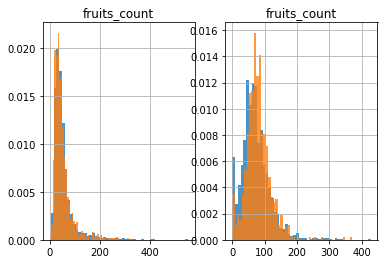

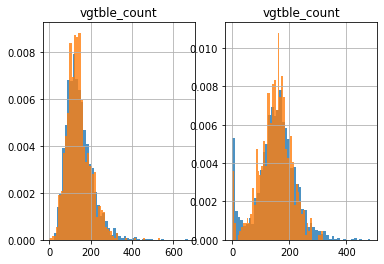

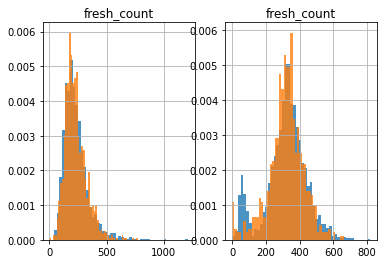

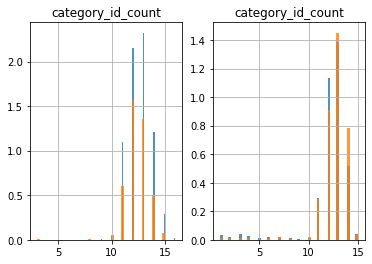

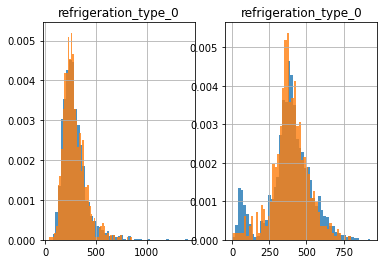

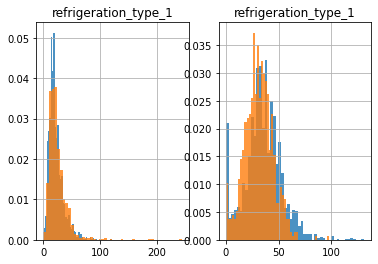

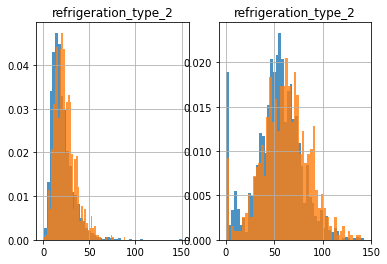

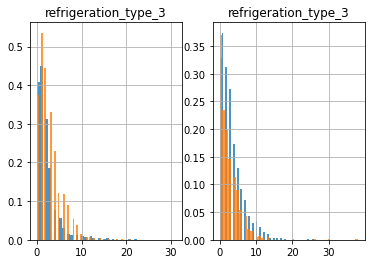

In [60]:
# 19_kunming 有收益  17_chengdu 负向
kunmingTrain=sampleUtils.keep_tocar_traj(exp_demo.load_data(DATA_PARSED_BY_LINE.format("33_nanning"),"20210406","20210423"))
kunmingTest=sampleUtils.keep_tocar_traj(exp_demo.load_data(DATA_PARSED_BY_LINE.format("33_nanning"),"20210424","20210430"))

chengduTrain=sampleUtils.keep_tocar_traj(exp_demo.load_data(DATA_PARSED_BY_LINE.format("6_wuhan_2"),"20210406","20210423"))
chengduTest=sampleUtils.keep_tocar_traj(exp_demo.load_data(DATA_PARSED_BY_LINE.format("6_wuhan_2"),"20210424","20210430"))

kunmingTrain.shape
kunmingTest.shape
chengduTrain.shape
chengduTest.shape

# km=["refrigeration_type_2","refrigeration_type_1","vgtble_count","refrigeration_type_3","refrigeration_type_0","fruits_count"]
# cd=["refrigeration_type_2","refrigeration_type_0","vgtble_count","refrigeration_type_1","fruits_count","refrigeration_type_3"]

for idx,i in enumerate(line_time_model_train_length_fix.goods_feature_name):
    fig,ax=plt.subplots(1,2)
    _=ax[0].set_title(i)
    _=kunmingTrain[i].hist(bins=50,density=True,alpha=0.8,ax=ax[0])
    _=kunmingTest[i].hist(bins=50,density=True,alpha=0.8,ax=ax[0])
    
    _=ax[1].set_title(i)
    _=chengduTrain[i].hist(bins=50,density=True,alpha=0.8,ax=ax[1])
    _=chengduTest[i].hist(bins=50,density=True,alpha=0.8,ax=ax[1])
    plt.show()

## ATA方差

In [88]:
citys="17_chengdu,19_kunming,6_wuhan_1,6_wuhan_2,15_hefei,9_zhengzhou,36_foshan,83_haikou,132_zhongshan,133_huizhou,2_shenzhen,33_nanning".split(",")
res=[]
for c in citys:
    trainDF=exp_demo.load_data(DATA_PARSED_BY_LINE.format(c),"20210301","20210423")
    head2Date=np.sort(trainDF['date'].unique())[:2]
    last2Date=np.sort(trainDF['date'].unique())[-2:]
    head2ATA=trainDF[trainDF['date'].apply(lambda x: x in head2Date)]['label']
    last2ATA=trainDF[trainDF['date'].apply(lambda x: x in last2Date)]['label']
    res.append((c,trainDF['label'].std(),head2ATA_avg.mean(),last2ATA_avg.mean(),head2ATA,last2ATA))



[2021-05-13 11:16:52-WARNING]: path not exist,dt:20210318 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210318
[2021-05-13 11:16:52-WARNING]: path not exist,dt:20210325 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/17_chengdu/20210325
[2021-05-13 11:16:53-WARNING]: path not exist,dt:20210318 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/19_kunming/20210318
[2021-05-13 11:16:53-WARNING]: path not exist,dt:20210413 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/19_kunming/20210413
[2021-05-13 11:16:54-WARNING]: path not exist,dt:20210413 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/6_wuhan_1/20210413
[2021-05-13 11:16:55-WARNING]: path not exist,dt:20210313 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/6_wuhan_2/20210313
[2021-05-13 11:16:55-WARNING]: path not exist,dt:20210318 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/6_wuhan_2/20210318
[2021-05-13 11:16:56-WARNING]: path not exist,dt:20210413 path: /nfs/project/zh

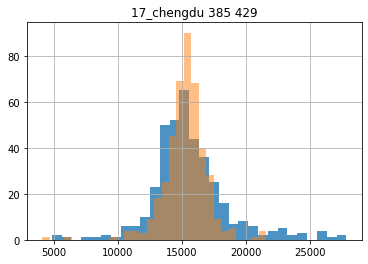

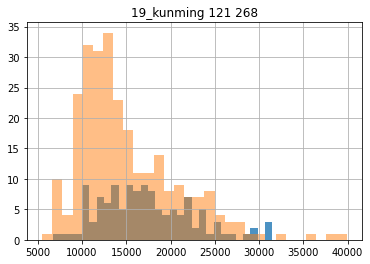

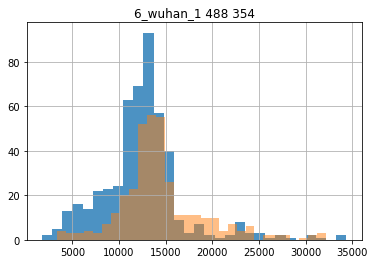

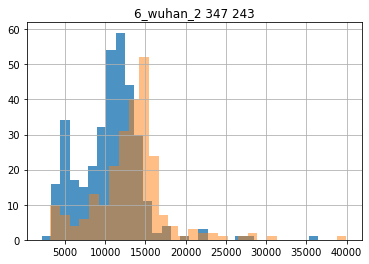

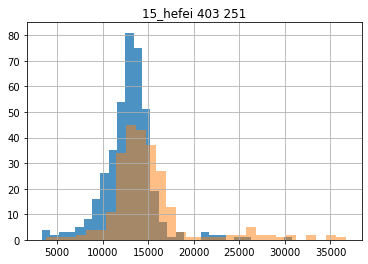

...

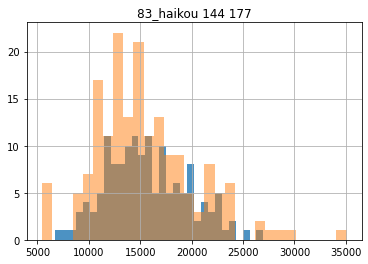

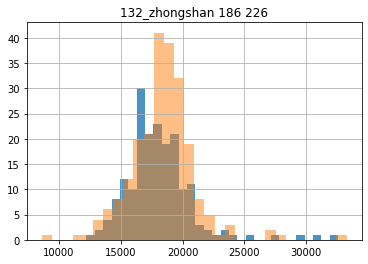

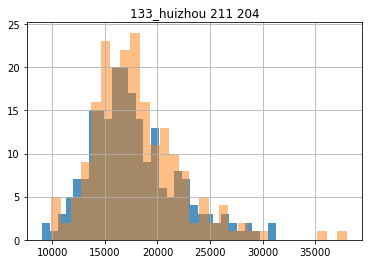

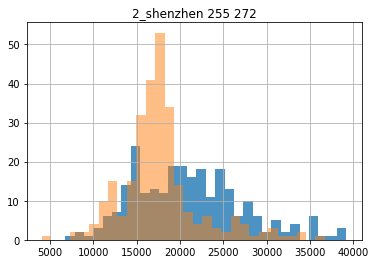

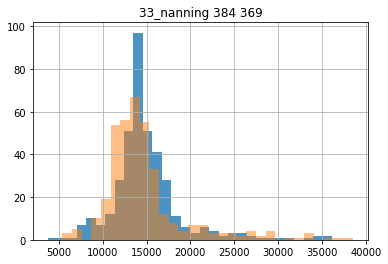

In [90]:
for i in res:
    _=i[4].hist(bins=30,alpha=0.8)
    _=i[5].hist(bins=30,alpha=0.5)
    _=plt.title("%s %s %s" % (i[0],i[4].shape[0],i[5].shape[0]))
    plt.show()

# RNN

## load & inspect cur-data

## Other Debug

In [70]:
from models.RNNDemo import DataFetcher
from models import RNNDemo
city="17_chengdu"
fetcher = DataFetcher()

logging.info(">>> loading train/test from pickle")
trainDF = fetcher.pad_leaders(pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/models/%s_train.pkl" % city))
testDF = fetcher.pad_leaders(pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/models/%s_test.pkl" % city))
trainDF = RNNDemo.type_format(trainDF)
testDF = RNNDemo.type_format(testDF)

trainDF.head(3)
trainDF["num_feats"].apply(lambda x: len(x)).max()
trainDF["leader_atas"].apply(lambda x: len(x)).max()

typeDict = {"driver_phone_ori": tf.string,
            "date": tf.string,
            "leader_uid_cnt": tf.float16,
            "label": tf.float32,
            "cat_feats": tf.int32,
            "num_feats": tf.float32,
            "leader_atas": tf.float32,
            }
shapeDict_train = {
    "driver_phone_ori": (),
    "date": (),
    "leader_uid_cnt": (),
    "label": (),
    "cat_feats": (trainDF["cat_feats"].apply(lambda x: len(x)).max(), len(trainDF["cat_feats"].iloc[0][0])),
    "num_feats": (trainDF["num_feats"].apply(lambda x: len(x)).max(), len(trainDF["num_feats"].iloc[0][0])),
    "leader_atas": (trainDF["leader_atas"].apply(lambda x: len(x)).max(),)
}

# ds = tf.data.Dataset.from_generator(lambda: core.df_gen(trainDF[typeDict.keys()]),
#                                     output_types=typeDict, output_shapes=shapeDict_train)
# line = ds.make_one_shot_iterator().get_next()
# config = tf.ConfigProto()
# config.gpu_options.allow_growth = True
# with tf.Session(config=config) as sess:
#     sess.run(line)

# from models import RNNDemo
# rnn = RNNDemo.RNNDemo(batch_size=64, epoch=9, mlp_hidden_size=[32, 16], rnn_hidden_size=[16],
#                   opt_lr=1e3, clip_norm=1e-3, clip_min=-1e16, clip_max=1e8,
#                   tbd_fp="./tbd_info", tbd_freq=5, log_step_count_steps=50, eval_step=170)

# features, labels = rnn.parse_from_df(trainDF,16,1,typeDict,shapeDict_train)
# outputs, preds = rnn.calc(features, mode="EXP")


# preds
# labels
# outputs
# features['leader_atas']



[2021-05-18 20:39:51-INFO]: >>> loading train/test from pickle
[2021-05-18 20:39:52-INFO]: >>> max pad_size: 45
[2021-05-18 20:39:52-INFO]: >>> max pad_size: 40


,driver_phone_ori,date,leader_uid_cnt,label,cat_feats,num_feats,leader_atas
0,13086618239,20210302,32.0,15358.0,"[[0, 3, 13, 14, 15, 17], [0, 5, 13, 14, 15, 17...","[[39.0, 17.0, 15.0, 7.0, 120.48, 2553.0, 15546...","[10976.0, 11016.0, 11030.0, 11043.0, 11058.0, ..."
1,13086618239,20210305,34.0,15319.0,"[[0, 3, 13, 14, 15, 17], [1, 10, 12, 14, 15, 1...","[[33.0, 209.0, 101.0, 55.0, 925.1800000000004,...","[13671.0, 13690.0, 13704.0, 13719.0, 13733.0, ..."
2,13086618239,20210306,32.0,22344.0,"[[1, 3, 13, 14, 15, 17], [0, 10, 13, 14, 15, 1...","[[45.0, 30.0, 24.0, 5.0, 178.97, 2486.0, 16448...","[11054.0, 11660.0, 12103.0, 12433.0, 12661.0, ..."


45

45

count    10886.000000
mean        26.997269
std        196.005278
min          3.571521
25%          3.571521
50%          4.304467
75%          8.373841
max      10877.742813
Name: sample_weight, dtype: float64

array([[<AxesSubplot:title={'center':'sample_weight'}>,
        <AxesSubplot:title={'center':'label'}>]], dtype=object)

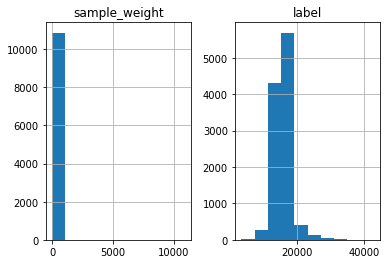

In [147]:
hist,bins = np.histogram(trainDF['label'], bins=30, density=True)
bins_width=hist * np.diff(bins)[0]
_weights = 1/(bins_width+hist[hist>0].min())
binsRange_weights = np.vstack([bins[0:-1],bins[1:],_weights]).T

# binsRange_weights
trainDF['sample_weight']=trainDF['label'].apply(lambda x: [item[-1] for item in binsRange_weights if item[0]<=x and x<=item[1]][0])
trainDF['sample_weight'].describe()
trainDF[['sample_weight','label']].hist()


0    15358.0
1    15319.0
2    22344.0
3    17849.0
Name: label, dtype: float64

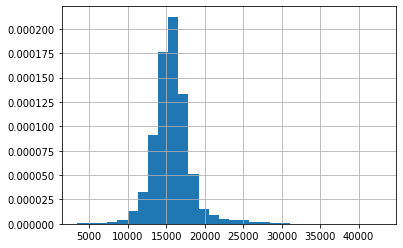

array([3.48654283e-07, 6.97308565e-07, 7.67039422e-07, 1.60380970e-06,
       3.83519711e-06, 1.29002085e-05, 3.24248483e-05, 9.06501135e-05,
       1.76349336e-04, 2.12539651e-04, 1.33046474e-04, 5.09035253e-05,
       1.52013267e-05, 8.57689535e-06, 4.67196739e-06, 4.11412053e-06,
       3.69573540e-06, 2.09192570e-06, 1.88273313e-06, 7.67039422e-07,
       9.06501135e-07, 2.78923426e-07, 2.78923426e-07, 6.97308565e-08,
       1.39461713e-07, 0.00000000e+00, 0.00000000e+00, 2.09192570e-07,
       0.00000000e+00, 1.39461713e-07])

array([2.17686951e+03, 1.08851737e+03, 9.89568075e+02, 4.73288727e+02,
       1.97924541e+02, 5.88430018e+01, 2.34107145e+01, 8.37384126e+00,
       4.30446688e+00, 3.57152142e+00, 5.70544846e+00, 1.49123133e+01,
       4.99356059e+01, 8.85035188e+01, 1.62475771e+02, 1.84506101e+02,
       2.05393285e+02, 3.62857485e+02, 4.03173850e+02, 9.89568075e+02,
       8.37335722e+02, 2.72098363e+03, 2.72098363e+03, 1.08777428e+04,
       5.44093492e+03, 1.43408535e+07, 1.43408535e+07, 3.62774874e+03,
       1.43408535e+07, 5.44093492e+03])

(31,)

array([ 3399.        ,  4716.36666667,  6033.73333333,  7351.1       ,
        8668.46666667,  9985.83333333, 11303.2       , 12620.56666667,
       13937.93333333, 15255.3       , 16572.66666667, 17890.03333333,
       19207.4       , 20524.76666667, 21842.13333333, 23159.5       ,
       24476.86666667, 25794.23333333, 27111.6       , 28428.96666667,
       29746.33333333, 31063.7       , 32381.06666667, 33698.43333333,
       35015.8       , 36333.16666667, 37650.53333333, 38967.9       ,
       40285.26666667, 41602.63333333, 42920.        ])

(3399.0, 42920.0)

(30,)

In [136]:
trainDF['label'].head(4)
_ = trainDF['label'].hist(bins=30,density=True)
plt.show()
hist,bins = np.histogram(trainDF['label'], bins=30, density=True)
bins_width=hist * np.diff(bins)[0]
_weights = 1/(bins_width+hist[hist>0].min())
np.vstack([bins[0:-1],bins[1:],_weights]).T
hist
_weights
bins.shape
bins
trainDF['label'].min(),trainDF['label'].max()
_weights.shape




In [13]:
typeDict = {"driver_phone_ori": tf.string,
            "date": tf.string,
            "leader_uid_cnt": tf.float16,
            "label": tf.float32,
            "cat_feats": tf.int32,
            "num_feats": tf.float32,
            }
shapeDict_train = {
    "driver_phone_ori": (),
    "date": (),
    "leader_uid_cnt": (),
    "label": (),
    "cat_feats": (trainDF["cat_feats"].apply(lambda x: len(x)).max(), len(trainDF["cat_feats"].iloc[0][0])),
    "num_feats": (trainDF["num_feats"].apply(lambda x: len(x)).max(), len(trainDF["num_feats"].iloc[0][0]))
}
from models import RNNDemo
self = RNNDemo.RNNDemo(batch_size=64, epoch=9, mlp_hidden_size=[32, 16], rnn_hidden_size=[16],
                  opt_lr=1e3, clip_norm=1e-3, clip_min=-1e16, clip_max=1e8,
                  tbd_fp="./tbd_info", tbd_freq=5, log_step_count_steps=50, eval_step=170)

def parse_from_df(self, dataDF, batch_size, epoch, _typeDict, _shapeDict):
    def _parse_feat_lbl(inp, label_col):
        lbls = inp.pop(label_col)
        feats = inp
        return feats, lbls

    ds = tf.data.Dataset.from_generator(lambda: core.df_gen(dataDF[_typeDict.keys()]),
                                        output_types=_typeDict, output_shapes=_shapeDict) \
        .map(lambda x: _parse_feat_lbl(x, self.label_col)) \
        .batch(batch_size).repeat(epoch) \
        .prefetch(tf.contrib.data.AUTOTUNE)

    features, labels = ds.make_one_shot_iterator().get_next()
    return features, labels



TypeError: parse_from_df() missing 1 required positional argument: 'dataDF'

In [12]:
tf.reset_default_graph()
from models import RNNDemo
city = "17_chengdu"
trainFromDt = "20210301"
trainToDt = "20210423"
testFromDt = "20210424"
testToDt = "20210430"
fetcher = RNNDemo.DataFetcher()
# fetcher.load_data(city, trainFromDt, trainToDt).to_pickle("./%s_train.pkl" % city)
# fetcher.load_data(city, testFromDt, testToDt).to_pickle("./%s_test.pkl" % city)

logging.info(">>> loading train/test from pickle")
trainDF = RNNDemo.type_format(pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/models/%s_train.pkl" % city))
testDF = RNNDemo.type_format(pd.read_pickle("/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/models/%s_test.pkl" % city))
trainDF = fetcher.pad_leaders(trainDF)
testDF = fetcher.pad_leaders(testDF)

rnn = RNNDemo.RNNDemo(batch_size=16, epoch=5, mlp_hidden_size=[32, 16], rnn_hidden_size=[16])

typeDict = {"driver_phone_ori": tf.string,
            "date": tf.string,
            "leader_uid_cnt": tf.float16,
            "label": tf.float32,
            "cat_feats": tf.int32,
            "num_feats": tf.float32,
            }
shapeDict = {
    "driver_phone_ori": (),
    "date": (),
    "leader_uid_cnt": (),
    "label": (),
    "cat_feats": (4, 4),
    "num_feats": (4, 3)
}

shapeDict.update({"cat_feats": (trainDF["cat_feats"].apply(lambda x: len(x)).max(), len(fetcher.cat_cols))})
shapeDict.update({"num_feats": (trainDF["num_feats"].apply(lambda x: len(x)).max(), len(fetcher.num_cols))})
# logging.info(">>> sess part")
# config = tf.ConfigProto()
# config.gpu_options.allow_growth = True
# with tf.Session(config=config) as sess:
#     shapeDict.update({"cat_feats": (trainDF["cat_feats"].apply(lambda x: len(x)).max(), len(fetcher.cat_cols))})
#     shapeDict.update({"num_feats": (trainDF["num_feats"].apply(lambda x: len(x)).max(), len(fetcher.num_cols))})
#     logging.info(">>> shapeDict: %s" % str(shapeDict))
#     rnn.fit(sess, dataDF=trainDF, typeDict=typeDict, shapeDict=shapeDict)
#     shapeDict.update({"cat_feats": (testDF["cat_feats"].apply(lambda x: len(x)).max(), len(fetcher.cat_cols))})
#     shapeDict.update({"num_feats": (testDF["num_feats"].apply(lambda x: len(x)).max(), len(fetcher.num_cols))})
#     logging.info(">>> shapeDict: %s" % str(shapeDict))
#     testDF['pred'] = rnn.predict(sess, testDF, typeDict=typeDict, shapeDict=shapeDict)

    

[2021-05-17 17:06:11-INFO]: >>> loading train/test from pickle
[2021-05-17 17:06:12-INFO]: >>> max pad_size: 45
[2021-05-17 17:06:13-INFO]: >>> max pad_size: 40


In [13]:
rnn
features,labels = rnn.parse_from_df(trainDF, batch_size=16, epoch=1, _typeDict=typeDict, _shapeDict=shapeDict)
preds=rnn.calc(features, mode="TRAIN")
features
labels
preds

{'driver_phone_ori': <tf.Tensor 'IteratorGetNext:2' shape=(?,) dtype=string>,
 'date': <tf.Tensor 'IteratorGetNext:1' shape=(?,) dtype=string>,
 'leader_uid_cnt': <tf.Tensor 'IteratorGetNext:3' shape=(?,) dtype=float16>,
 'cat_feats': <tf.Tensor 'IteratorGetNext:0' shape=(?, 45, 6) dtype=int32>,
 'num_feats': <tf.Tensor 'IteratorGetNext:4' shape=(?, 45, 8) dtype=float32>}

<tf.Tensor 'IteratorGetNext:5' shape=(?,) dtype=float32>

<tf.Tensor 'rnn/predictions/BiasAdd:0' shape=(?, 1) dtype=float32>

In [24]:
preds
labels
sub1=tf.subtract(tf.squeeze(preds),labels)
sub1

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
with tf.Session(config=config) as sess:
    _ = sess.run(tf.global_variables_initializer())
    res = sess.run([preds,labels,sub1])
    for i in res:
        i


<tf.Tensor 'rnn/predictions/BiasAdd:0' shape=(?, 1) dtype=float32>

<tf.Tensor 'IteratorGetNext:5' shape=(?,) dtype=float32>

<tf.Tensor 'Sub_5:0' shape=<unknown> dtype=float32>

array([[0.30032462],
       [0.19232103],
       [0.26852295],
       [0.280971  ],
       [0.20089929],
       [0.20791155],
       [0.1474204 ],
       [0.07389739],
       [0.08560474],
       [0.068776  ],
       [0.03221817],
       [0.27030334],
       [0.07888258],
       [0.04496804],
       [0.07976424],
       [0.11445287]], dtype=float32)

array([15358., 15319., 22344., 17849., 17750., 13249., 18094., 17015.,
       20847., 17597., 18249., 17555., 14778., 12434., 11703., 13922.],
      dtype=float32)

array([-15357.699, -15318.808, -22343.732, -17848.719, -17749.799,
       -13248.792, -18093.854, -17014.926, -20846.914, -17596.932,
       -18248.969, -17554.73 , -14777.921, -12433.955, -11702.92 ,
       -13921.886], dtype=float32)

In [22]:
trainDF.head(3)
trainDF.dtypes

foo = [
        ["13086618239", "20210302", 2.0, 1400.0, [[0, 7, 9, 11, 14, 19]]*45, [[1.0,2.0,3.0,4.0,5.0, 32.0, 19.5, 7.0]]*45],
        ["13086618239", "20210302", 2.0, 1400.0, [[0, 7, 9, 11, 14, 19]]*45, [[1.0,2.0,3.0,4.0,5.0, 32.0, 19.5, 7.0]]*45],
        ["18573371766", "20210310", 4.0, 1900.0, [[0, 8, 9, 14, 14, 19]]*45, [[1.0,2.0,3.0,4.0,5.0, 32.0, 19.5, 7.0]]*45],
    ]

inpDF=pd.DataFrame(foo, columns=["driver_phone_ori","date","leader_uid_cnt","label","cat_feats","num_feats"])
inpDF.head(3)
inpDF.dtypes

inpDF = pd.DataFrame(trainDF.head(3).to_dict())

ds = tf.data.Dataset.from_generator(lambda: core.df_gen(inpDF[['cat_feats']]),
                                    output_types=typeDict, output_shapes=shapeDict)
line = ds.make_one_shot_iterator().get_next()

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
with tf.Session(config=config) as sess:
    sess.run(line)
    

,driver_phone_ori,date,leader_uid_cnt,label,cat_feats,num_feats
0,13086618239,20210302,32.0,15358.0,"[[0, 3, 13, 14, 15, 17], [0, 5, 13, 14, 15, 17...","[[39.0, 17.0, 15.0, 7.0, 120.48, 2553.0, 15546..."
1,13086618239,20210305,34.0,15319.0,"[[0, 3, 13, 14, 15, 17], [1, 10, 12, 14, 15, 1...","[[33.0, 209.0, 101.0, 55.0, 925.1800000000004,..."
2,13086618239,20210306,32.0,22344.0,"[[1, 3, 13, 14, 15, 17], [0, 10, 13, 14, 15, 1...","[[45.0, 30.0, 24.0, 5.0, 178.97, 2486.0, 16448..."


driver_phone_ori     object
date                 object
leader_uid_cnt      float64
label               float64
cat_feats            object
num_feats            object
dtype: object

,driver_phone_ori,date,leader_uid_cnt,label,cat_feats,num_feats
0,13086618239,20210302,2.0,1400.0,"[[0, 7, 9, 11, 14, 19], [0, 7, 9, 11, 14, 19],...","[[1.0, 2.0, 3.0, 4.0, 5.0, 32.0, 19.5, 7.0], [..."
1,13086618239,20210302,2.0,1400.0,"[[0, 7, 9, 11, 14, 19], [0, 7, 9, 11, 14, 19],...","[[1.0, 2.0, 3.0, 4.0, 5.0, 32.0, 19.5, 7.0], [..."
2,18573371766,20210310,4.0,1900.0,"[[0, 8, 9, 14, 14, 19], [0, 8, 9, 14, 14, 19],...","[[1.0, 2.0, 3.0, 4.0, 5.0, 32.0, 19.5, 7.0], [..."


driver_phone_ori     object
date                 object
leader_uid_cnt      float64
label               float64
cat_feats            object
num_feats            object
dtype: object

InvalidArgumentError: TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was {'driver_phone_ori': tf.string, 'date': tf.string, 'leader_uid_cnt': tf.float16, 'label': tf.float32, 'cat_feats': tf.int32, 'num_feats': tf.float32}, but the yielded element was {'cat_feats': [[0, 3, 13, 14, 15, 17], [0, 5, 13, 14, 15, 17], [0, 10, 13, 14, 15, 17], [0, 10, 13, 14, 15, 17], [0, 7, 13, 14, 15, 17], [0, 3, 13, 14, 15, 17], [1, 6, 13, 14, 15, 17], [0, 10, 13, 14, 15, 17], [0, 3, 13, 14, 15, 17], [1, 10, 12, 14, 15, 17], [1, 10, 12, 14, 15, 17], [0, 9, 12, 14, 15, 17], [0, 4, 12, 14, 15, 17], [0, 3, 13, 14, 15, 17], [1, 10, 12, 14, 15, 17], [0, 10, 12, 14, 15, 17], [1, 10, 12, 14, 15, 17], [0, 10, 13, 14, 15, 17], [1, 3, 13, 14, 15, 17], [0, 10, 12, 14, 15, 17], [0, 10, 13, 14, 15, 17], [1, 3, 13, 14, 15, 17], [1, 10, 12, 14, 15, 17], [0, 10, 12, 14, 15, 17], [1, 3, 13, 14, 15, 17], [1, 4, 12, 14, 15, 17], [1, 8, 13, 14, 15, 17], [0, 5, 12, 14, 15, 17], [0, 3, 13, 14, 15, 17], [1, 5, 13, 14, 15, 17], [0, 9, 12, 14, 15, 17], [0, 9, 12, 14, 15, 17], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1]]}.
Traceback (most recent call last):

  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/data/ops/dataset_ops.py", line 600, in generator_py_func
    flattened_values = nest.flatten_up_to(output_types, values)

  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/data/util/nest.py", line 396, in flatten_up_to
    assert_shallow_structure(shallow_tree, input_tree)

  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/data/util/nest.py", line 311, in assert_shallow_structure
    % (len(input_tree), len(shallow_tree)))

ValueError: The two structures don't have the same sequence length. Input structure has length 1, while shallow structure has length 6.


During handling of the above exception, another exception occurred:


Traceback (most recent call last):

  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/ops/script_ops.py", line 235, in __call__
    ret = func(*args)

  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/data/ops/dataset_ops.py", line 605, in generator_py_func
    "element was %s." % (output_types, values))

TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was {'driver_phone_ori': tf.string, 'date': tf.string, 'leader_uid_cnt': tf.float16, 'label': tf.float32, 'cat_feats': tf.int32, 'num_feats': tf.float32}, but the yielded element was {'cat_feats': [[0, 3, 13, 14, 15, 17], [0, 5, 13, 14, 15, 17], [0, 10, 13, 14, 15, 17], [0, 10, 13, 14, 15, 17], [0, 7, 13, 14, 15, 17], [0, 3, 13, 14, 15, 17], [1, 6, 13, 14, 15, 17], [0, 10, 13, 14, 15, 17], [0, 3, 13, 14, 15, 17], [1, 10, 12, 14, 15, 17], [1, 10, 12, 14, 15, 17], [0, 9, 12, 14, 15, 17], [0, 4, 12, 14, 15, 17], [0, 3, 13, 14, 15, 17], [1, 10, 12, 14, 15, 17], [0, 10, 12, 14, 15, 17], [1, 10, 12, 14, 15, 17], [0, 10, 13, 14, 15, 17], [1, 3, 13, 14, 15, 17], [0, 10, 12, 14, 15, 17], [0, 10, 13, 14, 15, 17], [1, 3, 13, 14, 15, 17], [1, 10, 12, 14, 15, 17], [0, 10, 12, 14, 15, 17], [1, 3, 13, 14, 15, 17], [1, 4, 12, 14, 15, 17], [1, 8, 13, 14, 15, 17], [0, 5, 12, 14, 15, 17], [0, 3, 13, 14, 15, 17], [1, 5, 13, 14, 15, 17], [0, 9, 12, 14, 15, 17], [0, 9, 12, 14, 15, 17], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1], [-1, -1, -1, -1, -1, -1]]}.


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext_9]]

# DNN?

## ckpt inspect

In [63]:
import tensorflow as tf
from tensorflow.contrib.framework.python.framework import checkpoint_utils


class CheckPointInspector:
    def __init__(self, ckpt_dir, check_list=None):
        self.ckpt_dir = ckpt_dir
        self.name2shape_dict = CheckPointInspector.load_name_shape(self.ckpt_dir)
        self.vars = sorted(self.name2shape_dict.keys())
        self.check_list = check_list if check_list is not None else []
        self.name2value_dict = {}
        # workaround: _saver raise ValueError: No variables to save from
        # self.__tmpVar = tf.Variable([0],name="tmpVarOfInspectUtils")

    def append(self, name):
        if name in self.check_list:
            print("%s exist" % name)
        else:
            self.check_list.append(name)

    def brief(self):
        for i in self.vars:
            print(i, self.name2shape_dict[i])

    def restore(self):
        tf.reset_default_graph()
        check_list = self.check_list if len(self.check_list) > 0 else self.vars
        print("restore with: %s" % ",".join(check_list))
        # init variable
        for name in check_list:
            self.name2value_dict[name] = tf.Variable(tf.zeros(self.name2shape_dict[name]), name=name, dtype=tf.float32)
        _saver = tf.train.Saver(list(self.name2value_dict.values()), max_to_keep=1)
        conf = tf.ConfigProto()
        conf.gpu_options.allow_growth=True
        conf.allow_soft_placement = True
        with tf.Session(config=conf) as sess:
            sess.run(tf.global_variables_initializer())
            # restore
            _saver.restore(sess, tf.train.latest_checkpoint(self.ckpt_dir))
            # eval variable
            for name in check_list:
                self.name2value_dict[name] = self.name2value_dict[name].eval()

    def show(self, name):
        return self.name2value_dict[name]

    @staticmethod
    def load_name_shape(ckpt_dir):
        return dict(checkpoint_utils.list_variables(ckpt_dir))


In [72]:
tf.reset_default_graph()
name2value_dict={}
for name in ins.vars:
    name2value_dict[name] = tf.Variable(tf.zeros(ins.name2shape_dict[name]), name=name, dtype=tf.float32)
# name2value_dict
_saver = tf.train.Saver(list(name2value_dict.values()), max_to_keep=1)


conf = tf.ConfigProto()
conf.gpu_options.allow_growth=True
conf.allow_soft_placement = True
with tf.Session(config=conf) as sess:
    sess.run(tf.global_variables_initializer())
    # restore
    _saver.restore(sess, tf.train.latest_checkpoint(ins.ckpt_dir))
    # eval variable
    for name in check_list:
        name2value_dict[name]
        name2value_dict[name].eval()
        name2value_dict[name] = name2value_dict[name].eval()
        
        

[2021-04-17 17:49:44,700-INFO]: Restoring parameters from /nfs/project/zhoutongzt/ETA/wd_exp_ckpt/model-10800


InvalidArgumentError: Restoring from checkpoint failed. This is most likely due to a mismatch between the current graph and the graph from the checkpoint. Please ensure that you have not altered the graph expected based on the checkpoint. Original error:

tensor_name = global_step; expected dtype float does not equal original dtype int64
	 [[node save/RestoreV2 (defined at /home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/framework/ops.py:1748) ]]

Original stack trace for 'save/RestoreV2':
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/traitlets/config/application.py", line 845, in launch_instance
    app.start()
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel/kernelapp.py", line 612, in start
    self.io_loop.start()
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tornado/platform/asyncio.py", line 199, in start
    self.asyncio_loop.run_forever()
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/asyncio/base_events.py", line 541, in run_forever
    self._run_once()
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/asyncio/base_events.py", line 1786, in _run_once
    handle._run()
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tornado/ioloop.py", line 688, in <lambda>
    lambda f: self._run_callback(functools.partial(callback, future))
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tornado/gen.py", line 814, in inner
    self.ctx_run(self.run)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tornado/gen.py", line 775, in run
    yielded = self.gen.send(value)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel/kernelbase.py", line 358, in process_one
    yield gen.maybe_future(dispatch(*args))
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tornado/gen.py", line 234, in wrapper
    yielded = ctx_run(next, result)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell
    yield gen.maybe_future(handler(stream, idents, msg))
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tornado/gen.py", line 234, in wrapper
    yielded = ctx_run(next, result)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel/kernelbase.py", line 538, in execute_request
    user_expressions, allow_stdin,
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tornado/gen.py", line 234, in wrapper
    yielded = ctx_run(next, result)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel/ipkernel.py", line 302, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/ipykernel/zmqshell.py", line 539, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2895, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2940, in _run_cell
    return runner(coro)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/IPython/core/async_helpers.py", line 68, in _pseudo_sync_runner
    coro.send(None)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3166, in run_cell_async
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-72-31d22180128f>", line 6, in <module>
    _saver = tf.train.Saver(list(name2value_dict.values()), max_to_keep=1)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/training/saver.py", line 828, in __init__
    self.build()
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/training/saver.py", line 840, in build
    self._build(self._filename, build_save=True, build_restore=True)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/training/saver.py", line 878, in _build
    build_restore=build_restore)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/training/saver.py", line 508, in _build_internal
    restore_sequentially, reshape)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/training/saver.py", line 328, in _AddRestoreOps
    restore_sequentially)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/training/saver.py", line 575, in bulk_restore
    return io_ops.restore_v2(filename_tensor, names, slices, dtypes)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/ops/gen_io_ops.py", line 1696, in restore_v2
    name=name)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/framework/op_def_library.py", line 794, in _apply_op_helper
    op_def=op_def)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/util/deprecation.py", line 507, in new_func
    return func(*args, **kwargs)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/framework/ops.py", line 3357, in create_op
    attrs, op_def, compute_device)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/framework/ops.py", line 3426, in _create_op_internal
    op_def=op_def)
  File "/home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/framework/ops.py", line 1748, in __init__
    self._traceback = tf_stack.extract_stack()


## 如何使用uid_str序列？

In [5]:
trainDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210101", "20210305")
trainDF.shape
testDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210311", "20210317")
# testDF['uid_str'] = testDF['uid_str'].apply(lambda x:x.split(","))
testDF.shape
testDF.columns

[2021-04-12 18:08:29,487-WARNING]: path not exist,dt:20210208 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210208
[2021-04-12 18:08:29,857-WARNING]: path not exist,dt:20210218 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210218
[2021-04-12 18:08:30,174-WARNING]: path not exist,dt:20210223 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210223


(220834, 76)

(31323, 76)

Index(['driver_phone', 'age_30', 'age_40', 'age_50', 'age_25_q', 'age_50_q',
       'age_75_q', 'age_mean', 'female_count', 'male_count', 'gender_50',
       'store_type_25', 'store_type_50', 'store_type_75', 'store_type_mean',
       'has_store_id_-1', 'has_store_id_0', 'has_store_id_1', 'has_store_id_2',
       'has_store_id_3', 'has_store_id_mean', 'isnot_td_new_count',
       'is_td_new_count', 'is_td_new_count_mean', 'is_month_new_leader',
       'isnot_month_new_leader', 'is_month_new_leader_mean', 'delivery_id_1',
       'delivery_id_2', 'delivery_id_3', 'delivery_id_mean', 'num_sum_25',
       'num_sum_50', 'num_sum_75', 'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50',
       'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25', 'user_cnt_50',
       'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75',
       'gmv_mean', 'leader_uid_cnt', 'line_num_sum', 'line_gmv',
       'line_sku_cnt', 'fruits_count', 'vgtble_count', 'fresh_count',
       'category_id_count', 'refrigeration_type_

### 手动编码one-hot

In [17]:
init_params = {
        "emb_size": 8,
        "bucket_size_dict": {
            "delivery_flag": 10,
            "driver_phone": 2 * 10000,
        },
        "numeric_cols": ["age_30", "age_40", "age_50", "age_25_q", "age_50_q", "age_75_q", "age_mean",
                         "female_count",
                         "male_count", "gender_50", "store_type_25", "store_type_50", "store_type_75",
                         "store_type_mean",
                         "has_store_id_-1", "has_store_id_0", "has_store_id_1", "has_store_id_2", "has_store_id_3",
                         "has_store_id_mean", "isnot_td_new_count", "is_td_new_count", "is_td_new_count_mean",
                         "is_month_new_leader", "isnot_month_new_leader", "is_month_new_leader_mean",
                         "delivery_id_1",
                         "delivery_id_2", "delivery_id_3", "delivery_id_mean", "num_sum_25", "num_sum_50",
                         "num_sum_75",
                         "num_sum_mean", "sku_cnt_25", "sku_cnt_50", "sku_cnt_75", "sku_cnt_mean", "user_cnt_25",
                         "user_cnt_50", "user_cnt_75", "user_cnt_mean", "gmv_25", "gmv_50", "gmv_75", "gmv_mean",
                         "leader_uid_cnt", "line_num_sum", "line_gmv", "line_sku_cnt", "first_eta", "first_length",
                         "leader_eta", "leader_length", "first_order_num", "middle_order_num", "last_order_num"],
        "category_cols": ['delivery_flag', "driver_phone"],
        "wide_cols": ["driver_phone"],
        "multihot_cols": ["uid_str"],
        "units": [8, 16, 8],
        "hparams": {"log_step_count_steps": 10},
        "tbd_fp": "",
    }

In [17]:
trainDF = exp_demo.load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210101", "20210305")
trainDF['uid_str'].apply(lambda x:x.split(",")).explode().unique().shape

[2021-04-13 19:04:14-WARNING]: path not exist,dt:20210208 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210208
[2021-04-13 19:04:14-WARNING]: path not exist,dt:20210218 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210218
[2021-04-13 19:04:14-WARNING]: path not exist,dt:20210223 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210223


(15476,)

In [66]:
trainDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210101", "20210305")
testDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210306", "20210312")
validDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210313", "20210317")
logging.info("trainDF: %s" % trainDF.shape[0])
logging.info("testDF: %s" % testDF.shape[0])
logging.info("validDF: %s" % validDF.shape[0])

# category to indicator
oe_dict = {}
for col in set(init_params['category_cols'] + init_params['wide_cols']):
    oe_dict.update({col: dict(((v, idx) for idx, v in enumerate(trainDF[col].unique())))})
mh_dict = {}
max_len_dict = {}
for col in init_params["multihot_cols"]:
    mh_dict.update({col: dict(
        ((v, idx) for idx, v in enumerate(trainDF[col].apply(lambda x: x.split(",")).explode().unique())))})
    max_len_dict.update({col: trainDF[col].apply(lambda x: len(x.split(","))).max()})

for col, oe in oe_dict.items():
    trainDF[col] = trainDF[col].apply(lambda x: oe.get(x, -1))
    testDF[col] = testDF[col].apply(lambda x: oe.get(x, -1))
    validDF[col] = validDF[col].apply(lambda x: oe.get(x, -1))
for col, mh in mh_dict.items():
    trainDF[col] = trainDF[col].apply(lambda x: [mh[i] for i in x.split(",") if i in mh])
    testDF[col] = testDF[col].apply(lambda x: [mh[i] for i in x.split(",") if i in mh])
    validDF[col] = validDF[col].apply(lambda x: [mh[i] for i in x.split(",") if i in mh])
    
    
    
    

[2021-04-12 16:15:20,313-WARNING]: path not exist,dt:20210208 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210208
[2021-04-12 16:15:20,610-WARNING]: path not exist,dt:20210218 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210218
[2021-04-12 16:15:20,838-WARNING]: path not exist,dt:20210223 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/20210223
[2021-04-12 16:15:22,488-INFO]: trainDF: 220834
[2021-04-12 16:15:22,489-INFO]: testDF: 27889
[2021-04-12 16:15:22,490-INFO]: validDF: 22443


### ~构造sparse dataset~
- 但是dense、sparse的两个ds不能concat

In [136]:
sparse_cols=['uid_str']

denseDF = trainDF[[i for i in trainDF.columns if i not in sparse_cols]]
denseDataset = tf.data.Dataset.from_tensor_slices(dict(denseDF))


sp_indices = np.vstack([[[idx,item] for item in item_list] for idx,item_list in list(trainDF['uid_str'].items())])
sp_values = np.ones(sp_indices.shape[0])
sp_data = tf.SparseTensor(indices=sp_indices, values=sp_values, dense_shape=[trainDF.shape[0], max(mh_dict['uid_str'].values())+1])
sparseDataset = tf.data.Dataset.from_sparse_tensor_slices(sp_data)


### 定长padding并转成trd

In [ ]:
from exp_demo import DropCols,CategoryCols,load_data,clean,format_type,get_dates
testDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210306", "20210312")
testDF['uid_str_list'] = testDF['uid_str'].apply(lambda x: x.split(","))
oe_uid_str = dict((v, idx) for idx, v in enumerate(testDF["uid_str"].apply(lambda x: x.split(",")).explode().unique()))
testDF['uid_idx_list'] = testDF['uid_str'].apply(lambda x: [oe_uid_str.get(i,-1) for i in x.split(",")])
testDF['uid_idx_list'] = testDF['uid_idx_list'].apply(lambda x: (x+[-1]*70)[:70])


def save_trd(inpDF, fp):
    def get_trd_type(vType, value):
        if vType=="float":
            return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))
        elif vType=="int":
            return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))
        elif vType=="str":
            return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value.encode('utf-8')]))
        elif vType=="list_str":
            return tf.train.Feature(bytes_list=tf.train.BytesList(value=[i.encode("utf-8") for i in value]))
        elif vType=="list_int":
            return tf.train.Feature(int64_list=tf.train.Int64List(value=value))
        else:
            return None

    with tf.python_io.TFRecordWriter(fp) as writer:
        for idx, row in inpDF.iterrows():
            featuresInfo = {}
            for colName,value in row.items():
                vType = type(value).__name__
                if vType=="list":
                    vType = vType+"_"+type(value[0]).__name__
                featuresInfo.update({colName: get_trd_type(vType, value)})
            example = tf.train.Example(features=tf.train.Features(feature=featuresInfo))
            writer.write(example.SerializeToString())

logging.info("saving trd...")
save_trd(testDF,"/nfs/project/zhoutongzt/ETA/test_trd")
logging.info("...done")




In [98]:
max(oe_uid_str.values())

7709

In [ ]:

feat_info = {}
_ = exp_demo.update_params(feat_info, "/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/conf/dnn_feats_info.json")

def parse_from_trd(trd_fp, feat_info, label_col="label", repeatCnt=1, batch_size=1024):
    def parse_trd(serialized):
        features = dict()
        for col in feat_info["int"]:
            features[col] = tf.FixedLenFeature([], tf.int64)
        for col in feat_info["float"]:
            features[col] = tf.FixedLenFeature([], tf.float32)
        for col in feat_info["str"]:
            features[col] = tf.FixedLenFeature([], tf.string)
        for col, lens in feat_info["fixed_list_str"].items():
            # features[col] = tf.FixedLenFeature([lens], tf.string)
            features[col] = tf.VarLenFeature(tf.string)
        for col, lens in feat_info["fixed_list_int"].items():
            features[col] = tf.FixedLenFeature([lens], tf.int64)

        features[label_col] = tf.FixedLenFeature([], tf.int64)
        parsed = tf.parse_single_example(serialized, features)
        return parsed

    ds = tf.data.TFRecordDataset(trd_fp) \
        .apply(tf.data.experimental.map_and_batch(map_func=parse_trd, batch_size=batch_size)) \
        .repeat(repeatCnt)

    def after_process(inp):
        feats = inp
        lbls = inp.pop(label_col)
        return tuple([feats, lbls])

    iterator = ds.make_one_shot_iterator().get_next()
    return after_process(iterator)

train_dsD = parse_from_trd("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004_test.trd",
                              feat_info=feat_info,
                              repeatCnt=1, batch_size=1024*5, label_col="label")
feats,lbls = train_dsD


import tensorflow.feature_column as fc
fc_list = list()
# seq_hash_col = fc.sequence_categorical_column_with_hash_bucket("uid_str_list", hash_bucket_size=9*10000)
# emb_seq_hash_col = fc.embedding_column(seq_hash_col, 8)
# idx_seq_hash_col = fc.indicator_column(seq_hash_col)
fc_list.append(fc.numeric_column("age_30"))
fc_list.append(fc.numeric_column("age_50"))
fc_list.append(fc.indicator_column(fc.categorical_column_with_identity("uid_idx_list", num_buckets=17709+1)))
# fc_list.append(fc.indicator_column(fc.sequence_categorical_column_with_identity("uid_idx_list", num_buckets=7709+1)))
# fc.SequenceFeatures
# net2 = tf.contrib.feature_column.sequence_input_layer(feats,[idx_seq_hash_col])
net = fc.input_layer(feats,fc_list)
uid_idx_sp = tf.cast(feats['uid_idx_list'],tf.float32)

# tf.layers.dense(uid_idx_sp,units=1)
with tf.Session(config=conf) as sess:
    sess.run(tf.global_variables_initializer())
    sess.run(net)
#     sess.run(feats['uid_str_list'])
    sess.run(feats['uid_idx_list'])
#     v,v_len = sess.run(net)
    




{'int': ['driver_phone',
  'age_30',
  'age_40',
  'age_50',
  'female_count',
  'male_count',
  'has_store_id_-1',
  'has_store_id_0',
  'has_store_id_1',
  'has_store_id_2',
  'has_store_id_3',
  'isnot_td_new_count',
  'is_td_new_count',
  'is_month_new_leader',
  'isnot_month_new_leader',
  'delivery_id_1',
  'delivery_id_2',
  'delivery_id_3',
  'leader_uid_cnt',
  'line_num_sum',
  'fruits_count',
  'vgtble_count',
  'fresh_count',
  'category_id_count',
  'refrigeration_type_0',
  'refrigeration_type_1',
  'refrigeration_type_2',
  'refrigeration_type_3',
  'label',
  'date',
  'assemble_eta',
  'first_order_num',
  'middle_order_num',
  'last_order_num',
  'delivery_flag',
  'last_uid'],
 'float': ['age_25_q',
  'age_50_q',
  'age_75_q',
  'age_mean',
  'gender_50',
  'store_type_25',
  'store_type_50',
  'store_type_75',
  'store_type_mean',
  'has_store_id_mean',
  'is_td_new_count_mean',
  'is_month_new_leader_mean',
  'delivery_id_mean',
  'num_sum_25',
  'num_sum_50',
  'n

[2021-04-13 18:24:50,832-WARNING]: From <ipython-input-75-056859119765>:24: map_and_batch (from tensorflow.python.data.experimental.ops.batching) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.data.Dataset.map(map_func, num_parallel_calls)` followed by `tf.data.Dataset.batch(batch_size, drop_remainder)`. Static tf.data optimizations will take care of using the fused implementation.
[2021-04-13 18:24:50,918-WARNING]: From /home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.FixedLenFeature is deprecated. Please use tf.io.FixedLenFeature instead.

[2021-04-13 18:24:50,920-WARNING]: From /home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.VarLenFeature is deprecated. Please use tf.io.VarLenFeature instead.

[2021-04-13 18:24:50,921-WARNING]: From /home/luban/miniconda3/envs/zt/lib/pytho

unknown usage

In [8]:
def parse_df(df, mode, label_col="label", sparse_cols=["uid_str"], repeatCnt=1, batch_size=1024):
    def parse_feat_lbl(inp):
        # feats = dict((k, v) for k, v in inp.items() if k != label_col)
        # labels = tf.log(float(inp[label_col])) if label_col is not None else -1.0
        labels = tf.log(tf.cast(inp.pop(label_col), tf.float32)) if label_col is not None else -1.0
        feats = inp
        return feats, labels
    
    denseDF = df[[i for i in df.columns if i not in sparse_cols]]
    denseDataset = tf.data.Dataset.from_tensor_slices(dict(denseDF))
    
    ds = tf.data.Dataset.from_tensor_slices(dict(df)) \
        .map(parse_feat_lbl, num_parallel_calls=1).batch(batch_size).repeat(repeatCnt)

    if mode == tf.estimator.ModeKeys.TRAIN:
        # ds = ds.shuffle(batch_size)
        return ds.make_one_shot_iterator().get_next()
    elif mode == tf.estimator.ModeKeys.PREDICT:
        return ds.make_one_shot_iterator().get_next()
    elif mode == "EXP":
        iterator = ds.make_initializable_iterator()
        return iterator.get_next(), iterator.initializer
    else:
        assert False, "Not implement for mode: %s" % mode

            
feats,lbls = parse_df(testDF, mode=tf.estimator.ModeKeys.TRAIN)
with tf.Session(config=conf) as sess:
    sess.run(feats['uid_str'])

TypeError: Expected binary or unicode string, got ['639247267765595667', '639247268303757560']

### from project

In [1]:
PROJ_DIR="/nfs/project/zhoutongzt/ETA/ztprivate/gbdt_eta/"
trd_fp = "/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004_test.trd"
import sys
sys.path.append(PROJ_DIR)
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import DNN
import exp_demo
import os
import numpy as np
import tensorflow as tf
import tensorflow.feature_column as fc
from datetime import datetime
import itertools
import logging
logging.basicConfig(format='[%(asctime)s-%(levelname)s]: %(message)s',
                    datefmt="%Y-%m-%d %H:%M:%S",
                    level=logging.INFO)

    

In [6]:
# construct Model
init_params = exp_demo.update_params({}, PROJ_DIR+"/conf/wd_init_params.json")
M = DNN.WideDeep(**init_params)
M.fc_wide

[2021-04-16 10:51:28-INFO]: >>> tf.reset_default_graph() done.


[IndicatorColumn(categorical_column=HashedCategoricalColumn(key='driver_phone', hash_bucket_size=20000, dtype=tf.int64)),
 IndicatorColumn(categorical_column=HashedCategoricalColumn(key='gmv_mean_bucket', hash_bucket_size=100, dtype=tf.int64)),
 IndicatorColumn(categorical_column=HashedCategoricalColumn(key='line_num_sum_bucket', hash_bucket_size=100, dtype=tf.int64)),
 IndicatorColumn(categorical_column=HashedCategoricalColumn(key='leader_uid_cnt_bucket', hash_bucket_size=100, dtype=tf.int64)),
 IndicatorColumn(categorical_column=HashedCategoricalColumn(key='first_length_bucket', hash_bucket_size=100, dtype=tf.int64)),
 IndicatorColumn(categorical_column=IdentityCategoricalColumn(key='uid_idx_list', number_buckets=50000, default_value=None))]

In [35]:
help(fc.linear_model)

Help on function linear_model in module tensorflow.python.feature_column.feature_column:

linear_model(features, feature_columns, units=1, sparse_combiner='sum', weight_collections=None, trainable=True, cols_to_vars=None)
    Returns a linear prediction `Tensor` based on given `feature_columns`.
    
    This function generates a weighted sum based on output dimension `units`.
    Weighted sum refers to logits in classification problems. It refers to the
    prediction itself for linear regression problems.
    
    Note on supported columns: `linear_model` treats categorical columns as
    `indicator_column`s. To be specific, assume the input as `SparseTensor` looks
    like:
    
    ```python
      shape = [2, 2]
      {
          [0, 0]: "a"
          [1, 0]: "b"
          [1, 1]: "c"
      }
    ```
    `linear_model` assigns weights for the presence of "a", "b", "c' implicitly,
    just like `indicator_column`, while `input_layer` explicitly requires wrapping
    each of categori

In [42]:


# manual
features={
    "uid_idx_list": tf.FixedLenFeature([70],tf.int64),
#     "driver_phone_ori": tf.FixedLenFeature([], tf.string),
    "driver_phone": tf.FixedLenFeature([], tf.int64),
#     "first_length_bucket": tf.FixedLenFeature([], tf.int64),
#     "line_num_sum_bucket": tf.FixedLenFeature([], tf.int64),
#     "leader_uid_cnt_bucket": tf.FixedLenFeature([], tf.int64),
#     "gmv_mean_bucket": tf.FixedLenFeature([], tf.int64)
}

fc_list = list()
# fc_list.append(fc.indicator_column(fc.categorical_column_with_hash_bucket("driver_phone", 20000, dtype=tf.int64)))
fc_list.append(fc.categorical_column_with_hash_bucket("driver_phone", 20000, dtype=tf.int64))
fc_list.append(fc.categorical_column_with_identity("uid_idx_list", 20000))



trd=tf.data.TFRecordDataset(trd_fp).map(lambda inp: tf.io.parse_single_example(inp,features)).batch(2)
iterator=trd.make_one_shot_iterator()
feats_A=iterator.get_next()
# net_A = fc.input_layer(feats_A, fc_list)
with tf.variable_scope("linear") as ls:
    net_B = fc.linear_model(feats_A, fc_list)

# # from project
# feat_info = exp_demo.update_params({}, PROJ_DIR+"/conf/dnn_feats_info.json")
# train_ds = DNN.parse_from_trd(trd_fp, feat_info, repeatCnt=1, batch_size=1024, label_col="label")
# feats_B,lbls=train_ds
# net_B = fc.input_layer(feats_B, M.fc_wide)

run_options = tf.RunOptions(report_tensor_allocations_upon_oom = True)
gpu_options = tf.GPUOptions(allow_growth=True)
session_config = tf.ConfigProto(allow_soft_placement=True, 
                                gpu_options=gpu_options)
with tf.Session(config=session_config) as sess:
    sess.run(tf.global_variables_initializer())
    sess.run(feats_A)
    sess.run(net_A)
    sess.run(net_B)
    for k in feats_A.keys():
        print(">>> k: %s" % k)
#         sess.run(feats_A[k])
#         sess.run(feats_B[k])
#         sess.run(feats_A[k]).shape, sess.run(feats_A[k])
#         sess.run(feats_B[k]).shape, sess.run(feats_B[k])
#         np.all(sess.run(feats_A[k])==sess.run(feats_B[k]))
#     sess.run(net_A,options=run_options)
#     sess.run(net_A,options=run_options).shape
#     sess.run(net_B,options=run_options)
        

{'driver_phone': array([637312124016409538, 637312124016409538]),
 'uid_idx_list': array([[ 2704,  2705, 13371, 13589,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1],
        [ 2704,  2705, 13371, 13589,  4393,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
            -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,   

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

array([[0.],
       [0.]], dtype=float32)

>>> k: driver_phone
>>> k: uid_idx_list


In [44]:
tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=".*")

[<tf.Variable 'dnn/input_layer_1/delivery_flag_embedding/embedding_weights:0' shape=(10, 8) dtype=float32_ref>,
 <tf.Variable 'dnn/input_layer_1/driver_phone_embedding/embedding_weights:0' shape=(20000, 8) dtype=float32_ref>,
 <tf.Variable 'dnn/hiddenlayer_0/kernel:0' shape=(73, 8) dtype=float32_ref>,
 <tf.Variable 'dnn/hiddenlayer_0/bias:0' shape=(8,) dtype=float32_ref>,
 <tf.Variable 'dnn/hiddenlayer_1/kernel:0' shape=(8, 16) dtype=float32_ref>,
 <tf.Variable 'dnn/hiddenlayer_1/bias:0' shape=(16,) dtype=float32_ref>,
 <tf.Variable 'dnn/hiddenlayer_2/kernel:0' shape=(16, 16) dtype=float32_ref>,
 <tf.Variable 'dnn/hiddenlayer_2/bias:0' shape=(16,) dtype=float32_ref>,
 <tf.Variable 'dnn/hiddenlayer_3/kernel:0' shape=(16, 8) dtype=float32_ref>,
 <tf.Variable 'dnn/hiddenlayer_3/bias:0' shape=(8,) dtype=float32_ref>,
 <tf.Variable 'dnn/logits/kernel:0' shape=(8, 1) dtype=float32_ref>,
 <tf.Variable 'dnn/logits/bias:0' shape=(1,) dtype=float32_ref>,
 <tf.Variable 'linear/logits/kernel:0' sh

In [20]:
init_params = exp_demo.update_params({}, PROJ_DIR+"/conf/wd_init_params.json")
feat_info = exp_demo.update_params({}, PROJ_DIR+"/conf/dnn_feats_info.json")

batch_size = init_params['hparams'].get("batch_size", 1024*4)
epoch = init_params['hparams'].get("epoch", int(10 * 4 * 2))
ckpt_dir = init_params['hparams'].get("ckpt_dir", "/nfs/project/zhoutongzt/ETA/wd_exp_ckpt")

M = DNN.WideDeep(**init_params)

train_ds = DNN.parse_from_trd(trd_fp, feat_info, repeatCnt=epoch, batch_size=2, label_col="label")
# debug 
# M.fc_wide
# M.fc_wide[-1]
# net = fc.input_layer(train_ds[0], M.fc_wide[-1])
# net
logits, _dnn_logits, _linear_logits = M.calc_logits(train_ds[0],debug=True)
# "get_linear_vars",M.get_linear_vars()
# "get_dnn_vars",M.get_dnn_vars()

# fc_test = fc.categorical_column_with_identity("uid_idx_list", 5*10000)
# fc_test = fc.indicator_column(fc_test)
# fc_test

fc_list=[]
fc_wide = fc.categorical_column_with_identity("uid_idx_list", 20000)
fc_list.append(fc.indicator_column(fc_wide))

gpu_options = tf.GPUOptions(allow_growth=True)
session_config = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
with tf.Session(config=session_config) as sess:
    train_ds[0]['uid_idx_list']
    sess.run(train_ds[0]['uid_idx_list'])
    sess.run(fc.input_layer(train_ds[0],fc_list))
#     sess.run(fc.input_layer(train_ds[0], [fc_test]))
    logging.info("initialize vars ...")
    sess.run(tf.global_variables_initializer())
    sess.run(tf.local_variables_initializer())
    sess.run(logits)
    
assert False








[2021-04-16 11:07:19-INFO]: >>> tf.reset_default_graph() done.


<tf.Tensor 'IteratorGetNext:74' shape=(?, 70) dtype=int64>

array([[ 2704,  2705, 13371, 13589,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1],
       [ 2704,  2705, 13371, 13589,  4393,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,    -1,
           -1,    -

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

[2021-04-16 11:07:20-INFO]: initialize vars ...


array([[-3468.6226],
       [-3299.4233]], dtype=float32)

AssertionError: 

In [3]:
M.fc_wide

[IndicatorColumn(categorical_column=HashedCategoricalColumn(key='driver_phone', hash_bucket_size=20000, dtype=tf.int64)),
 IndicatorColumn(categorical_column=HashedCategoricalColumn(key='gmv_mean_bucket', hash_bucket_size=100, dtype=tf.int64)),
 IndicatorColumn(categorical_column=HashedCategoricalColumn(key='line_num_sum_bucket', hash_bucket_size=100, dtype=tf.int64)),
 IndicatorColumn(categorical_column=HashedCategoricalColumn(key='leader_uid_cnt_bucket', hash_bucket_size=100, dtype=tf.int64)),
 IndicatorColumn(categorical_column=HashedCategoricalColumn(key='first_length_bucket', hash_bucket_size=100, dtype=tf.int64)),
 IndicatorColumn(categorical_column=IdentityCategoricalColumn(key='uid_idx_list', number_buckets=50000, default_value=None))]

In [8]:
# tf.reset_default_graph()





# codec column
# fc_list=[]
# fc_wide = fc.categorical_column_with_identity("uid_idx_list", 5*10000)
# fc_wide = fc.categorical_column_with_hash_bucket("first_length_bucket", 5*10000)

# fc_list.append(fc.indicator_column(fc_wide))

# net = fc.input_layer(train_ds[0], fc_list)
# net = fc.input_layer(one, M.fc_wide)
gpu_options = tf.GPUOptions(allow_growth=True)
session_config = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
with tf.Session(config=session_config) as sess:
    for k in one.keys():
        print(">>> k: %s" % k)
        sess.run(one[k]).shape,sess.run(one[k])
        sess.run(train_ds[0][k]).shape,sess.run(train_ds[0][k])
#     sess.run(net).shape
#     sess.run(net)
    
    
    

>>> k: driver_phone


((1024,),
 array([637312124013045001, 637312124013045001, 637312124013045001, ...,
        639247268658875793, 639247268658875793, 639247268658875793]))

((1024,),
 array([637312124013045001, 637312124013045001, 637312124013045001, ...,
        639247268658875793, 639247268658875793, 639247268658875793]))

>>> k: driver_phone_ori


((1024,),
 array([b'13550106710_31', b'18280395020_0', b'18280395020_1', ...,
        b'18368680033_18', b'18368680033_19', b'18368680033_20'],
       dtype=object))

((1024,),
 array([b'13550106710_31', b'18280395020_0', b'18280395020_1', ...,
        b'18368680033_18', b'18368680033_19', b'18368680033_20'],
       dtype=object))

>>> k: first_length_bucket


((1024,), array([14, 14, 14, ...,  3,  3,  3]))

((1024,), array([14, 14, 14, ...,  3,  3,  3]))

>>> k: gmv_mean_bucket


((1024,), array([4, 5, 5, ..., 4, 2, 3]))

((1024,), array([4, 5, 5, ..., 4, 2, 3]))

>>> k: leader_uid_cnt_bucket


((1024,), array([5, 6, 6, ..., 3, 3, 3]))

((1024,), array([5, 6, 6, ..., 3, 3, 3]))

>>> k: line_num_sum_bucket


((1024,), array([5, 5, 5, ..., 5, 5, 6]))

((1024,), array([5, 5, 5, ..., 5, 5, 6]))

>>> k: uid_idx_list


((1024, 70),
 array([[ 1310, 11809,  4648, ...,    -1,    -1,    -1],
        [ 1310, 11809,  4648, ...,    -1,    -1,    -1],
        [ 1310, 11809,  4648, ...,    -1,    -1,    -1],
        ...,
        [14486,   796, 10058, ...,    -1,    -1,    -1],
        [14486,   796, 10058, ...,    -1,    -1,    -1],
        [14486,   796, 10058, ...,    -1,    -1,    -1]]))

((1024, 70),
 array([[ 1310, 11809,  4648, ...,    -1,    -1,    -1],
        [ 1310, 11809,  4648, ...,    -1,    -1,    -1],
        [ 1310, 11809,  4648, ...,    -1,    -1,    -1],
        ...,
        [14486,   796, 10058, ...,    -1,    -1,    -1],
        [14486,   796, 10058, ...,    -1,    -1,    -1],
        [14486,   796, 10058, ...,    -1,    -1,    -1]]))

In [ ]:
train_spec = M.model_fn(features=train_ds[0], labels=train_ds[1], mode=tf.estimator.ModeKeys.TRAIN)

# loop
saver = tf.train.Saver(max_to_keep=1)
time_start_b = datetime.utcnow()
logging.info("Experiment started at {}".format(time_start_b.strftime("%H:%M:%S")))
logging.info(".......................................")
gpu_options = tf.GPUOptions(allow_growth=True)
session_config = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
with tf.Session(config=session_config) as sess:
    ckpt_fp = tf.train.latest_checkpoint(ckpt_dir)
    logging.info("*** ckpt_fp: {} ***".format(ckpt_fp))
    tr_time_start = datetime.utcnow()
    logging.info("initialize vars ...")
    sess.run(tf.global_variables_initializer())
    sess.run(tf.local_variables_initializer())
    
    try:
        tr_time_start = datetime.utcnow()
        logging.info("training-loop ...")
        for step in itertools.count(0):
            # train process
            if step % M.hparams.get('log_step_count_steps', 10) == 0:
                _, metric = sess.run([train_spec.train_op, train_spec.eval_metric_ops])
                tr_time_end = datetime.utcnow()
                tr_time_elapsed = tr_time_end - tr_time_start

                metric = {k: "%.4f" % v[1] for k, v in metric.items()}
                logging.info("%s, step = %d (%2f sec)" % (metric, step, tr_time_elapsed.total_seconds()))
                tr_time_start = tr_time_end
            else:
                _ = sess.run([train_spec.train_op, train_spec.eval_metric_ops])

    except tf.errors.OutOfRangeError:
        tr_time_elapsed = datetime.utcnow() - time_start_b
        logging.info("......Training finished. Total Elapse: %.2f sec" % tr_time_elapsed.total_seconds())

    logging.info("saving model to {}".format(ckpt_dir))
    saver.save(sess, os.path.join(ckpt_dir, "model"), global_step=step, write_meta_graph=False)


In [3]:
# wide columns
init_params = exp_demo.update_params({}, PROJ_DIR+"conf/wd_init_params.json")
M = DNN.WideDeep(**init_params)

# dataset
feat_info = exp_demo.update_params({}, PROJ_DIR+"conf/dnn_feats_info.json")
train_ds = DNN.parse_from_trd(trd_fp, feat_info, repeatCnt=1, batch_size=2, label_col="label")
features = train_ds[0]

# fc_wide debug
net = fc.input_layer(train_ds[0], M.fc_wide)
"fc_wide",M.fc_wide
"net",net

# logits debug
logits, _dnn_logits, _linear_logits = M.calc_logits(features,debug=True)

"get_linear_vars",M.get_linear_vars()
"get_dnn_vars",M.get_dnn_vars()

train_spec = M.model_fn(features=train_ds[0], labels=train_ds[1], mode=tf.estimator.ModeKeys.TRAIN)

# loop
gpu_options = tf.GPUOptions(allow_growth=True)
config = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
with tf.Session(config=config) as sess:
    sess.run(tf.global_variables_initializer())
    sess.run(tf.local_variables_initializer())
#     sess.run(net).shape
#     np.vstack(np.nonzero(sess.run(net))).T
#     sess.run(logits)
#     _, metric = sess.run([train_spec.train_op, train_spec.eval_metric_ops])
    try:
        tr_time_start = datetime.utcnow()
        logging.info("training-loop ...")
        for step in itertools.count(0):
            # train process
            if step % M.hparams.get('log_step_count_steps', 10) == 0:
                _, metric = sess.run([train_spec.train_op, train_spec.eval_metric_ops])
                tr_time_end = datetime.utcnow()
                tr_time_elapsed = tr_time_end - tr_time_start

                metric = {k: "%.4f" % v[1] for k, v in metric.items()}
                logging.info("%s, step = %d (%2f sec)" % (metric, step, tr_time_elapsed.total_seconds()))
                tr_time_start = tr_time_end
            else:
                _ = sess.run([train_spec.train_op, train_spec.eval_metric_ops])

    except tf.errors.OutOfRangeError:
        tr_time_elapsed = datetime.utcnow() - time_start_b
        logging.info("......Training finished. Total Elapse: %.2f sec" % tr_time_elapsed.total_seconds())

    
    
    

[2021-04-15 16:39:09-INFO]: >>> tf.reset_default_graph() done.


('fc_wide',
 [IndicatorColumn(categorical_column=HashedCategoricalColumn(key='driver_phone', hash_bucket_size=20000, dtype=tf.int64)),
  IndicatorColumn(categorical_column=HashedCategoricalColumn(key='gmv_mean_bucket', hash_bucket_size=100, dtype=tf.int64)),
  IndicatorColumn(categorical_column=HashedCategoricalColumn(key='line_num_sum_bucket', hash_bucket_size=100, dtype=tf.int64)),
  IndicatorColumn(categorical_column=HashedCategoricalColumn(key='leader_uid_cnt_bucket', hash_bucket_size=100, dtype=tf.int64)),
  IndicatorColumn(categorical_column=HashedCategoricalColumn(key='first_length_bucket', hash_bucket_size=100, dtype=tf.int64)),
  IndicatorColumn(categorical_column=IdentityCategoricalColumn(key='uid_idx_list', number_buckets=50000, default_value=None))])

('net', <tf.Tensor 'input_layer/concat:0' shape=(?, 70400) dtype=float32>)

('get_linear_vars',
 [<tf.Variable 'linear/logits/kernel:0' shape=(70400, 1) dtype=float32_ref>,
  <tf.Variable 'linear/logits/bias:0' shape=(1,) dtype=float32_ref>])

('get_dnn_vars',
 [<tf.Variable 'dnn/input_layer_1/delivery_flag_embedding/embedding_weights:0' shape=(10, 8) dtype=float32_ref>,
  <tf.Variable 'dnn/input_layer_1/driver_phone_embedding/embedding_weights:0' shape=(20000, 8) dtype=float32_ref>,
  <tf.Variable 'dnn/hiddenlayer_0/kernel:0' shape=(73, 8) dtype=float32_ref>,
  <tf.Variable 'dnn/hiddenlayer_0/bias:0' shape=(8,) dtype=float32_ref>,
  <tf.Variable 'dnn/hiddenlayer_1/kernel:0' shape=(8, 16) dtype=float32_ref>,
  <tf.Variable 'dnn/hiddenlayer_1/bias:0' shape=(16,) dtype=float32_ref>,
  <tf.Variable 'dnn/hiddenlayer_2/kernel:0' shape=(16, 16) dtype=float32_ref>,
  <tf.Variable 'dnn/hiddenlayer_2/bias:0' shape=(16,) dtype=float32_ref>,
  <tf.Variable 'dnn/hiddenlayer_3/kernel:0' shape=(16, 8) dtype=float32_ref>,
  <tf.Variable 'dnn/hiddenlayer_3/bias:0' shape=(8,) dtype=float32_ref>,
  <tf.Variable 'dnn/logits/kernel:0' shape=(8, 1) dtype=float32_ref>,
  <tf.Variable 'dnn/logits/bias:0' shape=(1,) dtype=float32_ref>])

[2021-04-15 16:39:13-INFO]: training-loop ...
[2021-04-15 16:39:14-INFO]: {'LOSS': '1555.3264', 'label_avg': '8.8524', 'pred_avg': '786.5150', '_dnn_avg': '786.5299', '_linear_avg': '-0.0149', 'grad_and_vars_dnn': '278.4741', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '1.0001', 'g_scale': '1.0000'}, step = 0 (0.995174 sec)
[2021-04-15 16:39:15-INFO]: {'LOSS': '958.4537', 'label_avg': '9.2474', 'pred_avg': '335.1355', '_dnn_avg': '335.1258', '_linear_avg': '0.0097', 'grad_and_vars_dnn': '50.2653', 'grad_and_vars_dnn_emb': '0.0002', 'grad_and_vars_linear': '0.9663', 'g_scale': '1.0000'}, step = 50 (0.449107 sec)
[2021-04-15 16:39:15-INFO]: {'LOSS': '485.2014', 'label_avg': '9.2857', 'pred_avg': '173.4887', '_dnn_avg': '173.4447', '_linear_avg': '0.0440', 'grad_and_vars_dnn': '26.5458', 'grad_and_vars_dnn_emb': '0.0001', 'grad_and_vars_linear': '0.9718', 'g_scale': '1.0000'}, step = 100 (0.437248 sec)
[2021-04-15 16:39:16-INFO]: {'LOSS': '324.7143', 'label_avg': '9.3200', 

[2021-04-15 16:39:28-INFO]: {'LOSS': '35.5379', 'label_avg': '9.3397', 'pred_avg': '21.1804', '_dnn_avg': '21.0915', '_linear_avg': '0.0889', 'grad_and_vars_dnn': '2.7738', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9269', 'g_scale': '1.0000'}, step = 1400 (0.439253 sec)
[2021-04-15 16:39:28-INFO]: {'LOSS': '34.3266', 'label_avg': '9.3386', 'pred_avg': '20.7723', '_dnn_avg': '20.6813', '_linear_avg': '0.0910', 'grad_and_vars_dnn': '2.6977', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9253', 'g_scale': '1.0000'}, step = 1450 (0.450720 sec)
[2021-04-15 16:39:29-INFO]: {'LOSS': '33.2030', 'label_avg': '9.3344', 'pred_avg': '20.3898', '_dnn_avg': '20.3001', '_linear_avg': '0.0897', 'grad_and_vars_dnn': '2.6272', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9250', 'g_scale': '1.0000'}, step = 1500 (0.463299 sec)
[2021-04-15 16:39:29-INFO]: {'LOSS': '32.1438', 'label_avg': '9.3378', 'pred_avg': '20.0372', '_dnn_avg': '19.9458', '_linear_a

[2021-04-15 16:39:41-INFO]: {'LOSS': '17.6953', 'label_avg': '9.3424', 'pred_avg': '15.1797', '_dnn_avg': '15.0775', '_linear_avg': '0.1022', 'grad_and_vars_dnn': '1.6223', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9132', 'g_scale': '1.0000'}, step = 2850 (0.447750 sec)
[2021-04-15 16:39:41-INFO]: {'LOSS': '17.3958', 'label_avg': '9.3463', 'pred_avg': '15.0829', '_dnn_avg': '14.9795', '_linear_avg': '0.1034', 'grad_and_vars_dnn': '1.6016', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9124', 'g_scale': '1.0000'}, step = 2900 (0.432436 sec)
[2021-04-15 16:39:42-INFO]: {'LOSS': '17.1071', 'label_avg': '9.3477', 'pred_avg': '14.9883', '_dnn_avg': '14.8841', '_linear_avg': '0.1042', 'grad_and_vars_dnn': '1.5817', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9123', 'g_scale': '1.0000'}, step = 2950 (0.445116 sec)
[2021-04-15 16:39:42-INFO]: {'LOSS': '16.8257', 'label_avg': '9.3525', 'pred_avg': '14.8996', '_dnn_avg': '14.7945', '_linear_a

[2021-04-15 16:39:55-INFO]: {'LOSS': '11.8564', 'label_avg': '9.3730', 'pred_avg': '13.2477', '_dnn_avg': '13.1275', '_linear_avg': '0.1203', 'grad_and_vars_dnn': '1.2011', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9022', 'g_scale': '1.0000'}, step = 4300 (0.500207 sec)
[2021-04-15 16:39:55-INFO]: {'LOSS': '11.7239', 'label_avg': '9.3723', 'pred_avg': '13.2026', '_dnn_avg': '13.0822', '_linear_avg': '0.1204', 'grad_and_vars_dnn': '1.1911', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9022', 'g_scale': '1.0000'}, step = 4350 (0.477440 sec)
[2021-04-15 16:39:56-INFO]: {'LOSS': '11.5952', 'label_avg': '9.3721', 'pred_avg': '13.1601', '_dnn_avg': '13.0395', '_linear_avg': '0.1206', 'grad_and_vars_dnn': '1.1811', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.9013', 'g_scale': '1.0000'}, step = 4400 (0.485899 sec)
[2021-04-15 16:39:56-INFO]: {'LOSS': '11.4735', 'label_avg': '9.3717', 'pred_avg': '13.1184', '_dnn_avg': '12.9972', '_linear_a

[2021-04-15 16:40:08-INFO]: {'LOSS': '8.9562', 'label_avg': '9.3730', 'pred_avg': '12.2732', '_dnn_avg': '12.1448', '_linear_avg': '0.1284', 'grad_and_vars_dnn': '0.9683', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8944', 'g_scale': '1.0000'}, step = 5750 (0.458336 sec)
[2021-04-15 16:40:09-INFO]: {'LOSS': '8.8818', 'label_avg': '9.3722', 'pred_avg': '12.2471', '_dnn_avg': '12.1184', '_linear_avg': '0.1288', 'grad_and_vars_dnn': '0.9619', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8943', 'g_scale': '1.0000'}, step = 5800 (0.459255 sec)
[2021-04-15 16:40:09-INFO]: {'LOSS': '8.8091', 'label_avg': '9.3715', 'pred_avg': '12.2217', '_dnn_avg': '12.0920', '_linear_avg': '0.1297', 'grad_and_vars_dnn': '0.9555', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8940', 'g_scale': '1.0000'}, step = 5850 (0.463979 sec)
[2021-04-15 16:40:10-INFO]: {'LOSS': '8.7362', 'label_avg': '9.3710', 'pred_avg': '12.1970', '_dnn_avg': '12.0664', '_linear_avg':

[2021-04-15 16:40:22-INFO]: {'LOSS': '7.2209', 'label_avg': '9.3590', 'pred_avg': '11.6753', '_dnn_avg': '11.5405', '_linear_avg': '0.1347', 'grad_and_vars_dnn': '0.8127', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8900', 'g_scale': '1.0000'}, step = 7200 (0.463715 sec)
[2021-04-15 16:40:22-INFO]: {'LOSS': '7.1741', 'label_avg': '9.3585', 'pred_avg': '11.6586', '_dnn_avg': '11.5240', '_linear_avg': '0.1346', 'grad_and_vars_dnn': '0.8085', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8899', 'g_scale': '1.0000'}, step = 7250 (0.459870 sec)
[2021-04-15 16:40:23-INFO]: {'LOSS': '7.1280', 'label_avg': '9.3593', 'pred_avg': '11.6438', '_dnn_avg': '11.5093', '_linear_avg': '0.1345', 'grad_and_vars_dnn': '0.8043', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8899', 'g_scale': '1.0000'}, step = 7300 (0.465643 sec)
[2021-04-15 16:40:23-INFO]: {'LOSS': '7.0979', 'label_avg': '9.3583', 'pred_avg': '11.6234', '_dnn_avg': '11.4889', '_linear_avg':

[2021-04-15 16:40:35-INFO]: {'LOSS': '33.0888', 'label_avg': '9.3638', 'pred_avg': '24.6101', '_dnn_avg': '24.4700', '_linear_avg': '0.1401', 'grad_and_vars_dnn': '1.5972', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8875', 'g_scale': '1.0000'}, step = 8650 (0.447907 sec)
[2021-04-15 16:40:36-INFO]: {'LOSS': '32.9012', 'label_avg': '9.3639', 'pred_avg': '24.5227', '_dnn_avg': '24.3820', '_linear_avg': '0.1407', 'grad_and_vars_dnn': '1.5896', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8878', 'g_scale': '1.0000'}, step = 8700 (0.472540 sec)
[2021-04-15 16:40:36-INFO]: {'LOSS': '32.7164', 'label_avg': '9.3638', 'pred_avg': '24.4365', '_dnn_avg': '24.2957', '_linear_avg': '0.1408', 'grad_and_vars_dnn': '1.5821', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8880', 'g_scale': '1.0000'}, step = 8750 (0.461755 sec)
[2021-04-15 16:40:37-INFO]: {'LOSS': '32.5319', 'label_avg': '9.3638', 'pred_avg': '24.3510', '_dnn_avg': '24.2098', '_linear_a

[2021-04-15 16:40:49-INFO]: {'LOSS': '28.3908', 'label_avg': '9.3693', 'pred_avg': '22.4288', '_dnn_avg': '22.2837', '_linear_avg': '0.1451', 'grad_and_vars_dnn': '1.4053', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8867', 'g_scale': '1.0000'}, step = 10100 (0.453423 sec)
[2021-04-15 16:40:49-INFO]: {'LOSS': '28.2527', 'label_avg': '9.3702', 'pred_avg': '22.3653', '_dnn_avg': '22.2199', '_linear_avg': '0.1454', 'grad_and_vars_dnn': '1.3995', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8867', 'g_scale': '1.0000'}, step = 10150 (0.450561 sec)
[2021-04-15 16:40:50-INFO]: {'LOSS': '28.1157', 'label_avg': '9.3710', 'pred_avg': '22.3026', '_dnn_avg': '22.1572', '_linear_avg': '0.1453', 'grad_and_vars_dnn': '1.3939', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8867', 'g_scale': '1.0000'}, step = 10200 (0.459383 sec)
[2021-04-15 16:40:50-INFO]: {'LOSS': '27.9801', 'label_avg': '9.3712', 'pred_avg': '22.2398', '_dnn_avg': '22.0946', '_linea

[2021-04-15 16:41:02-INFO]: {'LOSS': '24.8741', 'label_avg': '9.3732', 'pred_avg': '20.7957', '_dnn_avg': '20.6485', '_linear_avg': '0.1471', 'grad_and_vars_dnn': '1.2581', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8845', 'g_scale': '1.0000'}, step = 11550 (0.478220 sec)
[2021-04-15 16:41:03-INFO]: {'LOSS': '24.7682', 'label_avg': '9.3730', 'pred_avg': '20.7465', '_dnn_avg': '20.5992', '_linear_avg': '0.1474', 'grad_and_vars_dnn': '1.2536', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8843', 'g_scale': '1.0000'}, step = 11600 (0.465155 sec)
[2021-04-15 16:41:03-INFO]: {'LOSS': '24.6636', 'label_avg': '9.3728', 'pred_avg': '20.6976', '_dnn_avg': '20.5501', '_linear_avg': '0.1475', 'grad_and_vars_dnn': '1.2492', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8843', 'g_scale': '1.0000'}, step = 11650 (0.461939 sec)
[2021-04-15 16:41:03-INFO]: {'LOSS': '24.5599', 'label_avg': '9.3730', 'pred_avg': '20.6495', '_dnn_avg': '20.5021', '_linea

[2021-04-15 16:41:16-INFO]: {'LOSS': '22.1398', 'label_avg': '9.3763', 'pred_avg': '19.5268', '_dnn_avg': '19.3785', '_linear_avg': '0.1483', 'grad_and_vars_dnn': '1.1415', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8827', 'g_scale': '1.0000'}, step = 13000 (0.472102 sec)
[2021-04-15 16:41:16-INFO]: {'LOSS': '22.0562', 'label_avg': '9.3765', 'pred_avg': '19.4883', '_dnn_avg': '19.3400', '_linear_avg': '0.1484', 'grad_and_vars_dnn': '1.1378', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8826', 'g_scale': '1.0000'}, step = 13050 (0.481381 sec)
[2021-04-15 16:41:17-INFO]: {'LOSS': '21.9731', 'label_avg': '9.3769', 'pred_avg': '19.4502', '_dnn_avg': '19.3018', '_linear_avg': '0.1484', 'grad_and_vars_dnn': '1.1342', 'grad_and_vars_dnn_emb': '0.0000', 'grad_and_vars_linear': '0.8824', 'g_scale': '1.0000'}, step = 13100 (0.460687 sec)
[2021-04-15 16:41:17-INFO]: {'LOSS': '21.8914', 'label_avg': '9.3770', 'pred_avg': '19.4122', '_dnn_avg': '19.2637', '_linea

NameError: name 'time_start_b' is not defined

## WideDeep Class

In [31]:
from tensorflow.python.ops import init_ops
from tensorflow.python.keras import regularizers
import six



class WideDeep:
    def __init__(self, emb_size, bucket_size_dict, numeric_cols, category_cols, wide_cols,
                 units, output_size=1, linear_opt=None, dnn_opt=None,
                 tbd_fp="", hparams=None):
        self.emb_size = emb_size
        self.bucket_size_dict = bucket_size_dict
        self.numeric_cols = numeric_cols
        self.category_cols = category_cols
        self.wide_cols = wide_cols
        # get feature_columns
        self.fc_wide, self.fc_numeric, self.fc_emb = self._build_feature_columns()

        # for model construction
        self.linear_opt = linear_opt if linear_opt is not None else tf.train.FtrlOptimizer(learning_rate=1e-3)
        self.dnn_opt = dnn_opt
        if dnn_opt is None:
            self.dnn_opt = tf.train.AdagradOptimizer(learning_rate=1e-3)
            # self.dnn_opt = tf.contrib.estimator.clip_gradients_by_norm(self.dnn_opt, clip_norm=50)
        self.units = units if units is not None else [8, 16, 8]
        self.dnn_scope = "dnn"
        self.dnn_abs_scope = ""
        self.linear_scope = "linear"
        self.linear_abs_scope = ""
        self.mode = tf.estimator.ModeKeys.TRAIN
        self.tbd_fp = tbd_fp
        self.use_tbd = len(tbd_fp) > 1
        self.output_size = output_size  # 1 for regression
        self.hparams = {} if hparams is None else hparams
        self.global_step = 0

        # custom purpose
        self.dnn_vars = None
        self.linear_vars = None

        # session | 还是让外面传sess吧，在外面管理sess的生命周期，而不是使用 __del__，风险太高了
        # gpu_options = tf.GPUOptions(allow_growth=True)
        # session_config = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
        # self._sess = tf.Session(config=session_config)

    # def __del__(self):
    #     if not self._sess._closed:
    #         logging.info("Closing session: %s" % self._sess)
    #         self._sess.close()

    def _build_feature_columns(self):
        tf.reset_default_graph()
        # wide columns
        fc_wide = list()
        fc_wide.extend([fc.categorical_column_with_hash_bucket(i, hash_bucket_size=self.bucket_size_dict[i], dtype=tf.int64)
                        for i in self.wide_cols])
        fc_wide = [fc.indicator_column(i) for i in fc_wide]
        # numeric columns
        fc_numeric = list()
        fc_numeric.extend([fc.numeric_column(i) for i in self.numeric_cols])
        # category columns
        fc_category = list()
        fc_category.extend([fc.categorical_column_with_hash_bucket(i, hash_bucket_size=self.bucket_size_dict[i], dtype=tf.int64)
                            for i in self.category_cols])
        fc_emb = [fc.embedding_column(i, dimension=self.emb_size) for i in fc_category]
        return fc_wide, fc_numeric, fc_emb

    def linear_logits_fn(self, features):
        net = fc.input_layer(features, self.fc_wide)
        with tf.variable_scope('logits') as logits_scope:
            linear_logits = tf.layers.dense(net, self.output_size, activation=None,
                                            kernel_initializer=init_ops.glorot_uniform_initializer(),
                                            name=logits_scope)

        self.linear_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.linear_abs_scope)
        return linear_logits

    def dnn_logits_fn(self, features):
        num_inp = fc.input_layer(features, self.fc_numeric)
        emb_inp = fc.input_layer(features, self.fc_emb)
        net = tf.concat([num_inp, emb_inp], axis=1)
        for layer_id, num_hidden_units in enumerate(self.units):
            with tf.variable_scope('hiddenlayer_%d' % layer_id) as hidden_layer_scope:
                net = tf.layers.dense(net, num_hidden_units, activation=tf.nn.relu,
                                      kernel_initializer=init_ops.glorot_uniform_initializer(),
                                      name=hidden_layer_scope)
                # if is_training and dropout is not None and dropout < 1.:
                #     net = tf.layers.dropout(net, rate=dropout, training=True)
        # Project hidden state to predictive logits in linear
        with tf.variable_scope('logits') as logits_scope:
            dnn_logits = tf.layers.dense(net, self.output_size, activation=None,
                                         kernel_initializer=init_ops.glorot_uniform_initializer(),
                                         kernel_regularizer=regularizers.l2(0.01),
                                         name=logits_scope)

        self.dnn_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.dnn_abs_scope)
        return dnn_logits

    def calc_logits(self, features, debug=False):
        # is_training = mode == tf.estimator.ModeKeys.TRAIN
        with tf.variable_scope(self.dnn_scope, values=tuple(six.itervalues(features)), reuse=tf.AUTO_REUSE) as dnn_scope:
            self.dnn_abs_scope = dnn_scope.name
            dnn_logits = self.dnn_logits_fn(features)
        with tf.variable_scope(self.linear_scope, values=tuple(six.itervalues(features)), reuse=tf.AUTO_REUSE) as linear_scope:
            self.linear_abs_scope = linear_scope.name
            linear_logits = self.linear_logits_fn(features)
        logits = dnn_logits + linear_logits

        if self.use_tbd:
            tf.summary.histogram("linear_logits", linear_logits)
            tf.summary.histogram("dnn_logits", dnn_logits)
            tf.summary.histogram("logits", logits)
            # tf.summary.histogram("fm_logits", fm_logits)

        if debug:
            return logits, dnn_logits, linear_logits
        else:
            return logits

    def calc_loss(self, logits, labels):
        loss = tf.reduce_mean(tf.square(tf.subtract(logits, labels)))
        loss = tf.pow(loss, 0.5)
        # with tf.variable_scope("calc_loss", reuse=tf.AUTO_REUSE) as loss_scope:
        #     loss = tf.reduce_mean(tf.square(tf.subtract(logits, labels)))
        #     loss = tf.losses.mean_squared_error(predictions=logits, labels=labels, reduction=tf.losses.Reduction.MEAN, scope=loss_scope.name)

        if self.use_tbd:
            tf.summary.histogram("labels_(logits)", labels)
            tf.summary.histogram("loss_pdf", loss)
            tf.summary.scalar("loss", tf.reduce_mean(loss))

        return loss

    def train_ops(self, loss):
        # decayed_learning_rate = learning_rate * decay_rate ^ (global_step / decay_steps)
        global_step = tf.train.get_or_create_global_step()

        # Create Optimizers
        train_ops = list()
        # DNN
        _dnn_optimizer = tf.contrib.estimator.clip_gradients_by_norm(self.dnn_opt, clip_norm=50)
        _dnn_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.dnn_abs_scope)
        grad_and_vars_dnn = _dnn_optimizer.compute_gradients(loss=loss, var_list=_dnn_vars)
        apply_grad_dnn = _dnn_optimizer.apply_gradients(grad_and_vars_dnn)
        train_ops.append(apply_grad_dnn)

        # Linear
        _linear_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.linear_abs_scope)
        grad_and_vars_linear = self.linear_opt.compute_gradients(loss=loss, var_list=_linear_vars)
        apply_grad_linear = self.linear_opt.apply_gradients(grad_and_vars_linear)
        train_ops.append(apply_grad_linear)

        train_op = tf.group(*train_ops)
        with tf.control_dependencies([train_op]):
            train_op = tf.assign_add(global_step, 1).op

        if self.use_tbd:
            for g, v in grad_and_vars_dnn:
                tf.summary.histogram(v.name, g)
            for g, v in grad_and_vars_linear:
                tf.summary.histogram(v.name, g)

        return train_op

    @staticmethod
    def parse_df(df, mode, label_col="label", repeatCnt=1, batch_size=1024):
        def df_gen():
            for _, row in df.iterrows():
                yield dict((k, [v]) for k, v in row.to_dict().items())

        def parse_feat_lbl(inp):
            feats = dict((k, v) for k, v in inp.items() if k != label_col)
            labels = tf.log(float(inp[label_col])) if label_col is not None else -1.0
            return feats, labels

        ds = tf.data.Dataset.from_generator(df_gen, output_types=df.dtypes.to_dict()) \
            .map(parse_feat_lbl).batch(batch_size).repeat(repeatCnt)

        if mode == tf.estimator.ModeKeys.TRAIN:
            ds = ds.shuffle(batch_size)
            return ds.make_one_shot_iterator().get_next()
        elif mode == tf.estimator.ModeKeys.PREDICT:
            return ds.make_one_shot_iterator().get_next()
        elif mode == "EXP":
            iterator = ds.make_initializable_iterator()
            return iterator.get_next(), iterator.initializer
        else:
            assert False, "Not implement for mode: %s" % mode

    # for estimator pipeline
    def model_fn(self, features, labels, mode):
        self.mode = mode
        logits, _dnn_logits, _linear_logits = self.calc_logits(features,debug=True)

        if self.mode == tf.estimator.ModeKeys.PREDICT:
            predictions = {
                "predict": logits,
                "label": labels,
                "_dnn_logits": _dnn_logits,
                "_linear_logits": _linear_logits,
                "driver_phone": features["driver_phone"],
                "date": features["date"]
            }
            export_outputs = {
                "predict": tf.estimator.export.PredictOutput(predictions)
            }
            return tf.estimator.EstimatorSpec(mode,
                                              predictions=predictions,
                                              export_outputs=export_outputs)

        if mode == tf.estimator.ModeKeys.TRAIN:
            loss = self.calc_loss(logits, labels)
            train_ops = self.train_ops(loss)
            train_metric_ops = {
                "LOSS": tf.metrics.mean(loss, name="mean_loss"),
                # "LOSS": tf.reduce_mean(loss, name="mean_loss"),
                # "label_avg": tf.reduce_mean(labels, name="mean_label"),
                # "pred_avg": tf.reduce_mean(logits, name="mean_logits"),
                # "_dnn_avg": tf.reduce_mean(_dnn_logits, name="dnn_logits_avg"),
                # "_linear_avg": tf.reduce_mean(_linear_logits, name="linear_logits_avg"),
            }
            # Provide an estimator spec for `ModeKeys.TRAIN` modes.
            return tf.estimator.EstimatorSpec(mode=mode,
                                              loss=loss,
                                              train_op=train_ops,
                                              eval_metric_ops=train_metric_ops)

    # for manual pipeline
    def fit(self, sess, trainDF, epoch=5, batch_size=1024*5, label_col="label", restore_from=None):
        dataset = self.parse_df(trainDF, mode=tf.estimator.ModeKeys.TRAIN, repeatCnt=epoch, batch_size=batch_size, label_col=label_col)

        # construct model/graph
        logging.info("Construct Graph(model)")
        features, lbls = dataset
        logits, _dnn_logits, _linear_logits = self.calc_logits(features,debug=True)
        loss = self.calc_loss(logits, lbls)
        train_ops = self.train_ops(loss)

        train_metric_ops = {
            "LOSS": tf.reduce_mean(loss, name="mean_loss"),
            "label_avg": tf.reduce_mean(lbls, name="mean_label"),
            "pred_avg": tf.reduce_mean(logits, name="mean_logits"),
            "_dnn_avg": tf.reduce_mean(_dnn_logits, name="dnn_logits_avg"),
            "_linear_avg": tf.reduce_mean(_linear_logits, name="linear_logits_avg"),
        }

        # tbd
        for i in tf.trainable_variables():
            name = i.name
            value = i.value()
            tf.summary.histogram(name, value)
        writer = tf.summary.FileWriter(self.tbd_fp)

        if restore_from is not None:
            logging.info("Restore params from %s" % restore_from)
            saver = tf.train.Saver(max_to_keep=1)
            saver.restore(sess, tf.train.latest_checkpoint(restore_from))
        else:
            sess.run(tf.global_variables_initializer())

        tf.get_default_graph().finalize()
        logging.info("dnn params-cnt: %s" % sum([v.shape[0] for v in M.dnn_vars]))
        logging.info("linear params-cnt: %s" % sum([v.shape[0] for v in M.linear_vars]))

        # train-loop
        time_start = datetime.utcnow()
        logging.info("Experiment started at {}".format(time_start.strftime("%H:%M:%S")))
        logging.info(".......................................")
        tr_time_start = datetime.utcnow()
        try:
            for step in itertools.count(0):
                logging.debug("step at : %s" % step)
                if step % self.hparams.get('log_step_count_steps', 100) == 0:
                    _, metric = sess.run([train_ops, train_metric_ops])
                    tr_time_end = datetime.utcnow()
                    tr_time_elapsed = tr_time_end - tr_time_start
                    metric = {k: "%.4f" % v for k, v in metric.items()}
                    logging.info("%s, step = %d (%2f sec)" % (metric, step, tr_time_elapsed.total_seconds()))
                    tr_time_start = tr_time_end
                    if self.use_tbd:
                        writer.add_summary(sess.run(tf.summary.merge_all()), step)
                else:
                    _ = sess.run([train_ops])

                if step > 0 and step % self.hparams.get('eval_step', 100) == 0:
                    pass
                self.global_step = step

        except tf.errors.OutOfRangeError:
            logging.info("......Training finished.")

    def save(self, sess, ckpt_fp, overwrite=True):
        if os.path.exists(ckpt_fp):
            if overwrite:
                shutil.rmtree(ckpt_fp)
            else:
                logging.error("file exists. use overwrite")
                return
        saver = tf.train.Saver(max_to_keep=1)
        logging.info("saving model to {}".format(ckpt_fp))
        saver.save(sess, os.path.join(ckpt_fp, "model"), global_step=self.global_step)

    def predict(self, sess, inpDF, batch_size=1024*10, restore_from=None):
        dataset = self.parse_df(inpDF, mode=tf.estimator.ModeKeys.PREDICT, label_col=None, repeatCnt=1, batch_size=batch_size)
        # construct model/graph | with tf.AUTO_REUSE
        logging.info("Construct Graph(model)")
        features, _ = dataset
        logits = self.calc_logits(features)  # 虽然会产生新的op、var，但是其背后使用的是相同的tensor或者说w（因为tf.AUTO_REUSE）
        if restore_from is not None:
            logging.info("Restore params from %s" % restore_from)
            saver = tf.train.Saver(max_to_keep=1)
            saver.restore(sess, tf.train.latest_checkpoint(restore_from))
        # predict-loop
        time_start = datetime.utcnow()
        logging.info("Prediction started at {}".format(time_start.strftime("%H:%M:%S"))+"\n")
        tr_time_start = datetime.utcnow()
        res = list()
        step = 0
        try:
            for _ in itertools.count(0):
                res.append(sess.run(logits))
                step += 1
        except tf.errors.OutOfRangeError:
            pass
        tr_time_end = datetime.utcnow()
        tr_time_elapsed = tr_time_end - tr_time_start
        logging.info("Prediction finished, total-sec: %.2f per batch(%s) " % (tr_time_elapsed.total_seconds()/step, batch_size))
        return np.vstack(res)

    # custom debug funcs
    def get_dnn_vars(self):
        return tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.dnn_abs_scope)

    def get_linear_vars(self):
        return tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.dnn_abs_scope)







In [32]:
init_params = {
        "emb_size": 8,
        "bucket_size_dict": {
            "delivery_flag": 10,
            "driver_phone": 2 * 10000,
        },
        "numeric_cols": ["age_30", "age_40", "age_50", "age_25_q", "age_50_q", "age_75_q", "age_mean",
                         "female_count",
                         "male_count", "gender_50", "store_type_25", "store_type_50", "store_type_75",
                         "store_type_mean",
                         "has_store_id_-1", "has_store_id_0", "has_store_id_1", "has_store_id_2", "has_store_id_3",
                         "has_store_id_mean", "isnot_td_new_count", "is_td_new_count", "is_td_new_count_mean",
                         "is_month_new_leader", "isnot_month_new_leader", "is_month_new_leader_mean",
                         "delivery_id_1",
                         "delivery_id_2", "delivery_id_3", "delivery_id_mean", "num_sum_25", "num_sum_50",
                         "num_sum_75",
                         "num_sum_mean", "sku_cnt_25", "sku_cnt_50", "sku_cnt_75", "sku_cnt_mean", "user_cnt_25",
                         "user_cnt_50", "user_cnt_75", "user_cnt_mean", "gmv_25", "gmv_50", "gmv_75", "gmv_mean",
                         "leader_uid_cnt", "line_num_sum", "line_gmv", "line_sku_cnt", "first_eta", "first_length",
                         "leader_eta", "leader_length", "first_order_num", "middle_order_num", "last_order_num"],
        "category_cols": ["delivery_flag"],
        "wide_cols": ["driver_phone"],
        "units": [8, 16, 8],
        "hparams":{"log_step_count_steps":10}

    }

M = WideDeep(**init_params)

In [33]:
trainDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-9-000001/", "20210205", "20210305")
testDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-9-000001/", "20210311", "20210317")
trainDF.shape
testDF.shape


[2021-04-12 10:58:59,083-WARNING]: path not exist,dt:20210313 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-9-000001/20210313


(98842, 75)

(32110, 75)

In [7]:
tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope=".*")
tf.get_collection(tf.GraphKeys.LOCAL_VARIABLES, scope=".*")




[]

[]

## df to tfrecord

### tfrecord save

In [2]:
from exp_demo import DropCols,CategoryCols,load_data,clean,format_type,get_dates
testDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210306", "20210312")

def save_trd(inpDF, fp):
    def get_trd_type(vType, value):
        if vType=="float":
            return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))
        elif vType=="int":
            return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))
        elif vType=="str":
            return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value.encode('utf-8')]))
        elif vType=="list_str":
            return tf.train.Feature(bytes_list=tf.train.BytesList(value=[i.encode("utf-8") for i in value]))
        elif vType=="list_int":
            return tf.train.Feature(bytes_list=tf.train.Int64List(value=value))
        else:
            return None

    with tf.python_io.TFRecordWriter(fp) as writer:
        for idx, row in inpDF.iterrows():
            featuresInfo = {}
            for colName,value in row.items():
                vType = type(value).__name__
                if vType=="list":
                    vType = vType+"_"+type(value[0]).__name__
                featuresInfo.update({colName: get_trd_type(vType, value)})
            example = tf.train.Example(features=tf.train.Features(feature=featuresInfo))
            writer.write(example.SerializeToString())

logging.info("saving trd...")
save_trd(testDF,"/nfs/project/zhoutongzt/ETA/test_trd")
logging.info("...done")

ModuleNotFoundError: No module named 'exp_demo'

### tfrecord inspect

In [35]:

def inspect_trd(trd_fp):
    trd = tf.data.TFRecordDataset(trd_fp)
    iterator = trd.make_one_shot_iterator()
    one = iterator.get_next()

    gpu_options = tf.GPUOptions(allow_growth=True)
    conf = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
    with tf.Session(config=conf) as _sess:
        one_ = _sess.run(one)
        featInfo = tf.train.Example.FromString(one_).features.feature  # not dict

    res = []
    res_info = []
    for key in featInfo:
        info_list = [(key, attr, featInfo[key].__getattribute__(attr).value)
                     for attr in ["bytes_list", "float_list", "int64_list"]]
        info = [i for i in info_list if i[-1] != []][0]  # 只应该有一个
        res.append("[featName]:{} [type]:{} [value_example]:{}".format(*info))
        res_info.append(info)
    print("\n".join(sorted(res)))
    return res_info

inspect_trd("/nfs/project/zhoutongzt/ETA/data_parsed_by_grid/line_feature_with_eta_grid_test.trd")

[featName]:age_25_q [type]:float_list [value_example]:[34.0]
[featName]:age_30 [type]:int64_list [value_example]:[4]
[featName]:age_40 [type]:int64_list [value_example]:[8]
[featName]:age_50 [type]:int64_list [value_example]:[18]
[featName]:age_50_q [type]:float_list [value_example]:[41.5]
[featName]:age_75_q [type]:float_list [value_example]:[47.0]
[featName]:age_mean [type]:float_list [value_example]:[40.63333511352539]
[featName]:all_due_time [type]:float_list [value_example]:[7659.0]
[featName]:assemble_eta [type]:int64_list [value_example]:[16200]
[featName]:category_id_count [type]:int64_list [value_example]:[14]
[featName]:city_id [type]:int64_list [value_example]:[18]
[featName]:date [type]:int64_list [value_example]:[20210329]
[featName]:delivery_flag [type]:int64_list [value_example]:[1]
[featName]:delivery_id_1 [type]:int64_list [value_example]:[30]
[featName]:delivery_id_2 [type]:int64_list [value_example]:[0]
[featName]:delivery_id_3 [type]:int64_list [value_example]:[0]
[

[('is_td_new_count', 'int64_list', [0]),
 ('num_sum_mean', 'float_list', [8.133333206176758]),
 ('driver_phone', 'int64_list', [637312124016980886]),
 ('num_sum_75', 'float_list', [7.75]),
 ('has_store_id_mean', 'float_list', [1.0]),
 ('first_eta', 'float_list', [1306.0]),
 ('female_count', 'int64_list', [19]),
 ('middle_order_num', 'int64_list', [3]),
 ('has_store_id_2', 'int64_list', [12]),
 ('user_cnt_mean', 'float_list', [3.133333444595337]),
 ('first_length', 'float_list', [12212.0]),
 ('refrigeration_type_0', 'float_list', [114.0]),
 ('is_month_new_leader_mean', 'float_list', [0.0]),
 ('refrigeration_type_3', 'float_list', [0.0]),
 ('refrigeration_type_1', 'float_list', [32.0]),
 ('uid_str',
  'bytes_list',
  [b'639247267791326264,639247267806674632,639247268664326589,639247268856349307,639247267719183556,639247267668045882,637312124016980886,639247267485403902,639247267706439318,639247267521356290,639247268698514427,639247267917435547,639247267706569100,639247267656898273,639247

## benchmark

In [7]:
feat_info = {
            "int": ['driver_phone', 'age_30', 'age_40', 'age_50', 'female_count', 'male_count', 'has_store_id_-1',
                    'has_store_id_0', 'has_store_id_1', 'has_store_id_2', 'has_store_id_3', 'isnot_td_new_count',
                    'is_td_new_count', 'is_month_new_leader', 'isnot_month_new_leader', 'delivery_id_1',
                    'delivery_id_2', 'delivery_id_3', 'leader_uid_cnt', 'line_num_sum', 'fruits_count', 
                    'vgtble_count', 'fresh_count','category_id_count', 'refrigeration_type_0', 'refrigeration_type_1',
                    'refrigeration_type_2', 'refrigeration_type_3', 'label', 'date', 'assemble_eta', 'first_order_num', 
                    'middle_order_num', 'last_order_num', 'delivery_flag', 'last_uid'],
            "float": ['age_25_q', 'age_50_q', 'age_75_q', 'age_mean', 'gender_50', 'store_type_25', 'store_type_50',
                      'store_type_75', 'store_type_mean', 'has_store_id_mean', 'is_td_new_count_mean',
                      'is_month_new_leader_mean', 'delivery_id_mean', 'num_sum_25', 'num_sum_50', 'num_sum_75',
                      'num_sum_mean', 'sku_cnt_25', 'sku_cnt_50', 'sku_cnt_75', 'sku_cnt_mean', 'user_cnt_25',
                      'user_cnt_50', 'user_cnt_75', 'user_cnt_mean', 'gmv_25', 'gmv_50', 'gmv_75', 'gmv_mean',
                      'line_gmv', 'line_sku_cnt', 'first_eta', 'first_length', 'leader_eta', 'leader_length', 'all_due_time'],
            "str": ['driver_phone_ori', 'last_action_time', 'tocar_time','uid_str'],
            "list_str": ['uid_str_list']

        }
cols2type = dict()
_ = [cols2type.update({i: "int"}) for i in feat_info["int"]]
_ = [cols2type.update({i: "float"}) for i in feat_info["float"]] 
_ = [cols2type.update({i: "str"}) for i in feat_info["str"]]

testDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/10-17-000004/", "20210306", "20210312")
testDF['uid_str_list'] = testDF.apply(lambda row: row['uid_str'].split(","), axis=1)

# logging.info("saving trd...")
# save_trd(testDF,"/nfs/project/zhoutongzt/ETA/test_trd")
# logging.info("...done")


In [8]:

import time
def benchmark(feats):
    start_time = time.perf_counter()
    gpu_options = tf.GPUOptions(allow_growth=True)
    session_config = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
    with tf.Session(config=session_config) as sess:
        try:
            for step in tqdm(itertools.count(0)):
                _ = sess.run(feats)
                # train time 
                time.sleep(0.1)
                if step == 0:
                    print("Execution time of first-step:", time.perf_counter() - start_time)
        except tf.errors.OutOfRangeError:
            pass
    print("Execution time:", time.perf_counter() - start_time)
    

def parse_df_from_slices(df, mode, label_col="label", repeatCnt=1, batch_size=1024):
    def parse_feat_lbl(inp):
        feats = dict((k, v) for k, v in inp.items() if k != label_col)
        labels = tf.log(float(inp[label_col])) if label_col is not None else -1.0
        return feats, labels

    ds = tf.data.Dataset.from_tensor_slices(dict(df)) \
        .apply(tf.data.experimental.map_and_batch(map_func=parse_feat_lbl,batch_size=batch_size)).repeat(repeatCnt).prefetch(batch_size*3)
#         .map(parse_feat_lbl).batch(batch_size).repeat(repeatCnt).prefetch(batch_size*3)

    if mode == tf.estimator.ModeKeys.TRAIN:
#         ds = ds.shuffle(batch_size)
        return ds.make_one_shot_iterator().get_next()
    elif mode == tf.estimator.ModeKeys.PREDICT:
        return ds.make_one_shot_iterator().get_next()
    elif mode == "EXP":
        iterator = ds.make_initializable_iterator()
        return iterator.get_next(), iterator.initializer
    else:
        assert False, "Not implement for mode: %s" % mode


def parse_df_form_generator(df, mode, label_col="label", repeatCnt=1, batch_size=1024):
    def df_gen():
        for _, row in df.iterrows():
            yield dict(row)

    def parse_feat_lbl(inp):
        labels = inp.pop(label_col)
        labels = tf.log(float(labels)) if label_col is not None else -1.0
        feats = inp
        
        return feats, labels

    ds = tf.data.Dataset.from_generator(df_gen, output_types=df.dtypes.to_dict()) \
        .apply(tf.data.experimental.map_and_batch(map_func=parse_feat_lbl,batch_size=batch_size)).repeat(repeatCnt).prefetch(batch_size*3)
#         .map(parse_feat_lbl).batch(batch_size).repeat(repeatCnt).prefetch(batch_size*3)

    if mode == tf.estimator.ModeKeys.TRAIN:
#         ds = ds.shuffle(batch_size)
        return ds.make_one_shot_iterator().get_next()
    elif mode == tf.estimator.ModeKeys.PREDICT:
        return ds.make_one_shot_iterator().get_next()
    elif mode == "EXP":
        iterator = ds.make_initializable_iterator()
        return iterator.get_next(), iterator.initializer
    else:
        assert False, "Not implement for mode: %s" % mode


def parse_df_from_trd(trd_fp, cols2type, label_col="label", repeatCnt=1, batch_size=1024):
    def parse_trd(serialized):
        features = dict()
        for col, vType in cols2type.items():
            if "float" in vType:
                features[col] = tf.FixedLenFeature([], tf.float32)
            elif "int" in vType:
                features[col] = tf.FixedLenFeature([], tf.int64)
            elif "str" in vType:
                features[col] = tf.FixedLenFeature([], tf.string)
            elif "list_str" in vType:
                features[col] = tf.VarLenFeature([], tf.string)
            else:
                return None

        features[label_col] = tf.FixedLenFeature([], tf.int64)
        return tf.parse_single_example(serialized, features)

    ds = tf.data.TFRecordDataset(trd_fp) \
        .apply(tf.data.experimental.map_and_batch(map_func=parse_trd, batch_size=batch_size)) \
        .repeat(repeatCnt)

    def after_process(inp):
        feats = inp
        lbls = inp.pop(label_col)
        return tuple([feats, lbls])

    iterator = ds.make_one_shot_iterator().get_next()
    return after_process(iterator)


def parse_df_from_trd_new(trd_fp, feat_info, label_col="label", repeatCnt=1, batch_size=1024):
    def parse_trd(serialized):
        features = dict()
        for col in feat_info["int"]:
            features[col] = tf.FixedLenFeature([], tf.int64)
        for col in feat_info["float"]:
            features[col] = tf.FixedLenFeature([], tf.float32)
        for col in feat_info["str"]:
            features[col] = tf.FixedLenFeature([], tf.string)
        for col in feat_info["list_str"]:
            features[col] = tf.VarLenFeature(tf.string)

        
        features[label_col] = tf.FixedLenFeature([], tf.int64)
        parsed = tf.parse_single_example(serialized, features)
        return parsed
        
    ds = tf.data.TFRecordDataset(trd_fp) \
        .apply(tf.data.experimental.map_and_batch(map_func=parse_trd, batch_size=batch_size)) \
        .repeat(repeatCnt)

    def after_process(inp):
        feats = inp
        lbls = inp.pop(label_col)
        return tuple([feats, lbls])

    iterator = ds.make_one_shot_iterator().get_next()
    return after_process(iterator)


print(testDF.shape)
print(testDF.shape[0]/1024.0)

print(">>> parse_df_from_trd")
train_dsC = parse_df_from_trd("/nfs/project/zhoutongzt/ETA/test_trd",
                              cols2type=cols2type,
                              repeatCnt=1, batch_size=1024*5, label_col="label")
benchmark(train_dsC[0])

print(">>> parse_df_from_trd_new")
train_dsD = parse_df_from_trd_new("/nfs/project/zhoutongzt/ETA/test_trd",
                              feat_info=feat_info,
                              repeatCnt=1, batch_size=1024*5, label_col="label")
benchmark(train_dsD[0])



# print(">>> parse_df_from_slices")
# train_dsA = parse_df_from_slices(testDF, mode=tf.estimator.ModeKeys.TRAIN, repeatCnt=1, batch_size=1024*5, label_col="label")
# benchmark(train_dsA[0])

# print(">>> parse_df_form_generator")
# train_dsB = parse_df_form_generator(testDF, mode=tf.estimator.ModeKeys.TRAIN, repeatCnt=1, batch_size=1024*5, label_col="label")
# benchmark(train_dsB[0])





(27889, 77)
27.2353515625
>>> parse_df_from_trd
Instructions for updating:
Use `tf.data.Dataset.map(map_func, num_parallel_calls)` followed by `tf.data.Dataset.batch(batch_size, drop_remainder)`. Static tf.data optimizations will take care of using the fused implementation.


[2021-04-12 21:17:46,056-WARNING]: From <ipython-input-8-49ddc5713fa1>:88: map_and_batch (from tensorflow.python.data.experimental.ops.batching) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.data.Dataset.map(map_func, num_parallel_calls)` followed by `tf.data.Dataset.batch(batch_size, drop_remainder)`. Static tf.data optimizations will take care of using the fused implementation.


[2021-04-12 21:17:46,148-WARNING]: From /home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.FixedLenFeature is deprecated. Please use tf.io.FixedLenFeature instead.



[2021-04-12 21:17:46,151-WARNING]: From /home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.VarLenFeature is deprecated. Please use tf.io.VarLenFeature instead.



[2021-04-12 21:17:46,153-WARNING]: From /home/luban/miniconda3/envs/zt/lib/python3.7/site-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.parse_single_example is deprecated. Please use tf.io.parse_single_example instead.



Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_one_shot_iterator(dataset)`.


[2021-04-12 21:17:46,604-WARNING]: From <ipython-input-8-49ddc5713fa1>:96: DatasetV1.make_one_shot_iterator (from tensorflow.python.data.ops.dataset_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_one_shot_iterator(dataset)`.


0it [00:00, ?it/s]

Execution time of first-step: 1.3913146294653416
Execution time: 4.191424820572138
>>> parse_df_from_trd_new


0it [00:00, ?it/s]

Execution time of first-step: 0.8941001929342747
Execution time: 3.403958097100258


In [9]:
import shutil

city="40-9-000001"
data_fp = DATA_PARSED_BY_LINE.format(city)
trainDF = load_data(data_fp,"20210101","20210305")
testDF = load_data(data_fp,"20210306","20210312")
validDF = load_data(data_fp,"20210313","20210317")

trainDF.shape
testDF.shape
validDF.shape

ckpt_dir = "/nfs/project/zhoutongzt/ETA/%s_ckpt" % city
if os.path.exists(ckpt_dir):
    shutil.rmtree(ckpt_dir)
dim_emb = 8
bucket_size={
    "delivery_flag":10,
    "driver_phone":2*10000,
}
deepNumeric=["age_30","age_40","age_50","age_25_q","age_50_q","age_75_q","age_mean","female_count","male_count","gender_50","store_type_25","store_type_50","store_type_75","store_type_mean","has_store_id_-1","has_store_id_0","has_store_id_1","has_store_id_2","has_store_id_3","has_store_id_mean","isnot_td_new_count","is_td_new_count","is_td_new_count_mean","is_month_new_leader","isnot_month_new_leader","is_month_new_leader_mean","delivery_id_1","delivery_id_2","delivery_id_3","delivery_id_mean","num_sum_25","num_sum_50","num_sum_75","num_sum_mean","sku_cnt_25","sku_cnt_50","sku_cnt_75","sku_cnt_mean","user_cnt_25","user_cnt_50","user_cnt_75","user_cnt_mean","gmv_25","gmv_50","gmv_75","gmv_mean","leader_uid_cnt","line_num_sum","line_gmv","line_sku_cnt","first_eta","first_length","leader_eta","leader_length","first_order_num","middle_order_num","last_order_num"]
deepCategory=['delivery_flag',"driver_phone"]

def inp_fn(df,expMode=False,repeatCnt=1,batch_size=1024):
    def df_gen():
        for _,row in df.iterrows():
            yield dict((k,[v]) for k,v in row.to_dict().items())

    def parse_feat_lbl(inp):
        return (dict((k,v) for k,v in inp.items() if k != 'label'), tf.log(float(inp['label'])))

    ds = tf.data.Dataset.from_generator(df_gen, output_types=df.dtypes.to_dict()).map(parse_feat_lbl).batch(batch_size).repeat(repeatCnt)
    if expMode:
        iterator = ds.make_initializable_iterator()
        return iterator.get_next(), iterator.initializer
    else:
        return ds.make_one_shot_iterator().get_next()

tf.reset_default_graph()
# numeric columns
fc_numeric = list()
fc_numeric.extend([fc.numeric_column(i) for i in deepNumeric])
# category columns
fc_category = list()
fc_category.extend([fc.categorical_column_with_hash_bucket(i, hash_bucket_size=bucket_size[i], dtype=tf.int64) for i in deepCategory])
fc_emb = [fc.embedding_column(i,dimension=dim_emb) for i in fc_category]


batch_size = 1024*5
epoch=10
train_inp_fn = lambda : inp_fn(trainDF,repeatCnt=epoch,batch_size=batch_size)
test_inp_fn = lambda : inp_fn(testDF,repeatCnt=1,batch_size=batch_size*2)
valid_inp_fn = lambda : inp_fn(validDF,repeatCnt=1,batch_size=batch_size*2)

[2021-04-08 15:38:50,212-WARNING]: path not exist,dt:20210313 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-9-000001/20210313


(259349, 75)

(34299, 75)

(22861, 75)

In [3]:


M_wd = tf.estimator.DNNLinearCombinedRegressor(
    config=est_conf,
    model_dir=ckpt_dir,
    linear_feature_columns=fc_category,
    linear_optimizer=tf.train.FtrlOptimizer(1e-3),
    dnn_feature_columns=fc_numeric+fc_emb,dnn_hidden_units=[16, 16, 8],
    dnn_optimizer=tf.train.ProximalAdagradOptimizer(1e-3, l1_regularization_strength=0.1,l2_regularization_strength=0.1),
    loss_reduction=losses.Reduction.MEAN)
    

M_wd.train(input_fn=train_inp_fn)

# trainDF['wd_pred'] = np.hstack([math.e ** i['predictions'] for i in list(M_wd.predict(input_fn=train_inp_fn))])
# testDF['wd_pred'] = np.hstack([math.e ** i['predictions'] for i in list(M_wd.predict(input_fn=test_inp_fn))])
# validDF['wd_pred'] = np.hstack([math.e ** i['predictions'] for i in list(M_wd.predict(input_fn=valid_inp_fn))])


NameError: name 'tf' is not defined

In [ ]:
# trainDF['wd_pred'] = np.hstack([math.e ** i['predictions'] for i in list(M_wd.predict(input_fn=train_inp_fn))])
testDF['wd_pred'] = np.hstack([math.e ** i['predictions'] for i in list(M_wd.predict(input_fn=test_inp_fn))])
validDF['wd_pred'] = np.hstack([math.e ** i['predictions'] for i in list(M_wd.predict(input_fn=valid_inp_fn))])


# res_train = metric2(trainDF,pred_col='wd_pred')
res_test = metric2(testDF,pred_col='wd_pred')
res_valid = metric2(validDF,pred_col='wd_pred')

logging.info("--- csv log:\n" +
                 "%s\n" % ",".join(["%.4f" % res_test[i] for i in indicators + indicators_info + fulfillment_info]) +
                 "%s" % ",".join(["%.4f" % res_valid[i] for i in indicators + indicators_info + fulfillment_info])
                 )



In [ ]:

# city="40-9-000001"
# fp = "/nfs/project/zhoutongzt/ETA/data_parsed_by_line/%s" % city
# df = load_data(fp,"20210101","20210103")
# feats=[i for i in df.columns if i not in DropCols]
# print(">>> df example:")
# df.head(3)

# a_inp_fn = lambda : inp_fn(load_data(fp,"20210101","20210103"),repeatCnt=1,batch_size=10)
# # exp_data,exp_init = inp_fn(load_data(fp,"20210101","20210103"),expMode=True)
# data = a_inp_fn()
# with tf.Session() as sess:
#     sess.run(tf.global_variables_initializer())
#     sess.run(data[0])
#     sess.run(data[1])



# fc_numeric[:2]
# fc_category[:2]
# fc_emb[:2]

# features = {"age_30":[10.], "age_40":[15.], "delivery_flag":[1],"driver_phone":[13938293]}
# with tf.Session() as sess:
#     inp = fc.input_layer(features, fc_emb)
#     sess.run(tf.global_variables_initializer())
#     inp.eval()
#     fc.input_layer(features, [fc.indicator_column(i) for i in fc_category]).eval()


# TMP HOLDER

In [6]:
# wd
import tensorflow.feature_column as fc
from tensorflow.python.ops import init_ops
from tensorflow.python.keras import regularizers
import six

def swish(x, beta=1.0):
    """
    0.1 就接近relu
    1.0 leaky-relu?
    10.0 类似y=x 的微内凹曲线
    :param x:
    :param beta:
    :return:
    """
    return x * tf.nn.sigmoid(beta * x)

class WideDeep:
    def __init__(self, emb_size, bucket_size_dict, numeric_cols, category_cols, wide_cols,
                 units, output_size=1, linear_opt=None, dnn_opt=None,
                 tbd_fp="", hparams=None):
        self.emb_size = emb_size
        self.bucket_size_dict = bucket_size_dict
        self.numeric_cols = numeric_cols
        self.category_cols = category_cols
        self.wide_cols = wide_cols
        # get feature_columns
        self.fc_wide, self.fc_numeric, self.fc_emb = self._build_feature_columns()

        # for model construction
        self.linear_opt = linear_opt if linear_opt is not None else tf.train.FtrlOptimizer(learning_rate=1e-3)
        self.dnn_opt = dnn_opt
        if dnn_opt is None:
            self.dnn_opt = tf.train.AdagradOptimizer(learning_rate=1e-3)
            # self.dnn_opt = tf.contrib.estimator.clip_gradients_by_norm(self.dnn_opt, clip_norm=50)
        self.units = units if units is not None else [8, 16, 8]
        self.dnn_scope = "dnn"
        self.dnn_abs_scope = ""
        self.linear_scope = "linear"
        self.linear_abs_scope = ""
        self.mode = tf.estimator.ModeKeys.TRAIN
        self.tbd_fp = tbd_fp
        self.use_tbd = len(tbd_fp) > 1
        self.output_size = output_size  # 1 for regression
        self.hparams = {} if hparams is None else hparams
        self.global_step = 0

        # custom purpose
        self.dnn_vars = None
        self.linear_vars = None

        # session | 还是让外面传sess吧，在外面管理sess的生命周期，而不是使用 __del__，风险太高了
        # gpu_options = tf.GPUOptions(allow_growth=True)
        # session_config = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
        # self._sess = tf.Session(config=session_config)

    # def __del__(self):
    #     if not self._sess._closed:
    #         logging.info("Closing session: %s" % self._sess)
    #         self._sess.close()

    def _build_feature_columns(self):
        tf.reset_default_graph()
        # wide columns
        fc_wide = list()
        fc_wide.extend([fc.categorical_column_with_hash_bucket(i, hash_bucket_size=self.bucket_size_dict[i], dtype=tf.int64)
                        for i in self.wide_cols])
        fc_wide = [fc.indicator_column(i) for i in fc_wide]
        # numeric columns
        fc_numeric = list()
        fc_numeric.extend([fc.numeric_column(i) for i in self.numeric_cols])
        # category columns
        fc_category = list()
        fc_category.extend([fc.categorical_column_with_hash_bucket(i, hash_bucket_size=self.bucket_size_dict[i], dtype=tf.int64)
                            for i in self.category_cols])
        fc_emb = [fc.embedding_column(i, dimension=self.emb_size) for i in fc_category]
        return fc_wide, fc_numeric, fc_emb

    def linear_logits_fn(self, features):
        net = fc.input_layer(features, self.fc_wide)
        with tf.variable_scope('logits') as logits_scope:
            linear_logits = tf.layers.dense(net, self.output_size, activation=None,
                                            kernel_initializer=init_ops.glorot_uniform_initializer(),
                                            name=logits_scope)

        self.linear_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.linear_abs_scope)
        return linear_logits

    def dnn_logits_fn(self, features):
        num_inp = fc.input_layer(features, self.fc_numeric)
        emb_inp = fc.input_layer(features, self.fc_emb)
        net = tf.concat([num_inp, emb_inp], axis=1)
        for layer_id, num_hidden_units in enumerate(self.units):
            with tf.variable_scope('hiddenlayer_%d' % layer_id) as hidden_layer_scope:
                net = tf.layers.dense(net, num_hidden_units, activation=swish,
                                      kernel_initializer=init_ops.glorot_uniform_initializer(),
                                      name=hidden_layer_scope)
                # if is_training and dropout is not None and dropout < 1.:
                #     net = tf.layers.dropout(net, rate=dropout, training=True)
        # Project hidden state to predictive logits in linear
        with tf.variable_scope('logits') as logits_scope:
            dnn_logits = tf.layers.dense(net, self.output_size, activation=None,
                                         kernel_initializer=init_ops.glorot_uniform_initializer(),
                                         kernel_regularizer=regularizers.l2(0.01),
                                         name=logits_scope)

        self.dnn_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.dnn_abs_scope)
        return dnn_logits

    def calc_logits(self, features, debug=False):
        # is_training = mode == tf.estimator.ModeKeys.TRAIN
        with tf.variable_scope(self.dnn_scope, values=tuple(six.itervalues(features)), reuse=tf.AUTO_REUSE) as dnn_scope:
            self.dnn_abs_scope = dnn_scope.name
            dnn_logits = self.dnn_logits_fn(features)
        with tf.variable_scope(self.linear_scope, values=tuple(six.itervalues(features)), reuse=tf.AUTO_REUSE) as linear_scope:
            self.linear_abs_scope = linear_scope.name
            linear_logits = self.linear_logits_fn(features)
        logits = dnn_logits + linear_logits

        if self.use_tbd:
            tf.summary.histogram("linear_logits", linear_logits)
            tf.summary.histogram("dnn_logits", dnn_logits)
            tf.summary.histogram("logits", logits)
            # tf.summary.histogram("fm_logits", fm_logits)

        if debug:
            return logits, dnn_logits, linear_logits
        else:
            return logits

    def calc_loss(self, logits, labels):
        loss = tf.reduce_mean(tf.square(tf.subtract(logits, labels)))
        loss = tf.pow(loss, 0.5)
        # with tf.variable_scope("calc_loss", reuse=tf.AUTO_REUSE) as loss_scope:
        #     loss = tf.reduce_mean(tf.square(tf.subtract(logits, labels)))
        #     loss = tf.losses.mean_squared_error(predictions=logits, labels=labels, reduction=tf.losses.Reduction.MEAN, scope=loss_scope.name)

        if self.use_tbd:
            tf.summary.histogram("labels_(logits)", labels)
            tf.summary.histogram("loss_pdf", loss)
            tf.summary.scalar("loss", tf.reduce_mean(loss))

        return loss

    def train_ops(self, loss):
        # decayed_learning_rate = learning_rate * decay_rate ^ (global_step / decay_steps)
        global_step = tf.train.get_or_create_global_step()

        # Create Optimizers
        train_ops = list()
        # DNN
        _dnn_optimizer = tf.contrib.estimator.clip_gradients_by_norm(self.dnn_opt, clip_norm=50)
        _dnn_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.dnn_abs_scope)
        grad_and_vars_dnn = _dnn_optimizer.compute_gradients(loss=loss, var_list=_dnn_vars)
        apply_grad_dnn = _dnn_optimizer.apply_gradients(grad_and_vars_dnn)
        train_ops.append(apply_grad_dnn)

        # Linear
        _linear_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.linear_abs_scope)
        grad_and_vars_linear = self.linear_opt.compute_gradients(loss=loss, var_list=_linear_vars)
        apply_grad_linear = self.linear_opt.apply_gradients(grad_and_vars_linear)
        train_ops.append(apply_grad_linear)

        train_op = tf.group(*train_ops)
        with tf.control_dependencies([train_op]):
            train_op = tf.assign_add(global_step, 1).op

        if self.use_tbd:
            for g, v in grad_and_vars_dnn:
                tf.summary.histogram(v.name, g)
            for g, v in grad_and_vars_linear:
                tf.summary.histogram(v.name, g)

        return train_op

    @staticmethod
    @DeprecationWarning
    def _parse_df(df, mode, label_col="label", repeatCnt=1, batch_size=1024):
        def df_gen():
            for _, row in df.iterrows():
                yield dict((k, [v]) for k, v in row.to_dict().items())

        def parse_feat_lbl(inp):
            feats = dict((k, v) for k, v in inp.items() if k != label_col)
            labels = tf.log(float(inp[label_col])) if label_col is not None else -1.0
            return feats, labels

        ds = tf.data.Dataset.from_generator(df_gen, output_types=df.dtypes.to_dict()) \
            .map(parse_feat_lbl).batch(batch_size).repeat(repeatCnt)

        if mode == tf.estimator.ModeKeys.TRAIN:
            ds = ds.shuffle(batch_size)
            return ds.make_one_shot_iterator().get_next()
        elif mode == tf.estimator.ModeKeys.PREDICT:
            return ds.make_one_shot_iterator().get_next()
        elif mode == "EXP":
            iterator = ds.make_initializable_iterator()
            return iterator.get_next(), iterator.initializer
        else:
            assert False, "Not implement for mode: %s" % mode

    @staticmethod
    def parse_df(df, mode, label_col="label", repeatCnt=1, batch_size=1024):
        def parse_feat_lbl(inp):
            # feats = dict((k, v) for k, v in inp.items() if k != label_col)
            # labels = tf.log(float(inp[label_col])) if label_col is not None else -1.0
            labels = tf.cast(inp.pop(label_col), tf.float32) if label_col is not None else -1.0
            feats = inp
            return feats, labels

        ds = tf.data.Dataset.from_tensor_slices(dict(df)) \
            .map(parse_feat_lbl, num_parallel_calls=1).batch(batch_size).repeat(repeatCnt)

        if mode == tf.estimator.ModeKeys.TRAIN:
            # ds = ds.shuffle(batch_size)
            return ds.make_one_shot_iterator().get_next()
        elif mode == tf.estimator.ModeKeys.PREDICT:
            return ds.make_one_shot_iterator().get_next()
        elif mode == "EXP":
            iterator = ds.make_initializable_iterator()
            return iterator.get_next(), iterator.initializer
        else:
            assert False, "Not implement for mode: %s" % mode

    # for estimator pipeline
    def model_fn(self, features, labels, mode):
        self.mode = mode
        logits, _dnn_logits, _linear_logits = self.calc_logits(features,debug=True)

        if self.mode == tf.estimator.ModeKeys.PREDICT:
            predictions = {
                "predict": logits,
                "label": labels,
                "_dnn_logits": _dnn_logits,
                "_linear_logits": _linear_logits,
                "driver_phone": features["driver_phone"],
                "date": features["date"]
            }
            export_outputs = {
                "predict": tf.estimator.export.PredictOutput(predictions)
            }
            return tf.estimator.EstimatorSpec(mode,
                                              predictions=predictions,
                                              export_outputs=export_outputs)

        if mode == tf.estimator.ModeKeys.TRAIN:
            loss = self.calc_loss(logits, labels)
            train_ops = self.train_ops(loss)
            train_metric_ops = {
                # EstimatorSpec的 eval_metric_ops， 必须使用 tf.metrics.mean 不能用 tf.reduce_mean
                "LOSS": tf.metrics.mean(loss, name="mean_loss"),
                # "LOSS": tf.reduce_mean(loss, name="mean_loss"),
                "label_avg": tf.metrics.mean(labels, name="mean_label"),
                "pred_avg": tf.metrics.mean(logits, name="mean_logits"),
                "_dnn_avg": tf.metrics.mean(_dnn_logits, name="dnn_logits_avg"),
                "_linear_avg": tf.metrics.mean(_linear_logits, name="linear_logits_avg"),
            }
            # Provide an estimator spec for `ModeKeys.TRAIN` modes.
            return tf.estimator.EstimatorSpec(mode=mode,
                                              loss=loss,
                                              train_op=train_ops,
                                              eval_metric_ops=train_metric_ops)

    # for manual pipeline
    def fit(self, sess, trainDF, epoch=5, batch_size=1024*5, label_col="label", restore_from=None):
        dataset = self.parse_df(trainDF, mode=tf.estimator.ModeKeys.TRAIN, repeatCnt=epoch, batch_size=batch_size, label_col=label_col)

        # construct model/graph
        logging.info("Construct Graph(model)")
        features, lbls = dataset
        logits, _dnn_logits, _linear_logits = self.calc_logits(features,debug=True)
        loss = self.calc_loss(logits, lbls)
        train_ops = self.train_ops(loss)

        train_metric_ops = {
            "LOSS": tf.reduce_mean(loss, name="mean_loss"),
            "label_avg": tf.reduce_mean(lbls, name="mean_label"),
            "pred_avg": tf.reduce_mean(logits, name="mean_logits"),
            "_dnn_avg": tf.reduce_mean(_dnn_logits, name="dnn_logits_avg"),
            "_linear_avg": tf.reduce_mean(_linear_logits, name="linear_logits_avg"),
        }

        # tbd
        for i in tf.trainable_variables():
            name = i.name
            value = i.value()
            tf.summary.histogram(name, value)
        writer = tf.summary.FileWriter(self.tbd_fp)

        if restore_from is not None:
            logging.info("Restore params from %s" % restore_from)
            saver = tf.train.Saver(max_to_keep=1)
            saver.restore(sess, tf.train.latest_checkpoint(restore_from))
        else:
            sess.run(tf.global_variables_initializer())

        tf.get_default_graph().finalize()
        logging.info("dnn params-cnt: %s" % sum([v.shape[0] for v in M.dnn_vars]))
        logging.info("linear params-cnt: %s" % sum([v.shape[0] for v in M.linear_vars]))

        # train-loop
        time_start = datetime.utcnow()
        logging.info("Experiment started at {}".format(time_start.strftime("%H:%M:%S")))
        logging.info(".......................................")
        tr_time_start = datetime.utcnow()
        try:
            for step in itertools.count(0):
                logging.debug("step at : %s" % step)
                if step % self.hparams.get('log_step_count_steps', 100) == 0:
                    _, metric = sess.run([train_ops, train_metric_ops])
                    tr_time_end = datetime.utcnow()
                    tr_time_elapsed = tr_time_end - tr_time_start
                    metric = {k: "%.4f" % v for k, v in metric.items()}
                    logging.info("%s, step = %d (%2f sec)" % (metric, step, tr_time_elapsed.total_seconds()))
                    tr_time_start = tr_time_end
                    if self.use_tbd:
                        writer.add_summary(sess.run(tf.summary.merge_all()), step)
                else:
                    _ = sess.run([train_ops])

                if step > 0 and step % self.hparams.get('eval_step', 100) == 0:
                    pass
                self.global_step = step

        except tf.errors.OutOfRangeError:
            logging.info("......Training finished.")

    def save(self, sess, ckpt_fp, overwrite=True):
        if os.path.exists(ckpt_fp):
            if overwrite:
                shutil.rmtree(ckpt_fp)
            else:
                logging.error("file exists. use overwrite")
                return
        saver = tf.train.Saver(max_to_keep=1)
        logging.info("saving model to {}".format(ckpt_fp))
        saver.save(sess, os.path.join(ckpt_fp, "model"), global_step=self.global_step)

    def predict(self, sess, inpDF, batch_size=1024*10, restore_from=None):
        dataset = self.parse_df(inpDF, mode=tf.estimator.ModeKeys.PREDICT, label_col=None, repeatCnt=1, batch_size=batch_size)
        # construct model/graph | with tf.AUTO_REUSE
        logging.info("Construct Graph(model)")
        features, _ = dataset
        logits = self.calc_logits(features)  # 虽然会产生新的op、var，但是其背后使用的是相同的tensor或者说w（因为tf.AUTO_REUSE）
        if restore_from is not None:
            logging.info("Restore params from %s" % restore_from)
            saver = tf.train.Saver(max_to_keep=1)
            saver.restore(sess, tf.train.latest_checkpoint(restore_from))
        # predict-loop
        time_start = datetime.utcnow()
        logging.info("Prediction started at {}".format(time_start.strftime("%H:%M:%S"))+"\n")
        tr_time_start = datetime.utcnow()
        res = list()
        step = 0
        try:
            for _ in itertools.count(0):
                res.append(sess.run(logits))
                step += 1
        except tf.errors.OutOfRangeError:
            pass
        tr_time_end = datetime.utcnow()
        tr_time_elapsed = tr_time_end - tr_time_start
        logging.info("Prediction finished, total-sec: %.2f per batch(%s) " % (tr_time_elapsed.total_seconds()/step, batch_size))
        return np.vstack(res)

    # custom debug funcs
    def get_dnn_vars(self):
        return tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.dnn_abs_scope)

    def get_linear_vars(self):
        return tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=self.dnn_abs_scope)


In [ ]:
batch_size = 1024
epoch = 10
init_params = {
    "emb_size": 8,
    "bucket_size_dict": {
        "delivery_flag": 10,
        "driver_phone": 2 * 10000,
    },
    "numeric_cols": ["age_30", "age_40", "age_50", "age_25_q", "age_50_q", "age_75_q", "age_mean",
                     "female_count",
                     "male_count", "gender_50", "store_type_25", "store_type_50", "store_type_75",
                     "store_type_mean",
                     "has_store_id_-1", "has_store_id_0", "has_store_id_1", "has_store_id_2", "has_store_id_3",
                     "has_store_id_mean", "isnot_td_new_count", "is_td_new_count", "is_td_new_count_mean",
                     "is_month_new_leader", "isnot_month_new_leader", "is_month_new_leader_mean",
                     "delivery_id_1",
                     "delivery_id_2", "delivery_id_3", "delivery_id_mean", "num_sum_25", "num_sum_50",
                     "num_sum_75",
                     "num_sum_mean", "sku_cnt_25", "sku_cnt_50", "sku_cnt_75", "sku_cnt_mean", "user_cnt_25",
                     "user_cnt_50", "user_cnt_75", "user_cnt_mean", "gmv_25", "gmv_50", "gmv_75", "gmv_mean",
                     "leader_uid_cnt", "line_num_sum", "line_gmv", "line_sku_cnt", "first_eta", "first_length",
                     "leader_eta", "leader_length", "first_order_num", "middle_order_num", "last_order_num"],
    "category_cols": ['delivery_flag', "driver_phone"],
    "wide_cols": ["driver_phone"],
    "units": [8, 8],
    "hparams": {"log_step_count_steps": 50},
    "tbd_fp": "",
}

M = WideDeep(**init_params)
ckpt_dir = "/nfs/project/zhoutongzt/ETA/wd_exp_ckpt"

trainDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-9-000001/", "20210101", "20210305")
testDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-9-000001/", "20210306", "20210312")
validDF = load_data("/nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-9-000001/", "20210313", "20210317")
logging.info("trainDF: %s" % trainDF.shape[0])
logging.info("testDF: %s" % testDF.shape[0])
logging.info("validDF: %s" % validDF.shape[0])

train_ds = M.parse_df(trainDF, mode=tf.estimator.ModeKeys.TRAIN, repeatCnt=epoch, batch_size=batch_size, label_col="label")
train_spec = M.model_fn(features=train_ds[0], labels=train_ds[1], mode=tf.estimator.ModeKeys.TRAIN)

train_ds_bak = M.parse_df(trainDF, mode=tf.estimator.ModeKeys.PREDICT, repeatCnt=1, batch_size=batch_size*5, label_col="label")
test_ds = M.parse_df(testDF, mode=tf.estimator.ModeKeys.PREDICT, repeatCnt=1, batch_size=batch_size*5, label_col="label")
# valid_ds = M.parse_df(validDF, mode=tf.estimator.ModeKeys.PREDICT, repeatCnt=1, batch_size=batch_size*5, label_col="label")
tf.get_variable_scope().reuse_variables()
pred_spec_train = M.model_fn(features=train_ds_bak[0], labels=train_ds_bak[1], mode=tf.estimator.ModeKeys.PREDICT)
pred_spec_test = M.model_fn(features=test_ds[0], labels=test_ds[1], mode=tf.estimator.ModeKeys.PREDICT)
saver = tf.train.Saver(max_to_keep=1)


[2021-04-10 17:19:48,722-WARNING]: path not exist,dt:20210313 path: /nfs/project/zhoutongzt/ETA/data_parsed_by_line/40-9-000001/20210313
[2021-04-10 17:19:48,967-INFO]: trainDF: 259349
[2021-04-10 17:19:48,969-INFO]: testDF: 34299
[2021-04-10 17:19:48,969-INFO]: validDF: 22861
[2021-04-10 17:19:51,477-WARNING]: From <ipython-input-6-fd04a6ba7585>:216: DatasetV1.make_one_shot_iterator (from tensorflow.python.data.ops.dataset_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_one_shot_iterator(dataset)`.


In [ ]:
ckpt_fp = tf.train.latest_checkpoint(ckpt_dir)

gpu_options = tf.GPUOptions(allow_growth=True)
session_config = tf.ConfigProto(allow_soft_placement=True, gpu_options=gpu_options)
with tf.Session(config=session_config) as sess:
    saver.restore(sess, tf.train.latest_checkpoint(ckpt_dir))
    sess.run(tf.local_variables_initializer())

    def debug_metric(pred_spec):
        res = list()
        try:
            for _ in tqdm(itertools.count(0), total=float('inf'), leave=False, unit='b'):
                prediction = sess.run(pred_spec.predictions)
                res.append(pd.DataFrame({k: np.squeeze(v).tolist() for k, v in prediction.items()}))
        except tf.errors.OutOfRangeError:
            logging.info("......Predicting finished.")
        _resDF = pd.concat(res)
        return _resDF

    # train
    trainPred = debug_metric(pred_spec_train)
    trainPred.to_csv("/nfs/project/zhoutongzt/ETA/wd_pred_train.csv", index=False)

    testPred = debug_metric(pred_spec_test)
    testPred.to_csv("/nfs/project/zhoutongzt/ETA/wd_pred_test.csv", index=False)

    metricTrain = metric(predictions=trainPred['predict'], labels=trainPred['label'])
    metricTest = metric(predictions=testPred['predict'], labels=testPred['label'])
    logging.info("[Train]: " + " ".join(["%s: %.4f" % (i, metricTrain[i]) for i in indicators]))
    logging.info("[Test]: " + " ".join(["%s: %.4f" % (i, metricTest[i]) for i in indicators]))

    
    